In [1]:
#import datetime as dt
import cftime 
import time
import datetime
import datetime as dt
import numpy as np
import math as M
import glob
import os
import re
import xarray as xr
import pandas as pd
import json


import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import ticker
from matplotlib.colors import LinearSegmentedColormap, to_rgb
import matplotlib.patheffects as path_effects
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.transforms as transforms
import matplotlib.patches as patches

#from matplotlib.offsetbox import AnchoredText
import skimage.measure as sm
from scipy import stats
import scipy.interpolate
import scipy.ndimage as ndimage
import scipy.spatial
from scipy.ndimage import gaussian_filter

from metpy import calc as mpcalc
from metpy.units import units
from metpy.plots import Hodograph, SkewT
from metpy.interpolate import interpolate_1d

from subprocess import *
import src.plot_src.ctables as ctables
import colormaps as cmaps


import sys
sys.path.append('src/')
sys.path.append('src/fsrc/')
sys.path.append('fsrc/')
from fpython2 import fstate, addbubbles_box, obs_2_grid3d
from fpython2 import add_smooth_perts
import ens
import state_vector as state


sys.path.append('/work/jessica.mcdonald/CAM_analysis_tools/filter/')
import RaymondFilters

def findnearest(array, value):
    array = np.asarray(array)
    return (np.abs(array-value)).argmin()

#mpl.rcParams.keys()
mpl.rcParams.update({"axes.grid" : False, "grid.color": "0.6",  'grid.linestyle':':',
                    'grid.linewidth':1, 'axes.labelweight':'bold', 'legend.framealpha':1.0, 'lines.solid_capstyle':'butt',
                     'axes.labelsize':13, 'axes.titlesize':18, 'ytick.labelsize':13, 'xtick.labelsize':13, 'axes.titleweight':'bold'})

ens2nr = {'UH_2-5km': {25: 39, 50: 75, 75: 114, 100: 156, 125: 197, 150: 230}, 
               'cdbz': {30: 30, 35: 35, 40: 40, 45: 45, 50: 50, 55: 55}}


def get_mean_var(files, var, height=None, return_dims=False, return_all_dims=False):
    myvar = []
    for f in files:
        cm1 = xr.open_dataset(f, decode_timedelta=True)
        if height != None:
            zi = findnearest(cm1.zh, height)
            myvar.append(cm1[var][0,zi].values)
        else:
            myvar.append(cm1[var][0].values)
    if return_dims:
        z,y,x = cm1.zh.values, cm1.yh.values, cm1.xh.values
        
    cm1.close()
    meanvar = np.mean(myvar, axis=0)
    
    if return_dims:
        if (height==None) | (return_all_dims==True):
            return z,y,x, meanvar
        else:
            return y,x, meanvar
    else:
        return meanvar


def pmm(cm1, var, height,t, return_mean=False):
    ''' height is in km'''

    N = cm1.sizes['ne']-1
    zi = findnearest(cm1.z, height)

    ens_mean = cm1[var][t, -1,zi]
    ranked_ens =sorted(cm1[var][t, :-1, zi].values.ravel())[::N]
    
    x,y = np.meshgrid(cm1.xh, cm1.yh)
    d = {'ens':ens_mean.values.ravel(), 'x':x.ravel(), 'y':y.ravel()}
    df = pd.DataFrame(d)
    
    df_ranked = df.sort_values(by='ens')
    df_ranked['ens'] = ranked_ens
    
    df_pmm = df_ranked.sort_index()

    if return_mean:
    
        return df_pmm['ens'].values.reshape(np.shape(x)), ens_mean
    else:
        return df_pmm['ens'].values.reshape(np.shape(x))

    
def add_scale(ax, xstart=200, xlength=50, y=280, cap_length=200*.04, text_bump =0):

    xend = xstart+xlength
    
    ax.plot([xstart,xend], [y,y], color='k')
    ax.plot([xstart,xstart], [y-cap_length/2,y+cap_length/2], color='k')
    ax.plot([xend, xend], [y-cap_length/2,y+cap_length/2], color='k')
    #ax.text(xstart+xlength/2, y-cap_length/2, '{xlength} km', ha='center', va='top', fontsize=13)
    ax.text(xstart+xlength/2, text_bump+y+cap_length/2, f'{xlength} km', ha='center', va='bottom', fontsize=13)


def raw_probs(field, threshold, ensN):
   
    probs = np.zeros_like(field)
    probs[field >= threshold] = 1
    return probs.sum(axis=0)/ensN

def performance_diagram(ax, axis_labels=True, colorbar_auto=False, cax = None, cbar_fs = 13, return_colorbar_info = True, bias_label_size = 10, version='Full'):

    ax.set_aspect('equal')
    ax.set_xlim(0,1.)
    ax.set_ylim(0,1.)
    
    sr_array = np.linspace(0.001,1,200)
    pod_array = np.linspace(0.001,1,200)
    X,Y = np.meshgrid(sr_array,pod_array)
    csi_vals = (X** -1 + Y ** -1 - 1.) ** -1 
    im = ax.contourf(X,Y,csi_vals,levels=np.arange(0,1.1,0.1),cmap='Greys', alpha=0.3, antialiased=True) #blue_blgra2_r,
    ax.contour(X,Y,csi_vals, levels=[0.2, 0.5, 0.8], colors='0.5', alpha=0.3)

    if version == 'Full':

        fb = Y/X #X/Y
        ax.contour(X,Y,fb,levels=[1],linestyles='--',colors='0.5', linewidths=1)
        bias = ax.contour(X,Y,fb,levels=[0.1,0.5,1,1.5,2,3,5,10],linestyles='--',colors='Grey', linewidths=0.5)
        plt.clabel(bias, inline=True, inline_spacing=2,fmt='%.1f', fontsize=bias_label_size,colors='0.3')

    if colorbar_auto:
        cbar_ax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
        cbar = fig.colorbar(im, cax=cbar_ax)
        cbar.set_label('Critical Success Index (CSI)', weight='bold', fontsize=cbar_fs)
        [cbar.ax.axhline(l, color='0.5', alpha=0.3)  for l in [0.2, 0.5, 0.8]]
    if cax != None:
        cbar = fig.colorbar(im, cax=cax)
        cbar.set_label('Critical Success Index (CSI)', weight='bold', fontsize=cbar_fs)
        [cbar.ax.axhline(l, color='0.5', alpha=0.3)  for l in [0.2, 0.5, 0.8]]
        
    if axis_labels:
        ax.set_xlabel('Success Ratio (1-FAR)')
        ax.set_ylabel('POD')

    if return_colorbar_info:
        return im

def open_exp(path, fcst_start=False):
    fpath = os.path.join(path ,'letkf.exp' )
    if os.path.exists(fpath):
        with open(fpath, 'rb') as f: exper = json.load(f)
        if fcst_start: f_start = dt.datetime.strptime(exper['DA_PARAMS']['DA_end_time'],'%Y-%m-%d %H:%M:%S')
    else:
        with open(os.path.join(path, 'fcst.exp' ), 'rb') as f: exper = json.load(f)
        if fcst_start: f_start = dt.datetime.strptime(exper['FORECAST']['start'],'%Y-%m-%d %H:%M:%S')

    if fcst_start:
        return exper, f_start
    else:
        return exper

def calc_csi(X, Y):
    return (X** -1 + Y ** -1 - 1.) ** -1 


def rename(exp, version = 'RAW'):
    '''versions are FUll,FULLX, H, V, CI, or RAW'''
    version = version.upper()
    
    if (exp!= 'Control') & (version !='RAW'):
    
        split = exp.split('_')
        ci = split[0]
        hloc = split[1]
        vloc = split[2]
    
        if hloc=='H07':hloc='H7.5'
        #if hloc==9:hloc='9.0'
        
        extra = ''
        if len(split) > 3:extra = f'-{split[3]}'

        if version=='FULLX': name = f'{ci}-{hloc}-{vloc}.5{extra}'
        if version=='FULL':  name = f'{ci}-{hloc}-{vloc}.5'
        if version=='H':     name = f'{ci}-{hloc}'
        if version=='V':     name = f'{ci}-{vloc}.5'
        if version=='CI':    name = f'{ci}'
            
    else:
        if exp == 'Control': name = 'No DA'
        else: name = exp    
    return name

sys.path.append('src/plot_src/')
from ColorblindFilter import colorblind_filter
import wofs_cbook_nowrf as wofs


import numpy as np
from numba import njit, prange

import netCDF4

# def generate_bootstrap_indices(n, n_boot, seed=0):
#     rng = np.random.default_rng(seed)
#     return rng.integers(0, n, size=(n_boot, n))


def generate_bootstrap_indices(n_vals,max_index, n_boot, seed=0):
    rng = np.random.default_rng(seed)
    return rng.integers(0, max_index, size=(n_boot, n_vals))
    
def compute_ci_perc(arr, int2):
    return np.percentile(arr, ((100-int2) / 2. + int2)) - np.percentile(arr, ((100-int2) / 2.))


@njit(parallel=True)
def bootstrap_from_indices(hits, misses, false_alarms, indices):
    n_boot, n = indices.shape

    csi_vals  = np.empty(n_boot)
    pod_vals  = np.empty(n_boot)
    far_vals  = np.empty(n_boot)
    bias_vals = np.empty(n_boot)

    for i in prange(n_boot):
        h = 0.0
        m = 0.0
        f = 0.0

        for j in range(n):
            idx = indices[i, j]
            h += hits[idx]
            m += misses[idx]
            f += false_alarms[idx]

        denom_csi = h + m + f
        denom_pod = h + m
        denom_far = h + f

        csi_vals[i] = h / denom_csi        if denom_csi > 0 else np.nan
        pod_vals[i] = h / denom_pod        if denom_pod > 0 else np.nan
        bias_vals[i] = (h + f) / denom_pod if denom_pod > 0 else np.nan
        far_vals[i] = f / denom_far        if denom_far > 0 else np.nan

    return csi_vals, pod_vals, far_vals, bias_vals



# samples = 10000
# interval = 95

n = 36 #* 13 # number of ensemble members, timesteps
max_val = 36
n_boot = 10000
indices = generate_bootstrap_indices(n, max_val, n_boot, seed=42)

n = 36 #* 13 # number of ensemble members, timesteps
max_val = 36*2
n_boot = 10000
indices_both_fcsts = generate_bootstrap_indices(n, max_val, n_boot, seed=42)

interval = 95

#import numpy as np
from numba import njit, prange

@njit(parallel=True)
def bootstrap_fss_from_indices(fss, indices):
    n_boot, n = indices.shape

    fss_vals = np.empty(n_boot)

    for i in prange(n_boot):
        s = 0.0

        for j in range(n):
            idx = indices[i, j]
            s += fss[idx]

        fss_vals[i] = s / n  # mean FSS for this resample

    return fss_vals
    

def generate_CI_contigency(exp, var, fcsts=[''], fcst_split = False, thresh=None, interval = 95, indices= []):
    ''' if you use fcst_split = true, the values returned will each have lenght 3, [fcst1, fcst2, mean]. if the difference between fcst 1 and fcst 2 is greater than the corresponding 
    ci, then you have statistically significant differences'''

    fcsts = np.atleast_1d(fcsts)

    if (var.upper() == 'UH' )& (thresh == None):
        thresh = 100
    elif (var == 'compdbz') & (thresh == None):
        thresh = 40
    

    if len(indices) == 0:
        indices = generate_bootstrap_indices(36, 36*len(fcsts), 10000, seed=42)
        


    fulla, fullb, fullc = np.zeros(36*len(fcsts)),np.zeros(36*len(fcsts)),np.zeros(36*len(fcsts))
    ci_dict = {}
    val_dict = {}
    
    for f,fcst in enumerate(fcsts):
    
        
        perf = xr.open_dataset(os.path.join('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/',exp, fcst, f'performance_{var}_{thresh}.nc' ))
    
        ap,bp,cp = perf['hits'][-13:].values, perf['false_alarms'][-13:].values,perf['misses'][-13:].values
        perf.close()
        fulla[0+(36*f): 36+(36*f)] += np.sum(ap, axis=0) 
        fullb[0+(36*f): 36+(36*f)] += np.sum(bp, axis=0) 
        fullc[0+(36*f): 36+(36*f)] += np.sum(cp, axis=0)



    csi_vals, pod_vals, far_vals, bias_vals = bootstrap_from_indices(np.array(fulla).flatten(),np.array(fullc).flatten(),np.array(fullb).flatten(),indices)

    ci_dict['POD'] = compute_ci_perc(pod_vals , interval)
    ci_dict['SR'] = compute_ci_perc(far_vals , interval) # you can use these for SRATIO just fine
    ci_dict['CSI'] = compute_ci_perc(csi_vals , interval)
    ci_dict['BIAS']= compute_ci_perc(bias_vals, interval)
    
    if fcst_split: 

        # forecast 1
        sa, sb, sc = np.sum(fulla[0:36]), np.sum(fullb[0:36]), np.sum(fullc[0:36])
        pod1 = sa/(sa+sc)          #  POD          
        sr1 = 1-(sb/(sa+sb))       #  SUCCESS RATIO (1-FAR)
        csi1 = calc_csi(pod1,sr1)  #  CRITICAL SUCCESS INCDEX
        bias1 = pod1/sr1           #  BIAS (POD/ SR)
    
        # forecast 2
        sa, sb, sc = np.sum(fulla[36:]), np.sum(fullb[36:]), np.sum(fullc[36:])
        pod2 = sa/(sa+sc)          #  POD          
        sr2 = 1-(sb/(sa+sb))       #  SUCCESS RATIO (1-FAR)
        csi2 = calc_csi(pod2,sr2)  #  CRITICAL SUCCESS INCDEX
        bias2 = pod2/sr2          #  BIAS (POD/ SR)

        # mean
        sa, sb, sc = np.sum(fulla), np.sum(fullb), np.sum(fullc)
        pod3 = sa/(sa+sc)          #  POD          
        sr3 = 1-(sb/(sa+sb))       #  SUCCESS RATIO (1-FAR)
        csi3 = calc_csi(pod3,sr3)  #  CRITICAL SUCCESS INCDEX
        bias3 = pod3/sr3          #  BIAS (POD/ SR)
    
    
        val_dict['POD'] = [pod1, pod2, pod3]   
        val_dict['SR']  = [sr1, sr2, sr3]     
        val_dict['CSI'] = [csi1, csi2, csi3]   
        val_dict['BIAS']= [bias1, bias2, bias3] 
    
    else:
    
        sa, sb, sc = np.sum(fulla), np.sum(fullb), np.sum(fullc)
    
        val_dict['POD'] = sa/(sa+sc)                               #  POD          
        val_dict['SR']  = 1-(sb/(sa+sb))                           #  SUCCESS RATIO (1-FAR)
        val_dict['CSI'] = calc_csi(val_dict['POD'],val_dict['SR']) #  CRITICAL SUCCESS INCDEX
        val_dict['BIAS']= val_dict['POD']/val_dict['SR']           #  BIAS (POD/ SR)

    return val_dict, ci_dict


def centered_on_axes(axes, ai, version='inbetween'):
    ''' if version is inbetween, returns the location directly in between two axes objects for text placement, ai is the index of the top axis.
    otherwise, if version is on, then it gives the cetner of the given index'''

    if version == 'inbetween':
        bbox1 = axes[ai, -1].get_position()
        bbox2 = axes[ai+1, -1].get_position()
        
        bot = bbox1.y0
        top = bbox2.y0 + bbox2.height
        xloc = bbox2.x0 + bbox2.width
    
        return xloc, (bot+top)/2
    else:
        bbox1 = axes[ai, -1].get_position()
        xloc = bbox1.x0 + bbox1.width
    
        return xloc, bbox1.y0 + (bbox1.height/2)

def generate_CI_FSS(exp, var, neighborhood=24, fcsts=[''], fcst_split = False, thresh=None, interval = 95, indices= []):
    ''' if you use fcst_split = true, the values returned will each have lenght 3, [fcst1, fcst2, mean]. if the difference between fcst 1 and fcst 2 is greater than the corresponding 
    ci, then you have statistically significant differences'''

    fcsts = np.atleast_1d(fcsts)

    if (var== 'uh2to5' )& (thresh == None):
        thresh = 100
    elif (var == 'compdz') & (thresh == None):
        thresh = 40
    

    if len(indices) == 0:
        indices = generate_bootstrap_indices(36, 36*len(fcsts), 10000, seed=42)
        


    fss = np.zeros([len(fcsts), 36])
    
    for f,fcst in enumerate(fcsts):

        ds = xr.open_dataset(os.path.join('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/',exp, fcst, f'fss_{var}.nc' ))
        neighborhoods = ds.SCALES.values*1000
        th_i, n_i = findnearest(ds.FCST_THLDS[0].values, thresh), findnearest(ds.SCALES.values*1000, neighborhood)
        fss[f, :] = np.mean(ds.FSS[:,-13:,n_i, th_i].values, axis=1)
        ds.close()

    ci =  compute_ci_perc(bootstrap_fss_from_indices(np.array(fss).flatten(), indices), interval)

    
    if fcst_split: 

        fss_val = [np.nanmean(fss[0]), np.nanmean(fss[1]),  np.nanmean(fss)]
    
    else:
    
        fss_val = [np.nanmean(fss)]

    return fss_val, ci


def get_stat_difference(f1, f2, ci):

    temp = np.zeros_like(f1)
    #print(np.shape(temp))
    
    for vi in np.arange(np.shape(temp)[1]):
        for hi in np.arange(np.shape(temp)[0]):
            if abs(f1[hi, vi] - f2[hi, vi]) <= ci[hi, vi]: # no statistical difference
                temp[hi,vi] = 0
            if f2[hi, vi] > (f1[hi, vi] + ci[hi, vi]): #statistically better
                temp[hi,vi] = 1
            if f2[hi, vi] < (f1[hi, vi] - ci[hi, vi]): # statistically worse
                temp[hi,vi] = -1
    return temp


def get_stat_difference_1val(f1, f2, ci):

    if abs(f1 - f2) <= ci: # no statistical difference
        if f2 > f1:
            return 0.5
        else:
            return 0
    if f2 > (f1 + ci): #statistically better
        return 1
    if f2 < (f1 - ci): # statistically worse
        return -1


import colorsys

def darken_rgba_color(r, g, b, a, factor=0.1):
    """
    Darkens an RGBA color by a specified factor (0.0 to 1.0).

    Args:
        r, g, b, a (float): The original color components in the range [0.0, 1.0].
        factor (float): The amount to darken the color (e.g., 0.1 for 10% darker).

    Returns:
        tuple: The new darkened RGBA color (r, g, b, a) in the range [0.0, 1.0].
    """
    # Convert RGB to HLS
    h, l, s = colorsys.rgb_to_hls(r, g, b)

    # Decrease the lightness, ensuring it stays within [0.0, 1.0]
    # The new lightness is the original lightness times (1 - factor)
    l = max(0.0, min(1.0, l * (1.0 - factor)))

    # Convert back to RGB
    new_r, new_g, new_b = colorsys.hls_to_rgb(h, l, s)

    return new_r, new_g, new_b, a

# # Example Usage:
# # Define the original color as a tuple of floats (0.0 to 1.0)
# original_color_rgba = (0.2, 0.6, 0.8, 0.7) # A shade of blue with some transparency

# # Darken the color by 20%
# darkened_color = darken_rgba_color(*original_color_rgba, factor=0.2)

# print(f"Original color: {original_color_rgba}")
# print(f"Darkened color: {darkened_color}")



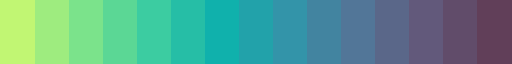

In [227]:
colors = ['#C1F673','#7BE38B','#3CCCA1','#11B1AC','#3394A9','#527698','#62597B','#613F59']

cmap1 = LinearSegmentedColormap.from_list("CR",colors, 15)
cmap1

# Soundings plot

In [2]:
def ll_to_index(lats, lons, latitude, longitude):
    slat = lats.ravel()
    slon = lons.ravel()
    loc = np.argmin(abs(slat-latitude) + abs(slon-longitude))
    xlen=np.shape(lats)[1]
    x = loc % xlen
    y = int(loc/xlen)
    return x,y

def get_box(buffer, lats, lons, latitude, longitude):
    ''' buffer should be index units which = km'''
    x,y = ll_to_index(lats, lons, latitude, longitude)
    return x-buffer, x+buffer, y-buffer, y+buffer


import cartopy.crs as crs
from cartopy.feature import NaturalEarthFeature
water = "#abc0c7"

states_provinces = NaturalEarthFeature( category='cultural', name='admin_1_states_provinces_lakes', scale='10m', facecolor='none')
lakes_50m        = NaturalEarthFeature('physical', 'lakes', '50m', edgecolor='face',facecolor=water)
rivers_50m       = NaturalEarthFeature('physical', 'rivers_lake_centerlines', '50m', facecolor='none', edgecolor='#86a5b0')
ocean_50m        = NaturalEarthFeature('physical', 'ocean', '50m', edgecolor='face', facecolor=water)
counties = pd.read_csv('/home/jessica.mcdonald/pythonscripts/USCOUNTIES.txt', skip_blank_lines=False)


import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

import linecache

def get_sounding(fname):

    names = ['z','theta', 'qv','u','v']
    
    df = pd.read_csv(fname,skiprows=1,header=None,
                    names=names,sep='\s+')
        
    z= df['z'].values*units.meter
    theta = df['theta'].values*units.kelvin
    qv = df['qv'].values*units.gram/units.kilogram
    u = df['u'].values*units.meters/units.seconds
    v = df['v'].values*units.meters/units.seconds
    
    # get values from the header - from MY CODE
    header_text = linecache.getline(fname,1)[:-1]
    split=header_text.split('\t')
    vals =[]
    for txt in split:
        vals.append(float(txt))
            
    sfc_p = vals[0]*units.hectopascal
    sfc_theta = vals[1]*units.kelvin
    sfc_qv = vals[2]*units.gram/units.kilogram
    
    # get pressure
    p = []
    for h in z:
        p.append(mpcalc.add_height_to_pressure(sfc_p, h).magnitude)
    p = p*units.hectopascal
    
    # calculate other variables
    T = mpcalc.temperature_from_potential_temperature(p, theta)
    rh = mpcalc.relative_humidity_from_mixing_ratio(p, T,qv)
    Td = mpcalc.dewpoint_from_relative_humidity(T, rh)

    return T, Td, p, u, v, z

In [214]:
%%time

files = {'5min':'/work2/wof/realtime/nature_run/15-03Z_5min/'}

files = {'1min':'/work2/wof/realtime/nature_run/20240508/18-21Z_1min/'}

ftype = '1min'
time = dt.datetime(2024, 5, 8, 20, 00) #1830-2230
ds = xr.open_dataset(files[ftype]+time.strftime('wrfnr_d01_%Y-%m-%d_%H_%M_00'))
lats, lons = ds.XLAT[0].values, ds.XLONG[0].values


# latitude = 37.5
# longitude = -94.0
# radius = 220

# latitude = 37
# longitude = -93.5
# radius=180

# latitude = 37
# longitude = -93.5
# radius=300


latitude = 37
longitude = -93.5
radius=400

x1,x2,y1,y2= get_box(radius, lats, lons, latitude, longitude)

sub = ds.sel(south_north=slice(y1,y2), west_east=slice(x1,x2), 
             south_north_stag=slice(y1, y2+1), west_east_stag=slice(x1,x2+1))

z_stag = ((sub.PH[0] + sub.PHB[0])/ 9.81) - sub.HGT[0]				#convert Geopotential to height MSL on staggered grid
height = 0.5 *(z_stag[:-1,:,:]+z_stag[1:,:,:]) 		#convert to centered grid
dz = z_stag[1:,:,:] - z_stag[:-1,:,:]

compref = sub.REFL_10CM[0].max(axis=0)
slat, slon = sub.XLAT[0].values, sub.XLONG[0].values

# # Get the cartopy mapping object
cart_proj = crs.LambertConformal(central_longitude=-97.0, central_latitude=37.7500114440918, standard_parallels=[30.0, 60.0])


# look at environment 
th =sub.T[0].values + 300 #note: in wrf python, T_BASE is added to pert theta, and it's defined as 300 k
p = (sub.P[0].values +sub.PB[0].values)/100 # hpa
qv= sub.QVAPOR[0].values #kg/kg

T = wofs.calc_t(th, p)-273.15 # C
vp = mpcalc.vapor_pressure(p*units('hPa'), qv*units('kg/kg'))
Td = mpcalc.dewpoint(vp).m #C

the = mpcalc.equivalent_potential_temperature(p*units('hPa'), T*units('degC'), Td*units('degC')).m #L

lcl_P, lcl_T = mpcalc.lcl(p[0]*units('hPa'), T[0]*units('degC'), Td[0]*units('degC')) #Hpa, C
t_parcel = wofs.calc_parcel_dj(p, the[0], T[0]+273.15, p[0])
CAPE = wofs.calc_cape(T+273.15, t_parcel, p, lcl_P.m, dz)
#CIN = wofs.calc_cin(T+273.15, t_parcel, p, lcl_P.m, dz)

# cape colormap
clist=[mpl.colors.to_rgba('#ffffff')]
clist.extend(list(cmaps.brwnyl(np.linspace(0,1,7))))
color_list = [mpl.colors.to_rgba('#ffffff')].extend(cmaps.matter(np.linspace(0,1,20)))
ucmap = LinearSegmentedColormap.from_list('c', clist, N=11)

CPU times: user 3.73 s, sys: 2.63 s, total: 6.36 s
Wall time: 6.39 s


In [5]:
nT, nTd, nP, nu, nv, nz = get_sounding(f'/work/jessica.mcdonald/scratch_link/extra_NR_500m_may8/input_sounding')

for i in range(1,37):
    #if i == 13:
    # if i % 6 == 0:
        
    #     c = colors[count]
    #     count+=1

    #fname = f'/home/jessica.mcdonald/LETKF_Nature_Run/run_soundings/Run{i:02d}Sounding.txt'
    fname = f'/work/jessica.mcdonald/CM1_LETKF_2025/run/soundings/Run{i:02d}Sounding.txt'
    T, Td, p, u, v, z = get_sounding(fname)

    if np.all(T[0:15] == nT[0:15] ) & np.all(nu[0:15] == u[0:15]):
        print(fname, 'is a match!!!')

/work/jessica.mcdonald/CM1_LETKF_2025/run/soundings/Run13Sounding.txt is a match!!!


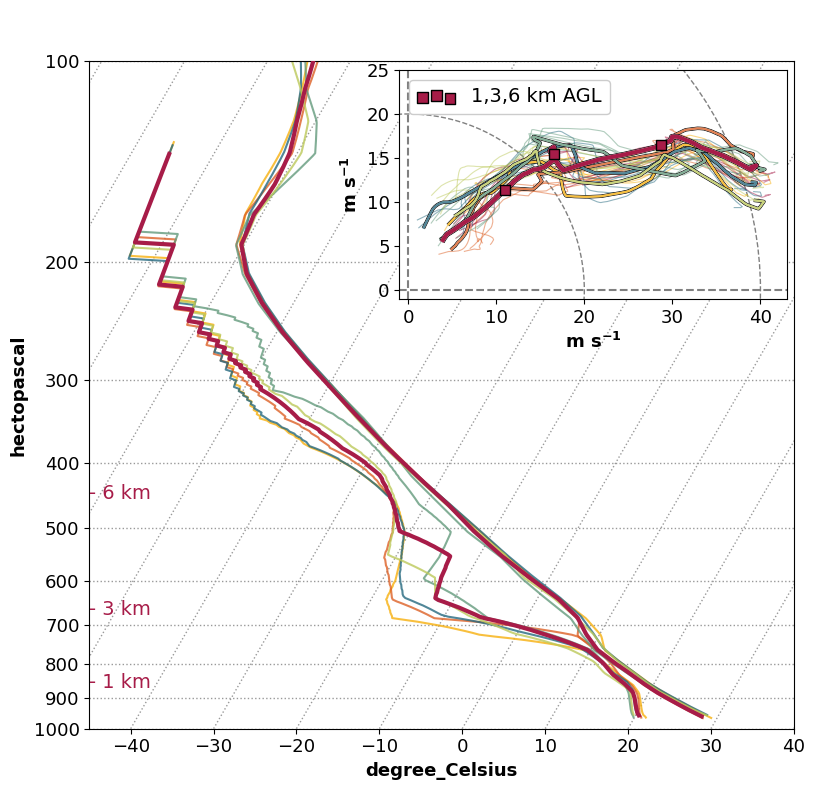

In [82]:
# set up skewT
fig=plt.figure(figsize=(20,10))

ax1 = fig.add_subplot(1,2,1)
rect = ax1.get_position().bounds
ax1.axis('off')
skew = SkewT(fig, rect=rect)

skew.ax.set_ylim(1000, 100)
skew.ax.set_xlim(-45,40)




    
colors=cmaps.pride(np.linspace(.2, .8, 6))#['C0', 'C1', 'C2', 'C3' ,'C4', 'C5']

colors = [colors[i] for i in [-3, -2, -1, 0, 1, 2, 3, 4]]



ax_hod = inset_axes(skew.ax, '55%', '60%',  bbox_to_anchor=(0, 0, 1, 1.18),
                      bbox_transform=skew.ax.transAxes)
h = Hodograph(ax_hod, component_range=80.)
h.add_grid(increment=20)
h.ax.set_xlim(-1,43)
h.ax.set_ylim(-1,25)
h.ax.set_xlabel(r'm s$\mathbf{^{-1}}$')
h.ax.set_ylabel(r'm s$\mathbf{^{-1}}$')

count = 0

for i in range(1,37):

    if (i-1) % 6 == 0: c = colors[count]; count+=1

    fname = f'/work/jessica.mcdonald/CM1_LETKF_2025/run/soundings/Run{i:02d}Sounding.txt'
    #print(fname)
    T, Td, p, u, v, z = get_sounding(fname)
    z12 = findnearest(z.m, 12000)

    

    if (i-1) % 6 == 0:

        skew.ax.plot(T,p,          color=c, alpha=0.8, linewidth=2-.5)
        skew.ax.plot(Td,p,         color=c, alpha=0.8, linewidth=2-.5)
        
        h.ax.plot(u[:z12],v[:z12], color='k', alpha=1, linewidth=3-.5, zorder=300)
        h.ax.plot(u[:z12],v[:z12], color='w', alpha=1, linewidth=2-.5, zorder=300)
        h.ax.plot(u[:z12],v[:z12], color=c, alpha=.8, linewidth=2-.5, zorder=300)
     
    h.ax.plot(u[:z12],v[:z12], color=c, alpha=0.5, linewidth=0.8)

    if i == 13:

        z1, z3, z6 = findnearest(z.m, 1000),findnearest(z.m, 3000),findnearest(z.m, 6000)
        
        skew.ax.plot(T,p,          color=c, alpha=1, linewidth=3, zorder=300)
        skew.ax.plot(Td,p,         color=c, alpha=1, linewidth=3, zorder=300)

        h.ax.plot(u[:z12],v[:z12], color='k', alpha=1, linewidth=4, zorder=400)
        h.ax.plot(u[:z12],v[:z12], color='w', alpha=1, linewidth=3, zorder=400)
        
        h.ax.plot(u[:z12],v[:z12], color=c, alpha=1, linewidth=3, zorder=400)
        h.ax.scatter([u[z1],u[z3],u[z6]],[v[z1],v[z3],v[z6]], marker='s', zorder=401, color=c, edgecolor='k', s=60, label='1,3,6 km AGL')


        # heights
        for hi in [1000,3000,6000]:
            hz = findnearest(z.m, hi)
            height = int(hi/1000)
            pres   = p[hz]
            trans, _, _ = skew.ax.get_yaxis_text1_transform(0);
            skew.ax.text(0.0, pres, '- {} km'.format( height),
                         transform=trans, color=c, fontsize=14, va='center');

h.ax.legend(loc=2, scatterpoints=3, fontsize=14, markerscale=1)

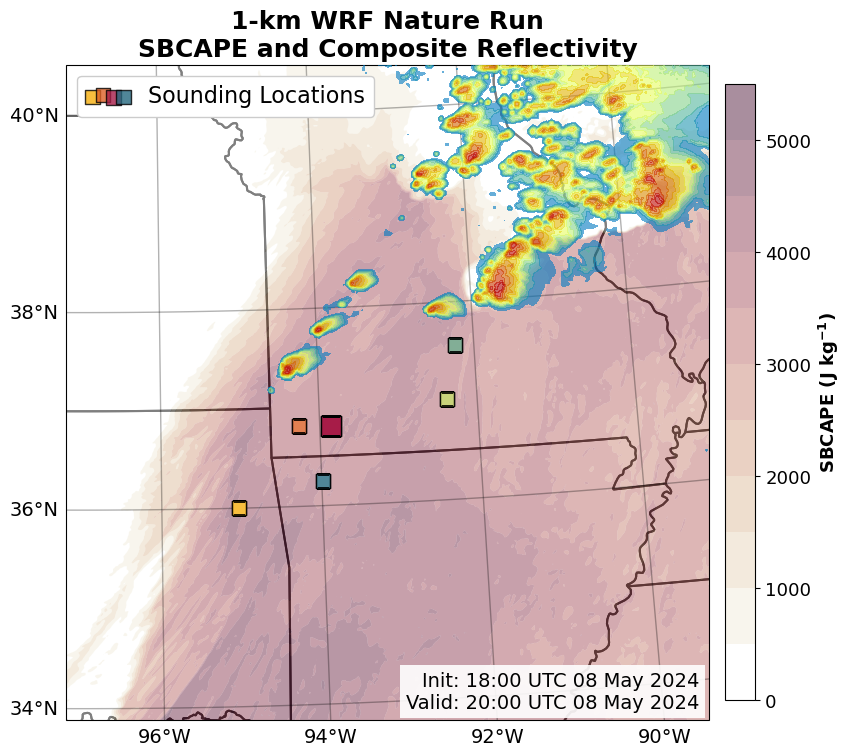

In [138]:
# Create a figure
fig = plt.figure(figsize=(10,10))
ax2 = plt.axes(projection=cart_proj)
ax2.add_feature(states_provinces, edgecolor='k', alpha=1.0, linewidth=1.5,zorder=1)#, zorder=31)
ax2.set_extent([slon.min()+1,slon.max()-1, slat.min()+.8,slat.max()-0.5], crs = crs.PlateCarree())

#quickCAPE = np.where(CAPE <500, np.nan, CAPE)
im=ax2.contourf(slon,slat, CAPE, levels=np.arange(0, 6000,500), cmap=ucmap, alpha=0.5, transform=crs.PlateCarree(), antialiased = True)
im2 = ax2.contourf(slon,slat, compref, np.arange(5, 75, 5), cmap =ctables.REF_default,transform=crs.PlateCarree(), zorder=300, alpha=1)


# Add a color bar
plt.colorbar(im,ax=ax2, shrink=.8, pad=0.02,label=r'SBCAPE (J kg$\mathbf{^{-1}}$)', extend='max')# label='Composite Reflectivity (dBZ)')

# Add the gridlines
ax2.gridlines(draw_labels=['left', 'bottom'], auto_inline=False, rotate_labels=False, color="k", linestyle="solid", alpha=0.3, linewidth=1,
            xlabel_style={'size':14},ylabel_style={'size':14}, xlocs=[-98, -96, -94, -92, -90], ylocs=[34, 36, 38, 40])


# plot sounding locations - 3rd location (2nd in indexing) is the nature run sounding location
sound_lons = [-95.04465,-94.2605,-93.85828,-93.98767,-92.235565,-92.38037]
sound_lats = [35.99853,36.808258,36.79642,36.24793,37.563087,37.015755]


for plot_count, (yi, xi) in enumerate(zip(sound_lats, sound_lons)):
    alpha=0.8;size=150-40
    if plot_count==2: alpha=1; size=240-50
    ax2.scatter(xi,yi,transform=crs.PlateCarree(), color='w', edgecolor='k', linewidth=1, s=size, marker='s', zorder=399)
    ax2.scatter(xi,yi,transform=crs.PlateCarree(), color=colors[plot_count], alpha=alpha, edgecolor='k', linewidth=1, s=size, marker='s', zorder=400, label='Sounding Locations')
    # if plot_count == 0:
    #     ax2.text(xi+.2, yi-0.21, 'Sounding Locations', weight='bold', fontsize=16,transform=crs.PlateCarree(),
    #              path_effects =[path_effects.Stroke(linewidth=3, foreground='white'),path_effects.Normal()])
  

#print(count)
fig.canvas.draw()
left, bottom, width, height = ax2.get_position().bounds


time_str = f'Init: { dt.datetime.strptime(ds.START_DATE, "%Y-%m-%d_%H:%M:%S").strftime("%H:%M UTC %d %b %Y") }\nValid: {time.strftime("%H:%M UTC %d %b %Y")}'
ax2.text(left+width-.01, bottom+.008, time_str, fontsize=14, weight='normal', ha='right', va='bottom', transform=fig.transFigure, bbox=dict(facecolor='white', alpha=0.9, edgecolor='none'))


ax2.set_title('1-km WRF Nature Run\nSBCAPE and Composite Reflectivity')#, ha='left',va='bottom', x=left, y=bottom+height+0, weight='bold', fontsize=18)


handles, labels =ax2.get_legend_handles_labels()
leg = ax2.legend([handles[0]],[ labels[0]], loc=2,scatterpoints=4, fontsize=16, markerscale=1)
leg.legend_handles[0].set_facecolors(colors)
plt.show()


In [128]:
lab

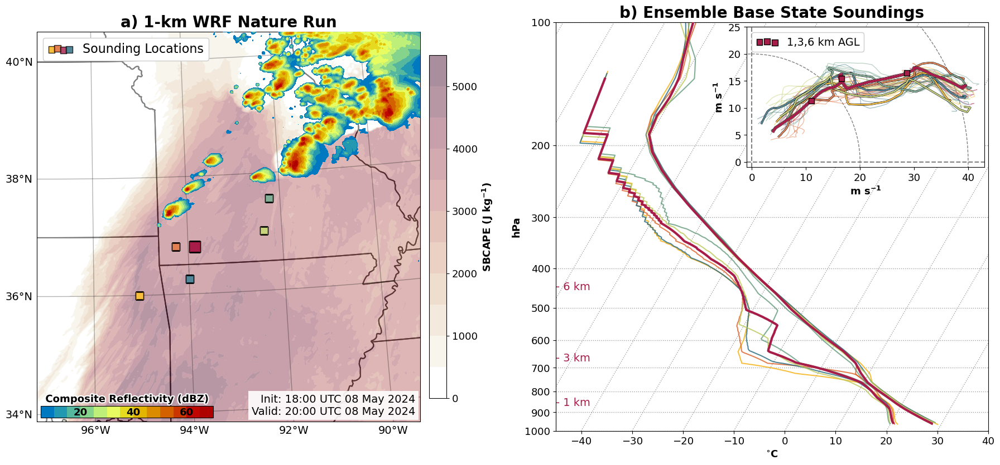

In [230]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Create the figure
fig = plt.figure(figsize=(22, 10))

# Left subplot: normal Matplotlib axes
ax2 = fig.add_subplot(1, 2, 1, projection=cart_proj)
ax1 = fig.add_subplot(1, 2, 2)


#################################################

rect = ax1.get_position().bounds
ax1.axis('off')
skew = SkewT(fig, rect=rect)

skew.ax.set_ylim(1000, 100)
skew.ax.set_xlim(-45,40)
skew.ax.set_ylabel('hPa', weight='bold')
skew.ax.set_xlabel(r'$\mathbf{^{\circ}}$C', weight='bold')
    
colors=cmaps.pride(np.linspace(.2, .8, 6))
colors = [colors[i] for i in [-3, -2, -1, 0, 1, 2, 3, 4]]

ax_hod = inset_axes(skew.ax, '55%', '60%',  bbox_to_anchor=(0, 0, 1, 1.18),
                      bbox_transform=skew.ax.transAxes)
h = Hodograph(ax_hod, component_range=80.)
h.add_grid(increment=20)
h.ax.set_xlim(-1,43)
h.ax.set_ylim(-1,25)
h.ax.set_xlabel(r'm s$\mathbf{^{-1}}$')
h.ax.set_ylabel(r'm s$\mathbf{^{-1}}$')

count = 0

for i in range(1,37):

    if (i-1) % 6 == 0: c = colors[count]; count+=1

    fname = f'/work/jessica.mcdonald/CM1_LETKF_2025/run/soundings/Run{i:02d}Sounding.txt'
    T, Td, p, u, v, z = get_sounding(fname)
    z12 = findnearest(z.m, 12000)

    if (i-1) % 6 == 0:

        skew.ax.plot(T,p,          color=c, alpha=0.8, linewidth=2-.5)
        skew.ax.plot(Td,p,         color=c, alpha=0.8, linewidth=2-.5)
        
        h.ax.plot(u[:z12],v[:z12], color='k', alpha=1, linewidth=3-.5, zorder=300)
        h.ax.plot(u[:z12],v[:z12], color='w', alpha=1, linewidth=2-.5, zorder=300)
        h.ax.plot(u[:z12],v[:z12], color=c, alpha=.8, linewidth=2-.5, zorder=300)
     
    h.ax.plot(u[:z12],v[:z12], color=c, alpha=0.5, linewidth=0.8)

    if i == 13:

        z1, z3, z6 = findnearest(z.m, 1000),findnearest(z.m, 3000),findnearest(z.m, 6000)
        
        skew.ax.plot(T,p,          color=c, alpha=1, linewidth=3, zorder=300)
        skew.ax.plot(Td,p,         color=c, alpha=1, linewidth=3, zorder=300)

        h.ax.plot(u[:z12],v[:z12], color='k', alpha=1, linewidth=4, zorder=400)
        h.ax.plot(u[:z12],v[:z12], color='w', alpha=1, linewidth=3, zorder=400)
        
        h.ax.plot(u[:z12],v[:z12], color=c, alpha=1, linewidth=3, zorder=400)
        h.ax.scatter([u[z1],u[z3],u[z6]],[v[z1],v[z3],v[z6]], marker='s', zorder=401, color=c, edgecolor='k', s=60, label='1,3,6 km AGL')


        # heights
        for hi in [1000,3000,6000]:
            hz = findnearest(z.m, hi)
            height = int(hi/1000)
            pres   = p[hz]
            trans, _, _ = skew.ax.get_yaxis_text1_transform(0);
            skew.ax.text(0.0, pres, '- {} km'.format( height),
                         transform=trans, color=c, fontsize=14, va='center');

h.ax.legend(loc=2, scatterpoints=3, fontsize=14, markerscale=1)
skew.ax.set_title('b) Ensemble Base State Soundings', fontsize=20)

#################################################


ax2.add_feature(states_provinces, edgecolor='k', alpha=1.0, linewidth=1.5,zorder=1)#, zorder=31)
ax2.set_extent([slon.min()+1,slon.max()-1, slat.min()+.8,slat.max()-0.5], crs = crs.PlateCarree())

# #quickCAPE = np.where(CAPE <500, np.nan, CAPE)
im=ax2.contourf(slon,slat, CAPE, levels=np.arange(0, 6000,500), cmap=ucmap, alpha=0.5, transform=crs.PlateCarree(), antialiased = True)
im2 = ax2.contourf(slon,slat, compref, np.arange(5, 75, 5), cmap =ctables.REF_default,transform=crs.PlateCarree(), zorder=3, alpha=1)


# Add a color bar
plt.colorbar(im,ax=ax2, shrink=.8, pad=0.02,label=r'SBCAPE (J kg$\mathbf{^{-1}}$)', extend='max')# label='Composite Reflectivity (dBZ)')

# Add the gridlines
ax2.gridlines(draw_labels=['left', 'bottom'], auto_inline=False, rotate_labels=False, color="k", linestyle="solid", alpha=0.3, linewidth=1,
            xlabel_style={'size':14},ylabel_style={'size':14}, xlocs=[-98, -96, -94, -92, -90], ylocs=[34, 36, 38, 40])


# plot sounding locations - 3rd location (2nd in indexing) is the nature run sounding location
sound_lons = [-95.04465,-94.2605,-93.85828,-93.98767,-92.235565,-92.38037]
sound_lats = [35.99853,36.808258,36.79642,36.24793,37.563087,37.015755]


for plot_count, (yi, xi) in enumerate(zip(sound_lats, sound_lons)):
    alpha=0.8;size=150-40
    if plot_count==2: alpha=1; size=240-50
    ax2.scatter(xi,yi,transform=crs.PlateCarree(), color='w', edgecolor='k', linewidth=1, s=size, marker='s', zorder=399)
    ax2.scatter(xi,yi,transform=crs.PlateCarree(), color=colors[plot_count], alpha=alpha, edgecolor='k', linewidth=1, s=size, marker='s', zorder=400, label='Sounding Locations')

plt.subplots_adjust(wspace=.06)
fig.canvas.draw()
left, bottom, width, height = ax2.get_position().bounds

time_str = f'Init: { dt.datetime.strptime(ds.START_DATE, "%Y-%m-%d_%H:%M:%S").strftime("%H:%M UTC %d %b %Y") }\nValid: {time.strftime("%H:%M UTC %d %b %Y")}'
ax2.text(left+width-.004, bottom+.008, time_str, fontsize=14, weight='normal', ha='right', va='bottom', transform=fig.transFigure, bbox=dict(facecolor='white', alpha=0.9, edgecolor='none'))

handles, labels =ax2.get_legend_handles_labels()
leg = ax2.legend([handles[0]],[ labels[0]], loc=2,scatterpoints=4, fontsize=16, markerscale=.8)
leg.legend_handles[0].set_facecolors(colors)
ax2.set_title('a) 1-km WRF Nature Run', fontsize=20)


axin2 = ax2.inset_axes([0.01, 0.01, 0.45, 0.03])
cb=plt.colorbar(im2, cax=axin2, orientation='horizontal', label= 'Composite Reflectivity (dBZ)', ticks=[ 20, 40, 60])
cax = cb.ax
#axin2.axis('off')
cax.set_xlabel('Composite Reflectivity (dBZ)', labelpad=-30, fontsize=13, path_effects =[path_effects.Stroke(linewidth=3, foreground='white'),path_effects.Normal()])
#cax.xaxis.set_ticks_position('top')
#cax.set_xticklabels([ 20, 40, 60],labelpad=-10)

cb.ax.xaxis.set_ticks_position("bottom")
cb.ax.tick_params(axis="x", direction="in", length=0,pad=-13, colors="k")
for label in cb.ax.get_xticklabels():
    label.set_fontweight("bold")


for spine in ax.spines.values():
    spine.set_zorder(500)

FIGNAME = 'BaseStateSoundings'
plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG_{FIGNAME}.png', dpi=300, bbox_inches='tight')


# Nature Run Plot

In [29]:
def top_colorbar(ax, c, label, ticks=[]):
    pos=ax.get_position()

    cbar_left   = pos.x0 +.008
    cbar_bottom = pos.y1 + 0.008       # slightly above the axes
    cbar_width  = (pos.x1 - pos.x0) - 0.008*2 # span full width of both
    cbar_height = 0.008  
    cax = fig.add_axes([cbar_left, cbar_bottom, cbar_width, cbar_height])
    cbar =plt.colorbar(c, ax=ax, cax=cax,orientation='horizontal')
    cbar.set_label(label, labelpad=10, fontsize=16)
    cbar.ax.xaxis.set_ticks_position("top")
    cbar.ax.xaxis.set_label_position("top")
    if len(ticks)>0:
        cbar.set_ticks(ticks)
        cbar.set_ticklabels(ticks, fontsize=16)

def plot_radar(ax, rx, ry):

    ax.scatter(rx,ry, color='k', marker='P', s=100)# label=f'Radar Location (X={rx} km, Y={ry} km)',

    for r in [20,60,100]:
        ax.add_patch(plt.Circle((rx,ry), r, fill=False, edgecolor='k', alpha=0.2))


ds = xr.open_dataset('/scratch/home/jessica.mcdonald/extra_NR_500m_may8/Full_Verification_variables.nc')
xh,yh = np.meshgrid(ds.xh, ds.yh)

myds = xr.open_dataset(f'/work/jessica.mcdonald/NR_radar_obs/5km_superobs_multi.nc')
xhr, yhr = np.meshgrid((myds.xh+160000.0)/1000,( myds.yh+115000.0)/1000)

t =109
time = 90 # minutes

ti = time-11

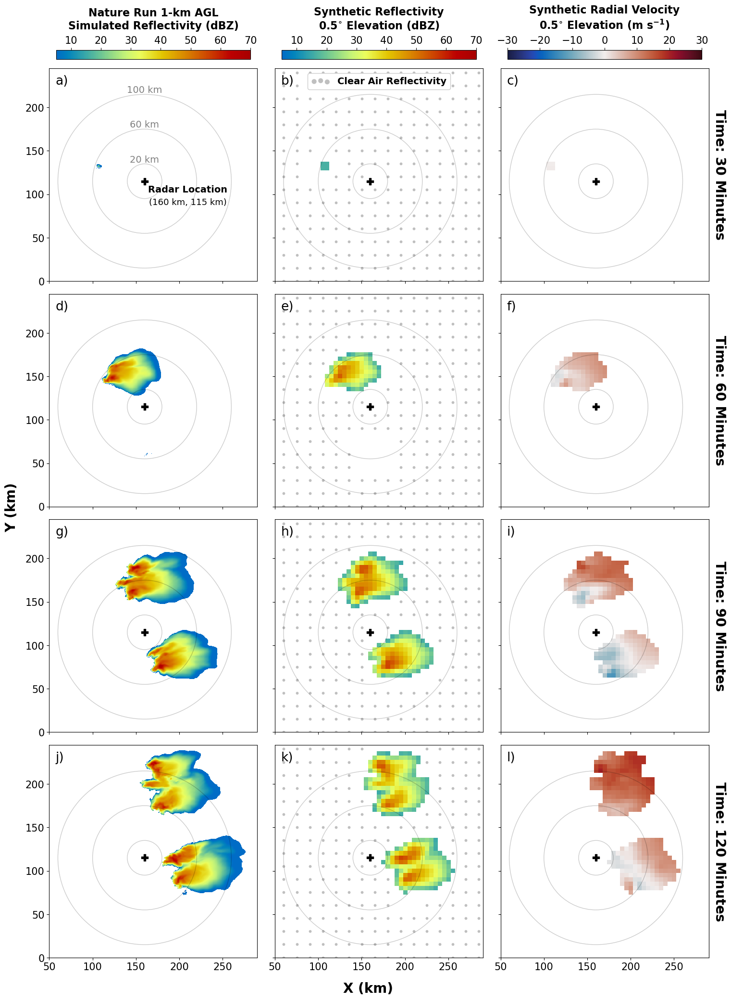

In [39]:
mpl.rcParams.update({'ytick.labelsize':15, 'xtick.labelsize':15})

fig, axes = plt.subplots(4,3, sharex=True, sharey=True, subplot_kw={'aspect':'equal'}, figsize=(18, 24))
plt.subplots_adjust(hspace = 0.06, wspace=0.03)

for i,time in enumerate([30, 60, 90, 120]):
    t = time-10
    cref = np.where(ds.dbz[t,findnearest(ds.zh, 1),:,:] == 0, np.nan, ds.dbz[t,0,:,:])
    #cref = np.where(ds.dbz[t, :].max(axis=0) == 0, np.nan, ds.dbz[t, :].max(axis=0))
    
    dbz = axes[i,0].pcolormesh(xh, yh, cref, vmin=5, vmax=70, cmap=ctables.REF_default)

    ref = np.where(myds.REF[t, 0]== 0 , np.nan, myds.REF[t, 0])
    #ref = np.where(myds.REF[t, :].max(axis=0)== 0 , np.nan, myds.REF[t, :].max(axis=0))
    sdbz=axes[i,1].pcolormesh(xhr, yhr, ref, vmin=5, vmax=70, cmap=ctables.REF_default)
    
    ref0 = myds.REF0[t,0,:,:].values#.flatten()
    mask = (np.isnan(ref0)==False)
    rx = xhr[mask]
    ry = yhr[mask]
    s1 = axes[i,1].scatter(rx,ry,  s=10, marker='o',facecolor='0.75', label='Clear Air Reflectivity')
    
    
    svr = axes[i,2].pcolormesh(xhr, yhr, myds.VR[t, 0], vmin=-30, vmax=30, cmap=cmaps.balance)

    axes[i,2].text(1.02, 0.5, f'Time: {time} Minutes', rotation=-90, ha='left', va='center', transform=axes[i,2].transAxes, fontsize=20, weight='bold')

for ax in axes.flatten():
    plot_radar(ax, 160, 115)
    ax.set_ylim(0, 245)
    ax.set_xlim(50, 290)

axes[0,0].text(164, 111, 'Radar Location', weight='bold', va='top', fontsize=14)
axes[0,0].text(164+1 ,111-15, '(160 km, 115 km)', va='top', fontsize=13)
for r in [20, 60, 100]:
    axes[0,0].text(160, 115+r+2, f'{r} km', color='k', alpha=0.5, fontsize=14, ha='center')

axes[0,1].legend(fontsize=14, loc='upper center', markerscale=2, scatterpoints=3, prop={'weight': 'bold', 'size':14})

top_colorbar(axes[0,0], dbz, 'Nature Run 1-km AGL\nSimulated Reflectivity (dBZ)')
top_colorbar(axes[0,1], sdbz, 'Synthetic Reflectivity\n0.5'+r'$\mathbf{^{\circ}}$ Elevation (dBZ)')
top_colorbar(axes[0,2], svr, 'Synthetic Radial Velocity\n0.5'+r'$\mathbf{^{\circ}}$ Elevation (m s$\mathbf{^{-1}}$)')


fig.text(0.5, .08, 'X (km)', weight='bold', fontsize=20, ha='center');
fig.text(0.08, .5, 'Y (km)', weight='bold', fontsize=20, va='center', rotation=90);

for i,ax in enumerate(axes.flatten()):
    ax.text(0.03, 0.97,  chr(ord('`')+i+1)+')', va='top', fontsize=19, transform=ax.transAxes )

plt.draw()
mpl.rcParams.update({'ytick.labelsize':13, 'xtick.labelsize':13})

# FIGNAME = 'SyntheticRadar'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG_{FIGNAME}.png', dpi=300, bbox_inches='tight')

# Nature Run Processing

In [2]:
ds = xr.open_dataset('/work/jessica.mcdonald/scratch_link/extra_NR_500m_may8/Full_Verification_variables.nc')

zi = findnearest(ds.zh,1)
ti = 140

x,y,z = ds.xh.values, ds.yh.values, ds.zh
w = ds['wa'][ti,zi,:,:].values
dbz = ds['dbz'][ti,zi,:,:].values

print(ds.dates[ti].values)


ds = xr.open_dataset('/work/jessica.mcdonald/scratch_link/extra_NR_500m_may8/Processed_VerificationVars.nc')
zi = findnearest(ds.zh,1)
#ti = 140
print(ds.dates[ti].values)

xg,yg,zg = ds.xh.values, ds.yh.values,ds.zh.values

filtered_regridded_w = ds['wa'][ti,zi,:,:].values
filtered_regridded_dbz = ds['dbz'][ti,zi,:,:].values
#filtered_regridded_UH= ds['UH2-5km'][ti,:,:].values


dx_NR = 500
dx_filter = 3000 # this is the scale that everything smaller than will be filtered out
dx = int(dx_filter/dx_NR)
response_amp = 0.02
npass=1

eps = RaymondFilters.inverseRaymondResponse(response_amp, dx, npass=npass)
print(eps)

filtered_w = RaymondFilters.RaymondFilter6F(w.T, eps, npass=npass)
filtered_dbz = RaymondFilters.RaymondFilter6F(dbz.T, eps, npass=npass)

mem = 6
ens = xr.open_dataset(f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C03_H09_V4/member{mem:03d}/cm1rst_000038.nc', decode_timedelta=False) #15 19 31
ens_w = ens.wa[0, findnearest(ens.zf, 1000),:,:].values

ens_dbz = ens.dbz[0, findnearest(ens.zf, 1000),:,:].values
print(dt.datetime(2024,5,8,19,30) + dt.timedelta(minutes =int(ens.time.values[0]/60 )))

xi,yi = np.meshgrid(x, y)

finterp = scipy.interpolate.RegularGridInterpolator((ens.yh.values/1000, ens.xh.values/1000), ens_w, bounds_error=False) #give it the filtered 500 m data
temp = np.transpose(finterp((yi.flatten(),xi.flatten())).reshape((len(y), len(x)), order='F'))#, axes=[0,2,1])

dinterp = scipy.interpolate.RegularGridInterpolator((ens.yh.values/1000, ens.xh.values/1000), ens_dbz, bounds_error=False) #give it the filtered 500 m data
tempdbz = np.transpose(dinterp((yi.flatten(),xi.flatten())).reshape((len(y), len(x)), order='F'))#, axes=[0,2,1])
    

2024-05-08T22:00:00.000000000
2024-05-08T22:00:00.000000000
1323.0000000000007
NPass Loop for 2D array took 0.0286 seconds

NPass Loop for 2D array took 0.0296 seconds

2024-05-08 22:00:00


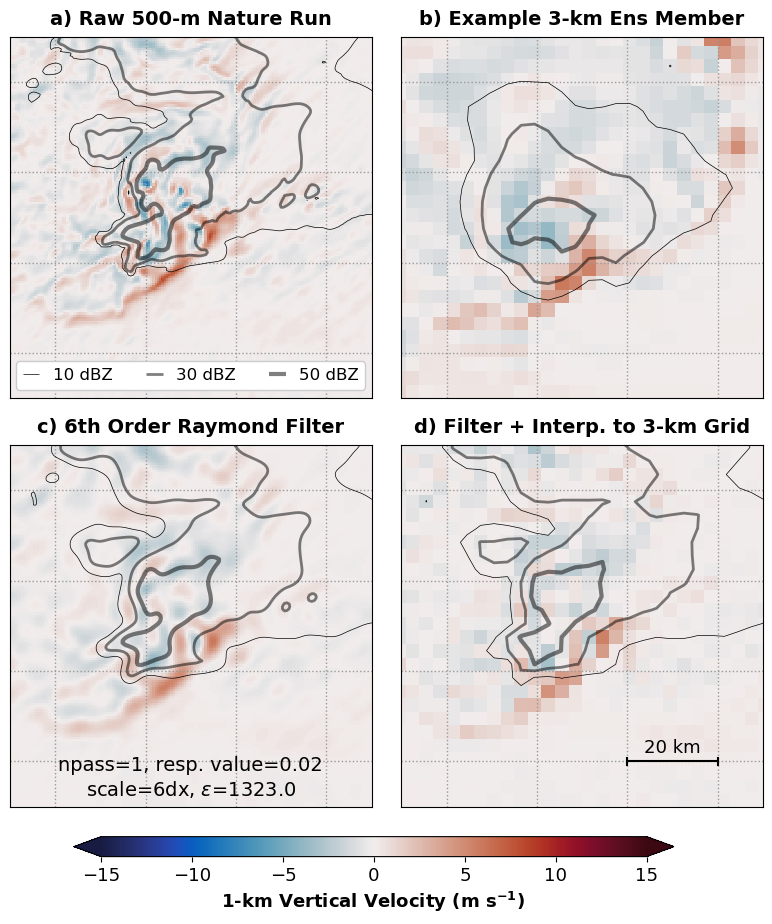

In [4]:

def plot_dbz(ax,x,y, dbz):

    ax.contour(x,y,dbz,  levels=[10], colors='k', linewidths=0.5)
    ax.contour(x,y,dbz,  levels=[30], colors='k', linewidths=2, alpha=0.5)
    ax.contour(x,y,dbz,  levels=[50], colors='k', linewidths=3, alpha=0.5)

    
fig, axes = plt.subplots(2,2, figsize=(10,10), sharex=True, sharey=True, subplot_kw={'aspect':'equal'})

ref_levs = [10, 30, 50]

for ax, var, var2 in zip([axes[0,0], axes[1,0]], [w, filtered_w], [dbz, filtered_dbz]):

    im=ax.pcolormesh(x,y,var,  vmin=-15, vmax=15,cmap=cmaps.balance)
    plot_dbz(ax, x, y, var2)

    ax.set_xticks(np.arange(110,300,20))
    ax.set_yticks(np.arange(10,300,20))

    ax.set_xlim(200,280)
    ax.set_ylim(60,140)

axes[0,1].pcolormesh(xg,yg,ens_w,  vmin=-10, vmax=10,cmap=cmaps.balance)
plot_dbz(axes[0,1], xg,yg,ens_dbz)

axes[1,1].pcolormesh(xg,yg,filtered_regridded_w,  vmin=-15, vmax=15,cmap=cmaps.balance)
plot_dbz(axes[1,1], xg,yg,filtered_regridded_dbz)



axes[0,0].set_title(f'a) Raw 500-m Nature Run', fontsize=14, weight='bold', y=1.01)
axes[0,1].set_title(f'b) Example 3-km Ens Member', fontsize=14, weight='bold', y=1.01)
axes[1,0].set_title(f'c) 6th Order Raymond Filter', fontsize=14, weight='bold', y=1.01);
axes[1,1].set_title(f'd) Filter + Interp. to 3-km Grid', fontsize=14, weight='bold', y=1.01);


txt = r'$\epsilon$'
axes[1,0].text(0.5, 0.02, f'npass={npass}, resp. value={response_amp}\nscale={dx}dx, {txt}={eps:.1f}', fontsize=14, ha='center', va='bottom', transform=axes[1,0].transAxes)

add_scale(axes[1,1], xstart=250, xlength=20, y= 70, cap_length=2)


for ax in axes.flatten():
    ax.tick_params(axis='both',  which='both', length=0,labelbottom=False,labelleft=False)
    ax.grid()

plt.subplots_adjust(wspace=0.02, hspace=.13)   

l10 = mpl.lines.Line2D([0], [0], label='10 dBZ', color='k',  linewidth=0.5)
l30 = mpl.lines.Line2D([0], [0], label='30 dBZ', color='k',  linewidth=2, alpha=0.5)
l50 = mpl.lines.Line2D([0], [0], label='50 dBZ', color='k',  linewidth=3, alpha=0.5)
axes[0,0].legend(handles=[l10,l30,l50], labels=['10 dBZ', '30 dBZ', '50 dBZ'], ncols=3, loc='lower center', handlelength=1, fontsize=12)

#cbar_ax = fig.add_axes([0.92, 0.2, 0.015, 0.6])
cbar_ax = fig.add_axes([0.2, 0.06, .6, 0.02])
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal', extend='both')
cbar.set_label(r"1-km Vertical Velocity (m s$\mathbf{{^{-1}}}$) ", weight='bold')
#plt.show()

FIGNAME = 'NatureRunFiltering'
plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG_{FIGNAME}.png', dpi=300, bbox_inches='tight')


# Cold Pool Plot

C15_H18_V4
C10_H18_V4
C03_H18_V4
C03_H09_V2


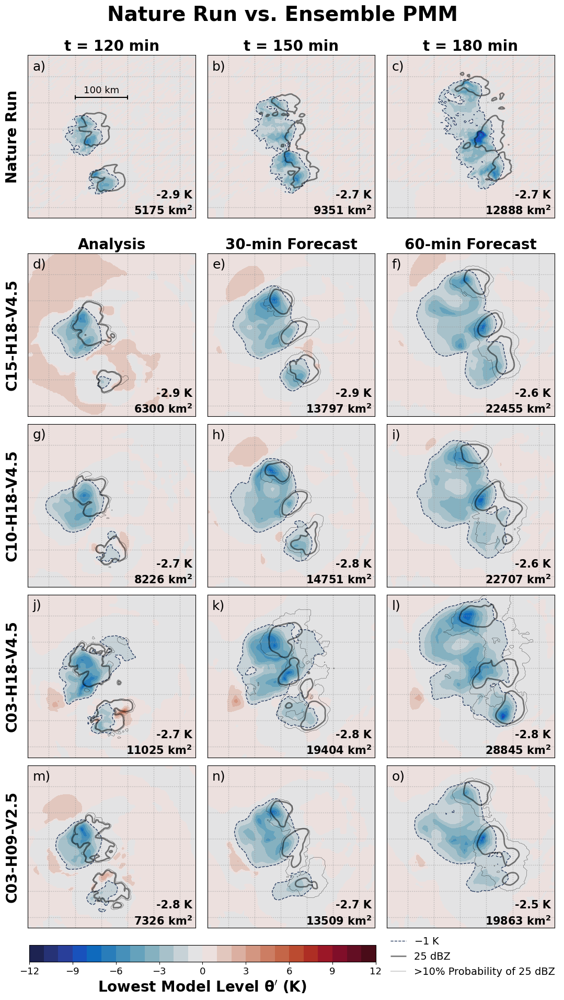

In [22]:
##############################################################################



exps = [f'C{h:02d}_H18_V4' for h in [15,10,3]]+['C03_H09_V2']#['Control']
version = 'CI'
#version='H'

#exps = ['C03_H18_V6', 'C03_H12_V4','C03_H09_V2']
version = 'Fullx'


# exps = ['C03_H09_V2','C03_H09_V2_noAI','C03_H18_V2','C03_H18_V2_noAI']
# version='fullx'

# exps = ['C03_H09_V2_fine']+[f'C{h:02d}_H09_V2' for h in [3,1,10]]
# version = 'fullx'


##############################################################################

if len(exps)==6:
    fig, axes = plt.subplots(7,3, figsize=(12, 23), sharex=True, sharey=True, subplot_kw={'aspect':'equal'})
    
if len(exps)==5:
    fig, axes = plt.subplots(6,3, figsize=(12, 23), sharex=True, sharey=True, subplot_kw={'aspect':'equal'})
if len(exps)==4:
    fig, axes = plt.subplots(5,3, figsize=(13, 21), sharex=True, sharey=True, subplot_kw={'aspect':'equal'})
if len(exps)==3:
    fig, axes = plt.subplots(4,3, figsize=(13, 16.5), sharex=True, sharey=True, subplot_kw={'aspect':'equal'})#, facecolor='none')
if len(exps)==2:
    fig, axes = plt.subplots(3,3, figsize=(13, 13), sharex=True, sharey=True, subplot_kw={'aspect':'equal'})


# get info for nature run
with open(f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exps[0]}/letkf.exp', 'rb') as f: exper = json.load(f)
start = dt.datetime.strptime(exper['date_time'], '%Y-%m-%d %H:%M:%S')
fcst_start = dt.datetime.strptime(exper['DA_PARAMS']['DA_end_time'], '%Y-%m-%d %H:%M:%S')

fcst_lens = [0,30,60]

times = [fcst_start + dt.timedelta(minutes=tt) for tt in fcst_lens]

# read in nature run 

NR = xr.open_dataset(f'/scratch/home/jessica.mcdonald/extra_NR_500m_may8/Processed_VerificationVars.nc', decode_timedelta=True)
NRdates = [pd.to_datetime(NRt) for NRt in NR.dates.values]

for ni, exp in enumerate(exps):
    print(exp)

    
    #fpath = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp}/FORECAST*/full_ens_fcst.nc")[0]
    fpath = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp}/full_ens_fcst.nc")[0]
    cm1 = xr.open_dataset(fpath, decode_timedelta=True)
    
    cm1t = [pd.Timestamp(t) for t in cm1.time.values]
    xh, yh, z, ensN = cm1.xh.values, cm1.yh.values, cm1.z.values, int(cm1.ne.max()) 
    dx = np.mean(xh[1:]-xh[:-1])

    
    # name of experiment
    axes[ni+1, 0].set_ylabel(rename(exp, version=version), fontsize=20)

    for ti,time in enumerate(times):
        
        cti = findnearest(cm1t, time)
        ens_pmm = pmm(cm1, 'th', 0, cti)
        thp = (ens_pmm - ens_pmm[:,-1].mean())
    
        axes[ ni+1, ti].contourf(xh, yh, thp,  cmap=cmaps.balance, levels=np.arange(-12, 12.1, 1))
        tim = axes[ ni+1, ti].contour(xh, yh, thp, colors='#25395e',linestyles='--', levels=[-1], linewidths=1)


        #now add probability of prcip
        probs = raw_probs(cm1['dbz'][cti, :-1,0].values, 25, ensN)
        pim = axes[ ni+1, ti].contour(xh, yh, probs*100,  colors='k',linewidths=0.25, levels=[10])

        dbz_pmm = pmm(cm1, 'dbz', 0, cti)
        dim = axes[ ni+1 ,ti].contour(xh, yh, dbz_pmm, colors='k', levels=[25], linewidths=2, alpha=0.5)

        # cold pool stats
        mean_temp = np.mean(thp[thp <= -1])
        cp_size = np.count_nonzero(thp <= -1)*(dx*dx)

        axes[ ni+1, ti].text(0.98, 0.02, f"{cp_size:.0f} km"+r'$\mathbf{^2}$', ha='right',fontsize=15, weight='bold', transform=axes[ ni+1, ti].transAxes)
        axes[ ni+1, ti].text(0.98, 0.12, f"{mean_temp:.1f} K", ha='right',fontsize=15, weight='bold', transform=axes[ ni+1, ti].transAxes)


        #axes[ ni+1, ti].text(0.98, 0.98, f"{tname[ti]}", ha='right', va='top',fontsize=15, weight='bold', transform=axes[ ni+1, ti].transAxes)

        
        fcst_len = int((time - fcst_start).seconds/60)
        if ni == 0:
            axes[ni+1, ti].set_title(f'{fcst_len}-min Forecast', weight='bold', fontsize=20)
        axes[1, 0].set_title(f'Analysis', weight='bold', fontsize=20)
            
        cm1.close()

for ti,time in enumerate(times):

    thp = NR.th[findnearest(NRdates, time),0].values -  NR.th[findnearest(NRdates, time),0,:,-1].values.mean(axis=0)

    xh, yh = NR.xh, NR.yh
    
    im=axes[0, ti].contourf(xh, yh, thp,  cmap=cmaps.balance, levels=np.arange(-12, 12.1, 1))
    axes[0, ti].contour(xh, yh, thp, colors='#25395e',linestyles='--', levels=[ -1], linewidths=1)
   
    mean_temp = np.mean(thp[thp <= -1])
    cp_size = np.count_nonzero(thp <= -1)*(3*3)#(.5*.5)
    
    axes[0, ti].text(0.98, 0.12, f"{mean_temp:.1f} K", ha='right',fontsize=15, weight='bold', transform=axes[ 0, ti].transAxes)
    axes[0, ti].text(0.98, 0.02,f"{cp_size:.0f} km"+r'$\mathbf{^2}$', ha='right',fontsize=15, weight='bold', transform=axes[ 0, ti].transAxes)
   
    NR.close()

    ptime = int((pd.to_datetime(time) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60)

    for ax in [axes[0, ti]]:
        ax.contour(xh, yh, NR.dbz[findnearest(NRdates, time),0], colors='k', levels=[25], linewidths=2, alpha=0.5)
        ax.set_title(f't = {ptime} min', weight='bold', fontsize=20)
        
    
axes[0,0].set_ylabel('Nature Run', fontsize=20)


for ax in axes.flatten():
    ax.set_xticks(np.arange(0, 400, 50),np.arange(0, 400, 50))
    ax.set_yticks(np.arange(0, 400, 50),np.arange(0, 400, 50))
    ax.grid(ls=':', alpha=0.7)
    ax.xaxis.set_major_formatter(ticker.NullFormatter())
    ax.yaxis.set_major_formatter(ticker.NullFormatter())
    ax.tick_params(left=False, bottom=False)

# add in length scale
add_scale(axes[0,0], xstart=150, xlength=100, y=260)

if len(exps) == 6:
    cbar_box = [0.127, 0.073, 0.51, 0.02]
    wspace, hspace = 0.07, 0.01
    legend_bbox = (.78, 0.05)
    title_y=0.94

if len(exps) == 5:
    cbar_box = [0.127, 0.081, 0.51, 0.02]
    wspace, hspace = 0.07, 0.03
    legend_bbox = (.79, 0.06)
    title_y=0.94

if len(exps) == 4:
    cbar_box = [0.127, 0.08, 0.51, 0.015]
    wspace, hspace = 0.07, 0.04
    legend_bbox = (.78, 0.058)
    title_y= 0.93

if (len(exps) == 3) |( (len(exps)==2)):
    cbar_box = [0.127, 0.073, 0.51, 0.02]
    wspace, hspace = 0.09, 0.04
    legend_bbox = (.78, 0.042)
    title_y=0.94

if (len(exps)==2):
    legend_bbox = (.78, 0.039)
    title_y=0.94

cbar_ax = fig.add_axes(cbar_box)
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
cbar.set_label(r'Lowest Model Level $\mathbf{\theta^{\prime}}$ (K)', weight='bold', fontsize=20)

h0, _ = tim.legend_elements()
h1, _ = dim.legend_elements()
h2, _ = pim.legend_elements()

fig.legend(h0+h1+h2, [r'${-}$1 K', '25 dBZ', '>10% Probability of 25 dBZ'], fontsize=14, loc='lower center', 
           bbox_to_anchor = legend_bbox, handlelength=1.5, frameon=False) #bbox_to_anchor = (.78, 0.058)

# set limits and adjust plot
axes[0,0].set_xlim(100-40, 380-40)
axes[0,0].set_ylim(90+20, 320+20)

axes[0,0].set_xlim(100-40, 380)
axes[0,0].set_ylim(30, 320+20)


plt.subplots_adjust(hspace=hspace, wspace=wspace)

for ax in axes[0,:]:
    pos = ax.get_position()
    pos.y0 = pos.y0 +.025
    pos.y1 = pos.y1 +.025
    ax.set_position(pos)
fig.canvas.draw()

title_y = .95

fig.suptitle('Nature Run vs. Ensemble PMM', y=title_y, fontsize=28, weight='bold');

for i,ax in enumerate(axes.flatten()):
    ax.text(0.03, 0.97,  chr(ord('`')+i+1)+')', va='top', fontsize=18, transform=ax.transAxes )

FIGNAME = 'ColdPools'
plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')


# UH Probability Swaths

100 156
0 C15_H18_V4
1 C10_H18_V4
2 C03_H18_V4
3 C03_H09_V2


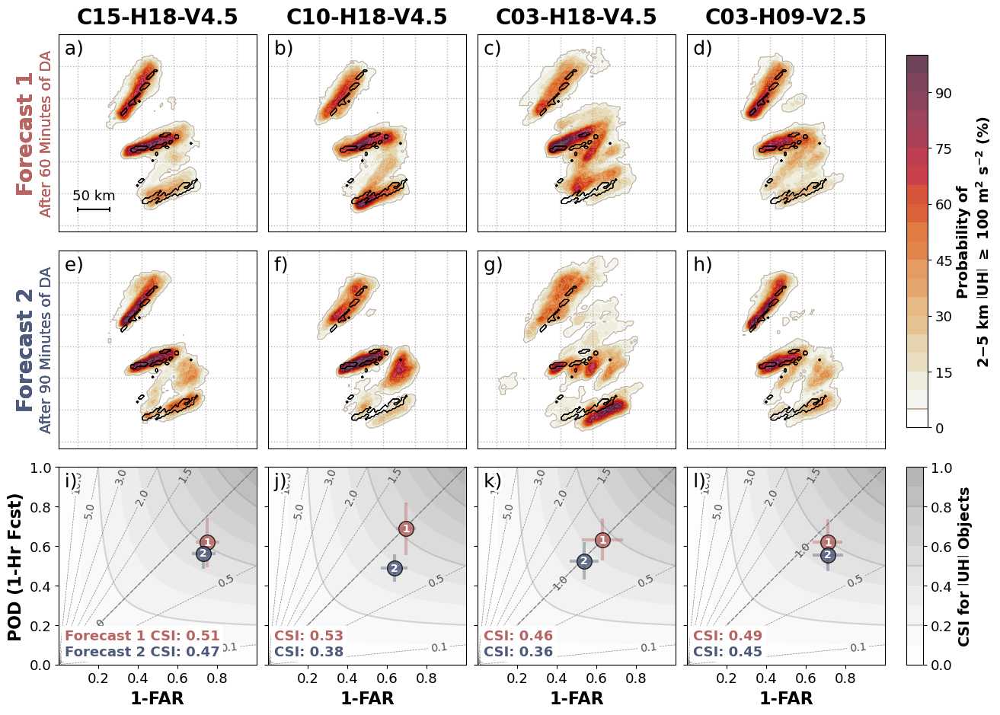

In [12]:

exps = [f'C{h:02d}_H18_V4' for h in [15,10,3]]+['C03_H09_V2']
version = 'CI'

# exps = [f'C10_H{h:02d}_V2' for h in [7,9,12,15,18]][::-1]
# version='H'

version='FULL'


#exps = [f'C03_H18_V{h}' for h in [2,4,6]][::-1]+[f'C03_H09_V{h}' for h in [2,4,6]][::-1]

#version='V'

# # exps = [f'C{h:02d}_H09_V2' for h in [15,10,3,1]]
# # version = 'CI'

# exps = ['C10_H09_V2','C10_H09_V2_fix','C03_H09_V2','C03_H09_V2_fix']
# version='raw'

#exps = ['oldC03_H09_V4','C03_H09_V4','C03_H09_V4_noV']
#version='Full'

# exps = ['C03_H09_V2_fix','C03_H09_V2_dense_fix','C10_H09_V6_fix','C10_H09_V6_dense_fix','C15_H15_V6_fix','C15_H15_V6_dense_fix']
# #exps2 = ['C03_H09_V2_dense_fix','C10_H09_V6_dense_fix','C15_H15_V6_dense_fix']

# exps = ['C15_H15_V6' ,'C10_H12_V6','C03_H09_V2']
# exps = ['C03_H09_V4','C03_H09_V4_noV','C03_H09_V4_noREF']

#exps2 = ['C03_H09_V4_noAI','C03_H18_V6_noAI','C10_H09_V4_noAI','C10_H18_V6_noAI','C15_H09_V4_noAI','C15_H18_V6_noAI']
# exps = ['C03_H09_V4_noAI','C03_H09_V4','C03_H18_V6_noAI','C03_H18_V6',]
# exps = ['C10_H09_V4_noAI','C10_H09_V4','C10_H18_V6_noAI','C10_H18_V6',]

#exps = ['C15_H18_V6', 'C15_H18_V6_noAI', 'C10_H18_V6', 'C10_H18_V6_noAI', 'C03_H18_V6', 'C03_H18_V6_noAI']

#version='raw'



if len(exps) == 9:
    fig, axes = plt.subplots(3, len(exps), figsize=(30, 9), sharex='row', sharey='row', subplot_kw={'aspect':'equal'})
    cbar_width = 0.01

# if len(exps) == 7:
#     fig, axes = plt.subplots(3, len(exps), figsize=(26, 15), sharex='row', sharey='row', subplot_kw={'aspect':'equal'})
#     cbar_width = 0.01


if len(exps) == 6:
    fig, axes = plt.subplots(3, len(exps), figsize=(23, 12), sharex='row', sharey='row', subplot_kw={'aspect':'equal'})
    cbar_width = 0.02

if len(exps) == 5:
    fig, axes = plt.subplots(3, len(exps), figsize=(20, 12), sharex='row', sharey='row', subplot_kw={'aspect':'equal'})
    cbar_width = 0.015
    plt.subplots_adjust(hspace=0.01, wspace=0.04)
    

if len(exps) == 4:
    fig, axes = plt.subplots(3, len(exps), figsize=(14, 11), sharex='row', sharey='row', subplot_kw={'aspect':'equal'})
    cbar_width = 0.02

if len(exps) == 3:
    cbar_width = 0.02
    fig, axes = plt.subplots(3, len(exps), figsize=(12, 12), sharex='row', sharey='row', subplot_kw={'aspect':'equal'})#, facecolor='none')



fcsts = ['FORECAST_20240508_2100', '']
ftime = [60,90]
axes[len(fcsts),0].set_xlim(0,1)
axes[len(fcsts),0].set_ylim(0,1)


NR = xr.open_dataset('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc')
NR = NR.rename({'UH2-5km':"UH_2-5km"})
times_NR = [pd.to_datetime(t) for t in NR.dates.values[50:]] # don't need to read in the start 
NR_UH = NR['UH_2-5km'][50:].values # don't need to read in the start 
xh, yh = NR.xh.values, NR.yh.values
NR.close()



ens_threshold=100
NR_threshold = ens2nr['UH_2-5km'][ens_threshold]
print(ens_threshold, NR_threshold)

# make colormap
cmap_b = cmaps.sunburst_r.cut(.2, 'right')
clist = [to_rgb('#ffffff')]
clist.extend(cmap_b(np.linspace(0,1,49)))
cmap1 = LinearSegmentedColormap.from_list("CR", clist, 30)

colors = cmaps.lipari(np.linspace(.24,  0.545, len(fcsts)))[::-1]

tlab=['Forecast 1', 'Forecast 2']

for i,exp in enumerate(exps):
    print(i, exp)

    axes[0, i].set_title(rename(exp, version=version.upper()), y=1.02, weight='bold', fontsize=20)

    path = f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp}/"


    for row, fcst in zip(range(3), fcsts):

        ### read in experiment files and get metadata
        #try:
     
        exper, fcst_start = open_exp(os.path.join(path, fcst), fcst_start=True)
        fcst_start_lock = dt.datetime(2024,5,8,21,30)
        da_start = dt.datetime.strptime(exper['DA_PARAMS']['DA_start_time'],'%Y-%m-%d %H:%M:%S')
        flen = 1 + int(60*60/exper['forecast_freq'])


        ######## now plot swaths - ensemble ########################
        
        cm1 = xr.open_dataset(f"{os.path.join('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/',exp, fcst)}/full_ens_fcst.nc", decode_timedelta=True)
        max_3x3 = ndimage.grey_dilation(abs(cm1['UH_2-5km'][-13:,:-1]), size = (3,3), axes=(2,3)) # only look at the final hour, regardless of the forecast
        smooth = gaussian_filter(max_3x3 , 0.5, radius = [0,0,2,2])
        probs = 100* np.clip(np.where(smooth >= ens_threshold, 1, 0).sum(axis=0), 0, 1).sum(axis=0)/(cm1.sizes['ne']-1)        
        cm1.close()

        im1=axes[row, i].contourf(xh, yh, probs,  cmap=cmap1, levels=np.arange(0, 105, 5), alpha=0.8)
        axes[row, i].contour(xh, yh, probs,  colors='#bdad9b', levels=[5], linewidths=0.8)

        y_center = 0.5    # Center of the Y-axis in normalized coordinates
        x_pos = -0.1   # Horizontal position far left of the axes (normalized)
        
        # Line 1: "Forecast 1" (Larger, Bold)
        axes[row, 0].text(x_pos- 0.06, y_center , tlab[row],                             transform=axes[row, 0].transAxes, rotation=90,ha='center',va='center',fontsize=20,fontweight='bold', color=colors[row])
        axes[row, 0].text(x_pos+ 0.04, y_center , f'After {60+ row*(30)} Minutes of DA', transform=axes[row, 0].transAxes, rotation=90,ha='center',va='center',fontsize=14, color=colors[row])


        ######## now plot swaths - nature run ######################
        
        NR_ti = findnearest(times_NR, fcst_start_lock)
        NR_swath = np.clip(np.where(NR_UH[NR_ti:] >= NR_threshold, 1, 0).sum(axis=0), 0, 1)
        for ax in axes[row, :]:
            imnr=ax.contour(xh, yh, NR_swath, levels=[0.5], colors='k', linewidths=0.75)

        ######## wild card - now add performance diagram ###########

        perf = xr.open_dataset(f"{os.path.join('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/',exp, fcst)}/performance_UH_{ens_threshold}.nc", decode_timedelta=True)  

        val_dct, ci_dct = generate_CI_contigency(exp,'UH', fcsts=fcst)
    
        axes[len(fcsts), i].errorbar(val_dct['SR'], val_dct['POD'], xerr=ci_dct['SR'], yerr=ci_dct['POD'], color=colors[row],elinewidth=3,capsize=0, alpha=0.4)#lw=3, alpha=0.5 )
        axes[len(fcsts), i].scatter(val_dct['SR'], val_dct['POD'], facecolor=colors[row],  edgecolor='k', s=200, zorder=100, alpha=0.8, label=tlab[row])
        axes[len(fcsts), i].text(val_dct['SR'], val_dct['POD'], str(row+1), color='w', ha='center', va='center', weight='bold', zorder=101)

        # rect = patches.Rectangle((.02, .02), .8, .3, linewidth=1, edgecolor='white', facecolor='white')
        # axes[len(fcsts), i].add_patch(rect, zorder=100)

        add=''
        if (i == 0) & (fcst != '') : add = 'Forecast 1 '
        if (i == 0) & (fcst == '') : add = 'Forecast 2 '

        bbox = dict(facecolor='white', alpha=1.0, edgecolor='none', pad=3)

        if fcst != '':
            axes[len(fcsts), i].text(0.03, 0.16+.02, f"{add}CSI: {val_dct['CSI']:.2f}", color=colors[row], ha='left', va='top', weight='bold', zorder=101, fontsize=13,bbox=bbox )
        else:
            axes[len(fcsts), i].text(0.03, 0.08+.02, f"{add}CSI: {val_dct['CSI']:.2f}", color=colors[row], ha='left', va='top', weight='bold', zorder=101, fontsize=13,bbox=bbox )

        # except:
        #     print('not done')


####### performance diagram stuff

for ax in axes[len(fcsts), :]:
    im = performance_diagram(ax, axis_labels=False)
    ax.set_xticks([.2, .4, .6, .8])
    ax.set_xlabel('1-FAR', fontsize=16)

    if version == 'CI':

        val_dct, ci_dct = generate_CI_contigency('Control','UH', fcsts=fcst)
        ax.errorbar(val_dct['SR'], val_dct['POD'], xerr=ci_dct['SR'], yerr=ci_dct['POD'], color='gray',elinewidth=3,capsize=0, alpha=0.4)#lw=3, alpha=0.5 )
        ax.scatter(val_dct['SR'], val_dct['POD'], color='0.7', edgecolor='k', s=200, zorder=100, alpha=1, label='No DA')
        perf.close()

#axes[len(fcsts),0].legend(fontsize=13, markerscale = 0.8, loc='lower left')
axes[len(fcsts), 0].set_ylabel('POD (1-Hr Fcst)', fontsize=16)

#### probability stuff

for ax in axes[:len(fcsts), :].flatten():
    ax.set_yticks(np.arange(50, 400, 50))
    ax.set_xticks(np.arange(50, 400, 50))
    ax.grid(ls=':', alpha=0.7)
    ax.xaxis.set_major_formatter(ticker.NullFormatter())
    ax.yaxis.set_major_formatter(ticker.NullFormatter())
    ax.tick_params(axis='both', length=0) 
    
    ax.set_xlim(70, 380)
    ax.set_ylim(40, 350)


if len(exps) == 3: plt.subplots_adjust(hspace=0.06, wspace=0.04)
if len(exps) == 4: plt.subplots_adjust(hspace=0.02, wspace=0.06)
if len(exps) == 5: plt.subplots_adjust(hspace=0.015, wspace=0.04)
if len(exps) == 7: plt.subplots_adjust(hspace=0.02, wspace=0.06)

# need to do this after subplot adjustments 
# UH colorbar
bbox1 = axes[0, len(exps)-1].get_position()  
bbox2 = axes[len(fcsts)-1, len(exps)-1].get_position()  
height = bbox1.y1 - bbox2.y0
cbar_ax1 = fig.add_axes([bbox1.x1+cbar_width, bbox2.y0+height*.05, cbar_width, height*.9])

cbar1 = fig.colorbar(im1, cax=cbar_ax1)
ge = r"$\mathbf{\geq}$"
cbar1.set_label('Probability of\n'+r'2$\mathbf{-}$5 km $\mathbf{\left| {UH} \right|}$'+f' {ge} {ens_threshold} '+ r'm$\mathbf{^2}$ s$\mathbf{^{-2}}$ (%)', weight='bold', fontsize=14)
cbar1.ax.axhline(5,color='#bdad9b' )

# performance diagram colorbar
bbox = axes[len(fcsts), len(exps)-1].get_position()    
cbar_ax = fig.add_axes([bbox.x1+cbar_width,bbox.y0, cbar_width*.8, bbox.y1-bbox.y0])
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label(r'CSI for $\mathbf{\left| {UH} \right|}$ Objects', weight='bold', fontsize=14)
[cbar.ax.axhline(l, color='0.5', alpha=0.3)  for l in [0.2, 0.5, 0.8]];

add_scale(axes[0,0], xstart=100,y=75, text_bump=7)


for i,ax in enumerate(axes.flatten()):
    ax.text(0.03, 0.97,  chr(ord('`')+i+1)+')', va='top', fontsize=18, transform=ax.transAxes, path_effects=[path_effects.Stroke(linewidth=5, foreground='white'),
                           path_effects.Normal()], zorder=500)

FIGNAME = 'ProbSwaths'
plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')


100 182
0 C03_H18_V4
1 C03_H09_V4


Text(0.5, 0.95, '3 Minute Assimilation Frequency')

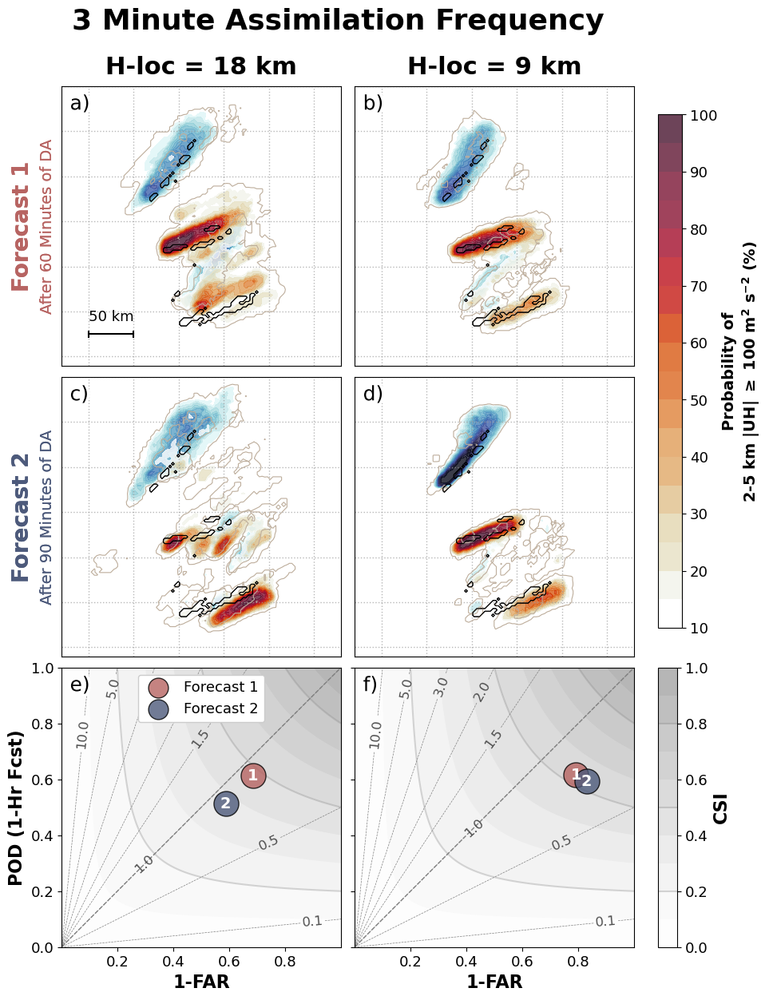

In [61]:

exps = [f'C03_H{h:02d}_V4' for h in [18,9]]
version='H'


if len(exps) == 2:
    cbar_width = 0.03
    fig, axes = plt.subplots(3, len(exps), figsize=(10, 14), sharex='row', sharey='row', subplot_kw={'aspect':'equal'})#, facecolor='none')



fcsts = ['FORECAST_20240508_2100', '']
#fcsts = ['']
ftime = [60,90]
axes[len(fcsts),0].set_xlim(0,1)
axes[len(fcsts),0].set_ylim(0,1)


NR = xr.open_dataset('/scratch/home/jessica.mcdonald/extra_NR_500m_may8/Processed_VerificationVars.nc')
NR = NR.rename({'UH2-5km':"UH_2-5km"})
times_NR = [pd.to_datetime(t) for t in NR.dates.values[50:]] # don't need to read in the start 
NR_UH = NR['UH_2-5km'][50:].values # don't need to read in the start 
xh, yh = NR.xh.values, NR.yh.values
NR.close()



ens_threshold=100
NR_threshold = ens2nr['UH_2-5km'][ens_threshold]
print(ens_threshold, NR_threshold)

# make colormap
cmap_b = cmaps.sunburst_r.cut(.2, 'right')
clist = [to_rgb('#ffffff')]
clist.extend(cmap_b(np.linspace(0,1,49)))
cmap1 = LinearSegmentedColormap.from_list("CR", clist, 30)

colors = cmaps.lipari(np.linspace(.24,  0.545, 2))[::-1]
#colors = [colors[-1]]

tlab=['Forecast 1', 'Forecast 2']
#tlab=['Forecast 2']

title=['H-loc = 18 km','H-loc = 9 km']


for i,exp in enumerate(exps):
    print(i, exp)

    axes[0, i].set_title(title[i], y=1.02, weight='bold', fontsize=22)

    path = f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp}/"


    for row, fcst in zip(range(3), fcsts):

        ### read in experiment files and get metadata
        try:
     
            exper, fcst_start = open_exp(os.path.join(path, fcst), fcst_start=True)
            fcst_start_lock = dt.datetime(2024,5,8,21,30)
            da_start = dt.datetime.strptime(exper['DA_PARAMS']['DA_start_time'],'%Y-%m-%d %H:%M:%S')
            flen = 1 + int(60*60/exper['forecast_freq'])
    
    
            ######## now plot swaths - ensemble ########################
            
            cm1 = xr.open_dataset(f"{os.path.join('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/',exp, fcst)}/full_ens_fcst.nc", decode_timedelta=True)
            max_3x3 = ndimage.grey_dilation(cm1['UH_2-5km'][-13:,:-1], size = (3,3), axes=(2,3)) # only look at the final hour, regardless of the forecast
            smooth = gaussian_filter(max_3x3 , 0.5, radius = [0,0,2,2])
            probs = 100* np.clip(np.where(smooth >= ens_threshold, 1, 0).sum(axis=0), 0, 1).sum(axis=0)/(cm1.sizes['ne']-1)        
            cm1.close()

            cm1 = xr.open_dataset(f"{os.path.join('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/',exp, fcst)}/full_ens_fcst.nc", decode_timedelta=True)
            max_3x3 = ndimage.grey_dilation(cm1['UH_2-5km'][-13:,:-1]*-1, size = (3,3), axes=(2,3)) # only look at the final hour, regardless of the forecast
            smooth = gaussian_filter(max_3x3 , 0.5, radius = [0,0,2,2])
            probs2 = 100* np.clip(np.where(smooth >= (ens_threshold), 1, 0).sum(axis=0), 0, 1).sum(axis=0)/(cm1.sizes['ne']-1)        
            cm1.close()

            im1=axes[row, i].contourf(xh, yh, probs2,  cmap=cmaps.ice_r, levels=np.arange(10, 105, 5), alpha=0.8)
            axes[row, i].contour(xh, yh, probs2,  colors='#bdad9b', levels=[5], linewidths=0.8)
    
            im1=axes[row, i].contourf(xh, yh, probs,  cmap=cmap1, levels=np.arange(10, 105, 5), alpha=0.8)
            axes[row, i].contour(xh, yh, probs,  colors='#bdad9b', levels=[5], linewidths=0.8)


            
    
            y_center = 0.5    # Center of the Y-axis in normalized coordinates
            x_pos = -0.1   # Horizontal position far left of the axes (normalized)
            
            # Line 1: "Forecast 1" (Larger, Bold)
            
            axes[row, 0].text(x_pos- 0.04, y_center , tlab[row],                             transform=axes[row, 0].transAxes, rotation=90,ha='center',va='center',fontsize=20,fontweight='bold', color=colors[row])
            axes[row, 0].text(x_pos+ 0.05, y_center , f'After {60+ row*(30)} Minutes of DA', transform=axes[row, 0].transAxes, rotation=90,ha='center',va='center',fontsize=14, color=colors[row])
            #axes[row, 0].text(x_pos+ 0.05, y_center , f'After {90} Minutes of DA', transform=axes[row, 0].transAxes, rotation=90,ha='center',va='center',fontsize=14, color=colors[row])



            ######## now plot swaths - nature run ######################
            
            NR_ti = findnearest(times_NR, fcst_start_lock)
            NR_swath = np.clip(np.where(NR_UH[NR_ti:] >= NR_threshold, 1, 0).sum(axis=0), 0, 1)
            for ax in axes[row, :]:
                imnr=ax.contour(xh, yh, NR_swath, levels=[0.5], colors='k', linewidths=0.75)
    
            ######## wild card - now add performance diagram ###########
    
            perf = xr.open_dataset(f"{os.path.join('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/',exp, fcst)}/performance_UH_{ens_threshold}.nc", decode_timedelta=True)  
    
            # 1 hour only
            a = perf['hits'][-13:].sum()
            b = perf['false_alarms'][-13:].sum()
            c = perf['misses'][-13:].sum()

            perf.close()
            
            POD = a/(a+c)
            FAR = b/(a+b)
            
            axes[len(fcsts), i].scatter(1-FAR, POD, color=colors[row], edgecolor='k', s=500, zorder=100, alpha=0.8, label=tlab[row])
            axes[len(fcsts), i].text(1-FAR, POD, str(row+1), fontsize=14,color='w', ha='center', va='center', weight='bold', zorder=101)
            perf.close()
        except:
            print('not done')


####### performance diagram stuff

for ax in axes[len(fcsts), :]:
    im = performance_diagram(ax, axis_labels=False)
    ax.set_xticks([.2, .4, .6, .8])
    ax.set_xlabel('1-FAR', fontsize=16)

    if version == 'CI':
        perf = xr.open_dataset(f"{os.path.join('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/','Control', '')}/performance_UH_{ens_threshold}.nc", decode_timedelta=True)  
        a = perf['hits'][-13:].sum()
        b = perf['false_alarms'][-13:].sum()
        c = perf['misses'][-13:].sum()
        perf.close()
        POD = a/(a+c)
        FAR = b/(a+b)
        ax.scatter(1-FAR, POD, color='gray', edgecolor='k', s=300, zorder=100, alpha=0.5, label='No DA')
        perf.close()

axes[len(fcsts),0].legend(fontsize=13, markerscale = 0.8, loc='upper center')
axes[len(fcsts), 0].set_ylabel('POD (1-Hr Fcst)', fontsize=16)

#### probability stuff

for ax in axes[:len(fcsts), :].flatten():
    ax.set_yticks(np.arange(50, 400, 50))
    ax.set_xticks(np.arange(50, 400, 50))
    ax.grid(ls=':', alpha=0.7)
    ax.xaxis.set_major_formatter(ticker.NullFormatter())
    ax.yaxis.set_major_formatter(ticker.NullFormatter())
    ax.tick_params(axis='both', length=0) 
    
    ax.set_xlim(70, 380)
    ax.set_ylim(40, 350)

if len(exps) == 2: plt.subplots_adjust(hspace=0.04, wspace=-0.1)
    
if len(exps) == 3: plt.subplots_adjust(hspace=0.06, wspace=0.04)
if len(exps) == 4: plt.subplots_adjust(hspace=0.02, wspace=0.06)
if len(exps) == 5: plt.subplots_adjust(hspace=0.015, wspace=0.04)
if len(exps) == 7: plt.subplots_adjust(hspace=0.02, wspace=0.06)

# need to do this after subplot adjustments 
# UH colorbar
bbox1 = axes[0, len(exps)-1].get_position()  
bbox2 = axes[len(fcsts)-1, len(exps)-1].get_position()  
height = bbox1.y1 - bbox2.y0
cbar_ax1 = fig.add_axes([bbox1.x1+cbar_width, bbox2.y0+height*.05, cbar_width, height*.9])

cbar1 = fig.colorbar(im1, cax=cbar_ax1)
ge = r"$\mathbf{\geq}$"
cbar1.set_label(f'Probability of\n2-5 km |UH| {ge} {ens_threshold} '+ r'm$\mathbf{^2}$ s$\mathbf{^{-2}}$ (%)', weight='bold', fontsize=14)
cbar1.ax.axhline(5,color='#bdad9b' )

# performance diagram colorbar
bbox = axes[len(fcsts), len(exps)-1].get_position()    
cbar_ax = fig.add_axes([bbox.x1+cbar_width,bbox.y0, cbar_width*.8, bbox.y1-bbox.y0])
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('CSI', weight='bold', fontsize=16)
[cbar.ax.axhline(l, color='0.5', alpha=0.3)  for l in [0.2, 0.5, 0.8]];

add_scale(axes[0,0], xstart=100,y=75, text_bump=7)


for i,ax in enumerate(axes.flatten()):
    ax.text(0.03, 0.97,  chr(ord('`')+i+1)+')', va='top', fontsize=18, transform=ax.transAxes, path_effects=[path_effects.Stroke(linewidth=5, foreground='white'),
                           path_effects.Normal()], zorder=500)
fig.suptitle('3 Minute Assimilation Frequency', weight='bold', fontsize=26, y=.95)


In [59]:
probs2.max()

np.float64(2.7777777777777777)

# Balance Plots

0.01201114273737238
0.01404559672487063
0.025563213145255836
0.018691242920782176


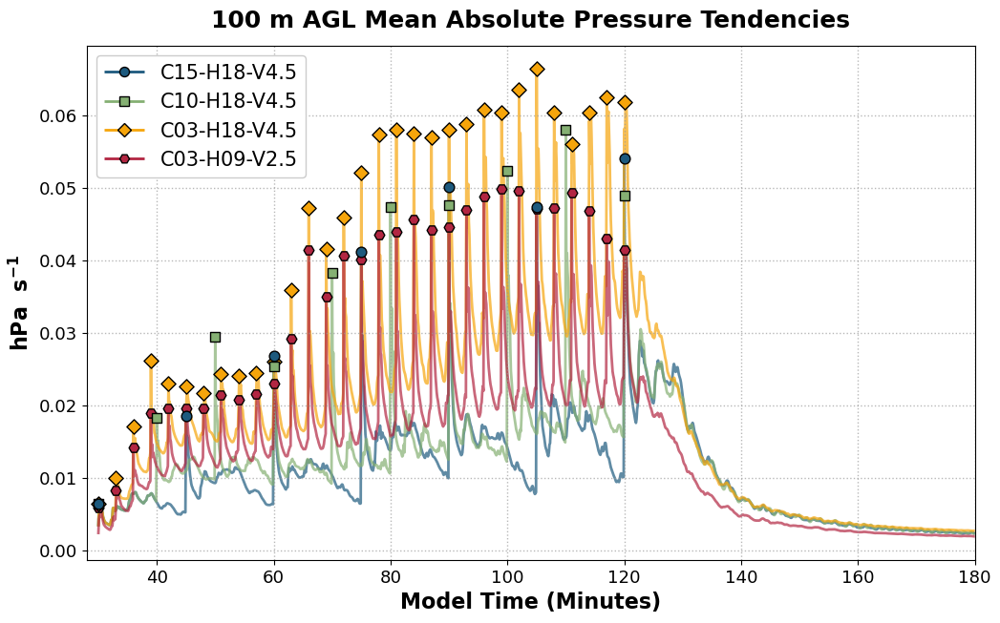

In [24]:

# exps = [f'C03_H09_V{h}' for h in [2,4,6]]
# version='V'

exps = [f'C03_H{h:02d}_V4' for h in [7,9,12,15,18]]
version='H'

exps = [f'C{h:02d}_H18_V4' for h in [15,10,3]] + ['C03_H09_V2']
version = 'FULL'


members = np.arange(0, 36, 1)
fpath = f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/'

colors = list(cmaps.pride(np.linspace(.17,.78, len(exps))))
if len(exps) == 3: colors = list(cmaps.pride([.2, .75, .6]))
markers = ['o', 's', 'D', 'H','^', '>', '<', 'v']
ls = ['-']*len(exps)




fig,ax = plt.subplots(1,1, figsize=(12, 7), sharex=True)

# #use for the noAI plot
# exps = ['C03_H18_V6','C03_H18_V6_noAI','C03_H12_V4']#,'C03_H09_V4','C03_H09_V4_noAI',]

# #exps = ['C03_H09_V4','C03_H09_V4_noAI']
# version = 'Fullx'
# #colors = list(cmaps.pride(np.linspace(.17,.78, len(exps))))

# colors = list(cmaps.pride([0.2, 0.8, 0.65]))
# #colors = [colors[i] for i in [0,1,3,2]]
# ls     = ['-']* len(exps)#['--', '-', '--', '-']



for i,exp in enumerate(exps): 

    # get da times
    with open(f'{fpath}{exp}/letkf.exp', 'rb') as f:exper= json.load(f)['DA_PARAMS']
    freq = exper['assim_freq']
    dalen =(dt.datetime.strptime(exper['DA_end_time'], '%Y-%m-%d %H:%M:%S')-dt.datetime.strptime(exper['DA_start_time'], '%Y-%m-%d %H:%M:%S')).seconds
    peaks = (np.arange(0,dalen+freq/2, freq )/6).astype(int) +1

    # read in and process data

    wtg = xr.open_dataset(f'{fpath}{exp}/balance.nc')
    i0=findnearest(wtg.time.values, 30) # this will be zero if you used a "pre cooked" set up
    i1=findnearest(wtg.time.values, 120)+1
    wres_adjusted = wtg['wres_adjusted'].values[i0:]
    rain = wtg['qr'].values[i0:]
    time = wtg.time.values[i0:]
    pten = wtg.divc.values[i0:].mean(axis=1)/100

    #find the peaks 
    df = pd.DataFrame(data={"pten":pten}, index=time)
   
    df['pmax'] = df['pten'].rolling(window=int(6*freq/60), center=True, min_periods=int(6*freq/60/2)).max()
    #df['wmax'] = df['wtg_adjusted'].rolling(window=int(6*freq/60), center=True, min_periods=int(6*freq/60/2)).max()
    

    #### WTG
    zord = 1
    #if i == 0: zord=500
    tc = colors[i]        

    #### PRESSURE TENDENCY
    scat=ax.scatter(df.index.values[i0:i1][::int(freq/6)], df['pmax'].values[i0:i1][::int(freq/6)], color=tc, s=60,marker=markers[i], zorder=100*(10-i), ec='k',label=rename(exp, version=version))
    ax.plot(df.pten,  color=colors[i], lw=2,label=rename(exp, version=version), alpha=0.7, zorder=zord, ls=ls[i])#, zorder=100*(10-i))

    print(np.mean(pten[i0:i1]))


handles, labels =ax.get_legend_handles_labels()
l, h = [],[]
for i, exp in enumerate(exps):
    h.append(mpl.lines.Line2D([0], [0], color=colors[i], linewidth=2, marker=markers[i],  markeredgecolor='k', linestyle=ls[i]))
    l.append(rename(exp, version=version))
ax.legend(handles=h, labels=l,fontsize=15, loc=2, markerscale=1.2)

ax.set_xlim(28, 180)



ax.set_title("100 m AGL Mean Absolute Pressure Tendencies", weight='bold', y=1.02)
ax.set_xlabel('Model Time (Minutes)', fontsize=16)
ax.set_ylabel(r"hPa  s$\mathbf{^{-1}}$", fontsize=16);
ax.grid(ls=':', alpha=0.7)


# FIGNAME = 'Balance'#'VBalance'# 'NoAI'#'CIBalance'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')

C03_H07_V4
C03_H09_V4
C03_H12_V4
C03_H15_V4
C03_H18_V4


(25.0, 180.0)

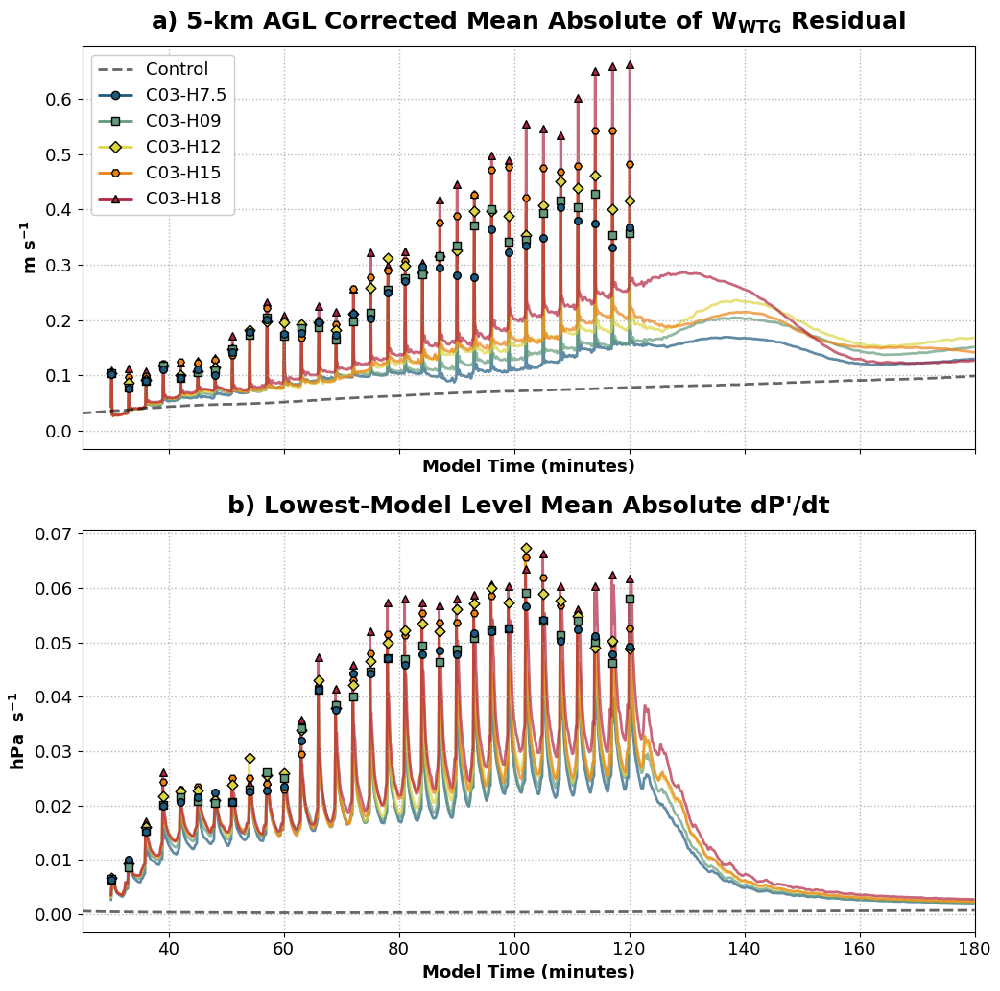

In [88]:

# exps = [f'C03_H09_V{h}' for h in [2,4,6]]
# version='V'

exps = [f'C03_H{h:02d}_V4' for h in [7,9,12,15,18]]
version='H'

# exps = [f'C{h:02d}_H18_V4' for h in [15,10,3]]
# version='CI'
# version='FULL'

# exps = ['C03_H09_V2','C03_H09_V2_noAI','C03_H18_V2','C03_H18_V2_noAI']
# version='fullx'

# # exps = [f'C{h:02d}_H09_V2' for h in [3,1]]
# # #exps = ['C03_H09_V2','C03_H09_V2_fine']
# # version='fullx'

# exps = ['C10_H09_V2','C10_H09_V2_fix','C03_H09_V2','C03_H09_V2_fix']
# version='raw'

#exps = ['C03_H09_V2_dense_fix','C03_H09_V2_fix']
# exps = ['C10_H09_V6_dense_fix','C10_H09_V6_fix']
# exps = ['C15_H15_V6_dense_fix','C15_H15_V6_fix']
# version='raw'
# exps = ['C03_H18_V6','C03_H18_V6_noAI','C03_H09_V4','C03_H09_V4_noAI',]

members = np.arange(0, 36, 1)
fpath = f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/'

colors = list(cmaps.pride(np.linspace(.17,.78, len(exps))))
if len(exps) == 3: colors = list(cmaps.pride([.2, .6, .8]))
markers = ['o', 's', 'D', 'H','^', '>', '<', 'v']
ls = ['-']*len(exps)
fig,axes = plt.subplots(2,1, figsize=(12, 12), sharex=True)

#use for the noAI plot
# exps = ['C03_H18_V6','C03_H18_V6_noAI','C03_H09_V4','C03_H09_V4_noAI',]
# version = 'raw'
# colors = list(cmaps.pride(np.linspace(.17,.78, len(exps))))
# colors = [colors[i] for i in [0,1,3,2]]
# ls     = ['--', '-', '--', '-']


### WTG
control = xr.open_dataset(f'{fpath}Control/balance.nc')
ti      = findnearest(control.time, 30)
tti     = findnearest(control.time, 180)
slope, _,_,_,_= scipy.stats.linregress(control['wres'][ti:,:].values.ravel(), control['qr'][ti:,:].values.ravel())
control_rain = control['qr'].values

con=axes[0].plot(control.time, control.wres.mean(axis=1), color='k', label='Control', ls='--', lw=2, alpha=0.6)

#pten = control.divc.values.mean(axis=1)/100
con=axes[1].plot(control.time,control.divc.values.mean(axis=1)/100, color='k', label='Control', ls='--', lw=2, alpha=0.6)


   
axes[0].set_title("a) 5-km AGL Corrected Mean Absolute "+r"of W$\mathbf{_{WTG}}$ Residual", weight='bold', y=1.02)
axes[0].set_xlabel('Model Time (minutes)')
axes[0].set_ylabel(r'm s$\mathbf{^{-1}}$');
axes[0].grid(ls=':', alpha=0.7)

axes[1].set_title("b) Lowest-Model Level Mean Absolute dP\'/dt", weight='bold', y=1.02)
axes[1].set_xlabel('Model Time (minutes)')
axes[1].set_ylabel(r'hPa  s$\mathbf{^{-1}}$');
axes[1].grid(ls=':', alpha=0.7)



control60 = xr.open_dataset(f'{fpath}Control60/balance.nc')
ti      = findnearest(control.time, 30)
tti     = findnearest(control.time, 180)
slope60, _,_,_,_= scipy.stats.linregress(control60['wres'][ti:,:].values.ravel(), control60['qr'][ti:,:].values.ravel())
control_rain60 = control60['qr'].values



for i,exp in enumerate(exps): 

    # get da times
    with open(f'{fpath}{exp}/letkf.exp', 'rb') as f:exper= json.load(f)['DA_PARAMS']
    freq = exper['assim_freq']
    dalen =(dt.datetime.strptime(exper['DA_end_time'], '%Y-%m-%d %H:%M:%S')-dt.datetime.strptime(exper['DA_start_time'], '%Y-%m-%d %H:%M:%S')).seconds
    peaks = (np.arange(0,dalen+freq/2, freq )/6).astype(int) +1

    # read in and process data

    wtg = xr.open_dataset(f'{fpath}{exp}/balance.nc')
    i0=findnearest(wtg.time.values, 30) # this will be zero if you used a "pre cooked" set up
    i1=findnearest(wtg.time.values, 120)+1
    wres = wtg['wres'].values[i0:]
    rain = wtg['qr'].values[i0:]
    time = wtg.time.values[i0:]
    pten = wtg.divc.values[i0:].mean(axis=1)/100
    # #pten = wtg.divc.values[i0:][:,10]/100

    if np.shape(rain)[1]  >37:
        wtg_adjusted = (wres- (1/slope60)*(rain - control_rain60[ti:ti+len(rain)])).mean(axis=1)
    else:
        wtg_adjusted = (wres- (1/slope)*(rain - control_rain[ti:ti+len(rain)])).mean(axis=1)
        #wtg_adjusted = (wres- (1/slope)*(rain - control_rain[ti:ti+len(rain)]))[:,10]  #.mean(axis=1)

    #find the peaks 
    df = pd.DataFrame(data={"wtg_adjusted":wtg_adjusted, "pten":pten}, index=time)
   
    df['pmax'] = df['pten'].rolling(window=int(6*freq/60), center=True, min_periods=int(6*freq/60/2)).max()
    df['wmax'] = df['wtg_adjusted'].rolling(window=int(6*freq/60), center=True, min_periods=int(6*freq/60/2)).max()
    

    #### WTG
    zord = 1
    #if i == 0: zord=500
    tc = colors[i]        
    scat=axes[0].scatter(df.index.values[:i1][::int(freq/6)]+.1, df['wmax'].values[:i1][::int(freq/6)], color=tc, s=30,marker=markers[i], zorder=100*(10-i), ec='k',label=rename(exp, version=version))
    print(exp)
    axes[0].plot(df.wtg_adjusted,  color=colors[i], lw=2,label=rename(exp, version=version), alpha=0.7, zorder=zord, ls=ls[i])#, zorder=100*(10-i))


    #### PRESSURE TENDENCY
    scat=axes[1].scatter(df.index.values[i0:i1][::int(freq/6)], df['pmax'].values[i0:i1][::int(freq/6)], color=tc, s=30,marker=markers[i], zorder=100*(10-i), ec='k',label=rename(exp, version=version))
    axes[1].plot(df.pten,  color=colors[i], lw=2,label=rename(exp, version=version), alpha=0.7, zorder=zord, ls=ls[i])#, zorder=100*(10-i))


handles, labels =axes[0].get_legend_handles_labels()
l = [labels[0]]
h = [handles[0]]
for i, exp in enumerate(exps):
    h.append(mpl.lines.Line2D([0], [0], color=colors[i], linewidth=2, marker=markers[i],  markeredgecolor='k', linestyle=ls[i]))
    l.append(rename(exp, version=version))
axes[0].legend(handles=h, labels=l,fontsize=13, loc=2)
#axes[1].legend(handles=h[1:], labels=l[1:],fontsize=13, loc='upper center', ncol=4)


axes[0].set_xlim(25, 180)


# FIGNAME = 'NoAI'#'VBalance'# 'NoAI'#'CIBalance'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')

# eFSS plots

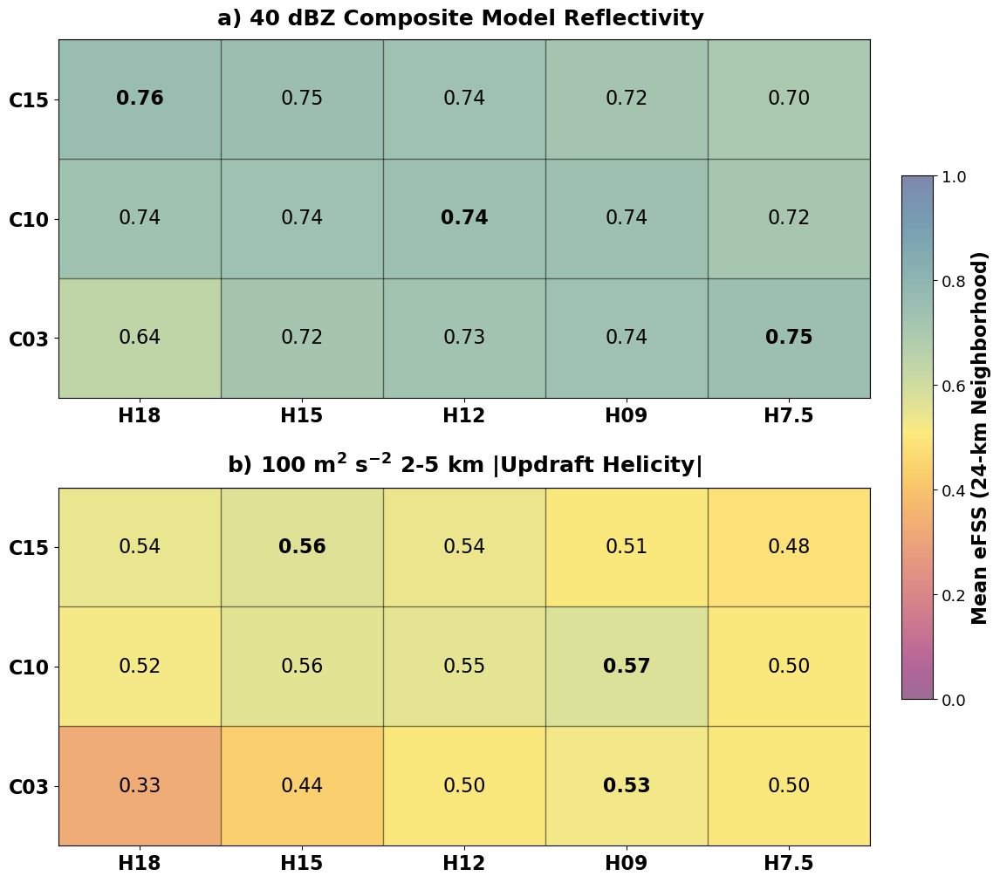

In [105]:
fig, axes = plt.subplots(2,1, figsize=(12, 12))

hloc = [7,9,12,15,18][::-1]
cint = [3,10,15]

var1 = 'compdz'
var2 = 'uh2to5'

thresh1   = 40 # dbz
thresh2   = 100 # dbz
neighborhood_size = 24 # km 

table1 = np.zeros([len(hloc), len(cint) ])
table2 = np.zeros([len(hloc), len(cint) ])

x_h, y_r = np.meshgrid(np.arange(len(hloc)), np.arange(len(cint)))

fcsts = ['FORECAST_20240508_2100', '']

for hi, h in enumerate(hloc):
    for ci, c in enumerate(cint):

        for fcst in fcsts:
            
            path = os.path.join("/work/jessica.mcdonald/CM1_LETKF_2025/experiments/", f"C{c:02d}_H{h:02d}_V4/")
            ds = xr.open_dataset(os.path.join(path, fcst, f'fss_{var1}.nc' ))
            neighborhoods = ds.SCALES.values*1000
            th_i = findnearest(ds.FCST_THLDS[0].values, thresh1)
            n_i  = findnearest(neighborhoods, neighborhood_size)
            table1[hi, ci] += np.mean(ds.EFSS[:,n_i, th_i].values)/len(fcsts)
            ds.close()
    
            ds = xr.open_dataset(os.path.join(path, fcst, f'fss_{var2}.nc' ))
            neighborhoods = ds.SCALES.values*1000
            th_i = findnearest(ds.FCST_THLDS[0].values, thresh2)
            n_i  = findnearest(neighborhoods, neighborhood_size)
            table2[hi, ci] += np.mean(ds.EFSS[:,n_i, th_i].values)/len(fcsts)
            ds.close()

im=axes[0].pcolormesh(x_h, y_r, table1.T, vmin=0, vmax=1,alpha=0.6, cmap=cmaps.pride_r.cut( .1,'right').cut( .1,'left'))#cmaps.w5m4_r)
im=axes[1].pcolormesh(x_h, y_r, table2.T, vmin=0, vmax=1,alpha=0.6, cmap=cmaps.pride_r.cut( .1,'right').cut( .1,'left'))#cmaps.w5m4_r)


for ax in axes: 
    ax.set_xticks(x_h[0],[rename(f'C03_H{m:02d}_V4', version='H').split('-')[1] for m in hloc], weight='bold', fontsize=16)
    ax.set_yticks(y_r[:,0], [f'C{c:02d}' for c in cint], weight='bold', fontsize=16)
    for hl in range(len(hloc)):#, len(rc)
        ax.axvline(hl+.5, color='k', alpha=0.5, lw=1)
    for hl in range(len(cint)):#, len(rc)
        ax.axhline(hl+.5, color='k', alpha=0.5, lw=1)

for hi, h in enumerate(hloc):
    for ci, c in enumerate(cint):
        weight='normal'
        if table1[hi, ci] == np.max(table1[:, ci]): weight='bold'
        axes[0].text(hi, ci, f'{table1[hi, ci]:.2f}', ha='center', va='center', weight=weight, fontsize=16)

        weight='normal'
        if table2[hi, ci] == np.max(table2[:, ci]): weight='bold'
        axes[1].text(hi, ci, f'{table2[hi, ci]:.2f}', ha='center', va='center', weight=weight, fontsize=16)


# titles
axes[0].set_title(f'a) {thresh1} dBZ Composite Model Reflectivity ',weight='bold', y=1.02, fontsize=18)

unit = r'm$\mathbf{^2}$ s$\mathbf{^{-2}}$'
axes[1].set_title(f'b) {thresh2} {unit} 2-5 km |Updraft Helicity|', weight='bold', y=1.02, fontsize=18)


cbar_ax = fig.add_axes([0.93, 0.25, 0.03, 0.5])
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('Mean eFSS (24-km Neighborhood)', weight='bold', fontsize=16)

plt.subplots_adjust(hspace=.25)

# FIGNAME = 'HeFSS'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')

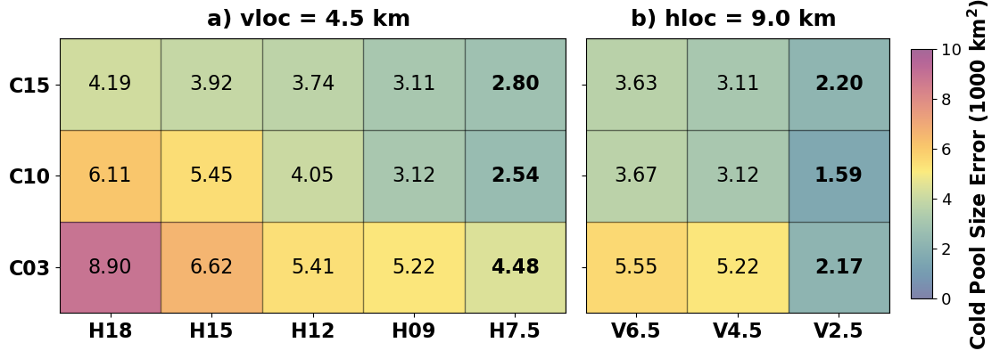

In [243]:
fig, axes = plt.subplots(1,2, figsize=(12, 4),gridspec_kw={'width_ratios': [5,3]}, sharey=True )

NR = xr.open_dataset('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc')
NRtime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in NR.dates.values[:]]
#NR_temp = NR.cp_temp.values
NR_size = NR.cp_size.values
NR.close()


hloc = [7,9,12,15,18][::-1]
vloc =[6,4,2]
cint = [3,10,15]

table1 = np.zeros([len(hloc), len(cint) ])
table2 = np.zeros([len(vloc), len(cint) ])

x_h, y_r = np.meshgrid(np.arange(len(hloc)), np.arange(len(cint)))
x_h2, y_r2 = np.meshgrid(np.arange(len(vloc)), np.arange(len(cint)))

fcsts = ['FORECAST_20240508_2100']#, '']

for hi, h in enumerate(hloc):
    for ci, c in enumerate(cint):

        for fcst in fcsts:

            path = os.path.join("/work/jessica.mcdonald/CM1_LETKF_2025/experiments/", f"C{c:02d}_H{h:02d}_V4/")
            cm1 = xr.open_dataset(os.path.join(path, fcst, f'full_ens_fcst.nc' ), decode_timedelta=True)
            time = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
            tis =[findnearest(NRtime, t) for t in time]
            btis =[findnearest(NRtime, t) for t in time]
            NRs = NR_size[tis][:, np.newaxis]
            table1[hi, ci]  += np.nanmean((cm1.cp_size[:, :-1].values - NRs)/1000)/len(fcsts)
            cm1.close()


for hi, v in enumerate(vloc):
    for ci, c in enumerate(cint):

        for fcst in fcsts:

            path = os.path.join("/work/jessica.mcdonald/CM1_LETKF_2025/experiments/", f"C{c:02d}_H09_V{v}/")
            cm1 = xr.open_dataset(os.path.join(path, fcst, f'full_ens_fcst.nc' ), decode_timedelta=True)
            time = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
            tis =[findnearest(NRtime, t) for t in time]
            btis =[findnearest(NRtime, t) for t in time]
            NRs = NR_size[tis][:, np.newaxis]
            table2[hi, ci] += np.nanmean((cm1.cp_size[:, :-1].values - NRs)/1000)/len(fcsts)
            cm1.close()
    
im=axes[0].pcolormesh(x_h, y_r, table1.T,   vmin=0, vmax=10,alpha=0.6, cmap=cmaps.pride.cut( .1,'right').cut( .1,'left'))#cmaps.w5m4_r)
im=axes[1].pcolormesh(x_h2, y_r2, table2.T, vmin=0, vmax=10,alpha=0.6, cmap=cmaps.pride.cut( .1,'right').cut( .1,'left'))#cmaps.w5m4_r)



axes[0].set_xticks(x_h[0],[rename(f'C03_H{m:02d}_V4', version='H').split('-')[1] for m in hloc], weight='bold', fontsize=16)
axes[0].set_yticks(y_r[:,0], [f'C{c:02d}' for c in cint], weight='bold', fontsize=16)
for hl in range(len(hloc)):#, len(rc)
    axes[0].axvline(hl+.5, color='k', alpha=0.5, lw=1)

axes[1].set_xticks(x_h2[0],[rename(f'C03_H09_V{m}', version='V').split('-')[1] for m in vloc], weight='bold', fontsize=16)
for hl in range(len(vloc)):#, len(rc)
    axes[1].axvline(hl+.5, color='k', alpha=0.5, lw=1)

for ax in axes:
    for hl in range(len(cint)):#, len(rc)
        ax.axhline(hl+.5, color='k', alpha=0.5, lw=1)

for hi, h in enumerate(hloc):
    for ci, c in enumerate(cint):
        weight='normal'
        if table1[hi, ci] == np.min(table1[:, ci]): weight='bold'
        axes[0].text(hi, ci, f'{table1[hi, ci]:.2f}', ha='center', va='center', weight=weight, fontsize=16)

        try:
            weight='normal'
            if table2[hi, ci] == np.min(table2[:, ci]): weight='bold'
            axes[1].text(hi, ci, f'{table2[hi, ci]:.2f}', ha='center', va='center', weight=weight, fontsize=16)
        except:
            continue


# titles
axes[0].set_title(f'a) vloc = 4.5 km ',weight='bold', y=1.02, fontsize=18)
axes[1].set_title(f'b) hloc = 9.0 km ',weight='bold', y=1.02, fontsize=18)


cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label(r'Cold Pool Size Error (1000 km$\mathbf{^2}$)', weight='bold', fontsize=16)

plt.subplots_adjust(wspace=.05)



In [101]:
np.shape(np.nanmean((cm1.cp_size[:, :-1].values - NRs)/1000, axis=0))

72

In [92]:
ci_table[2]

array([[nan, nan, nan],
       [nan, nan, nan],
       [nan, nan, nan],
       [nan, nan, nan],
       [nan, nan, nan]])

(0.0, 1.0)

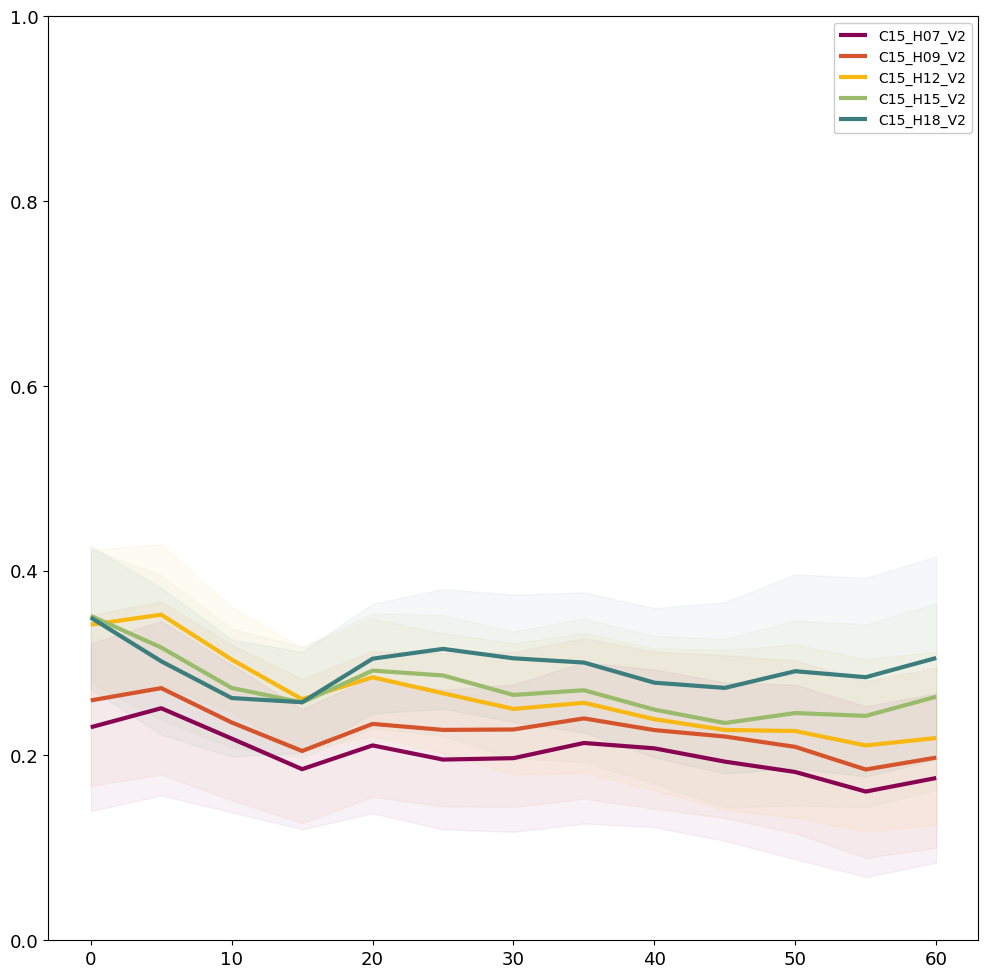

In [214]:
fcst = 'FORECAST_20240508_2100'#''
fcst=''

fcsts = ['FORECAST_20240508_2100']#,'']
#fcsts=['']

exps = ['C03_H09_V4','C15_H15_V6', 'C10_H12_V6']

exps = [f'C15_H{h:02d}_V2' for h in [7,9,12,15,18]]

var1, var2 = 'compdz', 'uh2to5'
thresh1, thresh2   = 50, 100

neighborhood_size=12

colors = cmaps.pride(np.linspace(.25,.85,len(exps))[::-1])
if len(exps) == 3: colors = cmaps.pride([0.2, 0.6, 0.8])

fig = plt.figure(figsize=(12, 12))
ax=plt.gca()



n = 36 #* 13 # number of ensemble members, timesteps
maxi = n*len(fcsts)
n_boot = 10000
indices = generate_bootstrap_indices(n,maxi, n_boot, seed=42)




for ei,exp in enumerate(exps):

    

    path = os.path.join("/work/jessica.mcdonald/CM1_LETKF_2025/experiments/", exp)

    fss = []
    for fcst in fcsts:


        ds = xr.open_dataset(os.path.join(path, fcst, f'fss_{var1}.nc' ))
        neighborhoods = ds.SCALES.values*1000
        th_i = findnearest(ds.FCST_THLDS[0].values, thresh1)
        n_i  = findnearest(neighborhoods, neighborhood_size)
        fss.append(ds.FSS[:,-13:,n_i, th_i].values) # ne, nt

 
    tarr = netCDF4.num2date( ds.TIME.values[-13:], ds.TIME.unit)
    fcst_lead = np.array([(t - tarr[0]).seconds for t in tarr]) # the time step is the amount that the start is off by (I don't inlcude the analysis)
    fcst_lead =(fcst_lead)/60
    
    fss_ci_t = []
    fss = np.array(fss)
    for t in np.arange(13):
        temp = []
        for fi, f in enumerate(fcsts):
            temp.extend(fss[fi, :, t].flatten())
        fss_ci_t.append(compute_ci_perc(bootstrap_fss_from_indices(temp, indices), interval))

    mfss = fss.mean(axis=(0,1))

    y0, y1 = mfss-fss_ci_t, mfss+fss_ci_t
    
    ax.fill_between(fcst_lead, y0,y1, alpha=0.05, color=colors[ei])
    ax.plot(fcst_lead, mfss, color=colors[ei], label=exp, lw=3, zorder=100)

   # ax.plot(fcst_lead, ds.EFSS[-13:, n_i, th_i], color=colors[ei], ls = '--', lw=1)
plt.legend()
ax.set_ylim(0,1)

Text(0.5, 0, 'Neighborhood Width (km)')

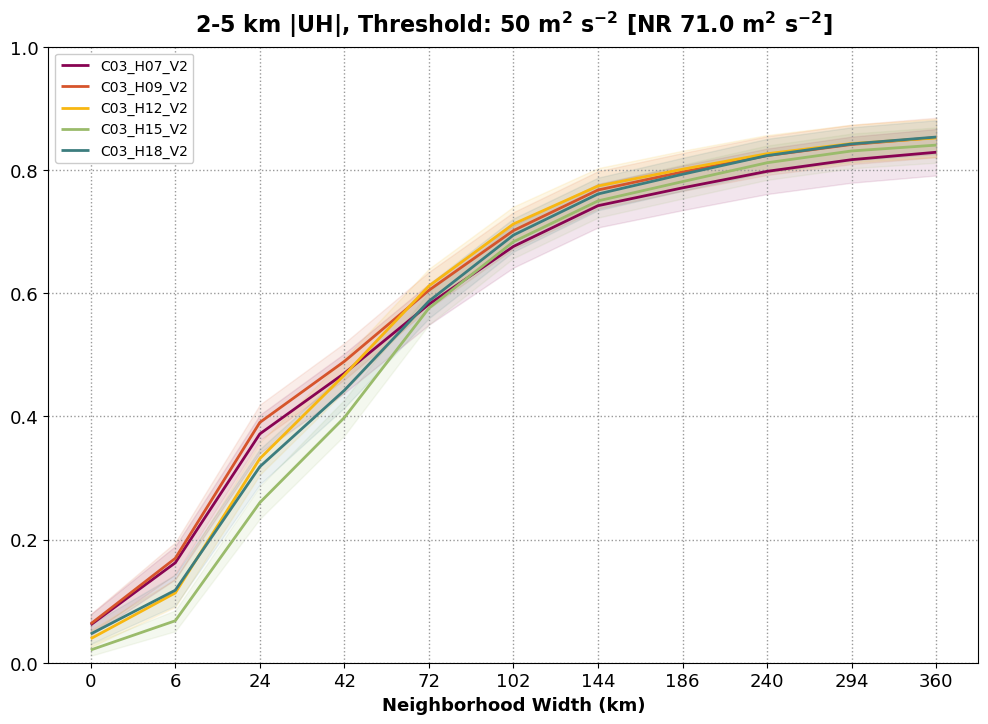

In [111]:


exps =  [f'C03_H{h:02d}_V2' for h in [7,9,12,15,18]]


fcsts = ['FORECAST_20240508_2100', '']
fcsts = [ '']
colors = cmaps.pride(np.linspace(.2, .8, len(exps)))
colors=cmaps.pride(np.linspace(.2, .8, len(exps)))
colors = cmaps.pride(np.linspace(.25,.85,len(exps))[::-1])

var = 'uh2to5'
threshold_level=50

fcst = ''

fig, ax = plt.subplots(1,1,figsize=(12, 8))



n = 36*13 #* 13 # number of ensemble members, timesteps
n_boot = 10000
indices = generate_bootstrap_indices(n, n_boot, seed=42)


for ei,exp in enumerate(exps):
    path = f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp}/"

 
    
    #for f,fcst in enumerate(fcsts):
  
    ds = xr.open_dataset(os.path.join(path, fcst, f'fss_{var}.nc' ))
 
    th_i = findnearest(ds.FCST_THLDS[0].values, threshold_level)
    
    neighborhoods = ds.SCALES.values*1000

    fss = ds.FSS[:,-13:,:, th_i].values


    mfss = np.mean(ds.FSS[:,-13:,:, th_i].values, axis=(0,1))

    
    fss_ci_n = []
    for n in np.arange(len(neighborhoods)):
        fss_ci_n.append(compute_ci_perc(bootstrap_fss_from_indices(fss[:,:,n].flatten(), indices), interval))
  
  
    y0, y1 = mfss-fss_ci_n, mfss+fss_ci_n
    
    ax.fill_between(range(len(neighborhoods)), y0,y1, alpha=0.1, color=colors[ei])
    
    ax.plot(range(len(neighborhoods)), mfss,color=colors[ei], lw=2,  label=exp)

ax.grid()

#ax.set_xlim(0, len(neighborhoods)-1)

ax.set_xticks(range(len(neighborhoods)), [int(n) for n in neighborhoods]);
#ax.set_xlim(0, 6)
ax.set_ylim(0, 1)
#ax.set_ylim(.1, .4)
ax.legend()
if var == 'compdz':
    ax.set_title(f'Composite Model Reflectivity, Threshold: {threshold_level} dBZ [NR {ds.MRMS_THLDS.values[0,th_i]} dBZ]',
                  weight='bold', y=1.01, fontsize=16)
if var == 'uh2to5':
    unit = r'm$\mathbf{^2}$ s$\mathbf{^{-2}}$'
    ax.set_title(f'2-5 km |UH|, Threshold: {threshold_level} {unit} [NR {ds.MRMS_THLDS.values[0,th_i]} {unit}]',
                  weight='bold', y=1.01, fontsize=16)

if var == 'w2to5':
    unit = r'm s$\mathbf{^{-1}}$'
    ax.set_title(f'2-5 km Mean W, Threshold: {threshold_level} {unit} [NR {ds.MRMS_THLDS.values[0,th_i]} {unit}]',
                  weight='bold', fontsize=16)

ax.set_xlabel('Neighborhood Width (km)')



# Tables

break
break
break


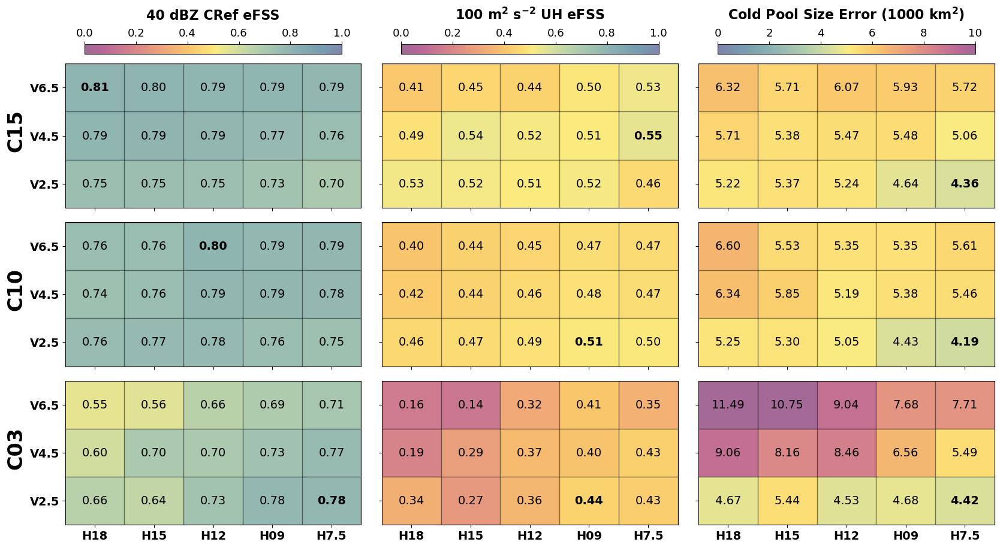

In [112]:
def top_colorbar(ax, c, label, ticks=[]):
    pos=ax.get_position()

    cbar_left   = pos.x0 +.016
    cbar_bottom = pos.y1 + 0.016       # slightly above the axes
    cbar_width  = (pos.x1 - pos.x0) - 0.016*2 # span full width of both
    cbar_height = 0.016  
    cax = fig.add_axes([cbar_left, cbar_bottom, cbar_width, cbar_height])
    cbar =plt.colorbar(c, ax=ax, cax=cax,orientation='horizontal')
    cbar.set_label(label, labelpad=10, fontsize=16)
    cbar.ax.xaxis.set_ticks_position("top")
    cbar.ax.xaxis.set_label_position("top")
    if len(ticks)>0:
        cbar.set_ticks(ticks)
        cbar.set_ticklabels(ticks, fontsize=16)


hloc = [18, 15, 12, 9, 7]
vloc = [2,4,6]#[6, 4, 2]
freq = [15, 10, 3]
fcsts= [''] #['FORECAST_20240508_2100', '']
#fcsts = ['FORECAST_20240508_2100', '']


## eFSS stuff
var1, var2 = 'compdz', 'uh2to5'
thresh1, thresh2   = 40, 100
neighborhood_size = 24 # km 

rainbow = cmaps.pride_r.cut( .1,'right').cut( .1,'left')
rainbow_r = cmaps.pride.cut( .1,'right').cut( .1,'left')

#################################################################
fig, axes = plt.subplots(3,3, figsize=(20, 10), sharey=True, sharex=True)


hloc_i = range(len(hloc))
vloc_i = range(len(vloc))
gridx, gridy = np.meshgrid(hloc_i, vloc_i)

NR = xr.open_dataset('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc')
NRtime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in NR.dates.values[:]]
NR_size = NR.cp_size.values
NR.close()


for ci, c in enumerate(freq):

    temp_table = np.zeros([3, len(hloc), len(vloc)])
    
    for hi, h in enumerate(hloc):
        for vi, v in enumerate(vloc):
            for fcst in fcsts:

                path = os.path.join("/work/jessica.mcdonald/CM1_LETKF_2025/experiments/", f"C{c:02d}_H{h:02d}_V{v}/")
                
                try:
                    ds = xr.open_dataset(os.path.join(path, fcst, f'fss_{var1}.nc' ))
                    neighborhoods = ds.SCALES.values*1000
                    th_i = findnearest(ds.FCST_THLDS[0].values, thresh1)
                    n_i  = findnearest(neighborhoods, neighborhood_size)
                    temp_table[0, hi, vi] += np.mean(ds.EFSS[:,n_i, th_i].values)/len(fcsts)
                    #print(h, v, np.mean(ds.EFSS[:,n_i, th_i].values))
                    ds.close()
                except FileNotFoundError:
                    print('skip')
    
                try:
                    ds = xr.open_dataset(os.path.join(path, fcst, f'fss_{var2}.nc' ))
                    neighborhoods = ds.SCALES.values*1000
                    th_i = findnearest(ds.FCST_THLDS[0].values, thresh2)
                    n_i  = findnearest(neighborhoods, neighborhood_size)
                    temp_table[1, hi, vi] += np.mean(ds.EFSS[:,n_i, th_i].values)/len(fcsts)
                    ds.close()
                except FileNotFoundError:
                    print('skip')
    
                try:
                    cm1 = xr.open_dataset(os.path.join(path, fcst, f'full_ens_fcst.nc' ), decode_timedelta=True)
                    time = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
                    tis =[findnearest(NRtime, t) for t in time]
                    btis =[findnearest(NRtime, t) for t in time]
                    NRs = NR_size[tis][:, np.newaxis]
                    temp_table[2, hi, vi] += (np.nanmean((cm1.cp_size[:, :-1].values - NRs)/1000))/len(fcsts)
                    cm1.close()
                except FileNotFoundError:
                    print('skip')
            


    # within the CI loop, do the plotting
    temp_table[temp_table == 0] = np.nan
    im1 = axes[ci, 0].pcolormesh(gridx, gridy, temp_table[0].T, alpha=0.6, vmin=0, vmax=1, cmap=rainbow, shading='nearest')
    _   = axes[ci, 1].pcolormesh(gridx, gridy, temp_table[1].T, alpha=0.6, vmin=0, vmax=1, cmap=rainbow, shading='nearest')
    im3 = axes[ci, 2].pcolormesh(gridx, gridy, temp_table[2].T, alpha=0.6, vmin=0, vmax=10, cmap=rainbow_r, shading='nearest')

    print('break')


    #### print numbers in table
    for i in range(np.shape(temp_table)[0]):
        for hi, h in enumerate(hloc):
            for vi, v in enumerate(vloc):
               
                best = np.nanmax(temp_table[i])
                if i == 2: best = np.nanmin(temp_table[i])

                weight='normal'
                if temp_table[i, hi, vi] == best: weight='bold'

                axes[ci, i].text(hi, vi, f'{temp_table[i, hi, vi]:.2f}', ha='center', va='center', weight=weight, fontsize=14)


    ####### set cycling interval label
    axes[ci, 0].set_title(f'C{c:02d}', loc='left', y=0.5,x=-0.2, va='center', rotation=90, fontsize=24)


#### label axes and make grid lines
for ax in axes.flatten():
    ax.set_xticks(hloc_i,[rename(f'C03_H{m:02d}_V4', version='H').split('-')[1] for m in hloc], weight='bold', fontsize=14)
    ax.set_yticks(vloc_i,[rename(f'C03_H09_V{m}', version='V').split('-')[1] for m in vloc], weight='bold', fontsize=14)

    _=[ax.axvline(hl+.5, color='k', alpha=0.5, lw=1) for hl in hloc_i]
    _=[ax.axhline(vl+.5, color='k', alpha=0.5, lw=1) for vl in vloc_i]
    ax.set_xlim(-0.5, len(hloc)-0.5)
    ax.set_ylim(-0.5, len(vloc)-0.5)
plt.subplots_adjust(hspace=0.1, wspace=0.07)

plt.draw()

# titles and colorbars
unit = r'm$\mathbf{^2}$ s$\mathbf{^{-2}}$'
labels = ['40 dBZ CRef eFSS',f'100 {unit} UH eFSS', 'Cold Pool Size Error '+r'(1000 km$\mathbf{^2}$)', ]

top_colorbar(axes[0,0], im1, labels[0])
top_colorbar(axes[0,1], im1, labels[1])
top_colorbar(axes[0,2], im3, labels[2])


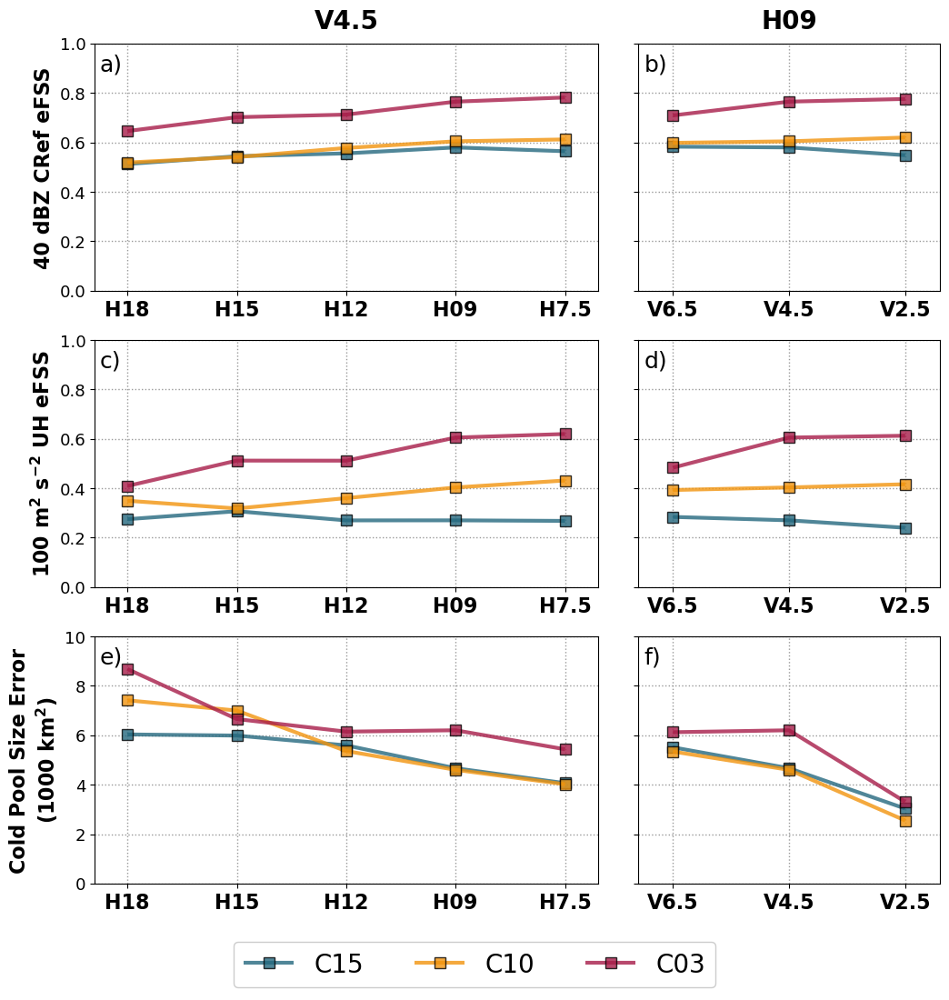

In [94]:
import cmocean as cmo
fig, axes = plt.subplots(3,2, figsize=(12, 12),gridspec_kw={'width_ratios': [5,3]}, sharey='row')

hloc = [18,15,12,9,7]
vloc =[6,4,2]
cint = [15,10,3]

hloc_i = np.arange(0, len(hloc))
vloc_i = np.arange(0, len(vloc))
colors = cmaps.pride([0.2, 0.6, 0.8])

fcsts = ['FORECAST_20240508_2100', '']

NR = xr.open_dataset('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc')
NRtime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in NR.dates.values[:]]
NR_size = NR.cp_size.values
NR.close()

var1 = 'compdz'
var2 = 'uh2to5'

thresh1   = 40 # dbz
thresh2   = 100 # dbz
neighborhood_size = 24 # km 


ls     = '-'
lw     = 3
alpha  = 0.8
marker = 's'
ms     = 9

for ci, c in enumerate(cint):
    
    arr1 = np.zeros([len(hloc)])
    arr2 = np.zeros([len(hloc)])
    arr3 = np.zeros([len(hloc)])
    for fi, fcst in enumerate(fcsts):
        for hi, h in enumerate(hloc):
            
            path = os.path.join("/work/jessica.mcdonald/CM1_LETKF_2025/experiments/", f"C{c:02d}_H{h:02d}_V4/")
    
            ds = xr.open_dataset(os.path.join(path, fcst, f'fss_{var1}.nc' ))
            neighborhoods = ds.SCALES.values*1000
            th_i = findnearest(ds.FCST_THLDS[0].values, thresh1)
            n_i  = findnearest(neighborhoods, neighborhood_size)
            arr1[hi] += np.mean(ds.EFSS[:,n_i, th_i].values)/len(fcsts)
            ds.close()

            ds = xr.open_dataset(os.path.join(path, fcst, f'fss_{var2}.nc' ))
            neighborhoods = ds.SCALES.values*1000
            th_i = findnearest(ds.FCST_THLDS[0].values, thresh2)
            n_i  = findnearest(neighborhoods, neighborhood_size)
            arr2[hi] += np.mean(ds.EFSS[:,n_i, th_i].values)/len(fcsts)
            ds.close()
            
            cm1 = xr.open_dataset(os.path.join(path, fcst, f'full_ens_fcst.nc' ), decode_timedelta=True)
            time = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
            tis =[findnearest(NRtime, t) for t in time]
            btis =[findnearest(NRtime, t) for t in time]
            NRs = NR_size[tis][:, np.newaxis]
            arr3[hi] += (np.nanmean((cm1.cp_size[:, :-1].values - NRs)/1000))/len(fcsts)
            cm1.close()
            
    name = rename(f"C{c:02d}_H{h:02d}_V4/", version='CI')
    axes[0,0].plot(hloc_i, arr1, color=colors[ci], ls=ls, marker=marker,markersize=ms,markeredgecolor='k', linewidth=lw, alpha=alpha, label=name)
    axes[1,0].plot(hloc_i, arr2, color=colors[ci], ls=ls, marker=marker,markersize=ms,markeredgecolor='k', linewidth=lw, alpha=alpha, label=name)
    axes[2,0].plot(hloc_i, arr3, color=colors[ci], ls=ls, marker=marker,markersize=ms,markeredgecolor='k', linewidth=lw, alpha=alpha, label=name)

for ci, c in enumerate(cint):
    
    arr1 = np.zeros([len(vloc)])
    arr2 = np.zeros([len(vloc)])
    arr3 = np.zeros([len(vloc)])
    for fi, fcst in enumerate(fcsts):
        for hi, h in enumerate(vloc):
            
            path = os.path.join("/work/jessica.mcdonald/CM1_LETKF_2025/experiments/", f"C{c:02d}_H09_V{h}/")
    
            ds = xr.open_dataset(os.path.join(path, fcst, f'fss_{var1}.nc' ))
            neighborhoods = ds.SCALES.values*1000
            th_i = findnearest(ds.FCST_THLDS[0].values, thresh1)
            n_i  = findnearest(neighborhoods, neighborhood_size)
            arr1[hi] += np.mean(ds.EFSS[:,n_i, th_i].values)/len(fcsts)
            ds.close()

            ds = xr.open_dataset(os.path.join(path, fcst, f'fss_{var2}.nc' ))
            neighborhoods = ds.SCALES.values*1000
            th_i = findnearest(ds.FCST_THLDS[0].values, thresh2)
            n_i  = findnearest(neighborhoods, neighborhood_size)
            arr2[hi] += np.mean(ds.EFSS[:,n_i, th_i].values)/len(fcsts)
            ds.close()

            cm1 = xr.open_dataset(os.path.join(path, fcst, f'full_ens_fcst.nc' ), decode_timedelta=True)
            time = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
            tis =[findnearest(NRtime, t) for t in time]
            btis =[findnearest(NRtime, t) for t in time]
            NRs = NR_size[tis][:, np.newaxis]
            arr3[hi] += (np.nanmean((cm1.cp_size[:, :-1].values - NRs)/1000))/len(fcsts)
            cm1.close()
    name = rename(f"C{c:02d}_H{h:02d}_V4/", version='CI')
    axes[0,1].plot(vloc_i, arr1, color=colors[ci], ls=ls, marker=marker, markersize=ms,markeredgecolor='k', linewidth=lw, alpha=alpha, label=name)
    axes[1,1].plot(vloc_i, arr2, color=colors[ci], ls=ls, marker=marker, markersize=ms,markeredgecolor='k', linewidth=lw, alpha=alpha, label=name)
    axes[2,1].plot(vloc_i, arr3, color=colors[ci], ls=ls, marker=marker, markersize=ms,markeredgecolor='k', linewidth=lw, alpha=alpha, label=name)

######################


unit = r'm$\mathbf{^2}$ s$\mathbf{^{-2}}$'
labels = ['40 dBZ CRef eFSS',f'100 {unit} UH eFSS', 'Cold Pool Size Error\n'+r'(1000 km$\mathbf{^2}$)', ]

for ai,axs in enumerate(axes):
    axs[0].set_ylabel(labels[ai], fontsize=16)
    axs[0].set_xticks(x_h[0],[rename(f'C03_H{m:02d}_V4', version='H').split('-')[1] for m in hloc], weight='bold', fontsize=16)
    axs[1].set_xticks(x_h2[0],[rename(f'C03_H09_V{m}', version='V').split('-')[1] for m in vloc], weight='bold', fontsize=16)
    

for ai, axs in enumerate(axes.flatten()):
    axs.grid()
    if ai %2 == 0:
        axs.text(0.01, 0.96, chr(ord('`')+ai+1)+')',  ha='left', va='top', transform=axs.transAxes, fontsize=18)
        axs.set_xlim(-0.3, 4.3)
    else:
        axs.text(0.02, 0.96, chr(ord('`')+ai+1)+')',  ha='left', va='top', transform=axs.transAxes, fontsize=18)
        axs.set_xlim(-0.3, 2.3)


axes[0,0].set_ylim(0,1)
axes[1,0].set_ylim(0,1)
axes[2,0].set_ylim(0, 10)

plt.subplots_adjust(wspace=.1)

axes[0,0].set_title('V4.5', y=1.03, fontsize=20)
axes[0,1].set_title('H09' , y=1.03, fontsize=20)

# axes[0,0].legend(loc='upper center', ncol=3, fontsize=14, columnspacing=1)
# axes[0,1].legend(loc='upper center', ncol=3, fontsize=14, columnspacing=1)

handles, labels =axes[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, fontsize=20)


FIGNAME = 'AllExps'
plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')


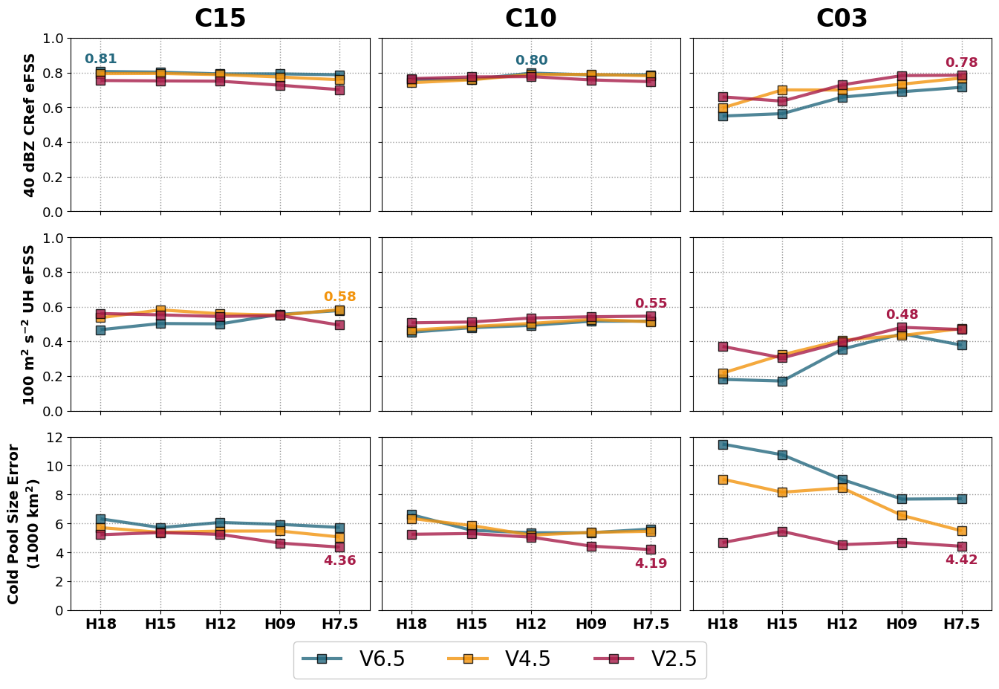

In [15]:

hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]
freq = [15,10,3]#[15, 10, 3]
fcsts= ['']
#fcsts = ['FORECAST_20240508_2100']
#fcsts = ['FORECAST_20240508_2100', '']


## eFSS stuff
var1, var2 = 'compdz', 'uh2to5'
thresh1, thresh2   = 40, 75
neighborhood_size = 24 # km 



#################################################################
fig, axes = plt.subplots(3,3, figsize=(16, 10), sharey='row', sharex=True)


hloc_i = range(len(hloc))
vloc_i = range(len(vloc))
gridx, gridy = np.meshgrid(hloc_i, vloc_i)

NR = xr.open_dataset('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc')
NRtime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in NR.dates.values[:]]
NR_size = NR.cp_size.values
NR.close()

colors = list(cmaps.pride([.2, .6, .8]))


ls     = '-'
lw     = 3
alpha  = 0.8
marker = 's'
ms     = 8

for ci, c in enumerate(freq):

    temp_table = np.zeros([3, len(hloc), len(vloc)])
    for vi, v in enumerate(vloc):
        
        for hi, h in enumerate(hloc):
        
            for fcst in fcsts:

                path = os.path.join("/work/jessica.mcdonald/CM1_LETKF_2025/experiments/", f"C{c:02d}_H{h:02d}_V{v}/")
                
                try:
                    ds = xr.open_dataset(os.path.join(path, fcst, f'fss_{var1}.nc' ))
                    neighborhoods = ds.SCALES.values*1000
                    th_i = findnearest(ds.FCST_THLDS[0].values, thresh1)
                    n_i  = findnearest(neighborhoods, neighborhood_size)
                    temp_table[0, hi, vi] += np.mean(ds.EFSS[:,n_i, th_i].values)/len(fcsts)
                    #print(h, v, np.mean(ds.EFSS[:,n_i, th_i].values))
                    ds.close()
                except FileNotFoundError:
                    pass
    
                try:
                    ds = xr.open_dataset(os.path.join(path, fcst, f'fss_{var2}.nc' ))
                    neighborhoods = ds.SCALES.values*1000
                    th_i = findnearest(ds.FCST_THLDS[0].values, thresh2)
                    n_i  = findnearest(neighborhoods, neighborhood_size)
                    temp_table[1, hi,vi] += np.mean(ds.EFSS[:,n_i, th_i].values)/len(fcsts)
                    ds.close()
                except FileNotFoundError:
                    pass
    
                try:
                    cm1 = xr.open_dataset(os.path.join(path, fcst, f'full_ens_fcst.nc' ), decode_timedelta=True)
                    time = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
                    tis =[findnearest(NRtime, t) for t in time]
                    btis =[findnearest(NRtime, t) for t in time]
                    NRs = NR_size[tis][:, np.newaxis]
                    temp_table[2, hi,vi] += (np.nanmean((cm1.cp_size[:, :-1].values - NRs)/1000))/len(fcsts)
                    cm1.close()
                except FileNotFoundError:
                    pass


    temp_table[temp_table == 0] = np.nan
    
    # once table has been contructed, loop over vloc again so that you can find the "best"
    for i in range(3):
        axes[i, ci].grid()
        for vi, v in enumerate(vloc):
            name = rename(f'C03_H09_V{v}', version='V').split('-')[1]
            axes[i, ci].plot(hloc_i, temp_table[i,:,vi], color=colors[vi], ls=ls, marker=marker,markersize=ms,markeredgecolor='k', linewidth=lw, alpha=alpha, label=name)

        if i < 2: 
            best = np.nanmax(temp_table[i])
            hl,vl = np.where(temp_table[i] == best)
            axes[i,ci].text(hl, best+.05,  f'{best:.2f}', weight='bold', color=colors[vl[0]], ha='center' ,fontsize=13)

            # # add a scatter colored by best vloc
            # color_i = np.argmax(temp_table[i,:], axis=1)
            # axes[i, ci].scatter(hloc_i, [0.1]*len(hloc), marker='o', color = [colors[i] for i in color_i],s=50, alpha=0.5,
            #                     transform = transforms.blended_transform_factory(axes[i, ci].transData,axes[i, ci].transAxes))
        if i == 2: 
            best = np.nanmin(temp_table[i])
            hl,vl = np.where(temp_table[i] == best)
            axes[i,ci].text(hl, best-.5, f'{best:.2f}', weight='bold', color=colors[vl[0]], ha='center' ,va='top',fontsize=13)

            # color_i = np.argmin(temp_table[i,:], axis=1)
            # axes[i, ci].scatter(hloc_i, [0.1]*len(hloc), marker='o', color = [colors[i] for i in color_i],s=50, alpha=0.5,
            #                     transform = transforms.blended_transform_factory(axes[i, ci].transData,axes[i, ci].transAxes))


                

axes[0,0].set_ylim(0,1)
axes[1,0].set_ylim(0,1)
axes[2,0].set_ylim(0,12)

    
for ax in axes.flatten():
    ax.set_xticks(hloc_i,[rename(f'C03_H{m:02d}_V4', version='H').split('-')[1] for m in hloc], weight='bold', fontsize=14)
    ax.set_xlim(-0.5, len(hloc)-0.5)


unit = r'm$\mathbf{^2}$ s$\mathbf{^{-2}}$'
labels = ['40 dBZ CRef eFSS',f'100 {unit} UH eFSS', 'Cold Pool Size Error\n'+r'(1000 km$\mathbf{^2}$)', ]

for ci,c in enumerate(freq):

    # set titles
    axes[0, ci].set_title(rename(f'C{c:02d}_H09_V4', version='CI'), weight='bold', fontsize=24, y=1.03)

    # set ylabels
    axes[ci, 0].set_ylabel(labels[ci], fontsize=14)
plt.subplots_adjust(hspace=0.15, wspace=0.04)


handles, labels =axes[2,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, fontsize=20)


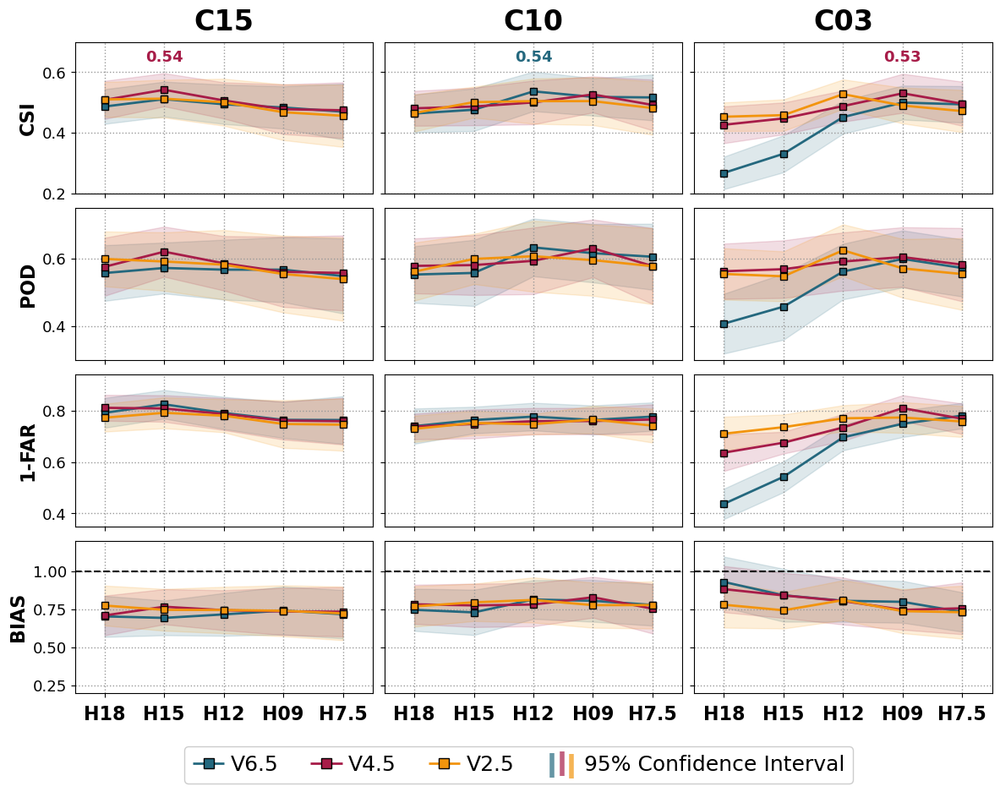

In [6]:

hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]
freq = [15, 10,  3]
fcsts= [''] 
#fcsts = ['FORECAST_20240508_2100']
fcsts = ['FORECAST_20240508_2100', '']


## eFSS stuff
var = 'UH'
thresh = 100

# var = 'compdbz'
# thresh = 40


################ calculate for bootstrapping
interval = 95

n = 36 #* 13 * len(fcsts) # number of ensemble members * number of timesteps * number of forecasts
n_boot = 10000

indices = generate_bootstrap_indices(n, n_boot, seed=42)


#################################################################
#fig, axes = plt.subplots(4,3, figsize=(16, 10), sharey='row', sharex=True)


if len (freq) == 3:
    fig, axes = plt.subplots(4,3, figsize=(14, 10), sharey='row', sharex=True)
else:
    fig, axes = plt.subplots(4,4, figsize=(19, 10), sharey='row', sharex=True)


hloc_i = range(len(hloc))
vloc_i = range(len(vloc))
gridx, gridy = np.meshgrid(hloc_i, vloc_i)

colors = list(cmaps.pride([.2, .8, .6]))#[::-1]

# colors = cmaps.pride([ 0.15, 0.28, 0.4])[::-1]
#colors = cmaps.pride([ .6, .75, .9])


ls     = '-'
lw     = 2
alpha  = 1#0.8
marker = 's'
ms     = 6

for ci, c in enumerate(freq):

    temp_table = np.zeros([4, len(hloc), len(vloc)])*np.nan
    ci_table  =  np.zeros([4, len(hloc), len(vloc)])*np.nan

    for vi, v in enumerate(vloc):
        for hi, h in enumerate(hloc):

            try:
                fulla, fullb, fullc = np.zeros(36),np.zeros(36),np.zeros(36)
                for f,fcst in enumerate(fcsts):
    
                    exp = f"C{c:02d}_H{h:02d}_V{v}/"
                    perf = xr.open_dataset(os.path.join('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/',exp, fcst, f'performance_{var}_{thresh}.nc' ))
                
                    ap,bp,cp = perf['hits'][-13:].values, perf['false_alarms'][-13:].values,perf['misses'][-13:].values
                    perf.close()
                    fulla+= np.sum(ap, axis=0) 
                    fullb+= np.sum(bp, axis=0)
                    fullc+= np.sum(cp, axis=0)
    
                
                csi_vals, pod_vals, far_vals, bias_vals = bootstrap_from_indices(np.array(fulla).flatten(),
                                                                                 np.array(fullc).flatten(),
                                                                                 np.array(fullb).flatten(),
                                                                                 indices)
    
                ci_table[1, hi, vi] = compute_ci_perc(pod_vals , interval)
                ci_table[2, hi, vi] = compute_ci_perc(far_vals , interval) # you can use these for SRATIO just fine
                ci_table[0, hi, vi] = compute_ci_perc(csi_vals , interval)
                ci_table[3, hi, vi] = compute_ci_perc(bias_vals, interval)
    
    
                ## note that these are out of order
                sa, sb, sc = np.sum(fulla), np.sum(fullb), np.sum(fullc)
                temp_table[1, hi, vi] = sa/(sa+sc)                                             #  POD          
                temp_table[2, hi, vi] = 1-(sb/(sa+sb))                                         #  SUCCESS RATIO (1-FAR)
                temp_table[0, hi, vi] = calc_csi(temp_table[1, hi, vi],temp_table[2, hi, vi])  #  CRITICAL SUCCESS INCDEX
                temp_table[3, hi, vi] = temp_table[1, hi, vi]/temp_table[2, hi, vi]            #  BIAS (POD/ SR)
            except:
                for i in range(4): temp_table[i, hi, vi] == np.nan

 #once table has been contructed, loop over vloc again so that you can find the "best"
    for i in range(4):
        axes[i, ci].grid()
        for vi, v in enumerate(vloc):
            name = rename(f'C03_H09_V{v}', version='V').split('-')[1]

            y0, y1 = temp_table[i,:,vi] - ci_table[i,:,vi],temp_table[i,:,vi] + ci_table[i,:,vi]
            axes[i, ci].fill_between(hloc_i, y0,y1, color=colors[vi],alpha=0.15, zorder=0)
            #axes[i, ci].errorbar(np.array(hloc_i), temp_table[i,:,vi], yerr=ci_table[i,:,vi], marker='s', ms=0,mec='k', lw=0,color=colors[vi], elinewidth=2,capsize=6, label=name, zorder=0)
            axes[i, ci].plot(hloc_i, temp_table[i,:,vi], color=colors[vi], ls=ls, marker=marker,markersize=ms,markeredgecolor='k', linewidth=lw, alpha=alpha, label=name)

        if i == 0: 
            best = np.nanmax(temp_table[i])
            hl,vl = np.where(temp_table[i] == best)
            axes[i,ci].text(hl, .95,  f'{best:.2f}', weight='bold', color=colors[vl[0]], ha='center',va='top',fontsize=13,transform = transforms.blended_transform_factory(axes[i, ci].transData,axes[i, ci].transAxes))
        


    # for i in range(4):
    #     axes[i, ci].grid()#axis='y')
    #     shift = .18
    #     for vi, v in enumerate(vloc):
    #         name = rename(f'C03_H09_V{v}', version='V').split('-')[1]
    
    #         xoff = shift * (vi - 1)
    #         axes[i, ci].errorbar(np.array(hloc_i)+xoff, temp_table[i,:,vi], yerr=ci_table[i,:,vi], marker='s', ms=0,mec='k', lw=0,color=colors[vi], elinewidth=4,capsize=0, label=name, alpha=0.7)
    #         axes[i, ci].plot(np.array(hloc_i)+xoff, temp_table[i,:,vi], color=colors[vi], ls=ls, marker=marker,markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)


    #     if i == 0: 
    #         best = np.nanmax(temp_table[i])
    #         hl,vl = np.where(temp_table[i] == best)
    #         axes[i,ci].text(hl, .95,  f'{best:.2f}', weight='bold', color=colors[vl[0]], ha='center',va='top',fontsize=13,transform = transforms.blended_transform_factory(axes[i, ci].transData,axes[i, ci].transAxes))
        

   
                
# limits
axes[0,0].set_ylim(.2,.7)
axes[1,0].set_ylim(.3,.75)
axes[2,0].set_ylim(.35,.94)

if var == 'compdbz':axes[3,0].set_ylim(0.2,2.3)
if var == 'UH':axes[3,0].set_ylim(0.2,1.2)
    
for ax in axes[3,:]: ax.axhline(1, color='k', ls='--')


# set xticks
for ax in axes.flatten():
    ax.set_xticks(hloc_i,[rename(f'C03_H{m:02d}_V4', version='H').split('-')[1] for m in hloc], weight='bold', fontsize=16)#, pad=10)
    ax.set_xlim(-0.5, len(hloc)-0.5)
    #_=[ax.axvline(hl+.5, color='k', alpha=0.1, lw=1) for hl in hloc_i]
    ax.tick_params(axis='x', which='major', pad=7)

# label y axis
labels = ['CSI', 'POD', '1-FAR','BIAS' ]
for ai,axs in enumerate(axes):
    axs[0].set_ylabel(labels[ai], fontsize=16)

# set titles
for ci,c in enumerate(freq):    
    axes[0, ci].set_title(rename(f'C{c:02d}_H09_V4', version='CI'), weight='bold', fontsize=24,  y=1.03)

    
plt.subplots_adjust(hspace=0.1, wspace=0.04)


axes[2,0].scatter(1.5, 1.5, marker='|', linewidth=4, s=200, color='w', alpha=0.7, label='95% Confidence Interval')
handles, labels =axes[2,0].get_legend_handles_labels()
new_handles,new_labels = [handles[0],handles[1],handles[2],(handles[3])], [labels[0], labels[1],labels[2], labels[3]]
leg=fig.legend(new_handles, new_labels, fontsize=18, scatterpoints=3, markerscale=1.5, loc='lower center', bbox_to_anchor=(0.5, -.01), ncol=4, columnspacing=1.5, handletextpad=.3, handlelength=1.5)

#leg=fig.legend(new_handles, new_labels, fontsize=20, scatterpoints=3, markerscale=1.5, loc='upper center', bbox_to_anchor=(0.5, .95), ncol=4, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
leg.legend_handles[3].set_facecolors(colors)




# All Bar Charts (Analysis RMSE, FSS/cold pool, CSI, balance)

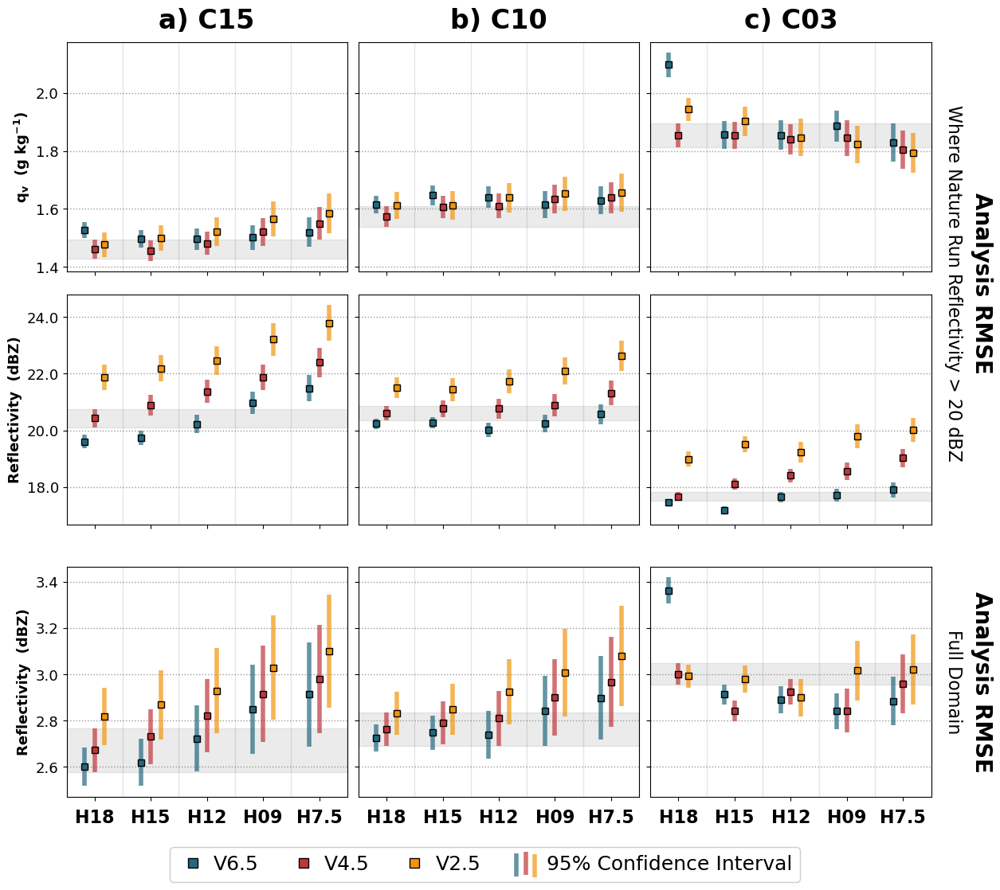

In [2]:

hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]
freq = [15,10,3]#[15, 10, 3]



## eFSS stuff
var1, var2 = 'compdz', 'uh2to5'
thresh1, thresh2   = 40, 75
neighborhood_size = 24 # km 

n = 36
max_index = 36
n_boot = 10000
indices = generate_bootstrap_indices(n, max_index, n_boot, seed=42)
interval = 95

#################################################################


hloc_i = range(len(hloc))
vloc_i = range(len(vloc))
gridx, gridy = np.meshgrid(hloc_i, vloc_i)

units   = {'u': r'm s$\mathbf{^{-1}}$', 'v': r'm s$\mathbf{^{-1}}$', 'w': r'm s$\mathbf{^{-1}}$', 'th':'K', 'qv': r'g kg$\mathbf{^{-1}}$', 'dbz':'dBZ','dbz_20dbz':'dBZ'}
titles  = {'u': 'U', 'v':'V', 'w': 'W', 'th':r'$\mathbf{\theta}$', 'qv': r'q$_{\mathbf{v}}$', 'dbz':'Reflectivity', 'dbz_20dbz':'Reflectivity'}

NR = xr.open_dataset('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc')
NRtime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in NR.dates.values[:]]
NR_size = NR.cp_size.values
NR.close()

colors = list(cmaps.pride([.2, .75, .6]))


ls     = '-'
lw     = 3
alpha  = 0.8
marker = 's'
ms     = 6

allvars = ['qv_20dbz', 'dbz_20dbz', 'dbz']

#allvars = ['w', 'dbz']



if len (freq) == 3:
    fig, axes = plt.subplots(len(allvars),3, figsize=(14, 12), sharey='row', sharex=True)
else:
    fig, axes = plt.subplots(len(allvars),4, figsize=(19, 12), sharey='row', sharex=True)



for ci, c in enumerate(freq):

    temp_table = np.zeros([6, len(hloc), len(vloc)])
    ci_table   = np.zeros([6, len(hloc), len(vloc)])
    for vi, v in enumerate(vloc):
        
        for hi, h in enumerate(hloc):

            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{c:02d}_H{h:02d}_V{v}/RMSE_all_members.nc")[0]
            ds = xr.open_dataset(path, decode_timedelta=True)

            for ii, var in enumerate(allvars):

                #var = var+'_20dbz'
                
                temp_table[ii, hi, vi] = ds[var][:,:-1].mean()
                ci_table[ii, hi, vi] = compute_ci_perc(bootstrap_fss_from_indices(ds[var][:,:-1].values.mean(axis=0), indices), interval)
            ds.close()

    
            # except:
            #     temp_table[0, hi, vi] =np.nan
            #     temp_table[1, hi, vi] =np.nan
            #     temp_table[2, hi, vi] =np.nan
            #     ci_table[0, hi, vi]   =np.nan
            #     ci_table[1, hi, vi]   =np.nan
            #     ci_table[2, hi, vi]   =np.nan
                

    temp_table[temp_table == 0] = np.nan

    for i in range(len(allvars)):

        axes[i, 0].set_ylabel( f"{titles[allvars[i].replace('_20dbz', '')]}  ({units[allvars[i].replace('_20dbz', '')]})")
        axes[i, ci].grid(axis='y')
        shift = .18
        for vi, v in enumerate(vloc):
            name = rename(f'C03_H09_V{v}', version='V').split('-')[1]
    
            xoff = shift * (vi - 1)
            axes[i, ci].errorbar(np.array(hloc_i)+xoff, temp_table[i,:,vi], yerr=ci_table[i,:,vi], marker='s', ms=0,mec='k', lw=0,color=colors[vi], elinewidth=4,capsize=0, label=name, alpha=0.7)
            axes[i, ci].plot(np.array(hloc_i)+xoff, temp_table[i,:,vi], color=colors[vi], ls=ls, marker=marker,markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)

            if v == 4:
                conh = findnearest(hloc, 18)
                axes[i, ci].axhspan(temp_table[i,conh,vi]-ci_table[i,conh,vi],temp_table[i,conh,vi]+ci_table[i,conh,vi], alpha=0.08, color='k')#alpha=0.1, color=colors[vi])


plt.subplots_adjust(hspace=0.10, wspace=0.04)

for ax in axes.flatten():
    ax.set_xticks(hloc_i,[rename(f'C03_H{m:02d}_V4', version='H').split('-')[1] for m in hloc], weight='bold', fontsize=16)#, pad=10)
    ax.set_xlim(-0.5, len(hloc)-0.5)
    _=[ax.axvline(hl+.5, color='k', alpha=0.1, lw=1) for hl in hloc_i]
    ax.tick_params(axis='x', which='major', pad=7)
    ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:.1f}'))


plt.draw()

### add space betweent he plots
for ax in axes[2,:].flatten():
    pos = ax.get_position()
    pos.y0 = pos.y0 -.02
    pos.y1 = pos.y1 -.02
    ax.set_position(pos)
fig.canvas.draw()


    
xt, yt = centered_on_axes(axes, 0)
fig.text(xt+.02+.025, yt, 'Analysis RMSE', ha='center', va='center', rotation=-90, weight='bold', fontsize=20);
fig.text(xt+.02, yt, 'Where Nature Run Reflectivity > 20 dBZ', ha='center', va='center', rotation=-90, fontsize=16);

xt, yt = centered_on_axes(axes, -1, version = 'on')
fig.text(xt+.02+.025, yt, 'Analysis RMSE', ha='center', va='center', rotation=-90, weight='bold', fontsize=20);
fig.text(xt+.02, yt, 'Full Domain', ha='center', va='center', rotation=-90, fontsize=16);


# set titles
for ci,c in enumerate(freq):    axes[0, ci].set_title(chr(ord('`')+ci+1)+') '+rename(f'C{c:02d}_H09_V4', version='CI'), weight='bold', fontsize=24,  y=1.03)


axes[0,0].scatter(-1.5, np.nanmean(temp_table[0]), marker='|', linewidth=4, s=200, color='w', alpha=0.7, label='95% Confidence Interval')
handles, labels =axes[0,0].get_legend_handles_labels()
new_handles,new_labels = [handles[0],handles[1],handles[2],(handles[3])], [labels[0], labels[1],labels[2], labels[3]]
leg=fig.legend(new_handles, new_labels, fontsize=18, scatterpoints=3, markerscale=1.5, loc='lower center', bbox_to_anchor=(0.5, -.01), ncol=4, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
leg.legend_handles[3].set_facecolors(colors)



# FIGNAME = 'AnalysisRMSE'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')


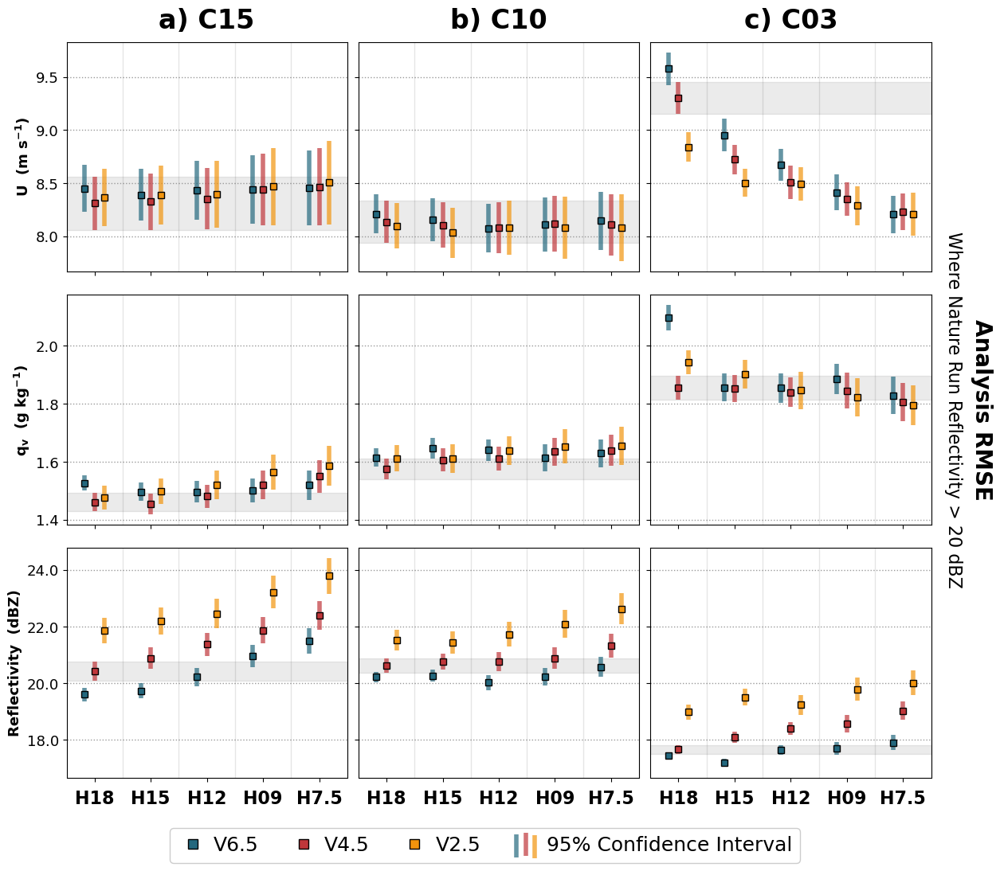

In [70]:

hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]
freq = [15,10,3]#[15, 10, 3]



## eFSS stuff
var1, var2 = 'compdz', 'uh2to5'
thresh1, thresh2   = 40, 75
neighborhood_size = 24 # km 

n = 36
max_index = 36
n_boot = 10000
indices = generate_bootstrap_indices(n, max_index, n_boot, seed=42)
interval = 95

#################################################################


hloc_i = range(len(hloc))
vloc_i = range(len(vloc))
gridx, gridy = np.meshgrid(hloc_i, vloc_i)

units   = {'u': r'm s$\mathbf{^{-1}}$', 'v': r'm s$\mathbf{^{-1}}$', 'w': r'm s$\mathbf{^{-1}}$', 'th':'K', 'qv': r'g kg$\mathbf{^{-1}}$', 'dbz':'dBZ','dbz_20dbz':'dBZ'}
titles  = {'u': 'U', 'v':'V', 'w': 'W', 'th':r'$\mathbf{\theta}$', 'qv': r'q$_{\mathbf{v}}$', 'dbz':'Reflectivity', 'dbz_20dbz':'Reflectivity'}

NR = xr.open_dataset('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc')
NRtime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in NR.dates.values[:]]
NR_size = NR.cp_size.values
NR.close()

colors = list(cmaps.pride([.2, .75, .6]))


ls     = '-'
lw     = 3
alpha  = 0.8
marker = 's'
ms     = 6

allvars = ['u_20dbz', 'qv_20dbz', 'dbz_20dbz']

#allvars = ['w', 'dbz']



if len (freq) == 3:
    fig, axes = plt.subplots(len(allvars),3, figsize=(14, 12), sharey='row', sharex=True)
else:
    fig, axes = plt.subplots(len(allvars),4, figsize=(19, 12), sharey='row', sharex=True)



for ci, c in enumerate(freq):

    temp_table = np.zeros([6, len(hloc), len(vloc)])
    ci_table   = np.zeros([6, len(hloc), len(vloc)])
    for vi, v in enumerate(vloc):
        
        for hi, h in enumerate(hloc):

            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{c:02d}_H{h:02d}_V{v}/RMSE_all_members.nc")[0]
            ds = xr.open_dataset(path, decode_timedelta=True)
            #ti = findnearest(ds.time.values, 120)

            for ii, var in enumerate(allvars):

                #var = var+'_20dbz'
                
                temp_table[ii, hi, vi] = ds[var][:,:-1].mean()
                ci_table[ii, hi, vi] = compute_ci_perc(bootstrap_fss_from_indices(ds[var][:,:-1].values.mean(axis=0), indices), interval)
            ds.close()

    
            # except:
            #     temp_table[0, hi, vi] =np.nan
            #     temp_table[1, hi, vi] =np.nan
            #     temp_table[2, hi, vi] =np.nan
            #     ci_table[0, hi, vi]   =np.nan
            #     ci_table[1, hi, vi]   =np.nan
            #     ci_table[2, hi, vi]   =np.nan
                

    temp_table[temp_table == 0] = np.nan

    for i in range(len(allvars)):

        axes[i, 0].set_ylabel( f"{titles[allvars[i].replace('_20dbz', '')]}  ({units[allvars[i].replace('_20dbz', '')]})")
        axes[i, ci].grid(axis='y')
        shift = .18
        for vi, v in enumerate(vloc):
            name = rename(f'C03_H09_V{v}', version='V').split('-')[1]
    
            xoff = shift * (vi - 1)
            axes[i, ci].errorbar(np.array(hloc_i)+xoff, temp_table[i,:,vi], yerr=ci_table[i,:,vi], marker='s', ms=0,mec='k', lw=0,color=colors[vi], elinewidth=4,capsize=0, label=name, alpha=0.7)
            axes[i, ci].plot(np.array(hloc_i)+xoff, temp_table[i,:,vi], color=colors[vi], ls=ls, marker=marker,markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)

            if v == 4:
                conh = findnearest(hloc, 18)
                axes[i, ci].axhspan(temp_table[i,conh,vi]-ci_table[i,conh,vi],temp_table[i,conh,vi]+ci_table[i,conh,vi], alpha=0.08, color='k')#alpha=0.1, color=colors[vi])


plt.subplots_adjust(hspace=0.10, wspace=0.04)

for ax in axes.flatten():
    ax.set_xticks(hloc_i,[rename(f'C03_H{m:02d}_V4', version='H').split('-')[1] for m in hloc], weight='bold', fontsize=16)#, pad=10)
    ax.set_xlim(-0.5, len(hloc)-0.5)
    _=[ax.axvline(hl+.5, color='k', alpha=0.1, lw=1) for hl in hloc_i]
    ax.tick_params(axis='x', which='major', pad=7)
    ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:.1f}'))


plt.draw()

### add space betweent he plots
# for ax in axes[2,:].flatten():
#     pos = ax.get_position()
#     pos.y0 = pos.y0 -.02
#     pos.y1 = pos.y1 -.02
#     ax.set_position(pos)
# fig.canvas.draw()


    
xt, yt = centered_on_axes(axes, 1, version='on')
fig.text(xt+.02+.025, yt, 'Analysis RMSE', ha='center', va='center', rotation=-90, weight='bold', fontsize=20);
fig.text(xt+.02, yt, 'Where Nature Run Reflectivity > 20 dBZ', ha='center', va='center', rotation=-90, fontsize=16);

# xt, yt = centered_on_axes(axes, -1, version = 'on')
# fig.text(xt+.02+.025, yt, 'Analysis RMSE', ha='center', va='center', rotation=-90, weight='bold', fontsize=20);
# fig.text(xt+.02, yt, 'Full Domain', ha='center', va='center', rotation=-90, fontsize=16);


# set titles
for ci,c in enumerate(freq):    axes[0, ci].set_title(chr(ord('`')+ci+1)+') '+rename(f'C{c:02d}_H09_V4', version='CI'), weight='bold', fontsize=24,  y=1.03)


axes[0,0].scatter(-1.5, np.nanmean(temp_table[0]), marker='|', linewidth=4, s=200, color='w', alpha=0.7, label='95% Confidence Interval')
handles, labels =axes[0,0].get_legend_handles_labels()
new_handles,new_labels = [handles[0],handles[1],handles[2],(handles[3])], [labels[0], labels[1],labels[2], labels[3]]
leg=fig.legend(new_handles, new_labels, fontsize=18, scatterpoints=3, markerscale=1.5, loc='lower center', bbox_to_anchor=(0.5, .01), ncol=4, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
leg.legend_handles[3].set_facecolors(colors)



# FIGNAME = 'AnalysisRMSE'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')


In [5]:
ti = findnearest(ds.time.values, 90)

array([ 30.,  33.,  36.,  39.,  42.,  45.,  48.,  51.,  54.,  57.,  60.,
        63.,  66.,  69.,  72.,  75.,  78.,  81.,  84.,  87.,  90.,  93.,
        96.,  99., 102., 105., 108., 111., 114., 117., 120.])

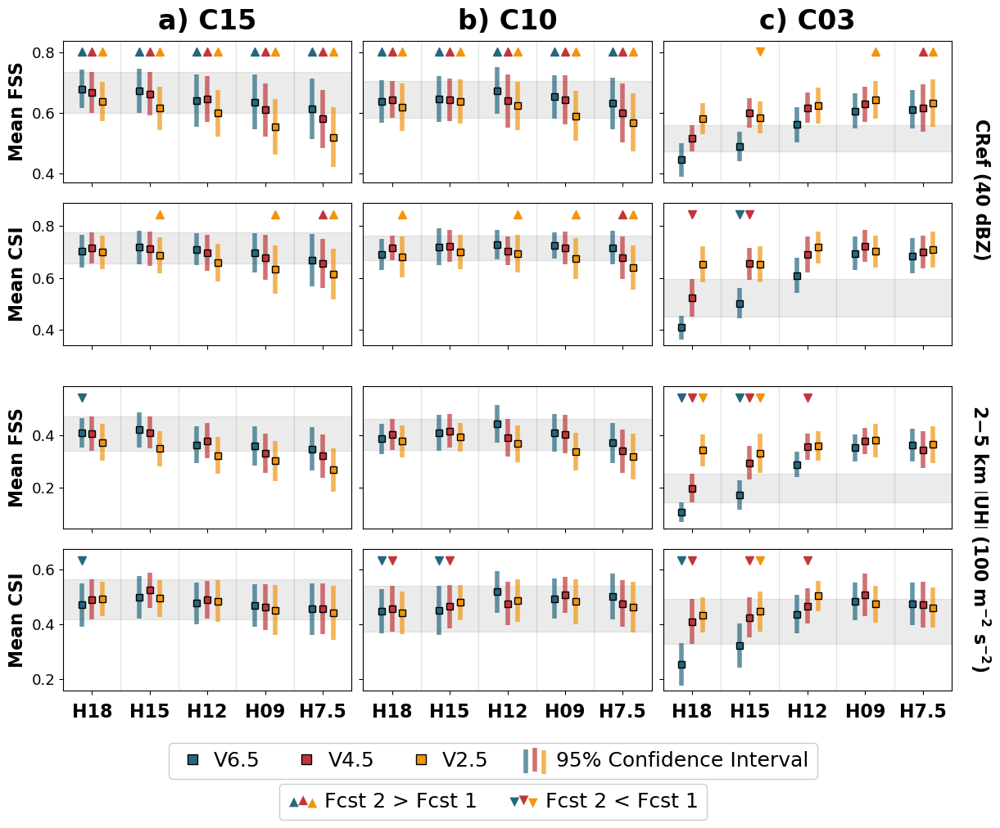

In [15]:

hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]
freq = [15,10,3]#[15, 10, 3]

freq=[15, 10, 3]
#freq=[3]
fcsts= ['']
#fcsts = ['FORECAST_20240508_2100']
fcsts = ['FORECAST_20240508_2100', '']


## eFSS stuff
myvars = ['compdz', 'uh2to5']
mythres  = [40, 100]
neighborhood_size = 24 # km 

n = 36#*len(fcsts)
max_index = 36*len(fcsts)
n_boot = 10000
indices = generate_bootstrap_indices(n, max_index, n_boot, seed=42)
interval = 95

#################################################################
if len (freq) == 3:
    fig, axes = plt.subplots(4,3, figsize=(14, 10), sharey='row', sharex=True)
else:
    fig, axes = plt.subplots(4,4, figsize=(19, 10), sharey='row', sharex=True)


hloc_i = range(len(hloc))
vloc_i = range(len(vloc))
gridx, gridy = np.meshgrid(hloc_i, vloc_i)
colors = list(cmaps.pride([.2, .75, .6]))


ls     = '-'
lw     = 3
alpha  = 0.8
#marker = 's'
ms     = 6

for ci, c in enumerate(freq):

    temp_table  = np.zeros([4, len(hloc), len(vloc)])
    stat_table  = np.zeros([4, len(hloc), len(vloc)])
    ci_table    = np.zeros([4, len(hloc), len(vloc)])

    for vi, v in enumerate(vloc):
        for hi, h in enumerate(hloc):
            for i,var in enumerate(myvars):

                exp =  f"C{c:02d}_H{h:02d}_V{v}/"

                # i should be (i*2) + 1

                axes[i*2, 0].set_ylabel(f'Mean FSS', fontsize=16)
                axes[(i*2)+1, 0].set_ylabel(f'Mean CSI', fontsize=16)
            


                ### the fss variable
                fss_vals, ci_val = generate_CI_FSS(exp, var, neighborhood=24, thresh=mythres[i], fcsts=fcsts, fcst_split=True, indices=indices)
    
                temp_table[i*2, hi, vi] = fss_vals[-1]
                ci_table[i*2, hi, vi]   =  ci_val
    
                if len(fcsts)>1:
                    
                    stat_table[i*2, hi, vi] = get_stat_difference_1val(fss_vals[0], fss_vals[1], ci_val)

                # the contigency table variable

                if var == 'uh2to5': var = 'UH'
                if var == 'compdz': var = 'compdbz'

                val_dct, ci_dct = generate_CI_contigency(exp, var, fcsts=fcsts, fcst_split=True)

                temp_table[(i*2)+1, hi, vi] =  val_dct['CSI'][-1]
                ci_table[(i*2)+1, hi, vi]   =  ci_dct['CSI']

                if len(fcsts)>1:
                    
                    stat_table[(i*2)+1, hi, vi] = get_stat_difference_1val( val_dct['CSI'][0],  val_dct['CSI'][1], ci_dct['CSI'])
    

                


    for i in range(4):
        #axes[i, ci].grid(axis='y')
        shift = .18
        for vi, v in enumerate(vloc):
            name = rename(f'C03_H09_V{v}', version='V').split('-')[1]
    
            xoff = shift * (vi - 1)
            axes[i, ci].errorbar(np.array(hloc_i)+xoff, temp_table[i,:,vi], yerr=ci_table[i,:,vi], marker='s', ms=0,mec='k', lw=0,color=colors[vi], elinewidth=4,capsize=0, label=name, alpha=0.7)
            axes[i, ci].plot(np.array(hloc_i)+xoff, temp_table[i,:,vi], color=colors[vi], ls=ls, marker='s',markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)

            if v == 4:
                conh = findnearest(hloc, 18)
                axes[i, ci].axhspan(temp_table[i,conh,vi]-ci_table[i,conh,vi],temp_table[i,conh,vi]+ci_table[i,conh,vi], alpha=0.08, color='k')#colors[vi])


            # now loop over 
            for hi, h in enumerate(hloc):
                # markerfacecolor=colors[vi]
                # marker = 'v'
                
                # if (stat_table[i, hi, vi] == 1) | (stat_table[i, hi, vi] == 0.5):
                #     marker = '^'
                # if (stat_table[i, hi, vi] == 0) |(stat_table[i, hi, vi] == 0.5):
                #     markerfacecolor = 'none'

                # axes[i, ci].plot(hi+xoff, .92, marker = marker, markeredgecolor=colors[vi], markerfacecolor=markerfacecolor, 
                #                  lw=0, markersize=7, transform = transforms.blended_transform_factory(axes[i, ci].transData,axes[i, ci].transAxes))
                    
                if stat_table[i, hi, vi] == -1:     
                    axes[i, ci].plot(hi+xoff, .92, marker = 'v', markeredgecolor=colors[vi], markerfacecolor=colors[vi], lw=0, markersize=7, transform = transforms.blended_transform_factory(axes[i, ci].transData,axes[i, ci].transAxes))
                if stat_table[i, hi, vi] == 1:
                    axes[i, ci].plot(hi+xoff, .92, marker = '^', markeredgecolor=colors[vi], markerfacecolor=colors[vi], lw=0, markersize=7, transform = transforms.blended_transform_factory(axes[i, ci].transData,axes[i, ci].transAxes))
           

for ax in axes.flatten():
    ax.set_xticks(hloc_i,[rename(f'C03_H{m:02d}_V4', version='H').split('-')[1] for m in hloc], weight='bold', fontsize=16)#, pad=10)
    ax.set_xlim(-0.5, len(hloc)-0.5)
    _=[ax.axvline(hl+.5, color='k', alpha=0.1, lw=1) for hl in hloc_i]
    ax.tick_params(axis='x', which='major', pad=7)

    y0,y1 = ax.get_ylim()
    ax.set_ylim(y0, y1 + 0.03*y1)
    # ax.set_ylim(0,1)


# set titles
for ci,c in enumerate(freq):    axes[0, ci].set_title(chr(ord('`')+ci+1)+') '+rename(f'C{c:02d}_H09_V4', version='CI'), weight='bold', fontsize=24,  y=1.03)

plt.subplots_adjust(hspace=0.15, wspace=0.04)


### add space betweent he plots
for ax in axes[0:2,:].flatten():
    pos = ax.get_position()
    pos.y0 = pos.y0 +.025
    pos.y1 = pos.y1 +.025
    ax.set_position(pos)
fig.canvas.draw()


### fancy legend
axes[0,0].scatter(-1.5, np.nanmean(temp_table[0]), marker='|', linewidth=4, s=200, color='w', alpha=0.7, label='95% Confidence Interval')
axes[0,0].scatter(-1.5, np.nanmean(temp_table[0]), marker='^', linewidth=0, s=50, color='w', alpha=1, label='Fcst 2 > Fcst 1')
axes[0,0].scatter(-1.5, np.nanmean(temp_table[0]), marker='v', linewidth=0, s=50, color='w', alpha=1, label='Fcst 2 < Fcst 1')

handles, labels =axes[0,0].get_legend_handles_labels()
new_handles,new_labels = [handles[0],handles[1],handles[2],(handles[3])], [labels[0], labels[1],labels[2], labels[3]]
leg=fig.legend(new_handles, new_labels, fontsize=18, scatterpoints=3, markerscale=1.5, loc='lower center', bbox_to_anchor=(0.5, -.01), ncol=6, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
leg.legend_handles[3].set_facecolors(colors)


handles, labels =axes[0,0].get_legend_handles_labels()
new_handles,new_labels = [handles[4],handles[5]], [labels[4], labels[5]]
leg2=fig.legend(new_handles, new_labels, fontsize=18, scatterpoints=3, markerscale=1.2, loc='lower center', bbox_to_anchor=(0.5, -.06), ncol=2, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
leg2.legend_handles[0].set_facecolors(colors)
leg2.legend_handles[1].set_facecolors(colors)


### add rhs labels
xt, yt = centered_on_axes(axes, 0)
tvar = 'CRef'
units = r'dBZ'
geq = r'$\mathbf{\geq}$'
fig.text(xt+.025, yt, f'{tvar} (40 {units}) ', ha='center', va='center', rotation=-90, weight='bold', fontsize=16);

xt, yt = centered_on_axes(axes, 2)
tvar = r'2$\mathbf{-}$5 km $\mathbf{\left| {UH} \right|}$'
units = r'm$^\mathbf{{-2}}$ s$\mathbf{^{-2}}$'
fig.text(xt+.025, yt,  f'{tvar} (100 {units})', ha='center', va='center', rotation=-90, weight='bold', fontsize=16);




# FIGNAME = 'ForecastOverview'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')

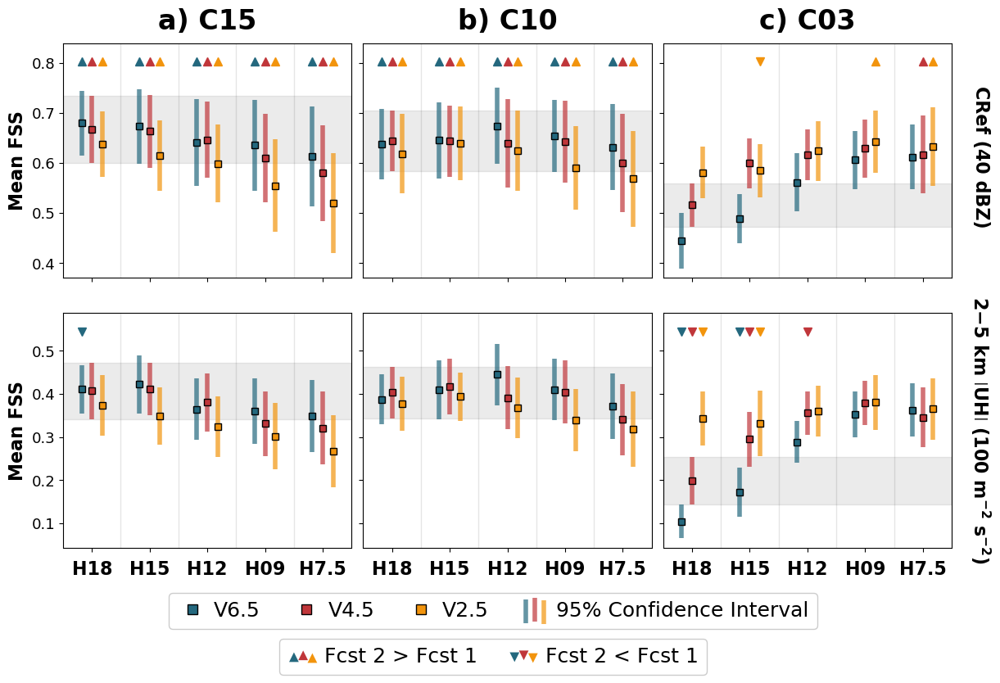

In [75]:

hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]
freq = [15,10,3]#[15, 10, 3]

freq=[15, 10, 3]
#freq=[3]
fcsts= ['']
#fcsts = ['FORECAST_20240508_2100']
fcsts = ['FORECAST_20240508_2100', '']


## eFSS stuff
myvars = ['compdz', 'uh2to5']
mythres  = [40, 100]
neighborhood_size = 24 # km 

n = 36#*len(fcsts)
max_index = 36*len(fcsts)
n_boot = 10000
indices = generate_bootstrap_indices(n, max_index, n_boot, seed=42)
interval = 95

#################################################################
if len (freq) == 3:
    fig, axes = plt.subplots(2,3, figsize=(14, 8), sharey='row', sharex=True)
else:
    fig, axes = plt.subplots(4,4, figsize=(19, 10), sharey='row', sharex=True)


hloc_i = range(len(hloc))
vloc_i = range(len(vloc))
gridx, gridy = np.meshgrid(hloc_i, vloc_i)
colors = list(cmaps.pride([.2, .75, .6]))


ls     = '-'
lw     = 3
alpha  = 0.8
#marker = 's'
ms     = 6

for ci, c in enumerate(freq):

    temp_table  = np.zeros([2, len(hloc), len(vloc)])
    stat_table  = np.zeros([2, len(hloc), len(vloc)])
    ci_table    = np.zeros([2, len(hloc), len(vloc)])

    for vi, v in enumerate(vloc):
        for hi, h in enumerate(hloc):
            for i,var in enumerate(myvars):

                exp =  f"C{c:02d}_H{h:02d}_V{v}/"

                # i should be (i*2) + 1

                axes[i, 0].set_ylabel(f'Mean FSS', fontsize=16)
                a#xes[(i*2)+1, 0].set_ylabel(f'Mean CSI', fontsize=16)
            


                ### the fss variable
                fss_vals, ci_val = generate_CI_FSS(exp, var, neighborhood=24, thresh=mythres[i], fcsts=fcsts, fcst_split=True, indices=indices)
    
                temp_table[i, hi, vi] = fss_vals[-1]
                ci_table[i, hi, vi]   =  ci_val
    
                if len(fcsts)>1:
                    
                    stat_table[i, hi, vi] = get_stat_difference_1val(fss_vals[0], fss_vals[1], ci_val)

                


    for i in range(2):
        #axes[i, ci].grid(axis='y')
        shift = .18
        for vi, v in enumerate(vloc):
            name = rename(f'C03_H09_V{v}', version='V').split('-')[1]
    
            xoff = shift * (vi - 1)
            axes[i, ci].errorbar(np.array(hloc_i)+xoff, temp_table[i,:,vi], yerr=ci_table[i,:,vi], marker='s', ms=0,mec='k', lw=0,color=colors[vi], elinewidth=4,capsize=0, label=name, alpha=0.7)
            axes[i, ci].plot(np.array(hloc_i)+xoff, temp_table[i,:,vi], color=colors[vi], ls=ls, marker='s',markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)

            if v == 4:
                conh = findnearest(hloc, 18)
                axes[i, ci].axhspan(temp_table[i,conh,vi]-ci_table[i,conh,vi],temp_table[i,conh,vi]+ci_table[i,conh,vi], alpha=0.08, color='k')#colors[vi])


            # now loop over 
            for hi, h in enumerate(hloc):
                # markerfacecolor=colors[vi]
                # marker = 'v'
                
                # if (stat_table[i, hi, vi] == 1) | (stat_table[i, hi, vi] == 0.5):
                #     marker = '^'
                # if (stat_table[i, hi, vi] == 0) |(stat_table[i, hi, vi] == 0.5):
                #     markerfacecolor = 'none'

                # axes[i, ci].plot(hi+xoff, .92, marker = marker, markeredgecolor=colors[vi], markerfacecolor=markerfacecolor, 
                #                  lw=0, markersize=7, transform = transforms.blended_transform_factory(axes[i, ci].transData,axes[i, ci].transAxes))
                    
                if stat_table[i, hi, vi] == -1:     
                    axes[i, ci].plot(hi+xoff, .92, marker = 'v', markeredgecolor=colors[vi], markerfacecolor=colors[vi], lw=0, markersize=7, transform = transforms.blended_transform_factory(axes[i, ci].transData,axes[i, ci].transAxes))
                if stat_table[i, hi, vi] == 1:
                    axes[i, ci].plot(hi+xoff, .92, marker = '^', markeredgecolor=colors[vi], markerfacecolor=colors[vi], lw=0, markersize=7, transform = transforms.blended_transform_factory(axes[i, ci].transData,axes[i, ci].transAxes))
           

for ax in axes.flatten():
    ax.set_xticks(hloc_i,[rename(f'C03_H{m:02d}_V4', version='H').split('-')[1] for m in hloc], weight='bold', fontsize=16)#, pad=10)
    ax.set_xlim(-0.5, len(hloc)-0.5)
    _=[ax.axvline(hl+.5, color='k', alpha=0.1, lw=1) for hl in hloc_i]
    ax.tick_params(axis='x', which='major', pad=7)

    y0,y1 = ax.get_ylim()
    ax.set_ylim(y0, y1 + 0.03*y1)
    # ax.set_ylim(0,1)


# set titles
for ci,c in enumerate(freq):    axes[0, ci].set_title(chr(ord('`')+ci+1)+') '+rename(f'C{c:02d}_H09_V4', version='CI'), weight='bold', fontsize=24,  y=1.03)

plt.subplots_adjust(hspace=0.15, wspace=0.04)


# ### add space betweent he plots
# for ax in axes[0:2,:].flatten():
#     pos = ax.get_position()
#     pos.y0 = pos.y0 +.025
#     pos.y1 = pos.y1 +.025
#     ax.set_position(pos)
# fig.canvas.draw()


### fancy legend
axes[0,0].scatter(-1.5, np.nanmean(temp_table[0]), marker='|', linewidth=4, s=200, color='w', alpha=0.7, label='95% Confidence Interval')
axes[0,0].scatter(-1.5, np.nanmean(temp_table[0]), marker='^', linewidth=0, s=50, color='w', alpha=1, label='Fcst 2 > Fcst 1')
axes[0,0].scatter(-1.5, np.nanmean(temp_table[0]), marker='v', linewidth=0, s=50, color='w', alpha=1, label='Fcst 2 < Fcst 1')

handles, labels =axes[0,0].get_legend_handles_labels()
new_handles,new_labels = [handles[0],handles[1],handles[2],(handles[3])], [labels[0], labels[1],labels[2], labels[3]]
leg=fig.legend(new_handles, new_labels, fontsize=18, scatterpoints=3, markerscale=1.5, loc='lower center', bbox_to_anchor=(0.5, -.03), ncol=6, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
leg.legend_handles[3].set_facecolors(colors)


handles, labels =axes[0,0].get_legend_handles_labels()
new_handles,new_labels = [handles[4],handles[5]], [labels[4], labels[5]]
leg2=fig.legend(new_handles, new_labels, fontsize=18, scatterpoints=3, markerscale=1.2, loc='lower center', bbox_to_anchor=(0.5, -.1), ncol=2, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
leg2.legend_handles[0].set_facecolors(colors)
leg2.legend_handles[1].set_facecolors(colors)


### add rhs labels
xt, yt = centered_on_axes(axes, 0, version = 'on')
tvar = 'CRef'
units = r'dBZ'
geq = r'$\mathbf{\geq}$'
fig.text(xt+.025, yt, f'{tvar} (40 {units}) ', ha='center', va='center', rotation=-90, weight='bold', fontsize=16);

xt, yt = centered_on_axes(axes, 1, version = 'on')
tvar = r'2$\mathbf{-}$5 km $\mathbf{\left| {UH} \right|}$'
units = r'm$^\mathbf{{-2}}$ s$\mathbf{^{-2}}$'
fig.text(xt+.025, yt,  f'{tvar} (100 {units})', ha='center', va='center', rotation=-90, weight='bold', fontsize=16);




# FIGNAME = 'ForecastOverview'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')

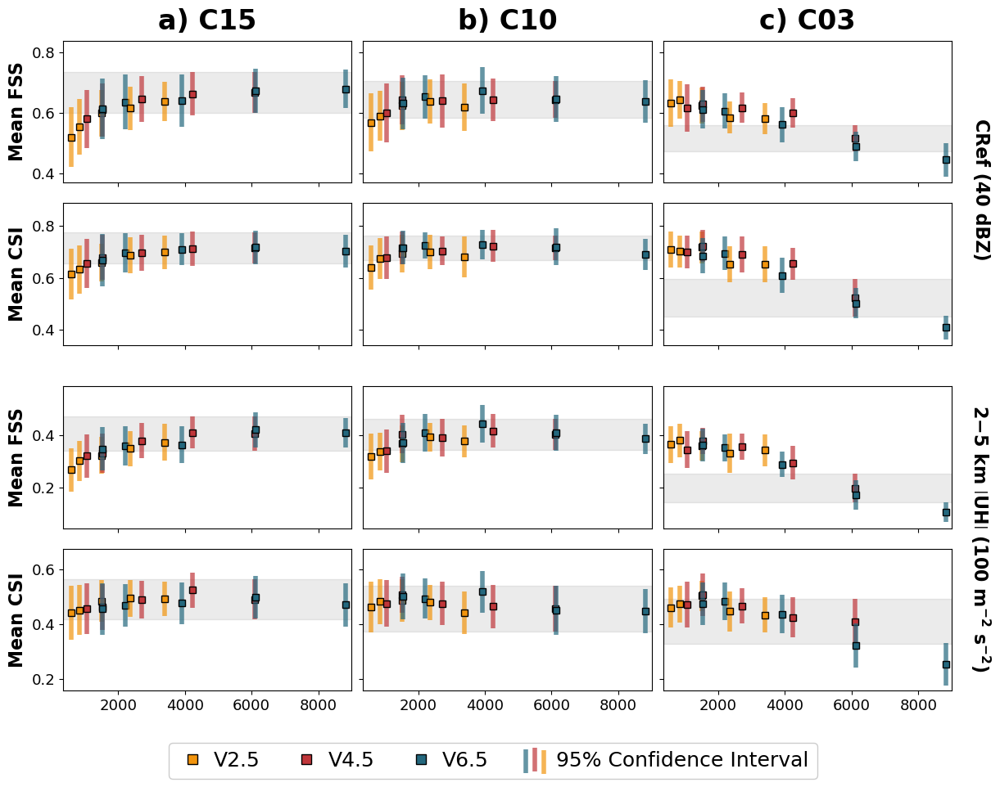

In [85]:

hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]
freq = [15,10,3]#[15, 10, 3]

freq=[15, 10, 3]
#freq=[3]
fcsts= ['']
#fcsts = ['FORECAST_20240508_2100']
fcsts = ['FORECAST_20240508_2100', '']


## eFSS stuff
myvars = ['compdz', 'uh2to5']
mythres  = [40, 100]
neighborhood_size = 24 # km 

n = 36#*len(fcsts)
max_index = 36*len(fcsts)
n_boot = 10000
indices = generate_bootstrap_indices(n, max_index, n_boot, seed=42)
interval = 95

#################################################################
if len (freq) == 3:
    fig, axes = plt.subplots(4,3, figsize=(14, 10), sharey='row', sharex=True)
else:
    fig, axes = plt.subplots(4,4, figsize=(19, 10), sharey='row', sharex=True)


hloc_i = range(len(hloc))
vloc_i = range(len(vloc))
gridx, gridy = np.meshgrid(hloc_i, vloc_i)
colors = list(cmaps.pride([.2, .75, .6]))

vols = [589,848,1060,1508,1527,1532,2205,2356,2714,3393,3921,4241,6107,6126,8822]#[::-1]


ls     = '-'
lw     = 3
alpha  = 0.8
#marker = 's'
ms     = 6

for ci, c in enumerate(freq):

    temp_table  = np.zeros([4, len(vols)])
    stat_table  = np.zeros([4, len(vols)])
    ci_table    = np.zeros([4, len(vols)])

    color_table = np.zeros([len(vols)])*np.nan


    for vi, v in enumerate(vloc):
        for hi, h in enumerate(hloc):


            exp =  f"C{c:02d}_H{h:02d}_V{v}"

            name = rename(exp, version='full')
                            
            hr = float(name.split('-')[1][1:])
            vr = float(name.split('-')[2][1:])

            index = findnearest(vols, (4/3)*np.pi*vr*hr*hr)

            color_table[index] = int(vi)

            for i,var in enumerate(myvars):

                axes[i*2, 0].set_ylabel(f'Mean FSS', fontsize=16)
                axes[(i*2)+1, 0].set_ylabel(f'Mean CSI', fontsize=16)
            


                ### the fss variable
                fss_vals, ci_val = generate_CI_FSS(exp, var, neighborhood=24, thresh=mythres[i], fcsts=fcsts, fcst_split=True, indices=indices)
    
                temp_table[i*2, index] = fss_vals[-1]
                ci_table[i*2, index]   =  ci_val
    
                if len(fcsts)>1:
                    
                    stat_table[i*2, index] = get_stat_difference_1val(fss_vals[0], fss_vals[1], ci_val)

                # the contigency table variable

                if var == 'uh2to5': var = 'UH'
                if var == 'compdz': var = 'compdbz'

                val_dct, ci_dct = generate_CI_contigency(exp, var, fcsts=fcsts, fcst_split=True)

                temp_table[(i*2)+1, index] =  val_dct['CSI'][-1]
                ci_table[(i*2)+1, index]   =  ci_dct['CSI']

                if len(fcsts)>1:
                    
                    stat_table[(i*2)+1, index] = get_stat_difference_1val( val_dct['CSI'][0],  val_dct['CSI'][1], ci_dct['CSI'])
    

                


    for i in range(4):
        name = rename(f'C03_H09_V{v}', version='V').split('-')[1]

        control = -3
        axes[i,ci].axhspan(temp_table[i,control]-ci_table[i,control],temp_table[i,control]+ci_table[i,control], alpha=0.08, color='k')


        for vi in range(0, len(vols)):
            if color_table[vi] == 0: name = 'V6.5'
            if color_table[vi] == 1: name = 'V4.5'
            if color_table[vi] == 2: name = 'V2.5'

            axes[i, ci].errorbar(vols[vi], temp_table[i,vi], yerr=ci_table[i, vi], marker='s', ms=0,mec='k', lw=0,c=colors[int(color_table[vi])], elinewidth=4,capsize=0, alpha=0.7 )
            axes[i,ci].plot(vols[vi], temp_table[i,vi],c=colors[int(color_table[vi])], ls=ls, marker='s',markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)


for ax in axes.flatten():
    # ax.set_xticks(hloc_i,[rename(f'C03_H{m:02d}_V4', version='H').split('-')[1] for m in hloc], weight='bold', fontsize=16)#, pad=10)
    # ax.set_xlim(-0.5, len(hloc)-0.5)
    # _=[ax.axvline(hl+.5, color='k', alpha=0.1, lw=1) for hl in hloc_i]
    # ax.tick_params(axis='x', which='major', pad=7)

    y0,y1 = ax.get_ylim()
    ax.set_ylim(y0, y1 + 0.03*y1)
    # ax.set_ylim(0,1)
    ax.set_xlim(350, 9000)


# set titles
for ci,c in enumerate(freq):    axes[0, ci].set_title(chr(ord('`')+ci+1)+') '+rename(f'C{c:02d}_H09_V4', version='CI'), weight='bold', fontsize=24,  y=1.03)

plt.subplots_adjust(hspace=0.15, wspace=0.04)


### add space betweent he plots
for ax in axes[0:2,:].flatten():
    pos = ax.get_position()
    pos.y0 = pos.y0 +.025
    pos.y1 = pos.y1 +.025
    ax.set_position(pos)
fig.canvas.draw()


### fancy legend
axes[0,0].scatter(-1.5, np.nanmean(temp_table[0]), marker='|', linewidth=4, s=200, color='w', alpha=0.7, label='95% Confidence Interval')
axes[0,0].scatter(-1.5, np.nanmean(temp_table[0]), marker='^', linewidth=0, s=50, color='w', alpha=1, label='Fcst 2 > Fcst 1')
axes[0,0].scatter(-1.5, np.nanmean(temp_table[0]), marker='v', linewidth=0, s=50, color='w', alpha=1, label='Fcst 2 < Fcst 1')

#handles, labels =axes[0,0].get_legend_handles_labels()

handles, labels =axes[0,0].get_legend_handles_labels()
by_label = dict(zip(labels, handles))
handles, labels = list(by_label.values()), list(by_label.keys())

new_handles,new_labels = [handles[0],handles[1],handles[2],(handles[3])], [labels[0], labels[1],labels[2], labels[3]]

leg=fig.legend(new_handles, new_labels, fontsize=18, scatterpoints=3, markerscale=1.5, loc='lower center', bbox_to_anchor=(0.5, -.01), ncol=6, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
leg.legend_handles[3].set_facecolors(colors)

# new_handles,new_labels = [handles[4],handles[5]], [labels[4], labels[5]]
# leg2=fig.legend(new_handles, new_labels, fontsize=18, scatterpoints=3, markerscale=1.2, loc='lower center', bbox_to_anchor=(0.5, -.06), ncol=2, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
# leg2.legend_handles[0].set_facecolors(colors)
# leg2.legend_handles[1].set_facecolors(colors)


### add rhs labels
xt, yt = centered_on_axes(axes, 0)
tvar = 'CRef'
units = r'dBZ'
geq = r'$\mathbf{\geq}$'
fig.text(xt+.025, yt, f'{tvar} (40 {units}) ', ha='center', va='center', rotation=-90, weight='bold', fontsize=16);

xt, yt = centered_on_axes(axes, 2)
tvar = r'2$\mathbf{-}$5 km $\mathbf{\left| {UH} \right|}$'
units = r'm$^\mathbf{{-2}}$ s$\mathbf{^{-2}}$'
fig.text(xt+.025, yt,  f'{tvar} (100 {units})', ha='center', va='center', rotation=-90, weight='bold', fontsize=16);



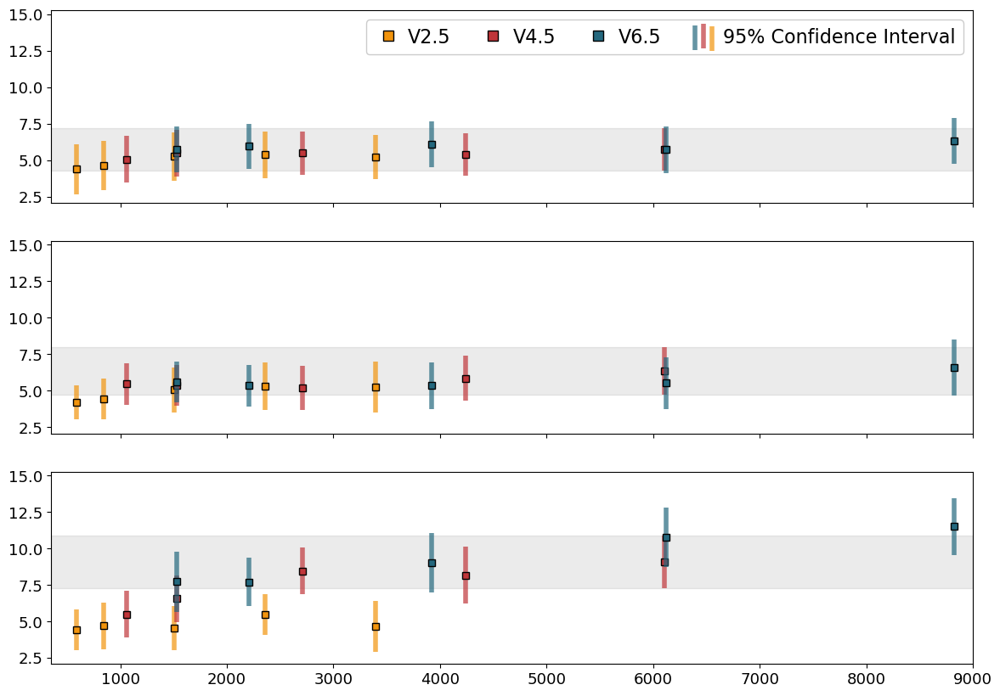

In [87]:

hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]
freq=[15, 10, 3]
fcsts = ['FORECAST_20240508_2100', '']
fcsts=['']


n = 36
max_index = 36*len(fcsts)
n_boot = 10000
indices = generate_bootstrap_indices(n, max_index, n_boot, seed=42)
interval = 95

#################################################################
if len (freq) == 3:
    fig, axes = plt.subplots(3,1, figsize=(14, 10), sharey=True, sharex=True)
else:
    fig, axes = plt.subplots(4,4, figsize=(19, 10), sharey='row', sharex=True)


hloc_i = range(len(hloc))
vloc_i = range(len(vloc))
gridx, gridy = np.meshgrid(hloc_i, vloc_i)
colors = list(cmaps.pride([.2, .75, .6]))

vols = [589,848,1060,1508,1527,1532,2205,2356,2714,3393,3921,4241,6107,6126,8822]#[::-1]


NR = xr.open_dataset('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc')
NRtime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in NR.dates.values[:]]
NR_size = NR.cp_size.values
NR.close()


ls     = '-'
lw     = 3
alpha  = 0.8
#marker = 's'
ms     = 6

for ci, c in enumerate(freq):

    temp_table  = np.zeros([len(vols)])
    stat_table  = np.zeros([len(vols)])
    ci_table    = np.zeros([len(vols)])
    color_table = np.zeros([len(vols)])*np.nan


    for vi, v in enumerate(vloc):
        for hi, h in enumerate(hloc):


            exp =  f"C{c:02d}_H{h:02d}_V{v}"

            name = rename(exp, version='full')
                            
            hr = float(name.split('-')[1][1:])
            vr = float(name.split('-')[2][1:])

            index = findnearest(vols, (4/3)*np.pi*vr*hr*hr)

            color_table[index] = int(vi)


            cp = []
            for fcst in fcsts:
            ######## cold pool
                cm1 = xr.open_dataset(os.path.join('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/',exp, fcst, f'full_ens_fcst.nc' ), decode_timedelta=True)
                time = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
                tis =[findnearest(NRtime, t) for t in time]
                btis =[findnearest(NRtime, t) for t in time]
                NRs = NR_size[tis][:, np.newaxis]
                cp.extend(np.nanmean((cm1.cp_size[:, :-1].values - NRs)/1000, axis=0))
                cm1.close()
            temp_table[index] = np.nanmean(cp)
            ci_table[index] = compute_ci_perc(bootstrap_fss_from_indices(cp  , indices), interval)
                


   
    name = rename(f'C03_H09_V{v}', version='V').split('-')[1]


    control = -3
    axes[ci].axhspan(temp_table[control]-ci_table[control],temp_table[control]+ci_table[control], alpha=0.08, color='k')

    for vi in range(0, len(vols)):
        if color_table[vi] == 0: name = 'V6.5'
        if color_table[vi] == 1: name = 'V4.5'
        if color_table[vi] == 2: name = 'V2.5'

        axes[ci].errorbar(vols[vi], temp_table[vi], yerr=ci_table[vi], marker='s', ms=0,mec='k', lw=0,c=colors[int(color_table[vi])], elinewidth=4,capsize=0, alpha=0.7 )
        axes[ci].plot(vols[vi], temp_table[vi],c=colors[int(color_table[vi])], ls=ls, marker='s',markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)


for ax in axes.flatten():
    # ax.set_xticks(hloc_i,[rename(f'C03_H{m:02d}_V4', version='H').split('-')[1] for m in hloc], weight='bold', fontsize=16)#, pad=10)
    # ax.set_xlim(-0.5, len(hloc)-0.5)
    # _=[ax.axvline(hl+.5, color='k', alpha=0.1, lw=1) for hl in hloc_i]
    # ax.tick_params(axis='x', which='major', pad=7)

    y0,y1 = ax.get_ylim()
    ax.set_ylim(y0, y1 + 0.03*y1)
    # ax.set_ylim(0,1)
    ax.set_xlim(350, 9000)


# # set titles
# for ci,c in enumerate(freq):    axes[0, ci].set_title(chr(ord('`')+ci+1)+') '+rename(f'C{c:02d}_H09_V4', version='CI'), weight='bold', fontsize=24,  y=1.03)

# plt.subplots_adjust(hspace=0.15, wspace=0.04)


# ### add space betweent he plots
# for ax in axes[0:2,:].flatten():
#     pos = ax.get_position()
#     pos.y0 = pos.y0 +.025
#     pos.y1 = pos.y1 +.025
#     ax.set_position(pos)
# fig.canvas.draw()


### fancy legend
axes[0].scatter(-1.5, np.nanmean(temp_table[0]), marker='|', linewidth=4, s=200, color='w', alpha=0.7, label='95% Confidence Interval')
axes[0].scatter(-1.5, np.nanmean(temp_table[0]), marker='^', linewidth=0, s=50, color='w', alpha=1, label='Fcst 2 > Fcst 1')
axes[0].scatter(-1.5, np.nanmean(temp_table[0]), marker='v', linewidth=0, s=50, color='w', alpha=1, label='Fcst 2 < Fcst 1')

#handles, labels =axes[0,0].get_legend_handles_labels()

handles, labels =axes[0].get_legend_handles_labels()
by_label = dict(zip(labels, handles))
handles, labels = list(by_label.values()), list(by_label.keys())

new_handles,new_labels = [handles[0],handles[1],handles[2],(handles[3])], [labels[0], labels[1],labels[2], labels[3]]

leg=axes[0].legend(new_handles, new_labels, fontsize=16, scatterpoints=3, markerscale=1.5, loc='upper right', ncol=6, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
leg.legend_handles[3].set_facecolors(colors)

# # new_handles,new_labels = [handles[4],handles[5]], [labels[4], labels[5]]
# # leg2=fig.legend(new_handles, new_labels, fontsize=18, scatterpoints=3, markerscale=1.2, loc='lower center', bbox_to_anchor=(0.5, -.06), ncol=2, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
# # leg2.legend_handles[0].set_facecolors(colors)
# # leg2.legend_handles[1].set_facecolors(colors)


# ### add rhs labels
# xt, yt = centered_on_axes(axes, 0)
# tvar = 'CRef'
# units = r'dBZ'
# geq = r'$\mathbf{\geq}$'
# fig.text(xt+.025, yt, f'{tvar} (40 {units}) ', ha='center', va='center', rotation=-90, weight='bold', fontsize=16);

# xt, yt = centered_on_axes(axes, 2)
# tvar = r'2$\mathbf{-}$5 km $\mathbf{\left| {UH} \right|}$'
# units = r'm$^\mathbf{{-2}}$ s$\mathbf{^{-2}}$'
# fig.text(xt+.025, yt,  f'{tvar} (100 {units})', ha='center', va='center', rotation=-90, weight='bold', fontsize=16);



In [55]:
handles, labels =axes[0,0].get_legend_handles_labels()
by_label = dict(zip(labels, handles))
handles, labels = by_label.values(), by_label.keys()

In [56]:
labels

dict_keys(['V2.5', 'V4.5', 'V6.5', '95% Confidence Interval', 'Fcst 2 > Fcst 1', 'Fcst 2 < Fcst 1'])

In [18]:
temp_table[i,vi]

np.float64(0.6794577125045989)

In [19]:
vols

[8822,
 6126,
 6107,
 4241,
 3921,
 3393,
 2714,
 2356,
 2205,
 1532,
 1527,
 1508,
 1060,
 848,
 589]

In [66]:
df

,H18,H15,H12,H09,H7.5
V6.5,8821.592171,6126.105675,3920.707632,2205.398043,1531.526419
V4.5,6107.256119,4241.150082,2714.336053,1526.814030,1060.287521
V2.5,3392.920066,2356.194490,1507.964474,848.230016,589.048623


In [68]:
vols = []

hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]

vols = np.zeros([len(vloc), len(hloc)])
# hnames = []
# vnames = []
for hi, h in enumerate(hloc):
    for vi, v in enumerate(vloc):
        name = rename(f'C15_H{h:02d}_V{v}', version='full')
                            
        hr = float(name.split('-')[1][1:])
        vr = float(name.split('-')[2][1:])
        volume = (4/3)*np.pi*vr*hr*hr
        vols[vi, hi] = int(np.round(volume, decimals=0))
        
        #print(f'H: {hr}, V: {vr}, VOL: {volume:.01f}')
# vols = sorted(vols)

# for v in vols:
#     print(f'{v:.0f}', end=',')

df = pd.DataFrame(data = vols, columns = ['H18', 'H15', 'H12', 'H09', 'H7.5'], index = ['V6.5', 'V4.5', 'V2.5'])
df

,H18,H15,H12,H09,H7.5
V6.5,8822.0,6126.0,3921.0,2205.0,1532.0
V4.5,6107.0,4241.0,2714.0,1527.0,1060.0
V2.5,3393.0,2356.0,1508.0,848.0,589.0


In [74]:
print(df.style.format(precision=0).to_latex( caption="Localization volume in cubic kilometers based on horizontal (columns) and vertical (rows) localization in kilometers", label="vol_table", ))

\begin{table}
\caption{Localization volume in cubic kilometers based on horizontal (columns) and vertical (rows) localization in kilometers}
\label{vol_table}
\begin{tabular}{lrrrrr}
 & H18 & H15 & H12 & H09 & H7.5 \\
V6.5 & 8822 & 6126 & 3921 & 2205 & 1532 \\
V4.5 & 6107 & 4241 & 2714 & 1527 & 1060 \\
V2.5 & 3393 & 2356 & 1508 & 848 & 589 \\
\end{tabular}
\end{table}



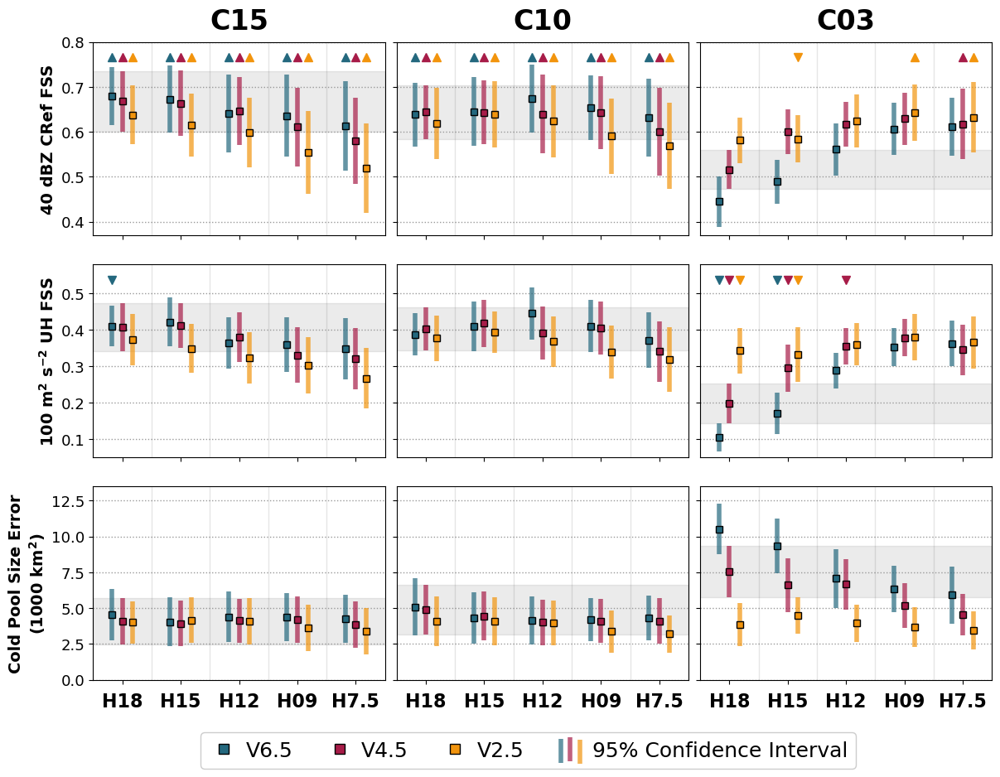

In [4]:

hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]
freq = [15,10,3]#[15, 10, 3]

freq=[15, 10, 3]
#freq=[3]
fcsts= ['']
#fcsts = ['FORECAST_20240508_2100']
fcsts = ['FORECAST_20240508_2100', '']


## eFSS stuff
myvars = ['compdz', 'uh2to5']
mythres  = [40, 100]
neighborhood_size = 24 # km 

n = 36#*len(fcsts)
max_index = 36*len(fcsts)
n_boot = 10000
indices = generate_bootstrap_indices(n, max_index, n_boot, seed=42)
interval = 95

#################################################################
if len (freq) == 3:
    fig, axes = plt.subplots(3,3, figsize=(14, 10), sharey='row', sharex=True)
else:
    fig, axes = plt.subplots(3,4, figsize=(19, 10), sharey='row', sharex=True)



hloc_i = range(len(hloc))
vloc_i = range(len(vloc))
gridx, gridy = np.meshgrid(hloc_i, vloc_i)

NR = xr.open_dataset('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc')
NRtime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in NR.dates.values[:]]
NR_size = NR.cp_size.values
NR.close()

colors = list(cmaps.pride([.2, .8, .6]))


ls     = '-'
lw     = 3
alpha  = 0.8
marker = 's'
ms     = 6

for ci, c in enumerate(freq):

    # temp_table = np.zeros([3, len(hloc), len(vloc)])
    # ci_table   = np.zeros([3, len(hloc), len(vloc)])

    temp_table  = np.zeros([3, len(hloc), len(vloc)])
    stat_table  = np.zeros([3, len(hloc), len(vloc)])
    ci_table    = np.zeros([3, len(hloc), len(vloc)])
    color_table = np.zeros([len(hloc), len(vloc)])


    for vi, v in enumerate(vloc):
        for hi, h in enumerate(hloc):

            name = rename(f'C15_H{h:02d}_V{v}', version='full')
                            
            hr = float(name.split('-')[1][1:])
            vr = float(name.split('-')[2][1:])

            index = findnearest(vols, (4/3)*np.pi*vr*hr*hr)



            color_table[hi, vi] = colors[vi]
   
            for i,var in enumerate(myvars):

                exp =  f"C{c:02d}_H{h:02d}_V{v}/"
            


                fss_vals, ci_val = generate_CI_FSS(exp, var, neighborhood=24, thresh=mythres[i], fcsts=fcsts, fcst_split=True, indices=indices)
    
                temp_table[i, hi, vi] = fss_vals[-1]
                ci_table[i, hi, vi]   =  ci_val
    
                if len(fcsts)>1:
                    
                    stat_table[i, hi, vi] = get_stat_difference_1val(fss_vals[0], fss_vals[1], ci_val)


            cp = []
            for fcst in fcsts:
            ######## cold pool
                cm1 = xr.open_dataset(os.path.join('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/',exp, fcst, f'full_ens_fcst.nc' ), decode_timedelta=True)
                time = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
                tis =[findnearest(NRtime, t) for t in time]
                btis =[findnearest(NRtime, t) for t in time]
                NRs = NR_size[tis][:, np.newaxis]
                cp.extend(np.nanmean((cm1.cp_size[:, :-1].values - NRs)/1000, axis=0))
                cm1.close()
            temp_table[2, hi, vi] = np.nanmean(cp)
            ci_table[2, hi, vi] = compute_ci_perc(bootstrap_fss_from_indices(cp  , indices), interval)

                
    #         temp_table[0, hi, vi] = np.mean(fss1)
    #         temp_table[1, hi, vi] = np.mean(fss2)
    #         temp_table[2, hi, vi] = np.nanmean(cp)


    #         ci_table[0, hi, vi] = compute_ci_perc(bootstrap_fss_from_indices(fss1, indices), interval)
    #         ci_table[1, hi, vi] = compute_ci_perc(bootstrap_fss_from_indices(fss2, indices), interval)
    #         ci_table[2, hi, vi] = compute_ci_perc(bootstrap_fss_from_indices(cp  , indices), interval)
    #         # except
    #         #     temp_table[0, hi, vi] =np.nan
    #         #     temp_table[1, hi, vi] =np.nan
    #         #     temp_table[2, hi, vi] =np.nan
    #         #     ci_table[0, hi, vi]   =np.nan
    #         #     ci_table[1, hi, vi]   =np.nan
    #         #     ci_table[2, hi, vi]   =np.nan
                

    # temp_table[temp_table == 0] = np.nan

    for i in range(3):
        axes[i, ci].grid(axis='y')
        shift = .18
        for vi, v in enumerate(vloc):
            name = rename(f'C03_H09_V{v}', version='V').split('-')[1]
    
            xoff = shift * (vi - 1)
            axes[i, ci].errorbar(np.array(hloc_i)+xoff, temp_table[i,:,vi], yerr=ci_table[i,:,vi], marker='s', ms=0,mec='k', lw=0,color=colors[vi], elinewidth=4,capsize=0, label=name, alpha=0.7)
            axes[i, ci].plot(np.array(hloc_i)+xoff, temp_table[i,:,vi], color=colors[vi], ls=ls, marker=marker,markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)

            if v == 4:
                conh = findnearest(hloc, 18)
                axes[i, ci].axhspan(temp_table[i,conh,vi]-ci_table[i,conh,vi],temp_table[i,conh,vi]+ci_table[i,conh,vi], alpha=0.08, color='k')#colors[vi])


        # if i < 2: best = np.nanmax(temp_table[i])
        # if i == 2:best = np.nanmin(temp_table[i])
        # hl,vl = np.where(temp_table[i] == best)
        # axes[i,ci].text(hl, .96,  f'{best:.2f}', weight='bold', color=colors[vl[0]], ha='center',va='top',fontsize=13,transform = transforms.blended_transform_factory(axes[i, ci].transData,axes[i, ci].transAxes))


        if i < 3:
            
            for vi, v in enumerate(vloc):
                xoff = shift * (vi - 1)
                for hi, h in enumerate(hloc):
                    if stat_table[i, hi, vi] == -1:
                        axes[i, ci].plot(hi+xoff, .92, marker = 'v', markeredgecolor=colors[vi], markerfacecolor=colors[vi], lw=0, markersize=7, transform = transforms.blended_transform_factory(axes[i, ci].transData,axes[i, ci].transAxes))
                    if stat_table[i, hi, vi] == 1:
                        axes[i, ci].plot(hi+xoff, .92, marker = '^', markeredgecolor=colors[vi], markerfacecolor=colors[vi], lw=0, markersize=7, transform = transforms.blended_transform_factory(axes[i, ci].transData,axes[i, ci].transAxes))
           

axes[0,0].set_ylim(.37, .8)
axes[1,0].set_ylim(0.05, .58)
axes[2,0].set_ylim(0.,13.5)

    


# axes[0,0].set_ylim(0,1)
# axes[1,0].set_ylim(0,1)

for ax in axes.flatten():
    ax.set_xticks(hloc_i,[rename(f'C03_H{m:02d}_V4', version='H').split('-')[1] for m in hloc], weight='bold', fontsize=16)#, pad=10)
    ax.set_xlim(-0.5, len(hloc)-0.5)
    _=[ax.axvline(hl+.5, color='k', alpha=0.1, lw=1) for hl in hloc_i]
    ax.tick_params(axis='x', which='major', pad=7)


# set labels
unit = r'm$\mathbf{^2}$ s$\mathbf{^{-2}}$'
labels = ['40 dBZ CRef FSS',f'100 {unit} UH FSS', 'Cold Pool Size Error\n'+r'(1000 km$\mathbf{^2}$)', ]
for li, l in enumerate(labels): axes[li, 0].set_ylabel(l, fontsize=14)

# set titles
for ci,c in enumerate(freq): axes[0, ci].set_title(rename(f'C{c:02d}_H09_V4', version='CI'), weight='bold', fontsize=24, y=1.03)


plt.subplots_adjust(hspace=0.15, wspace=0.04)



axes[0,0].scatter(-1.5, np.nanmean(temp_table[0]), marker='|', linewidth=4, s=200, color='w', alpha=0.7, label='95% Confidence Interval')
handles, labels =axes[0,0].get_legend_handles_labels()
new_handles,new_labels = [handles[0],handles[1],handles[2],(handles[3])], [labels[0], labels[1],labels[2], labels[3]]
leg=fig.legend(new_handles, new_labels, fontsize=18, scatterpoints=3, markerscale=1.5, loc='lower center', bbox_to_anchor=(0.5, -.01), ncol=4, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
leg.legend_handles[3].set_facecolors(colors)



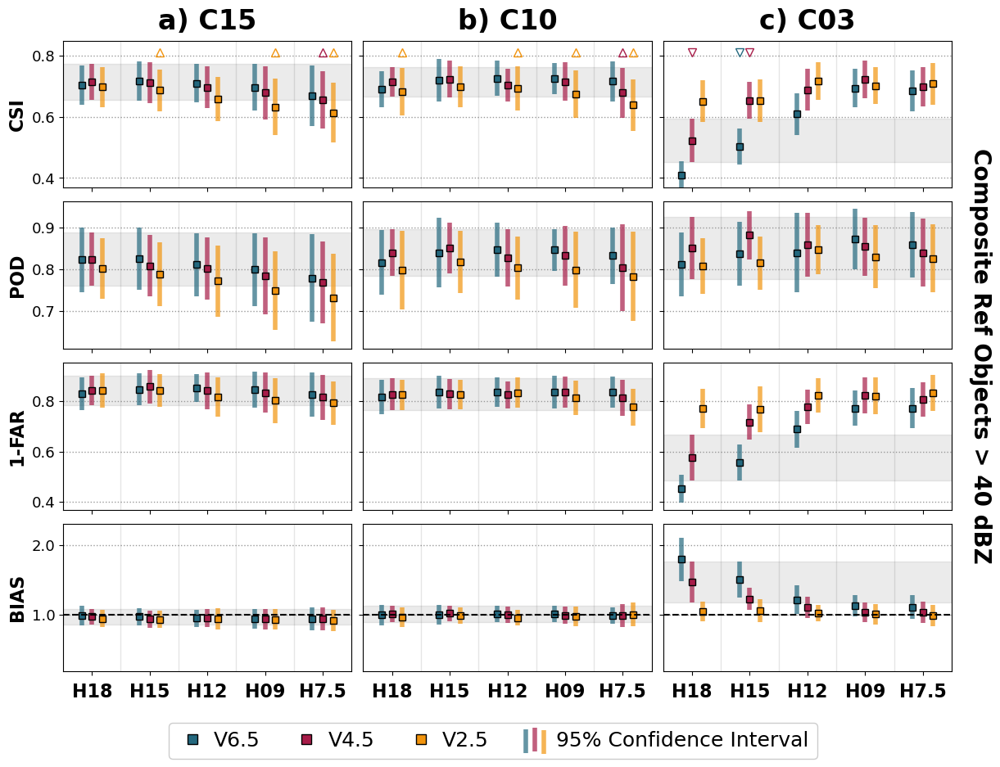

In [26]:

hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]
freq = [15, 10,  3]
fcsts= [''] 
#fcsts = ['FORECAST_20240508_2100']
fcsts = ['FORECAST_20240508_2100', '']


## eFSS stuff
var = 'UH'
thresh = 100

var = 'compdbz'
thresh = 40


################ calculate for bootstrapping
interval = 95

n = 36
max_val = 36*len(fcsts)
n_boot = 10000

indices = generate_bootstrap_indices(n,max_val, n_boot, seed=42)


#################################################################
#fig, axes = plt.subplots(4,3, figsize=(16, 10), sharey='row', sharex=True)


if len (freq) == 3:
    fig, axes = plt.subplots(4,3, figsize=(14, 10), sharey='row', sharex=True)
else:
    fig, axes = plt.subplots(4,4, figsize=(19, 10), sharey='row', sharex=True)


hloc_i = range(len(hloc))
vloc_i = range(len(vloc))
gridx, gridy = np.meshgrid(hloc_i, vloc_i)

colors = list(cmaps.pride([.2, .8, .6]))#[::-1]


ls     = '-'
lw     = 2
alpha  = 1#0.8
marker = 's'
ms     = 6

for ci, c in enumerate(freq):

    temp_table = np.zeros([4, len(hloc), len(vloc)])*np.nan
    ci_table  =  np.zeros([4, len(hloc), len(vloc)])*np.nan

    f1_csi    = np.zeros([len(hloc), len(vloc)])
    f2_csi    = np.zeros([len(hloc), len(vloc)])

    for vi, v in enumerate(vloc):
        for hi, h in enumerate(hloc):

            try: 
                exp = f"C{c:02d}_H{h:02d}_V{v}/"
                val_dct, ci_dct = generate_CI_contigency(exp, var, fcsts=fcsts, fcst_split=True)
    
                ci_table[1, hi, vi] = ci_dct['POD']
                ci_table[2, hi, vi] = ci_dct['SR']
                ci_table[0, hi, vi] = ci_dct['CSI']
                ci_table[3, hi, vi] = ci_dct['BIAS']
                
                temp_table[1, hi, vi] = val_dct['POD'][-1]
                temp_table[2, hi, vi] = val_dct['SR'][-1]
                temp_table[0, hi, vi] = val_dct['CSI'][-1]
                temp_table[3, hi, vi] = val_dct['BIAS'][-1]


                f1_csi[hi, vi] = val_dct['CSI'][0]
                f2_csi[hi, vi] = val_dct['CSI'][1]



                
            except:
                temp_table[:, hi, vi] = np.nan
                ci_table[:, hi, vi]   = np.nan

    for i in range(4):
        axes[i, ci].grid(axis='y')
        shift = .18
        for vi, v in enumerate(vloc):
            name = rename(f'C03_H09_V{v}', version='V').split('-')[1]
    
            xoff = shift * (vi - 1)
            axes[i, ci].errorbar(np.array(hloc_i)+xoff, temp_table[i,:,vi], yerr=ci_table[i,:,vi], marker='s', ms=0,mec='k', lw=0,color=colors[vi], elinewidth=4,capsize=0, label=name, alpha=0.7)
            axes[i, ci].plot(np.array(hloc_i)+xoff, temp_table[i,:,vi], color=colors[vi], ls=ls, marker=marker,markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)

            if v == 4:
                conh = findnearest(hloc, 18)
                axes[i, ci].axhspan(temp_table[i,conh,vi]-ci_table[i,conh,vi],temp_table[i,conh,vi]+ci_table[i,conh,vi], alpha=0.08, color='k')#alpha=0.1, color=colors[vi])


        # if i == 0: 
        #     best = np.nanmax(temp_table[i])
        #     hl,vl = np.where(temp_table[i] == best)
        #     axes[i,ci].text(hl, .95,  f'{best:.2f}', weight='bold', color=colors[vl[0]], ha='center',va='top',fontsize=13,transform = transforms.blended_transform_factory(axes[i, ci].transData,axes[i, ci].transAxes))

        
    stat_table = get_stat_difference(f1_csi, f2_csi, ci_table[0]) # for csi only
    for vi, v in enumerate(vloc):
        xoff = shift * (vi - 1)
        for hi, h in enumerate(hloc):
            if stat_table[hi, vi] == -1:
                axes[0, ci].plot(hi+xoff, .92, marker = 'v', markeredgecolor=colors[vi], markerfacecolor='none', lw=0, markersize=7, transform = transforms.blended_transform_factory(axes[0, ci].transData,axes[0, ci].transAxes))
            if stat_table[hi, vi] == 1:
                axes[0, ci].plot(hi+xoff, .92, marker = '^', markeredgecolor=colors[vi], markerfacecolor='none', lw=0, markersize=7, transform = transforms.blended_transform_factory(axes[0, ci].transData,axes[0, ci].transAxes))



                
# limits
# axes[0,0].set_ylim(.18,.7)
# axes[1,0].set_ylim(.25,.75)
# axes[2,0].set_ylim(.30,.94)


# axes[0,0].set_ylim(0,1)
# axes[1,0].set_ylim(0,1)
# axes[2,0].set_ylim(0,1)

#axes[0,0].margins(y=.23)

if var == 'compdbz':
    axes[0,0].set_ylim(0.37,.85)
    axes[3,0].set_ylim(0.2,2.3)
if var == 'UH':
    axes[0,0].set_ylim(0.17,.68)
    axes[3,0].set_ylim(0.5,1.4)
    
for ax in axes[3,:]: 
    ax.axhline(1, color='k', ls='--')
    ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:.1f}'))


# set xticks
for ax in axes.flatten():
    ax.set_xticks(hloc_i,[rename(f'C03_H{m:02d}_V4', version='H').split('-')[1] for m in hloc], weight='bold', fontsize=16)#, pad=10)
    ax.set_xlim(-0.5, len(hloc)-0.5)
    _=[ax.axvline(hl+.5, color='k', alpha=0.1, lw=1) for hl in hloc_i]
    ax.tick_params(axis='x', which='major', pad=7)

# label y axis
labels = ['CSI', 'POD', '1-FAR','BIAS' ]
for ai,axs in enumerate(axes):
    axs[0].set_ylabel(labels[ai], fontsize=16)

# set titles
for ci,c in enumerate(freq):    
    axes[0, ci].set_title(chr(ord('`')+ci+1)+') '+rename(f'C{c:02d}_H09_V4', version='CI'), weight='bold', fontsize=24,  y=1.03)

    
plt.subplots_adjust(hspace=0.1, wspace=0.04)


axes[0,0].scatter(-1.5, np.nanmean(temp_table[0]), marker='|', linewidth=4, s=200, color='w', alpha=0.7, label='95% Confidence Interval')
handles, labels =axes[0,0].get_legend_handles_labels()
new_handles,new_labels = [handles[0],handles[1],handles[2],(handles[3])], [labels[0], labels[1],labels[2], labels[3]]
leg=fig.legend(new_handles, new_labels, fontsize=18, scatterpoints=3, markerscale=1.5, loc='lower center', bbox_to_anchor=(0.5, -.01), ncol=4, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
#leg=fig.legend(new_handles, new_labels, fontsize=18, scatterpoints=3, markerscale=1.5, loc='upper center', bbox_to_anchor=(0.5, 1), ncol=4, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
leg.legend_handles[3].set_facecolors(colors)


bbox1 = axes[1, -1].get_position()
bbox2 = axes[2, -1].get_position()

bot = bbox1.y0
top = bbox2.y0 + bbox2.height
xloc = bbox2.x0 + bbox2.width


if var == 'UH':
    tvar = r'2$\mathbf{-}$5 km $\mathbf{\left| {UH} \right|}$'
    units = r'm$^\mathbf{{-2}}$ s$\mathbf{^{-2}}$'

if var == 'compdbz':
    tvar = 'Composite Ref'
    units = r'dBZ'
fig.text(xloc+.025, (bot+top)/2, f'{tvar} Objects > {thresh} {units}', ha='center', va='center', rotation=-90, weight='bold', fontsize=20);



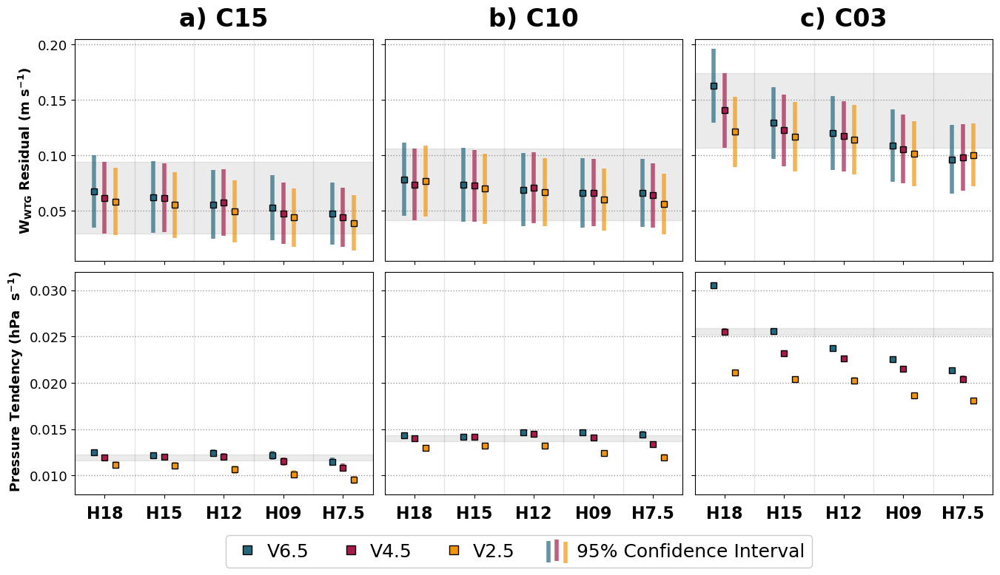

In [91]:
n = 36
max_val = 36
n_boot = 10000
indices = generate_bootstrap_indices(n, max_val, n_boot, seed=42)

interval=95




hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]
freq = [15,10, 3]#[15, 10, 3]



#################################################################

if len (freq) == 3:
    fig, axes = plt.subplots(2,3, figsize=(16, 8), sharey='row', sharex=True)
else:
    fig, axes = plt.subplots(2,4, figsize=(19, 8), sharey='row', sharex=True)


hloc_i = range(len(hloc))
vloc_i = range(len(vloc))
gridx, gridy = np.meshgrid(hloc_i, vloc_i)


colors = list(cmaps.pride([.2, .8, .6]))


ls     = '-'
lw     = 2
alpha  = 0.8
marker = 's'
ms     = 6

for ci, c in enumerate(freq):

    temp_table = np.zeros([2, len(hloc), len(vloc)]) 
    ci_table   = np.zeros([2, len(hloc), len(vloc)])
    for vi, v in enumerate(vloc):
        
        for hi, h in enumerate(hloc):
        
            try:
                path = os.path.join("/work/jessica.mcdonald/CM1_LETKF_2025/experiments/", f"C{c:02d}_H{h:02d}_V{v}/")
                wtg = xr.open_dataset(f'{path}/balance.nc')
                stop = findnearest(wtg.time, 120)
    
                temp_table[0, hi, vi] = np.mean(wtg.wres_adjusted.values[:stop])
                temp_table[1, hi, vi] = np.mean(wtg.divc.values[:stop])/100
    
    
                ci_table[0, hi, vi] = compute_ci_perc(bootstrap_fss_from_indices(wtg.wres_adjusted.values[:stop].mean(axis=0).flatten(), indices), interval)
                ci_table[1, hi, vi] = compute_ci_perc(bootstrap_fss_from_indices(wtg.divc.values[:stop].mean(axis=0).flatten()/100, indices), interval)
    
                
        
                wtg.close()
            except:
                pass

    temp_table[temp_table == 0] = np.nan

    for i in range(2):
        axes[i, ci].grid(axis='y')
        shift = .18
        for vi, v in enumerate(vloc):
            name = rename(f'C03_H09_V{v}', version='V').split('-')[1]
    
            xoff = shift * (vi - 1)
            axes[i, ci].errorbar(np.array(hloc_i)+xoff, temp_table[i,:,vi], yerr=ci_table[i,:,vi], marker='s', ms=0,mec='k', lw=0,color=colors[vi], elinewidth=4,capsize=0, label=name, alpha=0.7)
            axes[i, ci].plot(np.array(hloc_i)+xoff, temp_table[i,:,vi], color=colors[vi], ls=ls, marker=marker,markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)

            if v == 4:
                conh = findnearest(hloc, 18)
                axes[i, ci].axhspan(temp_table[i,conh,vi]-ci_table[i,conh,vi],temp_table[i,conh,vi]+ci_table[i,conh,vi], alpha=0.08, color='k')#alpha=0.1, color=colors[vi])



for ax in axes.flatten():
    ax.set_xticks(hloc_i,[rename(f'C03_H{m:02d}_V4', version='H').split('-')[1] for m in hloc], weight='bold', fontsize=16)#, pad=10)
    ax.set_xlim(-0.5, len(hloc)-0.5)
    _=[ax.axvline(hl+.5, color='k', alpha=0.1, lw=1) for hl in hloc_i]
    ax.tick_params(axis='x', which='major', pad=7)


unit = r'm$\mathbf{^2}$ s$\mathbf{^{-2}}$'
labels = ['40 dBZ CRef eFSS',f'100 {unit} UH eFSS', 'Cold Pool Size Error\n'+r'(1000 km$\mathbf{^2}$)', ]

# set titles
for ci,c in enumerate(freq):
    axes[0, ci].set_title(chr(ord('`')+ci+1)+') '+rename(f'C{c:02d}_H09_V4', version='CI'), weight='bold', fontsize=24,  y=1.03)


plt.subplots_adjust(hspace=0.05, wspace=0.04)

labels = [r'W$\mathbf{_{WTG}}$ Residual (m s$\mathbf{^{-1}}$)', "dP\'/dt"+r'(hPa  s$\mathbf{^{-1}}$)']
axes[0,0].set_ylabel(r'W$\mathbf{_{WTG}}$ Residual (m s$\mathbf{^{-1}}$)', weight='bold')
axes[1,0].set_ylabel(r" Pressure Tendency (hPa  s$\mathbf{^{-1}}$)", weight='bold')

axes[0,0].scatter(-1.5, np.nanmean(temp_table[0]), marker='|', linewidth=4, s=200, color='w', alpha=0.7, label='95% Confidence Interval')
handles, labels =axes[0,0].get_legend_handles_labels()
new_handles,new_labels = [handles[0],handles[1],handles[2],(handles[3])], [labels[0], labels[1],labels[2], labels[3]]
leg=fig.legend(new_handles, new_labels, fontsize=18, scatterpoints=3, markerscale=1.5, loc='lower center', bbox_to_anchor=(0.5, -.03), ncol=4, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
leg.legend_handles[3].set_facecolors(colors)



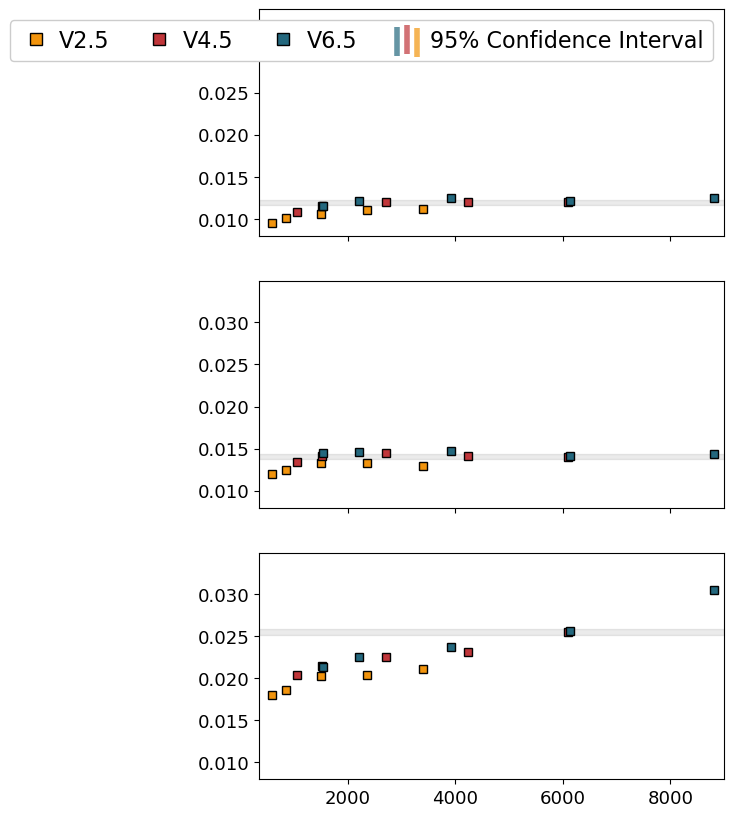

In [122]:

hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]
freq=[15, 10, 3]
#fcsts = ['FORECAST_20240508_2100', '']
fcsts=['']


n = 36
max_index = 36*len(fcsts)
n_boot = 10000
indices = generate_bootstrap_indices(n, max_index, n_boot, seed=42)
interval = 95

#################################################################
if len (freq) == 3:
    fig, axes = plt.subplots(3,1, figsize=(6, 10), sharey=True, sharex=True)
else:
    fig, axes = plt.subplots(4,4, figsize=(19, 10), sharey='row', sharex=True)


hloc_i = range(len(hloc))
vloc_i = range(len(vloc))
gridx, gridy = np.meshgrid(hloc_i, vloc_i)
colors = list(cmaps.pride([.2, .75, .6]))

vols = [589,848,1060,1508,1527,1532,2205,2356,2714,3393,3921,4241,6107,6126,8822]#[::-1]


NR = xr.open_dataset('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc')
NRtime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in NR.dates.values[:]]
NR_size = NR.cp_size.values
NR.close()


ls     = '-'
lw     = 3
alpha  = 0.8
#marker = 's'
ms     = 6

for ci, c in enumerate(freq):

    temp_table  = np.zeros([len(vols)])
    stat_table  = np.zeros([len(vols)])
    ci_table    = np.zeros([len(vols)])
    color_table = np.zeros([len(vols)])*np.nan


    for vi, v in enumerate(vloc):
        for hi, h in enumerate(hloc):


            exp =  f"C{c:02d}_H{h:02d}_V{v}"

            name = rename(exp, version='full')
                            
            hr = float(name.split('-')[1][1:])
            vr = float(name.split('-')[2][1:])

            index = findnearest(vols, (4/3)*np.pi*vr*hr*hr)

            color_table[index] = int(vi)


            # cp = []
            # for fcst in fcsts:
            # ######## cold pool
            #     cm1 = xr.open_dataset(os.path.join('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/',exp, fcst, f'full_ens_fcst.nc' ), decode_timedelta=True)
            #     time = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
            #     tis =[findnearest(NRtime, t) for t in time]
            #     btis =[findnearest(NRtime, t) for t in time]
            #     NRs = NR_size[tis][:, np.newaxis]
            #     cp.extend(np.nanmean((cm1.cp_size[:, :-1].values - NRs)/1000, axis=0))
            #     cm1.close()
            # temp_table[index] = np.nanmean(cp)


            path = os.path.join("/work/jessica.mcdonald/CM1_LETKF_2025/experiments/", f"C{c:02d}_H{h:02d}_V{v}/")
            wtg = xr.open_dataset(f'{path}/balance.nc')
            stop = findnearest(wtg.time, 120)

            #temp_table[index] = np.mean(wtg.wres_adjusted.values[:stop])
            temp_table[index] = np.mean(wtg.divc.values[:stop])/100


            #ci_table[index] = compute_ci_perc(bootstrap_fss_from_indices(wtg.wres_adjusted.values[:stop].mean(axis=0).flatten(), indices), interval)
            ci_table[index] = compute_ci_perc(bootstrap_fss_from_indices(wtg.divc.values[:stop].mean(axis=0).flatten()/100, indices), interval)

                
            #ci_table[index] = compute_ci_perc(bootstrap_fss_from_indices(cp  , indices), interval)
                


   
    name = rename(f'C03_H09_V{v}', version='V').split('-')[1]


    control = -3
    axes[ci].axhspan(temp_table[control]-ci_table[control],temp_table[control]+ci_table[control], alpha=0.08, color='k')

    for vi in range(0, len(vols)):
        if color_table[vi] == 0: name = 'V6.5'
        if color_table[vi] == 1: name = 'V4.5'
        if color_table[vi] == 2: name = 'V2.5'

        axes[ci].errorbar(vols[vi], temp_table[vi], yerr=ci_table[vi], marker='s', ms=0,mec='k', lw=0,c=colors[int(color_table[vi])], elinewidth=4,capsize=0, alpha=0.7 )
        axes[ci].plot(vols[vi], temp_table[vi],c=colors[int(color_table[vi])], ls=ls, marker='s',markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)


for ax in axes.flatten():
    # ax.set_xticks(hloc_i,[rename(f'C03_H{m:02d}_V4', version='H').split('-')[1] for m in hloc], weight='bold', fontsize=16)#, pad=10)
    # ax.set_xlim(-0.5, len(hloc)-0.5)
    # _=[ax.axvline(hl+.5, color='k', alpha=0.1, lw=1) for hl in hloc_i]
    # ax.tick_params(axis='x', which='major', pad=7)

    y0,y1 = ax.get_ylim()
    ax.set_ylim(y0, y1 + 0.03*y1)
    # ax.set_ylim(0,1)
    ax.set_xlim(350, 9000)


# # set titles
# for ci,c in enumerate(freq):    axes[0, ci].set_title(chr(ord('`')+ci+1)+') '+rename(f'C{c:02d}_H09_V4', version='CI'), weight='bold', fontsize=24,  y=1.03)

# plt.subplots_adjust(hspace=0.15, wspace=0.04)


# ### add space betweent he plots
# for ax in axes[0:2,:].flatten():
#     pos = ax.get_position()
#     pos.y0 = pos.y0 +.025
#     pos.y1 = pos.y1 +.025
#     ax.set_position(pos)
# fig.canvas.draw()


### fancy legend
axes[0].scatter(-1.5, np.nanmean(temp_table[0]), marker='|', linewidth=4, s=200, color='w', alpha=0.7, label='95% Confidence Interval')
axes[0].scatter(-1.5, np.nanmean(temp_table[0]), marker='^', linewidth=0, s=50, color='w', alpha=1, label='Fcst 2 > Fcst 1')
axes[0].scatter(-1.5, np.nanmean(temp_table[0]), marker='v', linewidth=0, s=50, color='w', alpha=1, label='Fcst 2 < Fcst 1')

#handles, labels =axes[0,0].get_legend_handles_labels()

handles, labels =axes[0].get_legend_handles_labels()
by_label = dict(zip(labels, handles))
handles, labels = list(by_label.values()), list(by_label.keys())

new_handles,new_labels = [handles[0],handles[1],handles[2],(handles[3])], [labels[0], labels[1],labels[2], labels[3]]

leg=axes[0].legend(new_handles, new_labels, fontsize=16, scatterpoints=3, markerscale=1.5, loc='upper right', ncol=6, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
leg.legend_handles[3].set_facecolors(colors)

# # new_handles,new_labels = [handles[4],handles[5]], [labels[4], labels[5]]
# # leg2=fig.legend(new_handles, new_labels, fontsize=18, scatterpoints=3, markerscale=1.2, loc='lower center', bbox_to_anchor=(0.5, -.06), ncol=2, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
# # leg2.legend_handles[0].set_facecolors(colors)
# # leg2.legend_handles[1].set_facecolors(colors)


# ### add rhs labels
# xt, yt = centered_on_axes(axes, 0)
# tvar = 'CRef'
# units = r'dBZ'
# geq = r'$\mathbf{\geq}$'
# fig.text(xt+.025, yt, f'{tvar} (40 {units}) ', ha='center', va='center', rotation=-90, weight='bold', fontsize=16);

# xt, yt = centered_on_axes(axes, 2)
# tvar = r'2$\mathbf{-}$5 km $\mathbf{\left| {UH} \right|}$'
# units = r'm$^\mathbf{{-2}}$ s$\mathbf{^{-2}}$'
# fig.text(xt+.025, yt,  f'{tvar} (100 {units})', ha='center', va='center', rotation=-90, weight='bold', fontsize=16);



In [324]:
def generate_CI_FSS(exp, var, neighborhood=24, fcsts=[''], fcst_split = False, thresh=None, interval = 95, indices= []):
    ''' if you use fcst_split = true, the values returned will each have lenght 3, [fcst1, fcst2, mean]. if the difference between fcst 1 and fcst 2 is greater than the corresponding 
    ci, then you have statistically significant differences'''

    fcsts = np.atleast_1d(fcsts)

    if (var== 'uh2to5' )& (thresh == None):
        thresh = 100
    elif (var == 'compdz') & (thresh == None):
        thresh = 40
    

    if len(indices) == 0:
        indices = generate_bootstrap_indices(36, 36*len(fcsts), 10000, seed=42)
        


    fss = np.zeros([len(fcsts), 36])
    
    for f,fcst in enumerate(fcsts):

        ds = xr.open_dataset(os.path.join('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/',exp, fcst, f'fss_{var}.nc' ))
        neighborhoods = ds.SCALES.values*1000
        th_i, n_i = findnearest(ds.FCST_THLDS[0].values, thresh), findnearest(ds.SCALES.values*1000, neighborhood)
        fss[f, :] = np.mean(ds.FSS[:,-13:,n_i, th_i].values, axis=1)
        ds.close()

    ci =  compute_ci_perc(bootstrap_fss_from_indices(np.array(fss).flatten(), indices), interval)

    
    if fcst_split: 

        fss_val = [np.nanmean(fss[0]), np.nanmean(fss[1]),  np.nanmean(fss)]
    
    else:
    
        fss_val = [np.nanmean(fss)]

    return fss_val, ci

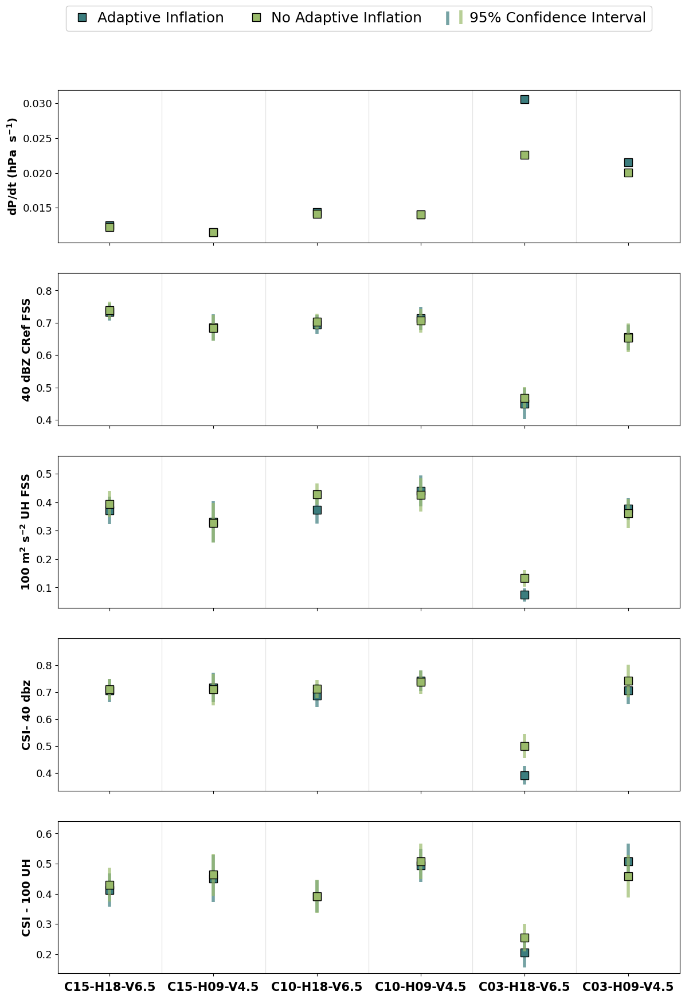

In [344]:
exps = ['C03_H18_V6','C03_H18_V6_noAI','C03_H09_V4','C03_H09_V4_noAI',]

exps = ['C15_H18_V6','C15_H09_V4','C10_H18_V6','C10_H09_V4','C03_H18_V6','C03_H09_V4']

fig, axes = plt.subplots(5,1, sharex=True, figsize=(14,20))

n = 36
max_val = 36
n_boot = 10000
indices = generate_bootstrap_indices(n, max_val, n_boot, seed=42)

interval=95

version = 'raw'

colors = list(cmaps.pride(np.linspace(.17,.78, len(exps))))
#colors = [colors[i] for i in [0,1,3,2]]

colors = cmaps.pride([0.25, 0.4])
ls     = ['--', '-', '--', '-']


ls     = '-'
lw     = 2
alpha  = 0.8
marker = 's'
ms     = 10


offset = [-0.05, 0.05]
offset = [0,0]


for ei, exp in enumerate(exps):

  

    for ai, add in enumerate(['', '_noAI']):

        if ai == 0: name = 'Adaptive Inflation'
        else: name = "No Adaptive Inflation"


        exp = exp+add
        
        path = os.path.join("/work/jessica.mcdonald/CM1_LETKF_2025/experiments/", exp)

        xoff = offset[ai]

        
        #### plot 1 - balance
        wtg = xr.open_dataset(f'{path}/balance.nc')
        stop = findnearest(wtg.time, 120)
        
        pres = np.mean(wtg.divc.values[:stop])/100
        pres_ci = compute_ci_perc(bootstrap_fss_from_indices(wtg.divc.values[:stop].mean(axis=0).flatten()/100, indices), interval)
        wtg.close()

       

        axes[0].errorbar(ei+xoff, pres, yerr=pres_ci, marker='s', ms=0,mec='k', lw=0,color=colors[ai], elinewidth=4,capsize=0, alpha=0.7)
        axes[0].plot(ei+xoff, pres, color=colors[ai], ls=ls, marker=marker,markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)


        #### plot 2 = FSS
        #fss_vals, ci_val = generate_CI_FSS(exp, 'compdz', neighborhood=24, thresh=40, fcsts=['FORECAST_20240508_2100', ''], fcst_split=True)

        fss_vals, ci_val = generate_CI_FSS(exp, 'compdz', neighborhood=24, thresh=40, fcsts=[''])
        
        
        axes[1].errorbar(ei+xoff,fss_vals[-1], yerr=ci_val, marker='s', ms=0,mec='k', lw=0,color=colors[ai], elinewidth=4,capsize=0,alpha=0.7)
        axes[1].plot(ei+xoff, fss_vals[-1], color=colors[ai], ls=ls, marker=marker,markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)


        # diff = get_stat_difference_1val(fss_vals[0], fss_vals[1], ci_val)
        # if diff == -1:     
        #     axes[1].plot(ei+xoff, .92, marker = 'v', markeredgecolor=colors[ai], markerfacecolor=colors[ai], lw=0, markersize=8, transform = transforms.blended_transform_factory(axes[1].transData,axes[1].transAxes))
        # if diff == 1:
        #     axes[1].plot(ei+xoff, .92, marker = '^', markeredgecolor=colors[ai], markerfacecolor=colors[ai], lw=0, markersize=8, transform = transforms.blended_transform_factory(axes[1].transData,axes[1].transAxes))
           


        #### plot 3 = FSS
        #fss_vals, ci_val = generate_CI_FSS(exp, 'uh2to5', neighborhood=24, thresh=100, fcsts=['FORECAST_20240508_2100', ''], fcst_split=True)
        fss_vals, ci_val = generate_CI_FSS(exp, 'uh2to5', neighborhood=24, thresh=100, fcsts=[''])
        
        axes[2].errorbar(ei+xoff,fss_vals[-1], yerr=ci_val, marker='s', ms=0,mec='k', lw=0,color=colors[ai], elinewidth=4,capsize=0, alpha=0.7)
        axes[2].plot(ei+xoff, fss_vals[-1], color=colors[ai], ls=ls, marker=marker,markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)


        val_dct, ci_dct = generate_CI_contigency(exp,'compdbz', fcsts=[''])
        axes[3].errorbar(ei+xoff,val_dct['CSI'], yerr=ci_dct['CSI'], marker='s', ms=0,mec='k', lw=0,color=colors[ai], elinewidth=4,capsize=0, alpha=0.7)
        axes[3].plot(ei+xoff,val_dct['CSI'], color=colors[ai], ls=ls, marker=marker,markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)


        val_dct, ci_dct = generate_CI_contigency(exp,'UH', fcsts=[''])
        axes[4].errorbar(ei+xoff,val_dct['CSI'], yerr=ci_dct['CSI'], marker='s', ms=0,mec='k', lw=0,color=colors[ai], elinewidth=4,capsize=0, alpha=0.7)
        axes[4].plot(ei+xoff,val_dct['CSI'], color=colors[ai], ls=ls, marker=marker,markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)
    

    

axes[-1].set_xticks(np.arange(0, len(exps)),[rename(exp, version='FULL') for exp in exps], weight='bold', fontsize=15)
axes[-1].tick_params(axis='x', which='major', pad=7)

for ax in axes:
    ax.set_xlim(-0.5, len(exps)-0.5)
    _=[ax.axvline(hl+.5, color='k', alpha=0.1, lw=1) for hl in np.arange(0, len(exps))]


for ax in axes[1:]:
    y0,y1 = ax.get_ylim()
    ax.set_ylim(y0, y1 + 0.09*y1)



# set labels
unit = r'm$\mathbf{^2}$ s$\mathbf{^{-2}}$'
labels = ["dP/dt (hPa  s$\mathbf{^{-1}}$)", '40 dBZ CRef FSS',f'100 {unit} UH FSS', 'CSI- 40 dbz', 'CSI - 100 UH']
for li, l in enumerate(labels): axes[li].set_ylabel(l, fontsize=14)


axes[0].scatter(-1.5,.02, marker='|', linewidth=4, s=300, color='w', alpha=0.7, label='95% Confidence Interval')

plt.draw()

handles, labels =axes[0].get_legend_handles_labels()
by_label = dict(zip(labels, handles))

leg=fig.legend(by_label.values(),by_label.keys(), fontsize=18, scatterpoints=2, markerscale=1., loc='upper center', bbox_to_anchor=(0.5, .96), ncol=4, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
leg.legend_handles[2].set_facecolors(colors)


In [341]:
val_dct['CSI']

np.float64(0.7053045186640472)

# Balance vs Forecast Skill


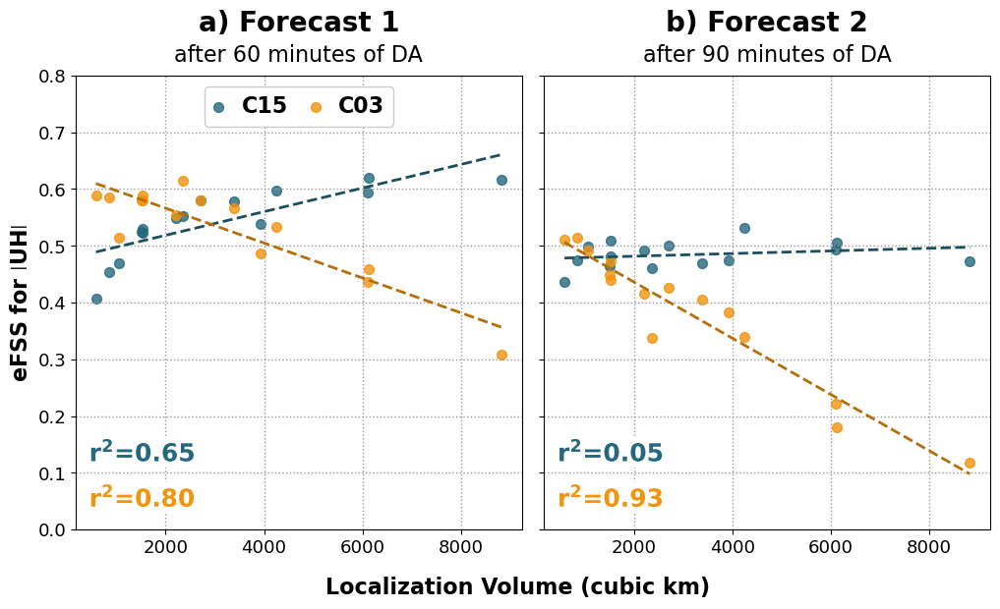

In [19]:

def plot_reg_quick(ax, varx, vary, color):
    varx = varx[np.isnan(varx) == False]
    vary = vary[np.isnan(vary) == False]
    slope1, intercept1, rvalue1, pval, stderr = scipy.stats.linregress(varx, vary)
    a1x = np.linspace(np.nanmin(varx)-.001, np.nanmax(varx)+.001, 3)
    ax.plot(a1x, slope1*a1x+intercept1, color=color, linestyle='--',lw=2, alpha=1)
    return rvalue1, slope1


fig, axes = plt.subplots(1,2, figsize=(12,6), sharex=True, sharey=True)


colors = cmaps.pride([0.2, 0.6, 0.75])

for ci, cint in enumerate([15,3]):

    fpaths = sorted([f for f in glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{cint:02d}*") if len(os.path.basename(f)) == 10 ])

    temp = np.zeros((2, len(fpaths)*len(fcsts)))

    for fi,f in enumerate(fpaths):


        for fc, fcst in enumerate(['FORECAST_20240508_2100', '']):
            
       
            

            name = rename(os.path.basename(f), version='full')
                    
            h = float(name.split('-')[1][1:])
            v = float(name.split('-')[2][1:])
            volume = (4/3)*np.pi*v*h*h

            temp[0, fi + (fc*len(fpaths))] = volume
        
        
        
            var = 'uh2to5'# allvar[i]
            thresh=100 #allthresh[i]
    
        
            ds = xr.open_dataset(os.path.join(f, fcst, f'fss_{var}.nc' ))
            neighborhoods = ds.SCALES.values*1000
            th_i = findnearest(ds.FCST_THLDS[0].values, thresh)
            n_i  = findnearest(neighborhoods, 24)
            CSI = np.mean(ds.EFSS[:,n_i, th_i].values)
            ds.close()

            axes[fc].scatter(volume, CSI, marker = 'o', color=colors[ci], s=50, alpha=0.8, label=os.path.basename(f).split('_')[0])


            temp[1, fi + (fc*len(fpaths))] = CSI
             
    for fc in range(len(fcsts)):
        darkened_color = darken_rgba_color(*colors[ci], factor=0.25)
        
        r1,s1 = plot_reg_quick(axes[fc],temp[0, 0+len(fpaths)*(fc):len(fpaths)*(fc+1)], temp[1,0+len(fpaths)*(fc):len(fpaths)*(fc+1)], darkened_color)
        #r2,s2 = plot_reg_quick(axes[fc],temp[0,0+len(fpaths)*(fc):len(fpaths)*(fc+1)], temp[2,0+len(fpaths)*(fc):len(fpaths)*(fc+1)], darkened_color)

        shift = .1 * ci
        axes[fc].text(.03, .15-shift, r'r$\mathbf{^2}$='+f'{r1**2:.2f}', transform=axes[fc].transAxes, fontsize=18, weight='bold',color=colors[ci],path_effects =[path_effects.Stroke(linewidth=10, foreground='w'),path_effects.Normal()])
        #axes[1,fc].text(.03, .15-shift, r'r$\mathbf{^2}$='+f'{r2**2:.2f}', transform=axes[1,fc].transAxes, fontsize=18, weight='bold',color=colors[ci],path_effects =[path_effects.Stroke(linewidth=10, foreground='w'),path_effects.Normal()])


for ax in axes.flatten():
    ax.grid()
    ax.set_ylim(0,0.8)
    
axes[0].set_ylabel(r'eFSS for $\mathbf{\left| {UH} \right|}$',   weight='bold',fontsize=16)

handles, labels = axes[0].get_legend_handles_labels()
unique_items = dict(zip(labels, handles))
axes[0].legend(unique_items.values(), unique_items.keys(), loc='upper center', ncol=4,prop={'size':16, 'weight':'bold'} , columnspacing=1, handlelength=.5)


fig.text(0.5, 0.0, 'Localization Volume (cubic km)', weight='bold', fontsize=16, ha='center')

plt.subplots_adjust(hspace=0.05, wspace=0.05)

#axes[1].set_xlim(0.006, 0.038)
axes[0].set_title('a) Forecast 1', weight='bold',fontsize=20, y=1.08)
axes[1].set_title('b) Forecast 2', weight='bold',fontsize=20, y=1.08)

axes[0].text(0.5, 1.03, 'after 60 minutes of DA', fontsize=16, ha='center', transform=axes[0].transAxes)
axes[1].text(0.5, 1.03, 'after 90 minutes of DA', fontsize=16, ha='center', transform=axes[1].transAxes)


# FIGNAME = 'BothForecastRegression'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')

['/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C15_H07_V2', '/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C15_H07_V4', '/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C15_H07_V6', '/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C15_H09_V2', '/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C15_H09_V4', '/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C15_H09_V6', '/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C15_H12_V2', '/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C15_H12_V4', '/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C15_H12_V6', '/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C15_H15_V2', '/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C15_H15_V4', '/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C15_H15_V6', '/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C15_H18_V2', '/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C15_H18_V4', '/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C15_H18_V6']
['/work/jessica.mcdonald/CM1_LETKF_2025

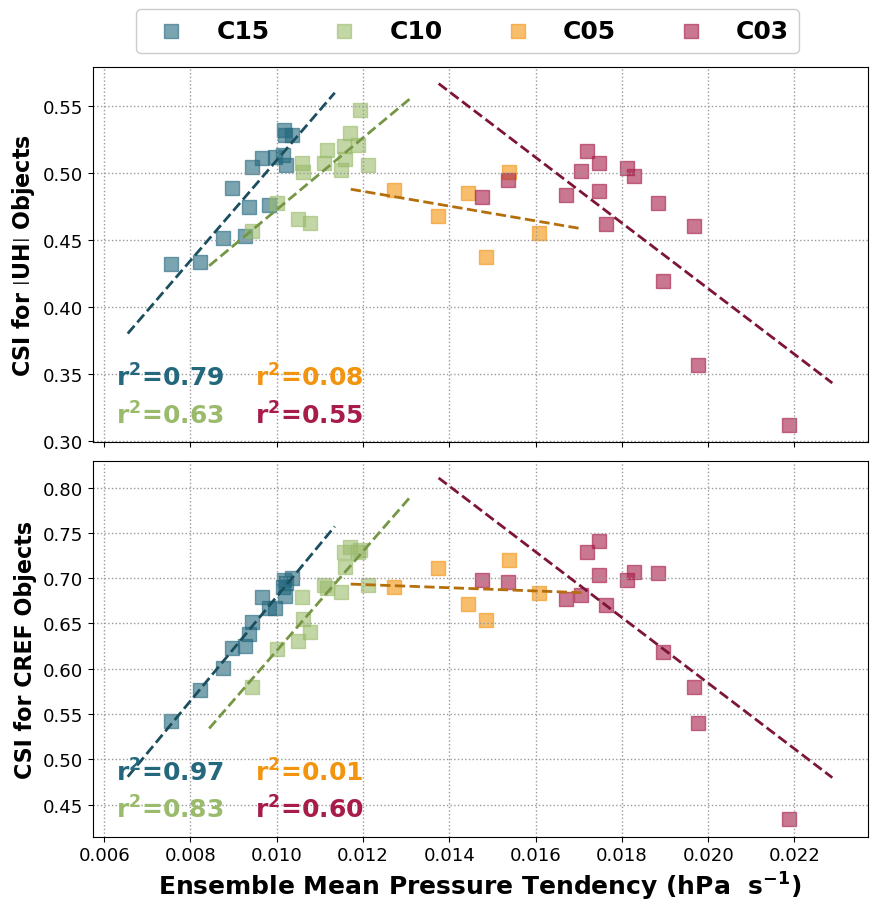

In [117]:



PLOT_VERSION = 'CSI'#'eFSS' # CSI

FORECAST = 1 #2, 'both'


if FORECAST == 2:
    fcsts = ['']
    stops = [120]
elif FORECAST == 1:
    fcsts = ['FORECAST_20240508_2100']
    stops = [90]
else:
    fcsts = ['FORECAST_20240508_2100', '']
    stops = [90, 120]
    


freqs = [15,10,5, 3]
#freqs = [5]

fig, axes = plt.subplots(2,1, figsize=(10,10), sharex=True)

allthresh = [100,40]
colors = cmaps.pride([0.2, 0.6, 0.8])
colors = cmaps.pride([0.2,0.4, 0.6, 0.8])

if PLOT_VERSION == 'CSI':
    allvar = ['UH', 'compdbz']
    axes[0].set_ylabel(r'CSI for $\mathbf{\left| {UH} \right|}$ Objects',   weight='bold',fontsize=16)
    axes[1].set_ylabel('CSI for CREF Objects', weight='bold',fontsize=16)


if PLOT_VERSION=='eFSS':
    axes[0].set_ylabel('eFSS for UH',   weight='bold',fontsize=16)
    axes[1].set_ylabel('eFSS for CREF', weight='bold',fontsize=16)
    allvar = ['uh2to5','compdz']
    

xshift = [0,0,1,1]
yshift = [0,1,0,1]
#marker_size={'18':300, '15':250, '12':200, '9':150, '7': 100}

for ci, cint in enumerate(freqs):

    fpaths = sorted([f for f in glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{cint:02d}*") if len(os.path.basename(f)) == 10 ])
    #fpaths = sorted([f for f in glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{cint:02d}*H18*")+glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{cint:02d}*H09*") if len(os.path.basename(f)) == 10 ])
    
    print(fpaths)
    temp = np.zeros((3, len(fpaths)*len(fcsts)))

    for fi,f in enumerate(fpaths):

        try:
        #print(f)
            wtg = xr.open_dataset(f'{f}/balance.nc')
    
            for fc, fcst in enumerate(fcsts):
                
                stop = findnearest(wtg.time, stops[fc])
                dpdt =  np.mean(wtg.divc.values[:stop])/100
                temp[0, fi + (fc*len(fpaths))] = dpdt
            
            
                for i in range(2):
            
                    var = allvar[i]
                    thresh=allthresh[i]
            
                    if PLOT_VERSION=='CSI':
                       
                        perf = xr.open_dataset(f'{f}/{fcst}/performance_{var}_{thresh}.nc' )
                        a,b,c = perf['hits'][-13:].sum().values, perf['false_alarms'][-13:].sum().values,perf['misses'][-13:].sum().values
                        CSI = a / (a+b+c)
                    
    
                    if PLOT_VERSION=='eFSS':
                        ds = xr.open_dataset(os.path.join(f, fcst, f'fss_{var}.nc' ))
                        neighborhoods = ds.SCALES.values*1000
                        th_i = findnearest(ds.FCST_THLDS[0].values, thresh)
                        n_i  = findnearest(neighborhoods, 24)
                        CSI = np.mean(ds.EFSS[:,n_i, th_i].values)
                        ds.close()
    
                    # if fc ==0:
                    #     axes[i].scatter(dpdt, CSI, marker = marker_type[f.split('_')[-1][1:]], color=colors[ci], s=marker_size[f.split('_')[-2][1:]], alpha=0.6, label=os.path.basename(f).split('_')[0])
                    # if fc == 1:
                    #     axes[i].scatter(dpdt, CSI, marker = 's', color=colors[ci], s=100, alpha=0.6, label=os.path.basename(f).split('_')[0])

                    axes[i].scatter(dpdt, CSI, marker = 's', color=colors[ci], s=100, alpha=0.6, label=os.path.basename(f).split('_')[0])
    
                    #axes[i].text(dpdt, CSI, os.path.basename(f)[-6:])
        
                    temp[i+1, fi + (fc*len(fpaths))] = CSI
                    axes[i].grid()
    
            wtg.close()
        except:
            temp[:, fi + (fc*15)] = np.nan

    darkened_color = darken_rgba_color(*colors[ci], factor=0.25)
    r1 = plot_reg_quick(axes[0],temp[0], temp[1], darkened_color)
    r2 = plot_reg_quick(axes[1],temp[0], temp[2], darkened_color)

    # shift = .1 * ci
    # axes[0].text(.03, .35-shift, r'r$\mathbf{^2}$='+f'{r1**2:.2f}', transform=axes[0].transAxes, fontsize=18, weight='bold',color=colors[ci])
    # axes[1].text(.03, .35-shift, r'r$\mathbf{^2}$='+f'{r2**2:.2f}', transform=axes[1].transAxes, fontsize=18, weight='bold',color=colors[ci])

   
    ys = .1 * yshift[ci]
    xs= .18 * xshift[ci]
    axes[0].text(.03+xs, .15-ys, r'r$\mathbf{^2}$='+f'{r1**2:.2f}', transform=axes[0].transAxes, fontsize=18, weight='bold',color=colors[ci])
    axes[1].text(.03+xs, .15-ys, r'r$\mathbf{^2}$='+f'{r2**2:.2f}', transform=axes[1].transAxes, fontsize=18, weight='bold',color=colors[ci])




handles, labels = axes[0].get_legend_handles_labels()
unique_items = dict(zip(labels, handles))
fig.legend(unique_items.values(), unique_items.keys(), loc='upper center', ncol=len(freqs), prop={'size':18, 'weight':'bold'}, bbox_to_anchor=(0.5, .95))


axes[1].set_xlabel(r'Ensemble Mean Pressure Tendency (hPa  s$\mathbf{^{-1}}$)', weight='bold', fontsize=18);

plt.subplots_adjust(hspace=0.05)

#axes[1].set_xlim(0.006, 0.038)


Text(0.5, 1.02, 'Second Forecast')

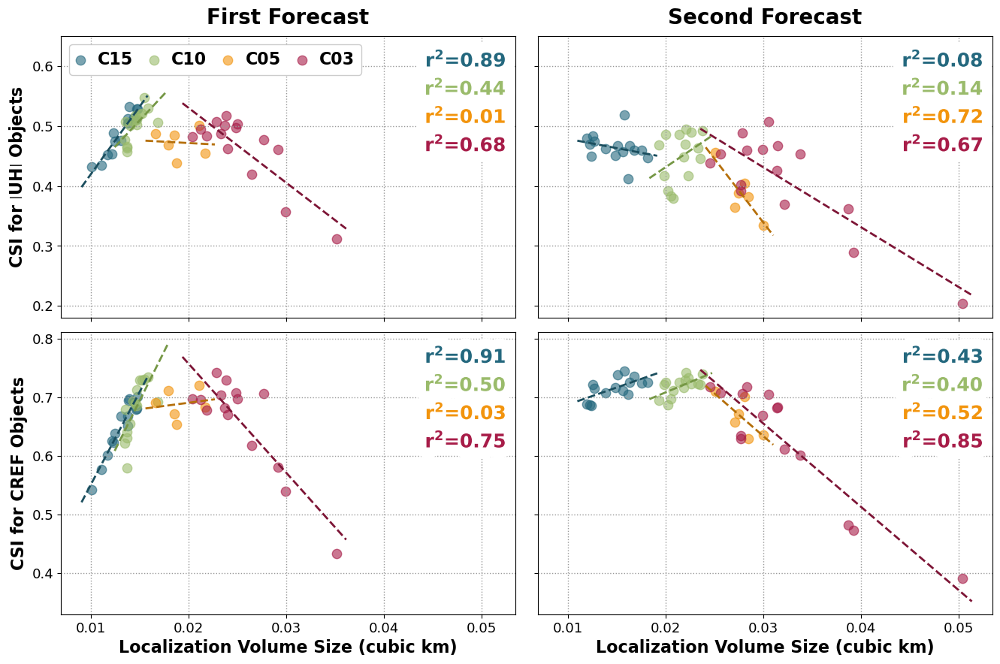

In [18]:



PLOT_VERSION = 'CSI'#'eFSS' # CSI
#PLOT_VERSION = 'eFSS' 

FORECAST = 1 #2, 'both'


if FORECAST == 2:
    fcsts = ['']
    stops = [120]
elif FORECAST == 1:
    fcsts = ['FORECAST_20240508_2100']
    stops = [90]
else:
    fcsts = ['FORECAST_20240508_2100', '']
    stops = [90, 120]
    
fcsts = ['FORECAST_20240508_2100', '']
stops = [90, 120]
freqs = [15,10,5, 3]

#freqs = [5]

fig, axes = plt.subplots(2,2, figsize=(16,10), sharex=True, sharey='row')

allthresh = [100,40]
colors = cmaps.pride([0.2, 0.6, 0.8])
colors = cmaps.pride([0.2,0.4, 0.6, 0.8])

if PLOT_VERSION == 'CSI':
    allvar = ['UH', 'compdbz']
    axes[0,0].set_ylabel(r'CSI for $\mathbf{\left| {UH} \right|}$ Objects',   weight='bold',fontsize=16)
    axes[1,0].set_ylabel('CSI for CREF Objects', weight='bold',fontsize=16)


if PLOT_VERSION=='eFSS':
    axes[0,0].set_ylabel('eFSS for UH',   weight='bold',fontsize=16)
    axes[1,0].set_ylabel('eFSS for CREF', weight='bold',fontsize=16)
    allvar = ['uh2to5','compdz']
    

xshift = [0,0,1,1]
yshift = [0,1,0,1]
#marker_size={'18':300, '15':250, '12':200, '9':150, '7': 100}

for ci, cint in enumerate(freqs):

    fpaths = sorted([f for f in glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{cint:02d}*") if len(os.path.basename(f)) == 10 ])
    #fpaths = sorted([f for f in glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{cint:02d}*H18*")+glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{cint:02d}*H09*") if len(os.path.basename(f)) == 10 ])

    temp = np.zeros((3, len(fpaths)*len(fcsts)))

    for fi,f in enumerate(fpaths):

       # try:
        #print(f)
        wtg = xr.open_dataset(f'{f}/balance.nc')

        for fc, fcst in enumerate(fcsts):
            
            stop = findnearest(wtg.time, stops[fc])
            dpdt =  np.mean(wtg.divc.values[int(stop - ((60*10)/6)):stop])/100
            temp[0, fi + (fc*len(fpaths))] = dpdt
        
        
            for i in range(2):
        
                var = allvar[i]
                thresh=allthresh[i]
        
                if PLOT_VERSION=='CSI':
                   
                    perf = xr.open_dataset(f'{f}/{fcst}/performance_{var}_{thresh}.nc' )
                    a,b,c = perf['hits'][-13:].sum().values, perf['false_alarms'][-13:].sum().values,perf['misses'][-13:].sum().values
                    CSI = a / (a+b+c)
                

                if PLOT_VERSION=='eFSS':
                    ds = xr.open_dataset(os.path.join(f, fcst, f'fss_{var}.nc' ))
                    neighborhoods = ds.SCALES.values*1000
                    th_i = findnearest(ds.FCST_THLDS[0].values, thresh)
                    n_i  = findnearest(neighborhoods, 24)
                    CSI = np.mean(ds.EFSS[:,n_i, th_i].values)
                    ds.close()

                # if fc ==0:
                #     axes[i].scatter(dpdt, CSI, marker = marker_type[f.split('_')[-1][1:]], color=colors[ci], s=marker_size[f.split('_')[-2][1:]], alpha=0.6, label=os.path.basename(f).split('_')[0])
                # if fc == 1:
                #     axes[i].scatter(dpdt, CSI, marker = 's', color=colors[ci], s=100, alpha=0.6, label=os.path.basename(f).split('_')[0])

                axes[i,fc].scatter(dpdt, CSI, marker = 'o', color=colors[ci], s=80, alpha=0.6, label=os.path.basename(f).split('_')[0])

                #axes[i].text(dpdt, CSI, os.path.basename(f)[-6:])
    
                temp[i+1, fi + (fc*len(fpaths))] = CSI
                axes[i,fc].grid()

        wtg.close()
        # except:
        #     temp[:, fi + (fc*15)] = np.nan

    for fc in range(len(fcsts)):
        darkened_color = darken_rgba_color(*colors[ci], factor=0.25)
        
        r1 = plot_reg_quick(axes[0,fc],temp[0, 0+len(fpaths)*(fc):len(fpaths)*(fc+1)], temp[1,0+len(fpaths)*(fc):len(fpaths)*(fc+1)], darkened_color)
        r2 = plot_reg_quick(axes[1,fc],temp[0, 0+len(fpaths)*(fc):len(fpaths)*(fc+1)], temp[2,0+len(fpaths)*(fc):len(fpaths)*(fc+1)], darkened_color)

        shift = .1 * ci
        axes[0,fc].text(.98, .95-shift, r'r$\mathbf{^2}$='+f'{r1**2:.2f}', transform=axes[0,fc].transAxes, ha='right', va='top',fontsize=18, weight='bold',color=colors[ci],path_effects =[path_effects.Stroke(linewidth=20, foreground='w'),path_effects.Normal()])
        axes[1,fc].text(.98, .95-shift, r'r$\mathbf{^2}$='+f'{r2**2:.2f}', transform=axes[1,fc].transAxes, ha='right', va='top',fontsize=18, weight='bold',color=colors[ci],path_effects =[path_effects.Stroke(linewidth=20, foreground='w'),path_effects.Normal()])

       
        # ys = .1 * yshift[ci]
        # xs= .22 * xshift[ci]
        # axes[0,fc].text(.03+xs, .15-ys, r'r$\mathbf{^2}$='+f'{r1**2:.2f}', transform=axes[0,fc].transAxes, fontsize=18, weight='bold',color=colors[ci])
        # axes[1,fc].text(.03+xs, .15-ys, r'r$\mathbf{^2}$='+f'{r2**2:.2f}', transform=axes[1,fc].transAxes, fontsize=18, weight='bold',color=colors[ci])

        


axes[0,0].set_ylim(.18, .65)

handles, labels = axes[0,0].get_legend_handles_labels()
unique_items = dict(zip(labels, handles))
# fig.legend(unique_items.values(), unique_items.keys(), loc='upper center', ncol=len(freqs), prop={'size':18, 'weight':'bold'}, bbox_to_anchor=(0.5, .95))
axes[0,0].legend(unique_items.values(), unique_items.keys(), loc='upper left', ncol=4,prop={'size':16, 'weight':'bold'} , columnspacing=1, handlelength=.5)


axes[1,0].set_xlabel(r'Ensemble Mean Pressure Tendency (hPa  s$\mathbf{^{-1}}$)', weight='bold', fontsize=16);

axes[1,1].set_xlabel(r'Ensemble Mean Pressure Tendency (hPa  s$\mathbf{^{-1}}$)', weight='bold', fontsize=16);

plt.subplots_adjust(hspace=0.05, wspace=0.05)

#axes[1].set_xlim(0.006, 0.038)
axes[0,0].set_title('First Forecast', weight='bold',fontsize=20, y=1.02)
axes[0,1].set_title('Second Forecast', weight='bold',fontsize=20, y=1.02)

TypeError: list indices must be integers or slices, not tuple

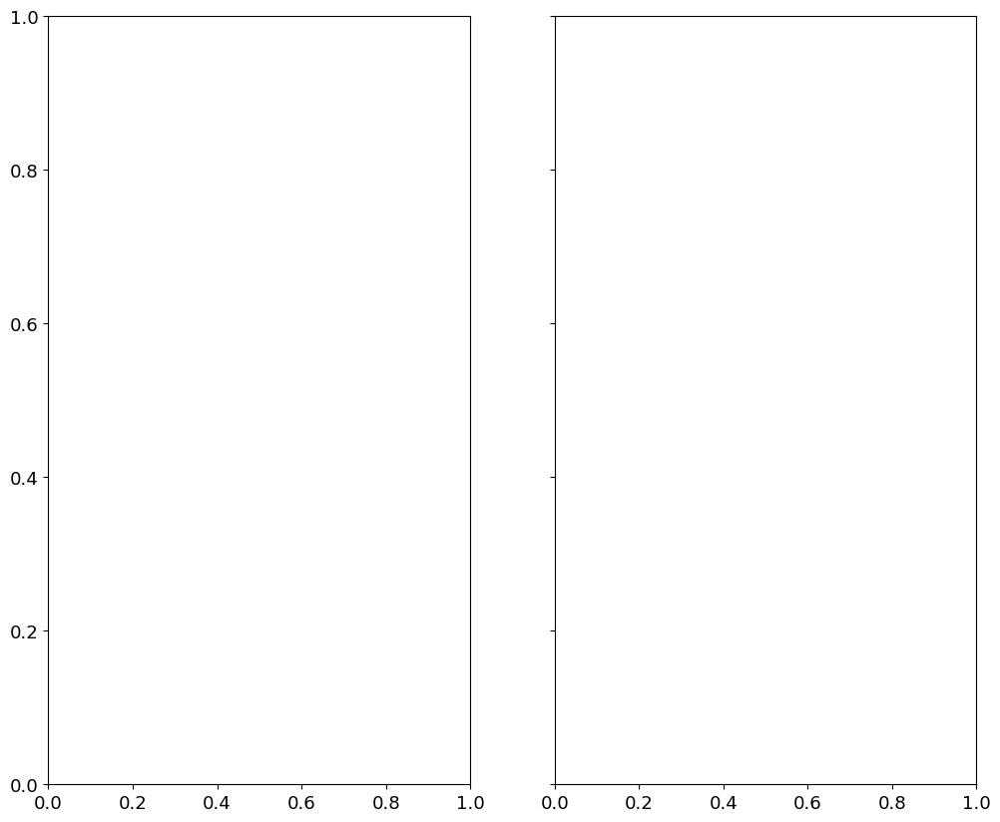

In [49]:

def plot_reg_quick(ax, varx, vary, color):
    varx = varx[np.isnan(varx) == False]
    vary = vary[np.isnan(vary) == False]
    slope1, intercept1, rvalue1, pval, stderr = scipy.stats.linregress(varx, vary)
    a1x = np.linspace(np.nanmin(varx)-.001, np.nanmax(varx)+.001, 3)
    ax.plot(a1x, slope1*a1x+intercept1, color=color, linestyle='--',lw=2, alpha=1)
    return rvalue1, slope1


PLOT_VERSION = 'CSI'#'eFSS' # CSI
PLOT_VERSION = 'eFSS' 

FORECAST = 1 #2, 'both'


if FORECAST == 2:
    fcsts = ['']
    stops = [120]
elif FORECAST == 1:
    fcsts = ['FORECAST_20240508_2100']
    stops = [90]
else:
    fcsts = ['FORECAST_20240508_2100', '']
    stops = [90, 120]
    
fcsts = ['FORECAST_20240508_2100', '']
stops = [90, 120]
freqs = [15, 3]

#freqs = [5]

fig, axes = plt.subplots(2,2, figsize=(12,10), sharex=True, sharey=True)

allthresh = [100,40]
colors = cmaps.pride([0.2, 0.6, 0.75])
#colors = cmaps.pride([0.2,0.4, 0.6, 0.8])

if PLOT_VERSION == 'CSI':
    allvar = ['UH', 'compdbz']
    axes[0,0].set_ylabel(r'CSI for $\mathbf{\left| {UH} \right|}$ Objects',   weight='bold',fontsize=16)
    axes[1,0].set_ylabel('CSI for CREF Objects', weight='bold',fontsize=16)


if PLOT_VERSION=='eFSS':
    axes[0,0].set_ylabel(r'eFSS for $\mathbf{\left| {UH} \right|}$',   weight='bold',fontsize=16)
    axes[1,0].set_ylabel('eFSS for CREF', weight='bold',fontsize=16)
    allvar = ['uh2to5','compdz']
    

xshift = [0,0,1,1]
yshift = [0,1,0,1]
#marker_size={'18':300, '15':250, '12':200, '9':150, '7': 100}

for ci, cint in enumerate(freqs):

    fpaths = sorted([f for f in glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{cint:02d}*") if len(os.path.basename(f)) == 10 ])
    #fpaths = sorted([f for f in glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{cint:02d}*H18*")+glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{cint:02d}*H09*") if len(os.path.basename(f)) == 10 ])

    temp = np.zeros((3, len(fpaths)*len(fcsts)))

    for fi,f in enumerate(fpaths):


        for fc, fcst in enumerate(fcsts):
            
       
            

            name = rename(os.path.basename(f), version='full')
                    
            h = float(name.split('-')[1][1:])
            v = float(name.split('-')[2][1:])
            volume = (4/3)*np.pi*v*h*h

            temp[0, fi + (fc*len(fpaths))] = volume
        
        
            for i in range(2):
        
                var = allvar[i]
                thresh=allthresh[i]
        
                if PLOT_VERSION=='CSI':
                   
                    perf = xr.open_dataset(f'{f}/{fcst}/performance_{var}_{thresh}.nc' )
                    a,b,c = perf['hits'][-13:].sum().values, perf['false_alarms'][-13:].sum().values,perf['misses'][-13:].sum().values
                    CSI = a / (a+b+c)
                

                if PLOT_VERSION=='eFSS':
                    ds = xr.open_dataset(os.path.join(f, fcst, f'fss_{var}.nc' ))
                    neighborhoods = ds.SCALES.values*1000
                    th_i = findnearest(ds.FCST_THLDS[0].values, thresh)
                    n_i  = findnearest(neighborhoods, 24)
                    CSI = np.mean(ds.EFSS[:,n_i, th_i].values)
                    ds.close()

                axes[i,fc].scatter(volume, CSI, marker = 'o', color=colors[ci], s=50, alpha=0.8, label=os.path.basename(f).split('_')[0])

    
                temp[i+1, fi + (fc*len(fpaths))] = CSI
             
    for fc in range(len(fcsts)):
        darkened_color = darken_rgba_color(*colors[ci], factor=0.25)
        
        r1,s1 = plot_reg_quick(axes[0,fc],temp[0, 0+len(fpaths)*(fc):len(fpaths)*(fc+1)], temp[1,0+len(fpaths)*(fc):len(fpaths)*(fc+1)], darkened_color)
        r2,s2 = plot_reg_quick(axes[1,fc],temp[0,0+len(fpaths)*(fc):len(fpaths)*(fc+1)], temp[2,0+len(fpaths)*(fc):len(fpaths)*(fc+1)], darkened_color)

        shift = .1 * ci
        axes[0,fc].text(.03, .15-shift, r'r$\mathbf{^2}$='+f'{r1**2:.2f}', transform=axes[0,fc].transAxes, fontsize=18, weight='bold',color=colors[ci],path_effects =[path_effects.Stroke(linewidth=10, foreground='w'),path_effects.Normal()])
        axes[1,fc].text(.03, .15-shift, r'r$\mathbf{^2}$='+f'{r2**2:.2f}', transform=axes[1,fc].transAxes, fontsize=18, weight='bold',color=colors[ci],path_effects =[path_effects.Stroke(linewidth=10, foreground='w'),path_effects.Normal()])


for ax in axes.flatten():
    ax.grid()
    ax.set_ylim(0,1)
#axes[0,0].set_ylim(.05, .7)

handles, labels = axes[0,0].get_legend_handles_labels()
unique_items = dict(zip(labels, handles))
axes[0,1].legend(unique_items.values(), unique_items.keys(), loc='upper right', ncol=4,prop={'size':16, 'weight':'bold'} , columnspacing=1, handlelength=.5)


# axes[1,0].set_xlabel(r'Localization Volume (cubic km)', weight='bold', fontsize=16);

# axes[1,1].set_xlabel(r'Localization Volume (cubic km)', weight='bold', fontsize=16);

fig.text(0.5, 0.05, 'Localization Volume (cubic km)', weight='bold', fontsize=16, ha='center')

plt.subplots_adjust(hspace=0.05, wspace=0.05)

#axes[1].set_xlim(0.006, 0.038)
axes[0,0].set_title('a) Forecast 1', weight='bold',fontsize=20, y=1.1)
axes[0,1].set_title('b) Forecast 2', weight='bold',fontsize=20, y=1.1)

axes[0,0].text(0.5, 1.03, 'after 60 minutes of DA', fontsize=16, ha='center', transform=axes[0,0].transAxes)
axes[0,1].text(0.5, 1.03, 'after 90 minutes of DA', fontsize=16, ha='center', transform=axes[0,1].transAxes)

In [15]:
def pmm_1lev(cm1, var,t, return_mean=False):
    ''' height is in km'''

    N = cm1.sizes['ne']-1


    ens_mean = cm1[var][t, -1]
    ranked_ens =sorted(cm1[var][t, :-1].values.ravel())[::N]
    
    x,y = np.meshgrid(cm1.xh, cm1.yh)
    d = {'ens':ens_mean.values.ravel(), 'x':x.ravel(), 'y':y.ravel()}
    df = pd.DataFrame(d)
    
    df_ranked = df.sort_values(by='ens')
    df_ranked['ens'] = ranked_ens
    
    df_pmm = df_ranked.sort_index()

    if return_mean:
    
        return df_pmm['ens'].values.reshape(np.shape(x)), ens_mean
    else:
        return df_pmm['ens'].values.reshape(np.shape(x))

30,

(100.0, 160.0)

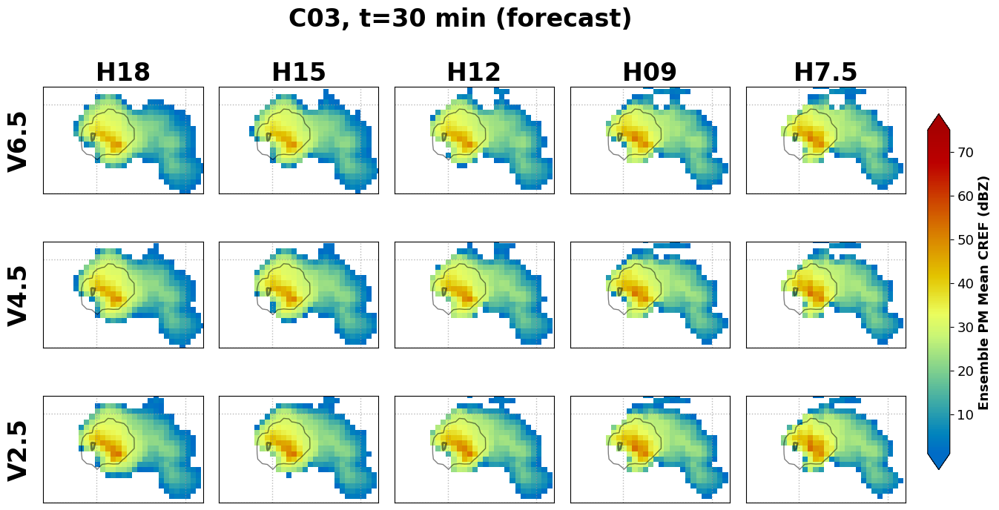

In [21]:

exps = ['C03_H18_V4']


hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]

freq = 3

# verification data set
ds = xr.open_dataset('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc')
ds = ds.rename({'UH2-5km':"UH_2-5km"})
NRtime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in ds.dates.values[:]]


#for freq in [3, 15]:


    #for time in np.arange(30, 120+freq, freq):
    
time = 30

#time = 75
fig, axes = plt.subplots(3,5, figsize=(15,8), sharex=True, sharey=True, subplot_kw={'aspect':'equal'})
print(time, end=',')

for hi, h in enumerate(hloc):
    for vi, v in enumerate(vloc):

    
        path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_analysis.nc")[0]
        #path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/F*/full_ens_fcst.nc")[0]

        
       
        cm1 = xr.open_dataset(path, decode_timedelta=True)
        xh, yh = cm1.xh.values, cm1.yh.values
        
        ti = findnearest([(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values], time)

        zi = findnearest(cm1.z.values, 2)

        ref = pmm_1lev(cm1, 'cdbz', ti)#cm1['cdbz'][ti, -1]#pmm_1lev(cm1, 'cdbz', ti)
        mref = np.where(ref > 1, ref, np.nan)

        

        im=axes[vi, hi].pcolormesh(xh, yh, mref, cmap=ctables.REF_default, vmin=1, vmax=75, shading='nearest')

        cm1.close()
        
tis =findnearest(NRtime, time) 
for ax in axes.flatten():

    ax.contour(xh,yh, ds['cdbz'][tis], colors='k', levels=[50, 200], linewidths=2, alpha=0.5)
    ax.contour(xh,yh, ds['cdbz'][tis], colors='k', levels=[1, 200], linewidths=1, alpha=0.5)
    
    ax.set_xticks(np.arange(0, 400, 50),np.arange(0, 400, 50))
    ax.set_yticks(np.arange(0, 400, 50),np.arange(0, 400, 50))
    ax.grid(ls=':', alpha=0.7)
    ax.xaxis.set_major_formatter(ticker.NullFormatter())
    ax.yaxis.set_major_formatter(ticker.NullFormatter())
    ax.tick_params(left=False, bottom=False)


for ax, h in zip(axes[0,:],hloc):
    ax.set_title(rename(f'C03_H{h:02d}_V4', version='H').split('-')[1], weight='bold', fontsize=24)
for ax, v in zip(axes[:,0],vloc):
    ax.set_ylabel(rename(f'C03_H09_V{v}', version='V').split('-')[1], weight='bold', fontsize=24)

# all storms
axes[0,0].set_xlim(40,xh.max())
axes[0,0].set_ylim(20,300)


cbar_ax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
cbar = fig.colorbar(im, cax=cbar_ax, extend='both')
cbar.set_label('Ensemble PM Mean CREF (dBZ)', weight='bold')

plt.suptitle(f'C{freq:02d}, t={time} min (forecast)',fontsize=24, weight='bold')#, ha='left', x=0.125, weight='bold', y=1.0)

plt.subplots_adjust(hspace=0.05, wspace=0.1)

axes[0,0].set_xlim(70,160)
axes[0,0].set_ylim(100,160)


# axes[0,0].set_xlim(80,300)
# axes[0,0].set_ylim(40+30,140+30)

30,

/tmp/ipykernel_9544/1112847507.py:81: UserWarning: Adding colorbar to a different Figure <Figure size 1500x800 with 16 Axes> than <Figure size 1500x800 with 16 Axes> which fig.colorbar is called on.
  cbar = fig.colorbar(im, cax=cbar_ax, extend='both')


(80.0, 200.0)

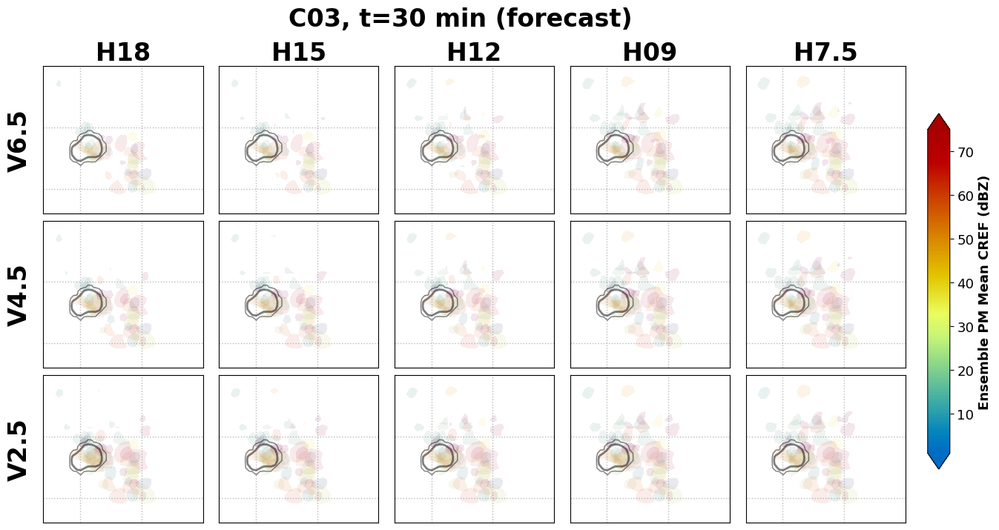

In [26]:

exps = ['C03_H18_V4']


hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]

freq = 3

# verification data set
ds = xr.open_dataset('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc')
ds = ds.rename({'UH2-5km':"UH_2-5km"})
NRtime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in ds.dates.values[:]]


#for freq in [3, 15]:


    #for time in np.arange(30, 120+freq, freq):
    
time = 30

#time = 75
fig, axes = plt.subplots(3,5, figsize=(15,8), sharex=True, sharey=True, subplot_kw={'aspect':'equal'})
print(time, end=',')

colors = cmaps.pride(np.linspace(.1, .9, 36))

for hi, h in enumerate(hloc):
    for vi, v in enumerate(vloc):

    
        path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_analysis.nc")[0]
        #path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/F*/full_ens_fcst.nc")[0]

        
       
        cm1 = xr.open_dataset(path, decode_timedelta=True)
        xh, yh = cm1.xh.values, cm1.yh.values
        
        ti = findnearest([(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values], time)

        zi = findnearest(cm1.z.values, 2)

        ref = cm1['cdbz'][ti, :]#pmm_1lev(cm1, 'cdbz', ti)
        mref = np.where(ref > 1, ref, np.nan)

        for m in range(36):
            axes[vi, hi].contourf(xh, yh, mref[m], colors = colors[m], levels=[40, 80], alpha=0.1)
            

    
        #im=axes[vi, hi].pcolormesh(xh, yh, mref, cmap=ctables.REF_default, vmin=1, vmax=75, shading='nearest')

        cm1.close()
        
tis =findnearest(NRtime, time) 
for ax in axes.flatten():

    ax.contour(xh,yh, ds['cdbz'][tis], colors='k', levels=[20, 200], linewidths=2, alpha=0.5)
    ax.contour(xh,yh, ds['cdbz'][tis], colors='k', levels=[1, 200], linewidths=1, alpha=0.5)
    
    ax.set_xticks(np.arange(0, 400, 50),np.arange(0, 400, 50))
    ax.set_yticks(np.arange(0, 400, 50),np.arange(0, 400, 50))
    ax.grid(ls=':', alpha=0.7)
    ax.xaxis.set_major_formatter(ticker.NullFormatter())
    ax.yaxis.set_major_formatter(ticker.NullFormatter())
    ax.tick_params(left=False, bottom=False)


for ax, h in zip(axes[0,:],hloc):
    ax.set_title(rename(f'C03_H{h:02d}_V4', version='H').split('-')[1], weight='bold', fontsize=24)
for ax, v in zip(axes[:,0],vloc):
    ax.set_ylabel(rename(f'C03_H09_V{v}', version='V').split('-')[1], weight='bold', fontsize=24)

# all storms
axes[0,0].set_xlim(40,xh.max())
axes[0,0].set_ylim(20,300)


cbar_ax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
cbar = fig.colorbar(im, cax=cbar_ax, extend='both')
cbar.set_label('Ensemble PM Mean CREF (dBZ)', weight='bold')

plt.suptitle(f'C{freq:02d}, t={time} min (forecast)',fontsize=24, weight='bold')#, ha='left', x=0.125, weight='bold', y=1.0)

plt.subplots_adjust(hspace=0.05, wspace=0.1)

# axes[0,0].set_xlim(70,160)
# axes[0,0].set_ylim(100,160)


axes[0,0].set_xlim(70,200)
axes[0,0].set_ylim(80,200)

# axes[0,0].set_xlim(80,300)
# axes[0,0].set_ylim(40+30,140+30)

# RMSE around cells (general plot)

120,150,180,

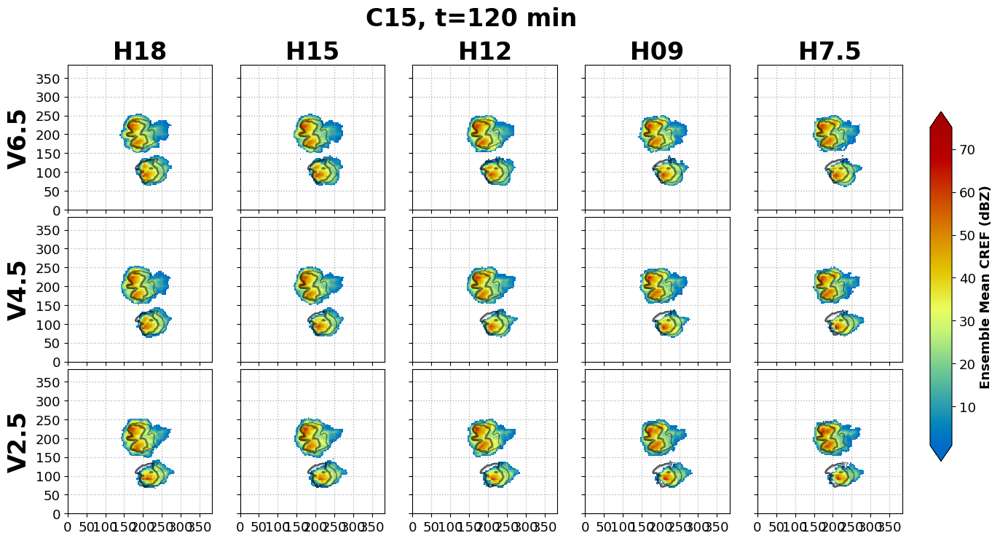

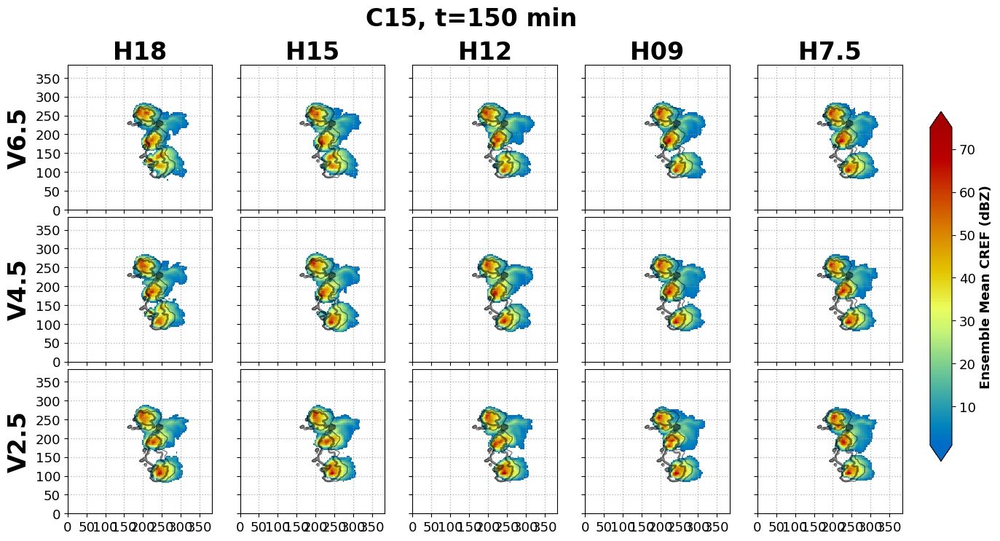

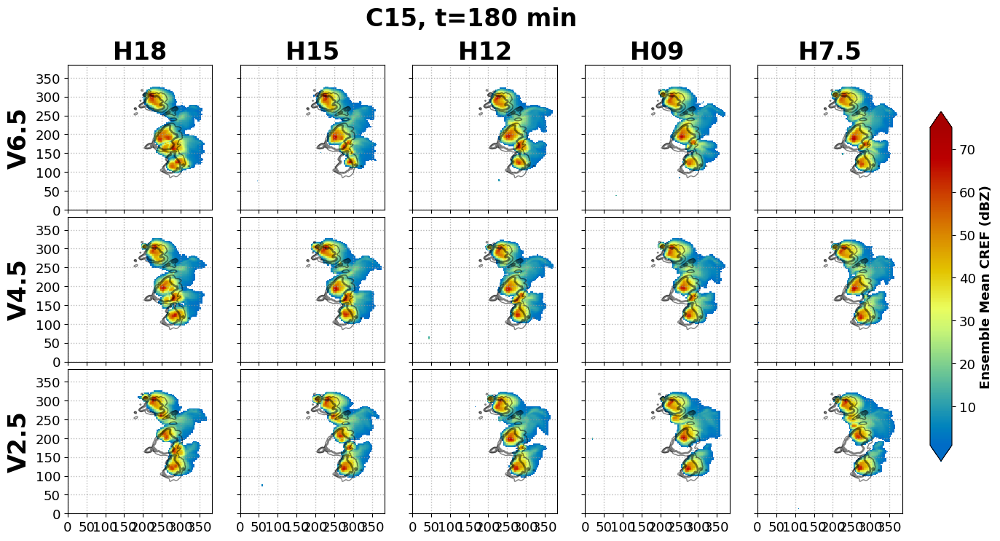

In [18]:

# southern cell
# xo = [161.0,170.2,179.0,188.3,195.0,204.1,211.5,221.2,231.3,241.7,253.8,266.1,276.6]
# yo = [61.0,69.7,76.9,83.2,89.6,88.2,93.5,97.1,101.,105.,110.,115.,119.]

# stormx = np.interp(np.arange(54, 180, 1), np.arange(54, 180, 10), xo)
# stormy = np.interp(np.arange(54, 180, 1), np.arange(54, 180, 10), yo)

# df = pd.DataFrame(np.array([stormx, stormy]).T, index= np.arange(54, 180, 1), columns = ['X','Y'])

# # northern cell 

# xo = [167.8,175.3,183.8,192.1,198.0,206.1,214.2,221.4]
# yo = [205.7,215.3,229.1,239.2,250.3,261.0,270.3,282.3]

# stormx = np.interp(np.arange(100, 180, 1), np.arange(100, 180, 10), xo)
# stormy = np.interp(np.arange(100, 180, 1), np.arange(100, 180, 10), yo)

# df = pd.DataFrame(np.array([stormx, stormy]).T, index= np.arange(100, 180, 1), columns = ['X','Y'])




xo = [110.45,119.44,127.37,135.23,143.35,152.30,162.22,167.81,175.32,183.82,192.07,198.00,206.13,214.24,221.45]
yo = [139.09,145.44,151.89,158.11,165.17,172.88,180.03,205.74,215.34,229.05,239.25,250.30,261.00,270.26,282.31]

stormx = np.interp(np.arange(30, 180, 1), np.arange(30, 180, 10), xo)
stormy = np.interp(np.arange(30, 180, 1), np.arange(30, 180, 10), yo)

df = pd.DataFrame(np.array([stormx, stormy]).T, index= np.arange(30, 180, 1), columns = ['X','Y'])



exps = ['C03_H18_V4']


hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]

freq = 15

# verification data set
ds = xr.open_dataset('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc')
ds = ds.rename({'UH2-5km':"UH_2-5km"})
NRtime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in ds.dates.values[:]]


#for freq in [3, 15]:

m = 1


    #for time in np.arange(30, 120+freq, freq):
    
for time in [120, 150, 180]:
    fig, axes = plt.subplots(3,5, figsize=(15,8), sharex=True, sharey=True, subplot_kw={'aspect':'equal'})
    print(time, end=',')
    
    for hi, h in enumerate(hloc):
        for vi, v in enumerate(vloc):
    
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_fcst.nc")[0]
           
            cm1 = xr.open_dataset(path, decode_timedelta=True)
            xh, yh = cm1.xh.values, cm1.yh.values
            
            ti = findnearest([(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values], time)
            #print(ti)
    
            zi = findnearest(cm1.z.values, 3)
            ref = np.where(cm1.cdbz[ti, m].values > 1, cm1.cdbz[ti, m].values, np.nan)

            #ref = cm1.w[ti, m, zi]

            #ref = (cm1.cdbz[ti, m].values - cm1.cdbz[ti+1, m].values )
            #im=axes[vi, hi].pcolormesh(xh, yh, ref, cmap=cmaps.balance, vmin=-40, vmax=40, shading='nearest')
    
            im=axes[vi, hi].pcolormesh(xh, yh, ref, cmap=ctables.REF_default, vmin=1, vmax=75, shading='nearest')
            #axes[vi, hi].contourf(xh, yh, abs(cm1['UH_2-5km'][ti, m]), levels=[10, 500], colors='k', alpha=0.5)
    
            cm1.close()
            
    tis =findnearest(NRtime, time) 
    for ax in axes.flatten():
    
        ax.contour(xh,yh, ds['cdbz'][tis], colors='k', levels=[30, 200], linewidths=2, alpha=0.5)
        ax.contour(xh,yh, ds['cdbz'][tis], colors='k', levels=[15, 200], linewidths=1, alpha=0.5)

        #ax.contourf(xh,yh, ds['UH_2-5km'][tis], colors='r', levels=[156,500],  alpha=1)
        
        ax.set_xticks(np.arange(0, 400, 50),np.arange(0, 400, 50))
        ax.set_yticks(np.arange(0, 400, 50),np.arange(0, 400, 50))
        ax.grid(ls=':', alpha=0.7)
        # ax.xaxis.set_major_formatter(ticker.NullFormatter())
        # ax.yaxis.set_major_formatter(ticker.NullFormatter())
        # ax.tick_params(left=False, bottom=False)
    
    
    for ax, h in zip(axes[0,:],hloc):
        ax.set_title(rename(f'C03_H{h:02d}_V4', version='H').split('-')[1], weight='bold', fontsize=24)
    for ax, v in zip(axes[:,0],vloc):
        ax.set_ylabel(rename(f'C03_H09_V{v}', version='V').split('-')[1], weight='bold', fontsize=24)
    
    # all storms
    # axes[0,0].set_xlim(40,xh.max())
    # axes[0,0].set_ylim(20,300)
    
    
    cbar_ax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
    cbar = fig.colorbar(im, cax=cbar_ax, extend='both')
    cbar.set_label('Ensemble Mean CREF (dBZ)', weight='bold')
    
    plt.suptitle(f'C{freq:02d}, t={time} min',fontsize=24, weight='bold')#, ha='left', x=0.125, weight='bold', y=1.0)
    
    plt.subplots_adjust(hspace=0.05, wspace=0.1)
    try:
        x0 = df.loc[time].X 
        y0 = df.loc[time].Y
    except:
        x0 = df.X.values[0]
        y0 = df.Y.values[0]

    if time == 180:
        x0 = df.iloc[-1].X 
        y0 = df.iloc[-1].Y
    
    bufy = 50
    bufx = 80
    
    
    # axes[0,0].set_xlim(x0-bufx+30, x0+bufx-10)
    # axes[0,0].set_ylim(y0-bufy, y0+bufy)
    
    # axes[0,0].set_xlim(150,267)
    # axes[0,0].set_ylim(40,140)

In [11]:
x0

np.float64(10.45)

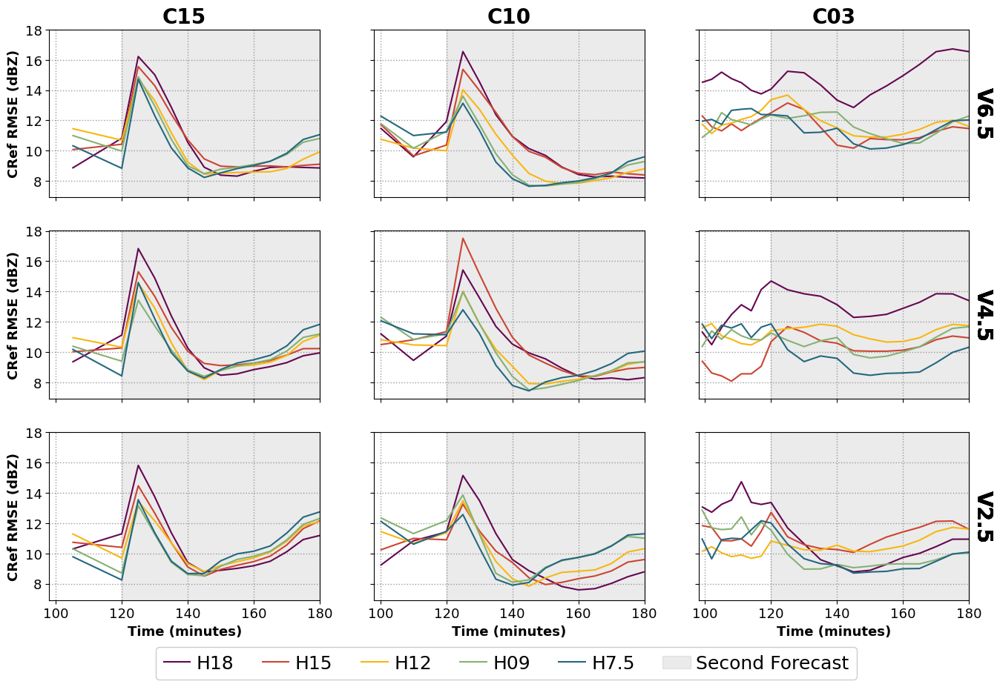

In [365]:

xo = [167.8,175.3,183.8,192.1,198.0,206.1,214.2,221.4]
yo = [205.7,215.3,229.1,239.2,250.3,261.0,270.3,282.3]

stormx = np.interp(np.arange(100, 180, 1), np.arange(100, 180, 10), xo)
stormy = np.interp(np.arange(100, 180, 1), np.arange(100, 180, 10), yo)

df = pd.DataFrame(np.array([stormx, stormy]).T, index= np.arange(100, 180, 1), columns = ['X','Y'])

NR = xr.open_dataset('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc')
#NR = ds.rename({'UH2-5km':"UH_2-5km"})
NRtime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in NR.dates.values[:]]



vloc = [6,4,2]
hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]

fig, axes = plt.subplots(3,3, figsize=(16, 10), sharex=True, sharey=True)

colors = cmaps.pride(np.linspace(0.2, 0.9, len(hloc)))[::-1]

freq=3

v = 6


         
bufy = 50
bufx = 80
    
for hi, h in enumerate(hloc):
    for vi, v in enumerate(vloc):
        for fi, freq in enumerate([15,10,3]):



            

            
            # analysis RMSE
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_analysis.nc")[0]
            cm1 = xr.open_dataset(path, decode_timedelta=True)
            xh, yh = cm1.xh.values, cm1.yh.values
    
            ctime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
    
            t0, t1 = findnearest(ctime, 100), findnearest(ctime, 120)+1

            if ctime[t0] < 52: t0+=1

            tis =[findnearest(NRtime, t) for t in ctime[t0:t1]]



            RMSE = []


            for time in ctime[t0:t1]:

                tis = findnearest(NRtime, time)

        
                ### subset the area around the storm
                try:
                    x0 = df.loc[time].X 
                    y0 = df.loc[time].Y
                except:
                    x0 = df.X.values[0]
                    y0 = df.Y.values[0]
       
        
        
                X0, X1 = findnearest(xh, x0-bufx+30), findnearest(xh, x0+bufx-30)
                Y0, Y1 = findnearest(yh, y0-bufy), findnearest(yh, y0+bufy-10)
            
                # ref rmse
                ref_ens = cm1['cdbz'][findnearest(ctime, time), -1, Y0:Y1, X0:X1].values
                ref_NR  = NR['cdbz'][findnearest(NRtime, time), Y0:Y1, X0:X1].values

                # zi = findnearest(cm1.z.values, 5)
                # ref_ens = cm1['w'][findnearest(ctime, time), -1, zi, Y0:Y1, X0:X1].values
                # ref_NR  = NR['w'][findnearest(NRtime, time), zi, Y0:Y1, X0:X1].values
        
                RMSE.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))
            rmse_time = ctime[t0:t1]

            #fcst RMSE
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_fcst.nc")[0]
            cm1 = xr.open_dataset(path, decode_timedelta=True)
            xh, yh = cm1.xh.values, cm1.yh.values
    
            ctime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
    
            t0, t1 = findnearest(ctime, 120), findnearest(ctime, 180)+1


            RMSE_fcst = []


            for time in ctime[t0:t1]:

                ### subset the area around the storm
                try:
                    x0 = df.loc[time].X 
                    y0 = df.loc[time].Y
                except:
                    x0 = df.X.values[0]
                    y0 = df.Y.values[0]
                if time == 180:
                    x0 = df.iloc[-1].X 
                    y0 = df.iloc[-1].Y
                    
                
        
                X0, X1 = findnearest(xh, x0-bufx+30), findnearest(xh, x0+bufx-30)
                Y0, Y1 = findnearest(yh, y0-bufy), findnearest(yh, y0+bufy-10)


                 # ref rmse
                ref_ens = cm1['cdbz'][findnearest(ctime, time), -1, Y0:Y1, X0:X1].values
                ref_NR  = NR['cdbz'][findnearest(NRtime, time), Y0:Y1, X0:X1].values

                #zi = findnearest(cm1.z.values, 3)
                # ref_ens = cm1['w'][findnearest(ctime, time), -1, zi, Y0:Y1, X0:X1].values
                # ref_NR  = NR['w'][findnearest(NRtime, time), zi, Y0:Y1, X0:X1].values

                RMSE_fcst.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))
            
            rmse_fcst_time = ctime[t0:t1]




            
    
            axes[vi,fi].plot(rmse_time+rmse_fcst_time,np.concat([RMSE, RMSE_fcst]), color=colors[hi], label=rename(f'C03_H{h:02d}_V6', version='H').split('-')[1])

            if freq==3:
                axes[vi, fi].text(1.05, 0.5,rename(f'C03_H09_V{v}', version='V').split('-')[1], ha='center', va='center', rotation=-90, weight='bold', fontsize=20, transform=axes[vi, fi].transAxes )
            if freq==15:
                axes[vi, fi].set_ylabel('CRef RMSE (dBZ)')

            if vi == 0:
                axes[vi,fi].set_title(f'C{freq:02d}',fontsize=20, weight='bold')
            if vi == 2:
                axes[vi, fi].set_xlabel('Time (minutes)')
            
       

        # zi = findnearest(cm1.z.values, 2)
        # ref = np.where(cm1.cdbz[ti, -1].values > 1, cm1.cdbz[ti, -1].values, np.nan)

        # axes[vi].plot(time, )#.pcolormesh(xh, yh, ref, cmap=ctables.REF_default, vmin=1, vmax=75, shading='neare

axes[0,0].set_xlim(98, 180)#margins(x=.1)

for ax in axes.flatten():
    ax.grid()
   # ax.axvline(52, color='C3', alpha=0.9, lw=3, ls='--', label='Storm Initiation')
    ax.axvspan(120,180, color='k', alpha=0.08, label='Second Forecast')

    # for t in np.arange(120, 185, 5):
    #     ax.axvline(t, color='k', lw=0.5, alpha=0.4)



handles, labels =axes[0,0].get_legend_handles_labels()
leg=fig.legend(handles, labels, fontsize=18, scatterpoints=3, markerscale=3, loc='lower center', bbox_to_anchor=(0.51, -.01), ncol=7, columnspacing=1.5, handletextpad=.3, handlelength=1.5)


# Northern Cell (Old) - RMSE

In [380]:
# southern storm dataframe 


### Southern Storm 

xo = [167.8,175.3,183.8,192.1,198.0,206.1,214.2,221.4]
yo = [205.7,215.3,229.1,239.2,250.3,261.0,270.3,282.3]

stormx = np.interp(np.arange(100, 180, 1), np.arange(100, 180, 10), xo)
stormy = np.interp(np.arange(100, 180, 1), np.arange(100, 180, 10), yo)

df = pd.DataFrame(np.array([stormx, stormy]).T, index= np.arange(100, 180, 1), columns = ['X','Y'])


def get_storm_buffer(df, time):

    bufy = 50
    bufx = 80

    try:
        x0 = df.loc[time].X 
        y0 = df.loc[time].Y
    except:
        x0 = df.X.values[0]
        y0 = df.Y.values[0]

    if time == 180:
        x0 = df.iloc[-1].X 
        y0 = df.iloc[-1].Y


    X0, X1 = findnearest(xh, x0-bufx+30), findnearest(xh, x0+bufx-30)
    Y0, Y1 = findnearest(yh, y0-bufy),    findnearest(yh, y0+bufy-10)
    return X0, X1, Y0, Y1
    

NR = xr.open_dataset('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc')
NR = NR.rename({'UH2-5km':"UH_2-5km"})
NRtime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in NR.dates.values[:]]


vols = []

hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]
for hi, h in enumerate(hloc):
    for vi, v in enumerate(vloc):
       # path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C15_H{h:02d}_V{v}/full_ens_analysis.nc")[0]
        name = rename(f'C15_H{h:02d}_V{v}', version='full')
                            
        hr = float(name.split('-')[1][1:])
        vr = float(name.split('-')[2][1:])
        volume = (4/3)*np.pi*vr*hr*hr
        vols.append(volume)
vols = sorted(vols)


CI1, TIME1, H1, V1, VOLUME1,vi1, RMSE1 = [],[],[],[],[],[],[]
CI2, TIME2, H2, V2, VOLUME2,vi2, RMSE2 = [],[],[],[],[],[],[]


VARIABLE = 'cdbz'#'w'#'cdbz'
HEIGHT = 1

for hi, h in enumerate(hloc):
    for vi, v in enumerate(vloc):

        name = rename(f'C15_H{h:02d}_V{v}', version='full')
                            
        hr = float(name.split('-')[1][1:])
        vr = float(name.split('-')[2][1:])
        volume = (4/3)*np.pi*vr*hr*hr

        color = colors[findnearest(vols, volume)]
        
        for fi, freq in enumerate([15, 10, 3]):

            
            # analysis RMSE - do until 120 minutes
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_analysis.nc")[0]
            anl = xr.open_dataset(path, decode_timedelta=True)
            xh, yh = anl.xh.values, anl.yh.values
    
            atime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in anl.time.values]
            t0, t1 = findnearest(atime, 90), findnearest(atime, 120)+1
            if atime[t0] < 52: t0+=1

            RMSE_anl = []

            for time in atime[t0:t1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                # ref rmse
                if 'nk' in anl[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = anl[VARIABLE][findnearest(atime, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),    zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = anl[VARIABLE][findnearest(atime, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),    Y0:Y1, X0:X1].values

            
                RMSE_anl.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))

            anl.close()



            # ### fcst 1 RMSE
            # path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/F*/full_ens_fcst.nc")[0]
            # cm1 = xr.open_dataset(path, decode_timedelta=True)
            # ftime1 = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
    
            # ft0, ft1 = findnearest(ftime1, 90), findnearest(ftime1, 180)+1

            # RMSE_fcst1 = []

            # for time in ftime1[ft0:ft1]:

            #     X0, X1, Y0, Y1 = get_storm_buffer(df, time)

            #     if 'nk' in cm1[VARIABLE].dims:
            #         zi = findnearest(anl.z, HEIGHT)
            #         ref_ens = cm1[VARIABLE][findnearest(ftime1, time), -1, zi, Y0:Y1, X0:X1].values
            #         ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     zi, Y0:Y1, X0:X1].values
            #     else:
            #         ref_ens = cm1[VARIABLE][findnearest(ftime1, time), -1, Y0:Y1, X0:X1].values
            #         ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     Y0:Y1, X0:X1].values

            #     RMSE_fcst1.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))

            # cm1.close()



            ### fcst 2 RMSE
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_fcst.nc")[0]
            cm1 = xr.open_dataset(path, decode_timedelta=True)
            ftime2 = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
    
            f2t0, f2t1 = findnearest(ftime2, 120), findnearest(ftime2, 180)+1

            RMSE_fcst2 = []

            for time in ftime2[f2t0:f2t1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                 # ref rmse
                if 'nk' in cm1[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = cm1[VARIABLE][findnearest(ftime2, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = cm1[VARIABLE][findnearest(ftime2, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     Y0:Y1, X0:X1].values

                RMSE_fcst2.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))
                
            cm1.close()
            

            # analysis and fcst 1

            time1 = atime[t0:findnearest(atime, 90)]  + ftime1[ft0:ft1]
            time2 = atime[t0:findnearest(atime, 120)] + ftime2[f2t0:f2t1]

            data1 = np.concat([RMSE_anl[0: (findnearest(atime, 90) - t0)],  RMSE_fcst1])
            data2 = np.concat([RMSE_anl[:-1], RMSE_fcst2])


            CI1.extend([freq]*len(time1))
            H1.extend([h]*len(time1))
            V1.extend([v]*len(time1))
            VOLUME1.extend([volume]*len(time1))
            vi1.extend([findnearest(vols, volume)]*len(time1))
            RMSE1.extend(data1)
            TIME1.extend(time1)

            CI2.extend([freq]*len(time2))
            H2.extend([h]*len(time2))
            V2.extend([v]*len(time2))
            VOLUME2.extend([volume]*len(time2))
            vi2.extend([findnearest(vols, volume)]*len(time2))
            RMSE2.extend(data2)
            TIME2.extend(time2)
            
            
#df1 = pd.DataFrame(data = {'CI': CI1,'TIME':TIME1, 'H':H1, 'V':V1, 'VOL':VOLUME1, 'VI': vi1, 'RMSE': RMSE1})
df2 = pd.DataFrame(data = {'CI': CI2,'TIME':TIME2, 'H':H2, 'V':V2, 'VOL':VOLUME2, 'VI': vi2, 'RMSE': RMSE2})       

#NR.close()



CI1, TIME1, H1, V1, VOLUME1,vi1, RMSE1 = [],[],[],[],[],[],[]
CI2, TIME2, H2, V2, VOLUME2,vi2, RMSE2 = [],[],[],[],[],[],[]


VARIABLE = 'v'#'w'#'cdbz'
HEIGHT = 1

for hi, h in enumerate(hloc):
    for vi, v in enumerate(vloc):

        name = rename(f'C15_H{h:02d}_V{v}', version='full')
                            
        hr = float(name.split('-')[1][1:])
        vr = float(name.split('-')[2][1:])
        volume = (4/3)*np.pi*vr*hr*hr

        color = colors[findnearest(vols, volume)]
        
        for fi, freq in enumerate([15, 10, 3]):

            
            # analysis RMSE - do until 120 minutes
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_analysis.nc")[0]
            anl = xr.open_dataset(path, decode_timedelta=True)
            xh, yh = anl.xh.values, anl.yh.values
    
            atime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in anl.time.values]
            t0, t1 = findnearest(atime, 90), findnearest(atime, 120)+1
            if atime[t0] < 52: t0+=1

            RMSE_anl = []

            for time in atime[t0:t1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                # ref rmse
                if 'nk' in anl[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = anl[VARIABLE][findnearest(atime, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),    zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = anl[VARIABLE][findnearest(atime, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),    Y0:Y1, X0:X1].values

            
                RMSE_anl.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))

            anl.close()



            # ### fcst 1 RMSE
            # path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/F*/full_ens_fcst.nc")[0]
            # cm1 = xr.open_dataset(path, decode_timedelta=True)
            # ftime1 = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
    
            # ft0, ft1 = findnearest(ftime1, 90), findnearest(ftime1, 180)+1

            # RMSE_fcst1 = []

            # for time in ftime1[ft0:ft1]:

            #     X0, X1, Y0, Y1 = get_storm_buffer(df, time)

            #     if 'nk' in cm1[VARIABLE].dims:
            #         zi = findnearest(anl.z, HEIGHT)
            #         ref_ens = cm1[VARIABLE][findnearest(ftime1, time), -1, zi, Y0:Y1, X0:X1].values
            #         ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     zi, Y0:Y1, X0:X1].values
            #     else:
            #         ref_ens = cm1[VARIABLE][findnearest(ftime1, time), -1, Y0:Y1, X0:X1].values
            #         ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     Y0:Y1, X0:X1].values

            #     RMSE_fcst1.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))

            # cm1.close()



            ### fcst 2 RMSE
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_fcst.nc")[0]
            cm1 = xr.open_dataset(path, decode_timedelta=True)
            ftime2 = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
    
            f2t0, f2t1 = findnearest(ftime2, 120), findnearest(ftime2, 180)+1

            RMSE_fcst2 = []

            for time in ftime2[f2t0:f2t1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                 # ref rmse
                if 'nk' in cm1[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = cm1[VARIABLE][findnearest(ftime2, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = cm1[VARIABLE][findnearest(ftime2, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     Y0:Y1, X0:X1].values

                RMSE_fcst2.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))
                
            cm1.close()
            

            # analysis and fcst 1

            time1 = atime[t0:findnearest(atime, 90)]  + ftime1[ft0:ft1]
            time2 = atime[t0:findnearest(atime, 120)] + ftime2[f2t0:f2t1]

            data1 = np.concat([RMSE_anl[0: (findnearest(atime, 90) - t0)],  RMSE_fcst1])
            data2 = np.concat([RMSE_anl[:-1], RMSE_fcst2])


            CI1.extend([freq]*len(time1))
            H1.extend([h]*len(time1))
            V1.extend([v]*len(time1))
            VOLUME1.extend([volume]*len(time1))
            vi1.extend([findnearest(vols, volume)]*len(time1))
            RMSE1.extend(data1)
            TIME1.extend(time1)

            CI2.extend([freq]*len(time2))
            H2.extend([h]*len(time2))
            V2.extend([v]*len(time2))
            VOLUME2.extend([volume]*len(time2))
            vi2.extend([findnearest(vols, volume)]*len(time2))
            RMSE2.extend(data2)
            TIME2.extend(time2)
            
            
#df3 = pd.DataFrame(data = {'CI': CI1,'TIME':TIME1, 'H':H1, 'V':V1, 'VOL':VOLUME1, 'VI': vi1, 'RMSE': RMSE1})
df4 = pd.DataFrame(data = {'CI': CI2,'TIME':TIME2, 'H':H2, 'V':V2, 'VOL':VOLUME2, 'VI': vi2, 'RMSE': RMSE2})      

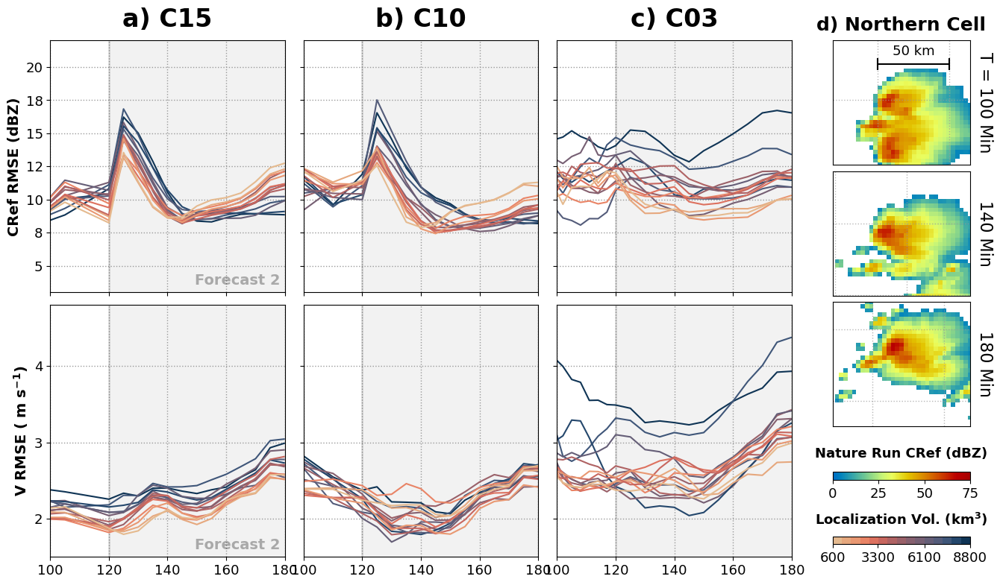

In [381]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Create figure
fig = plt.figure(figsize=(16, 9))

# Outer grid: 1 row, 2 columns (left = 2x3, right = 5x1)
outer = gridspec.GridSpec(1, 2, width_ratios=[5, 1], wspace=0.08)

# LEFT: 2x3 grid
left_gs = gridspec.GridSpecFromSubplotSpec(2, 3, subplot_spec=outer[0], wspace=0.08, hspace=0.05)

axes = np.empty((2, 3), dtype=object)
for i in range(2):
    for j in range(3):
        if i == 0 and j == 0:
            ax = fig.add_subplot(left_gs[i, j])
        else:
            ax = fig.add_subplot(left_gs[i, j],sharex=axes[0, j] if i > 0 else None,sharey=axes[i, 0] if j > 0 else None)
        axes[i, j] = ax
        axes[i, j].yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:.0f}'))
        axes[i,j].label_outer()
        axes[i,j].grid()


# RIGHT: 5x1 grid
right_gs = gridspec.GridSpecFromSubplotSpec(4, 1, subplot_spec=outer[1], hspace=0.05)

right_axes = []
for i in range(4):
    ax = fig.add_subplot(right_gs[i, 0])
    ax.set_aspect('equal')
    right_axes.append(ax)


for ti, time in enumerate([100, 140, 180]):

    X0, X1, Y0, Y1 = get_storm_buffer(df, time)
    ref_NR  =  NR['cdbz'][findnearest(NRtime, time),     Y0:Y1, X0:X1].values
    ref = np.where(ref_NR <5, np.nan, ref_NR)

    myx, myy = xh[X0: X1], yh[Y0: Y1]
    im = right_axes[ti].pcolormesh(myx, myy, ref, vmin=0, vmax=75,cmap=ctables.REF_default, shading='nearest')

    right_axes[ti].set_xticks(np.arange(0, 400, 50),np.arange(0, 400, 50))
    right_axes[ti].set_yticks(np.arange(0, 400, 50),np.arange(0, 400, 50))
    right_axes[ti].grid(ls=':', alpha=0.7)
    right_axes[ti].xaxis.set_major_formatter(ticker.NullFormatter())
    right_axes[ti].yaxis.set_major_formatter(ticker.NullFormatter())
    right_axes[ti].tick_params(left=False, bottom=False)

    right_axes[ti].set_xlim(myx.min(), myx.max())
    right_axes[ti].set_ylim(myy.min(), myy.max())

    add = ''
    if ti == 0: add='T = '
    right_axes[ti].text(myx.max()+10, np.mean(myy), f'{add}{time} Min', ha='center', va='center', rotation=-90, fontsize=16,)

right_axes[0].set_title('d) Northern Cell', y=1.03)  
add_scale(right_axes[0], xstart=150, xlength=50, y=225)


plt.draw()

for ax in axes[2:,:].flatten():
    pos = ax.get_position()
    pos.y0 = pos.y0 -.025#*(i+1)
    pos.y1 = pos.y1 -.025#*(i+1)
    ax.set_position(pos)
fig.canvas.draw()


######## reflectivity colorbar

right_axes[-1].axis('off')
bbox = right_axes[-2].get_position()
Y = bbox.y0
X0, X1 = bbox.x0, bbox.x0 + bbox.width

cbar_ax = fig.add_axes([X0, Y - 0.08, bbox.width, 0.012])
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
cbar.ax.set_xlabel('Nature Run CRef (dBZ)', labelpad=-52, fontsize=13)


for i, ax in enumerate(axes.flatten()):
    # if i in [0,1,2]:
    #     ax.axvspan(90,180, color='k', alpha=0.05, label='First Forecast')
    #     ax.axvline(90, color='k', alpha=0.1, lw=2)
    # else:
    ax.axvspan(120,180, color='k', alpha=0.05, label='First Forecast')
    ax.axvline(120, color='k', alpha=0.1, lw=2)
        
    #ax.axvline(52, color='C3', alpha=0.9, lw=3, ls='--', label='Storm Initiation')
    ax.set_xlim(100, 180)


for ax in axes[-1,:]:
    ax.set_xticks(np.arange(100, 190, 20), np.arange(100, 190, 20))


# colors = cmaps.pride(np.linspace(0.2, 0.9,15))

colors = ctables.REF_default(np.linspace(0,1,15))
colors = cmaps.lipari(np.linspace(0.1,.85,15))[::-1]

cmap1 = LinearSegmentedColormap.from_list("CR",colors, 15)


for fi, freq in enumerate([15, 10, 3]):
    axes[0, fi].set_title(chr(ord('`')+fi+1)+') '+f'C{freq:02d}', weight='bold', fontsize=24,  y=1.03)
        
    for hi, h in enumerate(hloc):
        for vi, v in enumerate(vloc):
        

            exp1 = df2[(df2.CI == freq) & (df2.H == h) & (df2.V == v)]
            exp2 = df4[(df4.CI == freq) & (df4.H == h) & (df4.V == v)]

            myc = colors[exp1.VI.values[0]]#

            axes[0, fi].plot(exp1.TIME, exp1.RMSE, color=myc, label=exp1.VOL.values[0])
            axes[1, fi].plot(exp2.TIME, exp2.RMSE, color=myc, label=exp2.VOL.values[0])


            # #exp3 = df3[(df3.CI == freq) & (df3.H == h) & (df3.V == v)]
            # exp4 = df4[(df4.CI == freq) & (df4.H == h) & (df4.V == v)]

            # #axes[2, fi].plot(exp3.TIME, exp3.RMSE, color=myc, label=exp3.VOL.values[0])
            # axes[2, fi].plot(exp4.TIME, exp4.RMSE, color=myc, label=exp4.VOL.values[0])
            



######## volume colorbar

mappable = mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=df1.VOL.min(), vmax=df1.VOL.max()), cmap=cmap1)
mappable.set_array([])
bbox = right_axes[-2].get_position()
Y = bbox.y0
X0, X1 = bbox.x0, bbox.x0 + bbox.width

buff = 0.01

cbar_ax2 = fig.add_axes([X0, Y - 0.08*2.2, bbox.width, 0.012])
cbar = fig.colorbar(mappable, cax=cbar_ax2, orientation='horizontal', spacing='proportional', ticks=np.unique(df1.VOL))
cbar.ax.set_xlabel(r'Localization Vol. (km$\mathbf{^3}$)', labelpad=-52, fontsize=13)
cbar.ax.set_xticks([600, 3300,6100, 8800], [600, 3300, 6100, 8800]);


### set axes limits
axes[0,0].set_ylim(3, 22)

axes[1,0].set_ylim(1.5, 4.8)
axes[1,0].set_yticks([2,3,4],[2,3,4])


axes[0, 0].set_ylabel('CRef RMSE (dBZ)',               fontsize=14)
axes[1, 0].set_ylabel(r'V RMSE ( m s$\mathbf{^{-1}}$)',fontsize=14)

for ai, ax in enumerate(axes[:,0]):
    #ai = np.clip(ai, 0, 1)
    ax.text(0.98, 0.03, f'Forecast 2', ha='right', transform=ax.transAxes, fontsize=14, weight='bold', alpha=0.3)

# Northern Cell (NEW) - RMSE

In [10]:

def get_storm_buffer(df, time):

    bufy = 50
    bufx = 80

    try:
        x0 = df.loc[time].X 
        y0 = df.loc[time].Y
    except:
        x0 = df.X.values[0]
        y0 = df.Y.values[0]

    if time == 180:
        x0 = df.iloc[-1].X 
        y0 = df.iloc[-1].Y

    X0, X1 = findnearest(xh, x0-bufx+30), findnearest(xh, x0+bufx-10)
    Y0, Y1 = findnearest(yh, y0-bufy),    findnearest(yh, y0+bufy)

    if Y1 - Y0 == 33:
        Y1+=1
    return X0, X1, Y0, Y1

for time in [30, 90, 120, 180]:

    X0, X1, Y0, Y1 = get_storm_buffer(df, time)

    print(Y1-Y0)

NameError: name 'df' is not defined

In [12]:

xo = [110.45,119.44,127.37,135.23,143.35,152.30,162.22,167.81,175.32,183.82,192.07,198.00,206.13,214.24,221.45]
yo = [139.09,145.44,151.89,158.11,165.17,172.88,180.03,205.74,215.34,229.05,239.25,250.30,261.00,270.26,282.31]

stormx = np.interp(np.arange(30, 180, 1), np.arange(30, 180, 10), xo)
stormy = np.interp(np.arange(30, 180, 1), np.arange(30, 180, 10), yo)

df = pd.DataFrame(np.array([stormx, stormy]).T, index= np.arange(30, 180, 1), columns = ['X','Y'])


def get_storm_buffer(df, time):

    bufy = 50
    bufx = 80

    try:
        x0 = df.loc[time].X 
        y0 = df.loc[time].Y
    except:
        x0 = df.X.values[0]
        y0 = df.Y.values[0]

    if time == 180:
        x0 = df.iloc[-1].X 
        y0 = df.iloc[-1].Y

    X0, X1 = findnearest(xh, x0-bufx+30), findnearest(xh, x0+bufx-10)
    Y0, Y1 = findnearest(yh, y0-bufy),    findnearest(yh, y0+bufy)

    if Y1 - Y0 == 33:
        Y1+=1
    return X0, X1, Y0, Y1
    

NR = xr.open_dataset('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc')
NR = NR.rename({'UH2-5km':"UH_2-5km"})
NRtime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in NR.dates.values[:]]


vols = []

hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]
for hi, h in enumerate(hloc):
    for vi, v in enumerate(vloc):
       # path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C15_H{h:02d}_V{v}/full_ens_analysis.nc")[0]
        name = rename(f'C15_H{h:02d}_V{v}', version='full')
                            
        hr = float(name.split('-')[1][1:])
        vr = float(name.split('-')[2][1:])
        volume = (4/3)*np.pi*vr*hr*hr
        vols.append(volume)
vols = sorted(vols)


CI1, TIME1, H1, V1, VOLUME1,vi1, RMSE1 = [],[],[],[],[],[],[]
CI2, TIME2, H2, V2, VOLUME2,vi2, RMSE2 = [],[],[],[],[],[],[]


VARIABLE = 'cdbz'#'w'#'cdbz'
HEIGHT = 1

for hi, h in enumerate(hloc):
    for vi, v in enumerate(vloc):

        name = rename(f'C15_H{h:02d}_V{v}', version='full')
                            
        hr = float(name.split('-')[1][1:])
        vr = float(name.split('-')[2][1:])
        volume = (4/3)*np.pi*vr*hr*hr

        
        for fi, freq in enumerate([15, 10, 3]):

            
            # analysis RMSE - do until 120 minutes
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_analysis.nc")[0]
            anl = xr.open_dataset(path, decode_timedelta=True)
            xh, yh = anl.xh.values, anl.yh.values
    
            atime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in anl.time.values]
            t0, t1 = findnearest(atime, 30), findnearest(atime, 120)+1
            #if atime[t0] < 52: t0+=1

            RMSE_anl = []

            for time in atime[t0:t1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                # ref rmse
                if 'nk' in anl[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = anl[VARIABLE][findnearest(atime, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),    zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = anl[VARIABLE][findnearest(atime, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),    Y0:Y1, X0:X1].values

            
                RMSE_anl.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))

            anl.close()



            ### fcst 1 RMSE
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/F*/full_ens_fcst.nc")[0]
            cm1 = xr.open_dataset(path, decode_timedelta=True)
            ftime1 = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
    
            ft0, ft1 = findnearest(ftime1, 90), findnearest(ftime1, 180)+1

            RMSE_fcst1 = []

            for time in ftime1[ft0:ft1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                if 'nk' in cm1[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = cm1[VARIABLE][findnearest(ftime1, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = cm1[VARIABLE][findnearest(ftime1, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     Y0:Y1, X0:X1].values

                RMSE_fcst1.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))

            cm1.close()



            ### fcst 2 RMSE
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_fcst.nc")[0]
            cm1 = xr.open_dataset(path, decode_timedelta=True)
            ftime2 = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
    
            f2t0, f2t1 = findnearest(ftime2, 120), findnearest(ftime2, 180)+1

            RMSE_fcst2 = []

            for time in ftime2[f2t0:f2t1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                 # ref rmse
                if 'nk' in cm1[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = cm1[VARIABLE][findnearest(ftime2, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = cm1[VARIABLE][findnearest(ftime2, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     Y0:Y1, X0:X1].values

                RMSE_fcst2.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))
                
            cm1.close()
            

            # analysis and fcst 1

            time1 = atime[t0:findnearest(atime, 90)]  + ftime1[ft0:ft1]
            time2 = atime[t0:findnearest(atime, 120)] + ftime2[f2t0:f2t1]

            data1 = np.concat([RMSE_anl[0: (findnearest(atime, 90) - t0)],  RMSE_fcst1])
            data2 = np.concat([RMSE_anl[:-1], RMSE_fcst2])


            CI1.extend([freq]*len(time1))
            H1.extend([h]*len(time1))
            V1.extend([v]*len(time1))
            VOLUME1.extend([volume]*len(time1))
            vi1.extend([findnearest(vols, volume)]*len(time1))
            RMSE1.extend(data1)
            TIME1.extend(time1)

            CI2.extend([freq]*len(time2))
            H2.extend([h]*len(time2))
            V2.extend([v]*len(time2))
            VOLUME2.extend([volume]*len(time2))
            vi2.extend([findnearest(vols, volume)]*len(time2))
            RMSE2.extend(data2)
            TIME2.extend(time2)
            
            
df1 = pd.DataFrame(data = {'CI': CI1,'TIME':TIME1, 'H':H1, 'V':V1, 'VOL':VOLUME1, 'VI': vi1, 'RMSE': RMSE1})
df2 = pd.DataFrame(data = {'CI': CI2,'TIME':TIME2, 'H':H2, 'V':V2, 'VOL':VOLUME2, 'VI': vi2, 'RMSE': RMSE2})       

#NR.close()



CI1, TIME1, H1, V1, VOLUME1,vi1, RMSE1 = [],[],[],[],[],[],[]
CI2, TIME2, H2, V2, VOLUME2,vi2, RMSE2 = [],[],[],[],[],[],[]


VARIABLE = 'u'#'w'#'cdbz'
HEIGHT = 1

for hi, h in enumerate(hloc):
    for vi, v in enumerate(vloc):

        name = rename(f'C15_H{h:02d}_V{v}', version='full')
                            
        hr = float(name.split('-')[1][1:])
        vr = float(name.split('-')[2][1:])
        volume = (4/3)*np.pi*vr*hr*hr

        
        for fi, freq in enumerate([15, 10, 3]):

            
            # analysis RMSE - do until 120 minutes
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_analysis.nc")[0]
            anl = xr.open_dataset(path, decode_timedelta=True)
            xh, yh = anl.xh.values, anl.yh.values
    
            atime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in anl.time.values]
            t0, t1 = findnearest(atime, 30), findnearest(atime, 120)+1
            #if atime[t0] < 52: t0+=1

            RMSE_anl = []

            for time in atime[t0:t1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                # ref rmse
                if 'nk' in anl[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = anl[VARIABLE][findnearest(atime, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),    zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = anl[VARIABLE][findnearest(atime, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),    Y0:Y1, X0:X1].values

            
                RMSE_anl.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))

            anl.close()



            ### fcst 1 RMSE
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/F*/full_ens_fcst.nc")[0]
            cm1 = xr.open_dataset(path, decode_timedelta=True)
            ftime1 = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
    
            ft0, ft1 = findnearest(ftime1, 90), findnearest(ftime1, 180)+1

            RMSE_fcst1 = []

            for time in ftime1[ft0:ft1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                if 'nk' in cm1[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = cm1[VARIABLE][findnearest(ftime1, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = cm1[VARIABLE][findnearest(ftime1, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     Y0:Y1, X0:X1].values

                RMSE_fcst1.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))

            cm1.close()



            ### fcst 2 RMSE
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_fcst.nc")[0]
            cm1 = xr.open_dataset(path, decode_timedelta=True)
            ftime2 = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
    
            f2t0, f2t1 = findnearest(ftime2, 120), findnearest(ftime2, 180)+1

            RMSE_fcst2 = []

            for time in ftime2[f2t0:f2t1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                 # ref rmse
                if 'nk' in cm1[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = cm1[VARIABLE][findnearest(ftime2, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = cm1[VARIABLE][findnearest(ftime2, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     Y0:Y1, X0:X1].values

                RMSE_fcst2.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))
                
            cm1.close()
            

            # analysis and fcst 1

            time1 = atime[t0:findnearest(atime, 90)]  + ftime1[ft0:ft1]
            time2 = atime[t0:findnearest(atime, 120)] + ftime2[f2t0:f2t1]

            data1 = np.concat([RMSE_anl[0: (findnearest(atime, 90) - t0)],  RMSE_fcst1])
            data2 = np.concat([RMSE_anl[:-1], RMSE_fcst2])

    
            CI1.extend([freq]*len(time1))
            H1.extend([h]*len(time1))
            V1.extend([v]*len(time1))
            VOLUME1.extend([volume]*len(time1))
            vi1.extend([findnearest(vols, volume)]*len(time1))
            RMSE1.extend(data1)
            TIME1.extend(time1)

            CI2.extend([freq]*len(time2))
            H2.extend([h]*len(time2))
            V2.extend([v]*len(time2))
            VOLUME2.extend([volume]*len(time2))
            vi2.extend([findnearest(vols, volume)]*len(time2))
            RMSE2.extend(data2)
            TIME2.extend(time2)
            
            
df3 = pd.DataFrame(data = {'CI': CI1,'TIME':TIME1, 'H':H1, 'V':V1, 'VOL':VOLUME1, 'VI': vi1, 'RMSE': RMSE1})
df4 = pd.DataFrame(data = {'CI': CI2,'TIME':TIME2, 'H':H2, 'V':V2, 'VOL':VOLUME2, 'VI': vi2, 'RMSE': RMSE2})      


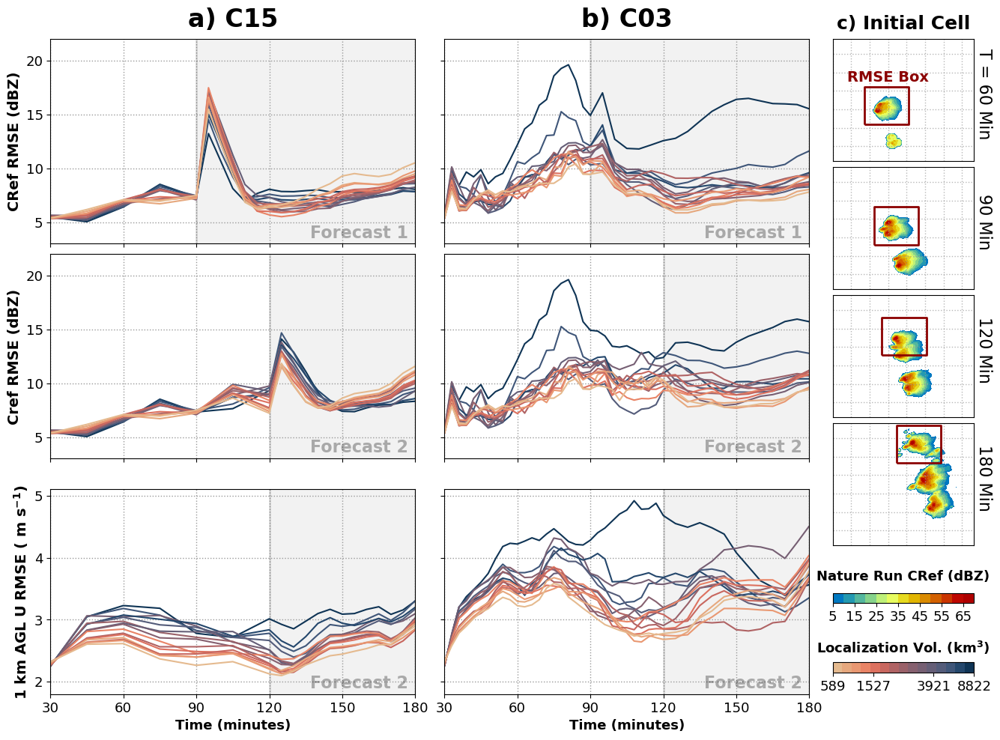

In [16]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Create figure
fig = plt.figure(figsize=(16, 11))

# Outer grid: 1 row, 2 columns (left = 2x3, right = 5x1)
outer = gridspec.GridSpec(1, 2, width_ratios=[5, 1], wspace=0.04)

# # LEFT: 2x3 grid
# left_gs = gridspec.GridSpecFromSubplotSpec(3, 3, subplot_spec=outer[0], wspace=0.08, hspace=0.05)

# axes = np.empty((3, 3), dtype=object)
# for i in range(3):
#     for j in range(3):
#         if i == 0 and j == 0:
#             ax = fig.add_subplot(left_gs[i, j])
#         else:
#             ax = fig.add_subplot(left_gs[i, j],sharex=axes[0, j] if i > 0 else None,sharey=axes[i, 0] if j > 0 else None)
#         axes[i, j] = ax
#         axes[i, j].yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:.0f}'))
#         axes[i,j].label_outer()
#         axes[i,j].grid()


# LEFT: 2x3 grid
left_gs = gridspec.GridSpecFromSubplotSpec(3,2, subplot_spec=outer[0], wspace=0.08, hspace=0.05)

axes = np.empty((3, 2), dtype=object)
for i in range(3):
    for j in range(2):
        if i == 0 and j == 0:
            ax = fig.add_subplot(left_gs[i, j])
        else:
            ax = fig.add_subplot(left_gs[i, j],sharex=axes[0, j] if i > 0 else None,sharey=axes[i, 0] if j > 0 else None)
        axes[i, j] = ax
        axes[i, j].yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:.0f}'))
        axes[i,j].label_outer()
        axes[i,j].grid()



# RIGHT: 5x1 grid
right_gs = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=outer[1], hspace=0.05)

right_axes = []
for i in range(5):
    ax = fig.add_subplot(right_gs[i, 0])
    ax.set_aspect('equal')
    right_axes.append(ax)


for ti, time in enumerate([60, 90, 120, 180]):

    X0, X1, Y0, Y1 = get_storm_buffer(df, time)
    ref_NR  =  NR['cdbz'][findnearest(NRtime, time),     Y0:Y1, X0:X1].values
    ref = np.where(ref_NR <5, np.nan, ref_NR)

    # myx, myy = xh[X0: X1], yh[Y0: Y1]
    # im = right_axes[ti].pcolormesh(myx, myy, ref, vmin=0, vmax=75,cmap=ctables.REF_default, shading='nearest')


    xh, yh = NR.xh.values, NR.yh.values
    ref = np.where(ref_NR <5, np.nan, ref_NR)

    im = right_axes[ti].contourf(xh, yh, NR['cdbz'][findnearest(NRtime, time)], cmap=ctables.REF_default, levels=np.arange(5, 75, 5))

    xh0, xh1 = xh[X0], xh[X1]
    yh0, yh1 = yh[Y0], yh[Y1]

    right_axes[ti].plot([xh0, xh0, xh1, xh1, xh0],[yh0, yh1, yh1,yh0, yh0], color='darkred', lw=2)
    

    right_axes[ti].set_xticks(np.arange(0, 400, 50),np.arange(0, 400, 50))
    right_axes[ti].set_yticks(np.arange(0, 400, 50),np.arange(0, 400, 50))
    right_axes[ti].grid(ls=':', alpha=0.7)
    right_axes[ti].xaxis.set_major_formatter(ticker.NullFormatter())
    right_axes[ti].yaxis.set_major_formatter(ticker.NullFormatter())
    right_axes[ti].tick_params(left=False, bottom=False)

    # right_axes[ti].set_xlim(myx.min(), myx.max())
    # right_axes[ti].set_ylim(myy.min(), myy.max())

    right_axes[ti].set_ylim(10, 340)

    add = ''
    if ti == 0: add='T = '
    
    right_axes[ti].text(410, np.mean(yh), f'{add}{time} Min', ha='center', va='center', rotation=-90, fontsize=16,)

right_axes[0].set_title('c) Initial Cell', y=1.03)  
#add_scale(right_axes[0], xstart=200, xlength=100, y=250, text_bump = 10)


plt.draw()


for ax in axes[2:,:].flatten():
    pos = ax.get_position()
    pos.y0 = pos.y0 -.025#*(i+1)
    pos.y1 = pos.y1 -.025#*(i+1)
    ax.set_position(pos)
fig.canvas.draw()


for i, ax in enumerate(axes.flatten()):
    if i in [0,1]:
        ax.axvspan(90,180, color='k', alpha=0.05, label='First Forecast')
        ax.axvline(90, color='k', alpha=0.1, lw=2)
    else:
        ax.axvspan(120,180, color='k', alpha=0.05, label='First Forecast')
        ax.axvline(120, color='k', alpha=0.1, lw=2)
        
    #ax.axvline(52, color='C3', alpha=0.9, lw=3, ls='--', label='Storm Initiation')
    ax.set_xlim(30, 180)


for ax in axes[-1,:]:
    ax.set_xticks([30,60,90,120,150,180], [30,60,90,120,150,180],)


#colors = ctables.REF_default(np.linspace(0,1,15))
colors = cmaps.lipari(np.linspace(0.1,.85,15))[::-1]
cmap1 = LinearSegmentedColormap.from_list("CR",colors, 15)


for fi, freq in enumerate([15, 3]):
    axes[0, fi].set_title(chr(ord('`')+fi+1)+') '+f'C{freq:02d}', weight='bold', fontsize=24,  y=1.03)

    count = 0
        
    for hi, h in enumerate(hloc):
        for vi, v in enumerate(vloc):

    
            #if count % 2 == 0:
        

            exp1 = df1[(df1.CI == freq) & (df1.H == h) & (df1.V == v)]
            exp2 = df2[(df2.CI == freq) & (df2.H == h) & (df2.V == v)]

            myc = colors[exp1.VI.values[0]]#

            axes[0, fi].plot(exp1.TIME, exp1.RMSE, color=myc, label=exp1.VOL.values[0])
            axes[1, fi].plot(exp2.TIME, exp2.RMSE, color=myc, label=exp2.VOL.values[0])


            #exp3 = df3[(df3.CI == freq) & (df3.H == h) & (df3.V == v)]
            exp4 = df4[(df4.CI == freq) & (df4.H == h) & (df4.V == v)]

            #axes[2, fi].plot(exp3.TIME, exp3.RMSE, color=myc, label=exp3.VOL.values[0])
            axes[2, fi].plot(exp4.TIME, exp4.RMSE, color=myc, label=exp4.VOL.values[0])

            count +=1
                



######## reflectivity colorbar

right_axes[-1].axis('off')
bbox = right_axes[-2].get_position()
Y = bbox.y0
X0, X1 = bbox.x0, bbox.x0 + bbox.width

cbar_ax = fig.add_axes([X0, Y - 0.07, bbox.width, 0.012])
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
cbar.ax.set_xlabel('Nature Run CRef (dBZ)', labelpad=-52, fontsize=13)



######## volume colorbar
vols = [589,848,1060,1508,1527,1532,2205,2356,2714,3393,3921,4241,6107,6126,8822]


bbox = right_axes[-2].get_position()
Y = bbox.y0
X0, X1 = bbox.x0, bbox.x0 + bbox.width

buff = 0.01
cbar_ax2 = fig.add_axes([X0, Y - 0.07*2.2, bbox.width, 0.012])

mappable = mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=14), cmap=cmap1)
mappable.set_array([])
cbar = fig.colorbar(mappable, cax=cbar_ax2, orientation='horizontal' )
cbar.ax.set_xlabel(r'Localization Vol. (km$\mathbf{^3}$)', labelpad=-52, fontsize=13)
cbar.set_ticks(ticks=[0, 4, 10, 14], labels=[vols[0], vols[4], vols[10], vols[14]]);



### set axes limits
axes[0,0].set_ylim(3, 22)
axes[1,0].set_ylim(3, 22)
axes[2,0].set_ylim(1.8, 5.1)
axes[2,0].set_yticks([2,3,4,5],[2,3,4,5])


axes[0, 0].set_ylabel('CRef RMSE (dBZ)',               fontsize=14)
axes[1, 0].set_ylabel('Cref RMSE (dBZ)',               fontsize=14)
axes[2, 0].set_ylabel(r'1 km AGL U RMSE ( m s$\mathbf{^{-1}}$)',fontsize=14)

for ai, ax in enumerate(axes[:,0]):
    ai = np.clip(ai, 0, 1)
    ax.text(0.98, 0.03, f'Forecast {ai+1}', ha='right', transform=ax.transAxes, fontsize=16, weight='bold', alpha=0.3)
for ai, ax in enumerate(axes[:,1]):
    ai = np.clip(ai, 0, 1)
    ax.text(0.98, 0.03, f'Forecast {ai+1}', ha='right', transform=ax.transAxes, fontsize=16, weight='bold', alpha=0.3)


right_axes[0].text(40, 225, 'RMSE Box', weight='bold', fontsize=14, color='darkred')

for ax in axes[-1,:]: ax.set_xlabel('Time (minutes)', weight='bold', y=-0.1)


# FIGNAME = 'NStormRMSE'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')

NameError: name 'get_storm_buffer' is not defined

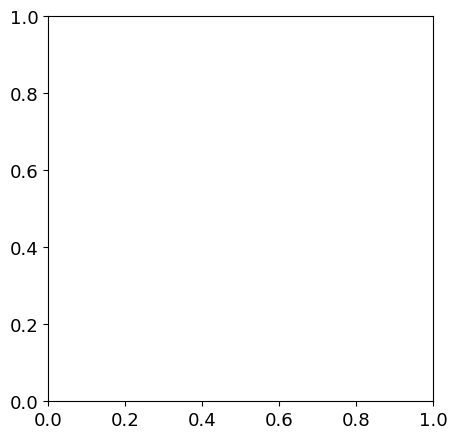

In [6]:
fig, axes = plt.subplots(1,1, figsize=(15, 5), subplot_kw={'aspect':'equal'})

for ti, time in enumerate([30]):

    X0, X1, Y0, Y1 = get_storm_buffer(df, time)
    ref_NR  =  NR['cdbz'][findnearest(NRtime, time),     Y0:Y1, X0:X1].values
    xh, yh = NR.xh.values, NR.yh.values
    ref = np.where(ref_NR <5, np.nan, ref_NR)

    axes[ti].contourf(xh, yh, NR['cdbz'][findnearest(NRtime, time)], cmap=ctables.REF_default, levels=np.arange(5, 75, 5))

    xh0, xh1 = xh[X0], xh[X1]
    yh0, yh1 = yh[Y0], yh[Y1]

    axes[ti].plot([xh0, xh0, xh1, xh1, xh0],[yh0, yh1, yh1,yh0, yh0], color='k')


    

    # myx, myy = xh[X0: X1], yh[Y0: Y1]
    # im = right_axes[ti].pcolormesh(myx, myy, ref, vmin=0, vmax=75,cmap=ctables.REF_default, shading='nearest')

    # right_axes[ti].set_xticks(np.arange(0, 400, 50),np.arange(0, 400, 50))
    # right_axes[ti].set_yticks(np.arange(0, 400, 50),np.arange(0, 400, 50))
    # right_axes[ti].grid(ls=':', alpha=0.7)
    # right_axes[ti].xaxis.set_major_formatter(ticker.NullFormatter())
    # right_axes[ti].yaxis.set_major_formatter(ticker.NullFormatter())
    # right_axes[ti].tick_params(left=False, bottom=False)

    # right_axes[ti].set_xlim(myx.min(), myx.max())
    # right_axes[ti].set_ylim(myy.min(), myy.max())

    # add = ''
    # if ti == 0: add='T = '
    # right_axes[ti].text(myx.max()+10, np.mean(myy), f'{add}{time} Min', ha='center', va='center', rotation=-90, fontsize=16,)

In [69]:
yh1

<xarray.DataArray 'yh' ()> Size: 4B
array(190.5, dtype=float32)
Coordinates:
    nj       int64 8B 63

# Southern Cell - RMSE 

In [17]:
# southern storm dataframe 


### Southern Storm 

xo = [161.0,170.2,179.0,188.3,195.0,204.1,211.5,221.2,231.3,241.7,253.8,266.1,276.6]
yo = [61.0,69.7,76.9,83.2,89.6,88.2,93.5,97.1,101.,105.,110.,115.,119.]

stormx = np.interp(np.arange(54, 180, 1), np.arange(54, 180, 10), xo)
stormy = np.interp(np.arange(54, 180, 1), np.arange(54, 180, 10), yo)

df = pd.DataFrame(np.array([stormx, stormy]).T, index= np.arange(54, 180, 1), columns = ['X','Y'])


def get_storm_buffer(df, time):

    bufy = 50
    bufx = 80

    try:
        x0 = df.loc[time].X 
        y0 = df.loc[time].Y
    except:
        x0 = df.X.values[0]
        y0 = df.Y.values[0]

    if time == 180:
        x0 = df.iloc[-1].X 
        y0 = df.iloc[-1].Y


    X0, X1 = findnearest(xh, x0-bufx+30), findnearest(xh, x0+bufx)
    Y0, Y1 = findnearest(yh, y0-bufy),    findnearest(yh, y0+bufy-10)
    return X0, X1, Y0, Y1
    

NR = xr.open_dataset('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc')
NR = NR.rename({'UH2-5km':"UH_2-5km"})
NRtime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in NR.dates.values[:]]


vols = []

hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]
for hi, h in enumerate(hloc):
    for vi, v in enumerate(vloc):
       # path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C15_H{h:02d}_V{v}/full_ens_analysis.nc")[0]
        name = rename(f'C15_H{h:02d}_V{v}', version='full')
                            
        hr = float(name.split('-')[1][1:])
        vr = float(name.split('-')[2][1:])
        volume = (4/3)*np.pi*vr*hr*hr
        vols.append(volume)
vols = sorted(vols)


CI1, TIME1, H1, V1, VOLUME1,vi1, RMSE1 = [],[],[],[],[],[],[]
CI2, TIME2, H2, V2, VOLUME2,vi2, RMSE2 = [],[],[],[],[],[],[]


VARIABLE = 'cdbz'#'w'#'cdbz'
HEIGHT = 1

for hi, h in enumerate(hloc):
    for vi, v in enumerate(vloc):

        name = rename(f'C15_H{h:02d}_V{v}', version='full')
                            
        hr = float(name.split('-')[1][1:])
        vr = float(name.split('-')[2][1:])
        volume = (4/3)*np.pi*vr*hr*hr

        
        for fi, freq in enumerate([15, 10, 3]):

            
            # analysis RMSE - do until 120 minutes
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_analysis.nc")[0]
            anl = xr.open_dataset(path, decode_timedelta=True)
            xh, yh = anl.xh.values, anl.yh.values
    
            atime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in anl.time.values]
            t0, t1 = findnearest(atime, 52), findnearest(atime, 120)+1
            if atime[t0] < 52: t0+=1

            RMSE_anl = []

            for time in atime[t0:t1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                # ref rmse
                if 'nk' in anl[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = anl[VARIABLE][findnearest(atime, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),    zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = anl[VARIABLE][findnearest(atime, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),    Y0:Y1, X0:X1].values

            
                RMSE_anl.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))

            anl.close()



            ### fcst 1 RMSE
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/F*/full_ens_fcst.nc")[0]
            cm1 = xr.open_dataset(path, decode_timedelta=True)
            ftime1 = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
    
            ft0, ft1 = findnearest(ftime1, 90), findnearest(ftime1, 180)+1

            RMSE_fcst1 = []

            for time in ftime1[ft0:ft1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                if 'nk' in cm1[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = cm1[VARIABLE][findnearest(ftime1, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = cm1[VARIABLE][findnearest(ftime1, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     Y0:Y1, X0:X1].values

                RMSE_fcst1.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))

            cm1.close()



            ### fcst 2 RMSE
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_fcst.nc")[0]
            cm1 = xr.open_dataset(path, decode_timedelta=True)
            ftime2 = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
    
            f2t0, f2t1 = findnearest(ftime2, 120), findnearest(ftime2, 180)+1

            RMSE_fcst2 = []

            for time in ftime2[f2t0:f2t1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                 # ref rmse
                if 'nk' in cm1[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = cm1[VARIABLE][findnearest(ftime2, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = cm1[VARIABLE][findnearest(ftime2, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     Y0:Y1, X0:X1].values

                RMSE_fcst2.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))
                
            cm1.close()
            

            # analysis and fcst 1

            time1 = atime[t0:findnearest(atime, 90)]  + ftime1[ft0:ft1]
            time2 = atime[t0:findnearest(atime, 120)] + ftime2[f2t0:f2t1]

            data1 = np.concat([RMSE_anl[0: (findnearest(atime, 90) - t0)],  RMSE_fcst1])
            data2 = np.concat([RMSE_anl[:-1], RMSE_fcst2])


            CI1.extend([freq]*len(time1))
            H1.extend([h]*len(time1))
            V1.extend([v]*len(time1))
            VOLUME1.extend([volume]*len(time1))
            vi1.extend([findnearest(vols, volume)]*len(time1))
            RMSE1.extend(data1)
            TIME1.extend(time1)

            CI2.extend([freq]*len(time2))
            H2.extend([h]*len(time2))
            V2.extend([v]*len(time2))
            VOLUME2.extend([volume]*len(time2))
            vi2.extend([findnearest(vols, volume)]*len(time2))
            RMSE2.extend(data2)
            TIME2.extend(time2)
            
            
df1 = pd.DataFrame(data = {'CI': CI1,'TIME':TIME1, 'H':H1, 'V':V1, 'VOL':VOLUME1, 'VI': vi1, 'RMSE': RMSE1})
df2 = pd.DataFrame(data = {'CI': CI2,'TIME':TIME2, 'H':H2, 'V':V2, 'VOL':VOLUME2, 'VI': vi2, 'RMSE': RMSE2})       

#NR.close()



CI1, TIME1, H1, V1, VOLUME1,vi1, RMSE1 = [],[],[],[],[],[],[]
CI2, TIME2, H2, V2, VOLUME2,vi2, RMSE2 = [],[],[],[],[],[],[]


VARIABLE = 'u'#'w'#'cdbz'
HEIGHT = 1

for hi, h in enumerate(hloc):
    for vi, v in enumerate(vloc):

        name = rename(f'C15_H{h:02d}_V{v}', version='full')
                            
        hr = float(name.split('-')[1][1:])
        vr = float(name.split('-')[2][1:])
        volume = (4/3)*np.pi*vr*hr*hr

        
        for fi, freq in enumerate([15, 10, 3]):

            
            # analysis RMSE - do until 120 minutes
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_analysis.nc")[0]
            anl = xr.open_dataset(path, decode_timedelta=True)
            xh, yh = anl.xh.values, anl.yh.values
    
            atime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in anl.time.values]
            t0, t1 = findnearest(atime, 52), findnearest(atime, 120)+1
            if atime[t0] < 52: t0+=1

            RMSE_anl = []

            for time in atime[t0:t1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                # ref rmse
                if 'nk' in anl[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = anl[VARIABLE][findnearest(atime, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),    zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = anl[VARIABLE][findnearest(atime, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),    Y0:Y1, X0:X1].values

            
                RMSE_anl.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))

            anl.close()



            ### fcst 1 RMSE
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/F*/full_ens_fcst.nc")[0]
            cm1 = xr.open_dataset(path, decode_timedelta=True)
            ftime1 = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
    
            ft0, ft1 = findnearest(ftime1, 90), findnearest(ftime1, 180)+1

            RMSE_fcst1 = []

            for time in ftime1[ft0:ft1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                if 'nk' in cm1[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = cm1[VARIABLE][findnearest(ftime1, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = cm1[VARIABLE][findnearest(ftime1, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     Y0:Y1, X0:X1].values

                RMSE_fcst1.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))

            cm1.close()



            ### fcst 2 RMSE
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_fcst.nc")[0]
            cm1 = xr.open_dataset(path, decode_timedelta=True)
            ftime2 = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
    
            f2t0, f2t1 = findnearest(ftime2, 120), findnearest(ftime2, 180)+1

            RMSE_fcst2 = []

            for time in ftime2[f2t0:f2t1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                 # ref rmse
                if 'nk' in cm1[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = cm1[VARIABLE][findnearest(ftime2, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = cm1[VARIABLE][findnearest(ftime2, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     Y0:Y1, X0:X1].values

                RMSE_fcst2.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))
                
            cm1.close()
            

            # analysis and fcst 1

            time1 = atime[t0:findnearest(atime, 90)]  + ftime1[ft0:ft1]
            time2 = atime[t0:findnearest(atime, 120)] + ftime2[f2t0:f2t1]

            data1 = np.concat([RMSE_anl[0: (findnearest(atime, 90) - t0)],  RMSE_fcst1])
            data2 = np.concat([RMSE_anl[:-1], RMSE_fcst2])


            CI1.extend([freq]*len(time1))
            H1.extend([h]*len(time1))
            V1.extend([v]*len(time1))
            VOLUME1.extend([volume]*len(time1))
            vi1.extend([findnearest(vols, volume)]*len(time1))
            RMSE1.extend(data1)
            TIME1.extend(time1)

            CI2.extend([freq]*len(time2))
            H2.extend([h]*len(time2))
            V2.extend([v]*len(time2))
            VOLUME2.extend([volume]*len(time2))
            vi2.extend([findnearest(vols, volume)]*len(time2))
            RMSE2.extend(data2)
            TIME2.extend(time2)
            
            
df3 = pd.DataFrame(data = {'CI': CI1,'TIME':TIME1, 'H':H1, 'V':V1, 'VOL':VOLUME1, 'VI': vi1, 'RMSE': RMSE1})
df4 = pd.DataFrame(data = {'CI': CI2,'TIME':TIME2, 'H':H2, 'V':V2, 'VOL':VOLUME2, 'VI': vi2, 'RMSE': RMSE2})      

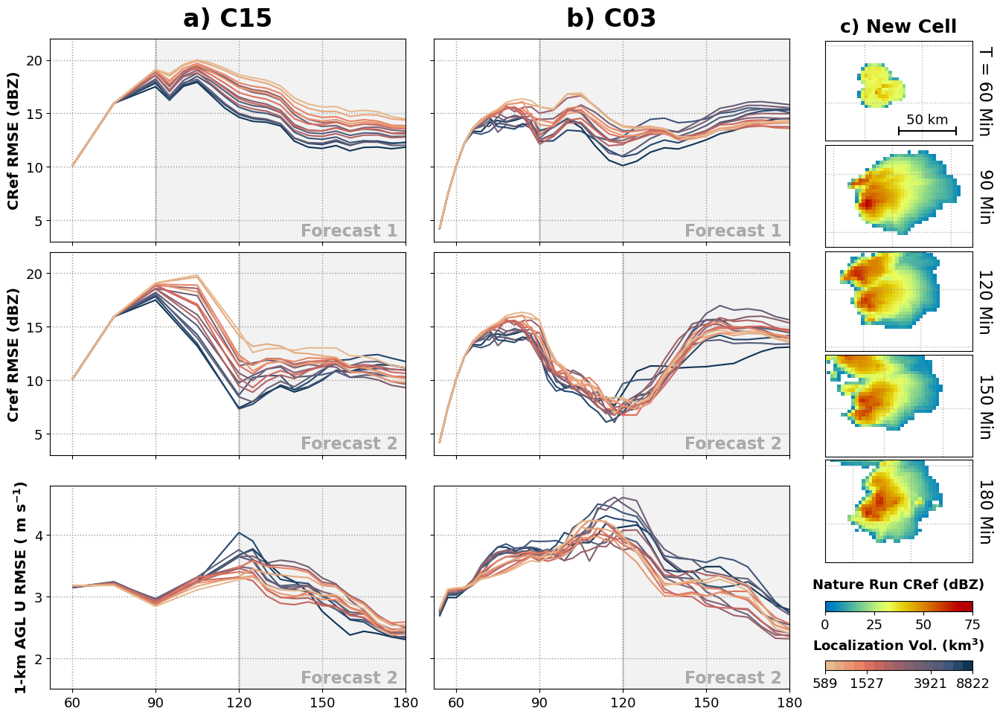

In [175]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Create figure
fig = plt.figure(figsize=(16, 11))

# Outer grid: 1 row, 2 columns (left = 2x3, right = 5x1)
outer = gridspec.GridSpec(1, 2, width_ratios=[5, 1], wspace=0.08)

# # LEFT: 2x3 grid
# left_gs = gridspec.GridSpecFromSubplotSpec(3, 3, subplot_spec=outer[0], wspace=0.08, hspace=0.05)

# axes = np.empty((3, 3), dtype=object)
# for i in range(3):
#     for j in range(3):
#         if i == 0 and j == 0:
#             ax = fig.add_subplot(left_gs[i, j])
#         else:
#             ax = fig.add_subplot(left_gs[i, j],sharex=axes[0, j] if i > 0 else None,sharey=axes[i, 0] if j > 0 else None)
#         axes[i, j] = ax
#         axes[i, j].yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:.0f}'))
#         axes[i,j].label_outer()
#         axes[i,j].grid()


# LEFT: 2x3 grid
left_gs = gridspec.GridSpecFromSubplotSpec(3,2, subplot_spec=outer[0], wspace=0.08, hspace=0.05)

axes = np.empty((3, 2), dtype=object)
for i in range(3):
    for j in range(2):
        if i == 0 and j == 0:
            ax = fig.add_subplot(left_gs[i, j])
        else:
            ax = fig.add_subplot(left_gs[i, j],sharex=axes[0, j] if i > 0 else None,sharey=axes[i, 0] if j > 0 else None)
        axes[i, j] = ax
        axes[i, j].yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:.0f}'))
        axes[i,j].label_outer()
        axes[i,j].grid()



# RIGHT: 5x1 grid
right_gs = gridspec.GridSpecFromSubplotSpec(6, 1, subplot_spec=outer[1], hspace=0.0)

right_axes = []
for i in range(6):
    ax = fig.add_subplot(right_gs[i, 0])
    ax.set_aspect('equal')
    right_axes.append(ax)


for ti, time in enumerate([60, 90, 120, 150, 180]):

    X0, X1, Y0, Y1 = get_storm_buffer(df, time)
    ref_NR  =  NR['cdbz'][findnearest(NRtime, time),     Y0:Y1, X0:X1].values
    ref = np.where(ref_NR <5, np.nan, ref_NR)

    myx, myy = xh[X0: X1], yh[Y0: Y1]
    im = right_axes[ti].pcolormesh(myx, myy, ref, vmin=0, vmax=75,cmap=ctables.REF_default, shading='nearest')

    right_axes[ti].set_xticks(np.arange(0, 400, 50),np.arange(0, 400, 50))
    right_axes[ti].set_yticks(np.arange(0, 400, 50),np.arange(0, 400, 50))
    right_axes[ti].grid(ls=':', alpha=0.7)
    right_axes[ti].xaxis.set_major_formatter(ticker.NullFormatter())
    right_axes[ti].yaxis.set_major_formatter(ticker.NullFormatter())
    right_axes[ti].tick_params(left=False, bottom=False)

    right_axes[ti].set_xlim(myx.min(), myx.max())
    right_axes[ti].set_ylim(myy.min(), myy.max())

    add = ''
    if ti == 0: add='T = '
    right_axes[ti].text(myx.max()+10, np.mean(myy), f'{add}{time} Min', ha='center', va='center', rotation=-90, fontsize=16,)

right_axes[0].set_title('c) New Cell', y=1.03)  
add_scale(right_axes[0], xstart=180, xlength=50, y=25)


plt.draw()

### add or reduce space betweent the plots
# for i,ax in enumerate(right_axes[1:]):
#     pos = ax.get_position()
#     pos.y0 = pos.y0 +.025*(i+1)
#     pos.y1 = pos.y1 +.025*(i+1)
#     ax.set_position(pos)
# plt.draw()

for ax in axes[2:,:].flatten():
    pos = ax.get_position()
    pos.y0 = pos.y0 -.025#*(i+1)
    pos.y1 = pos.y1 -.025#*(i+1)
    ax.set_position(pos)
fig.canvas.draw()


######## reflectivity colorbar

right_axes[-1].axis('off')
bbox = right_axes[-2].get_position()
Y = bbox.y0
X0, X1 = bbox.x0, bbox.x0 + bbox.width

cbar_ax = fig.add_axes([X0, Y - 0.06, bbox.width, 0.012])
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
cbar.ax.set_xlabel('Nature Run CRef (dBZ)', labelpad=-52, fontsize=13)


for i, ax in enumerate(axes.flatten()):
    if i in [0,1]:
        ax.axvspan(90,180, color='k', alpha=0.05, label='First Forecast')
        ax.axvline(90, color='k', alpha=0.1, lw=2)
    else:
        ax.axvspan(120,180, color='k', alpha=0.05, label='First Forecast')
        ax.axvline(120, color='k', alpha=0.1, lw=2)
        
    #ax.axvline(52, color='C3', alpha=0.9, lw=3, ls='--', label='Storm Initiation')
    ax.set_xlim(52, 180)


for ax in axes[-1,:]:
    ax.set_xticks([60,90,120,150,180], [60,90,120,150,180],)


# colors = cmaps.pride(np.linspace(0.2, 0.9,15))

colors = ctables.REF_default(np.linspace(0,1,15))
colors = cmaps.lipari(np.linspace(0.1,.85,15))[::-1]

cmap1 = LinearSegmentedColormap.from_list("CR",colors, 15)


for fi, freq in enumerate([15, 3]):
    axes[0, fi].set_title(chr(ord('`')+fi+1)+') '+f'C{freq:02d}', weight='bold', fontsize=24,  y=1.03)
        
    for hi, h in enumerate(hloc):
        for vi, v in enumerate(vloc):
        

            exp1 = df1[(df1.CI == freq) & (df1.H == h) & (df1.V == v)]
            exp2 = df2[(df2.CI == freq) & (df2.H == h) & (df2.V == v)]

            myc = colors[exp1.VI.values[0]]#

            axes[0, fi].plot(exp1.TIME, exp1.RMSE, color=myc, label=exp1.VOL.values[0])
            axes[1, fi].plot(exp2.TIME, exp2.RMSE, color=myc, label=exp2.VOL.values[0])


            #exp3 = df3[(df3.CI == freq) & (df3.H == h) & (df3.V == v)]
            exp4 = df4[(df4.CI == freq) & (df4.H == h) & (df4.V == v)]

            #axes[2, fi].plot(exp3.TIME, exp3.RMSE, color=myc, label=exp3.VOL.values[0])
            axes[2, fi].plot(exp4.TIME, exp4.RMSE, color=myc, label=exp4.VOL.values[0])
            



######## volume colorbar
vols = [589,848,1060,1508,1527,1532,2205,2356,2714,3393,3921,4241,6107,6126,8822]


bbox = right_axes[-2].get_position()
Y = bbox.y0
X0, X1 = bbox.x0, bbox.x0 + bbox.width

buff = 0.01
cbar_ax2 = fig.add_axes([X0, Y - 0.06*2.2, bbox.width, 0.012])

mappable = mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=14), cmap=cmap1)
mappable.set_array([])
cbar = fig.colorbar(mappable, cax=cbar_ax2, orientation='horizontal' )
cbar.ax.set_xlabel(r'Localization Vol. (km$\mathbf{^3}$)', labelpad=-52, fontsize=13)
cbar.set_ticks(ticks=[0, 4, 10, 14], labels=[vols[0], vols[4], vols[10], vols[14]]);


### set axes limits
axes[0,0].set_ylim(3, 22)
axes[1,0].set_ylim(3, 22)
axes[2,0].set_ylim(1.5, 4.8)
axes[2,0].set_yticks([2,3,4],[2,3,4])


axes[0, 0].set_ylabel('CRef RMSE (dBZ)',               fontsize=14)
axes[1, 0].set_ylabel('Cref RMSE (dBZ)',               fontsize=14)
axes[2, 0].set_ylabel(r'1 km AGL U RMSE ( m s$\mathbf{^{-1}}$)',fontsize=14)

for ai, ax in enumerate(axes[:,0]):
    ai = np.clip(ai, 0, 1)
    ax.text(0.98, 0.03, f'Forecast {ai+1}', ha='right', transform=ax.transAxes, fontsize=16, weight='bold', alpha=0.3)
for ai, ax in enumerate(axes[:,1]):
    ai = np.clip(ai, 0, 1)
    ax.text(0.98, 0.03, f'Forecast {ai+1}', ha='right', transform=ax.transAxes, fontsize=16, weight='bold', alpha=0.3)

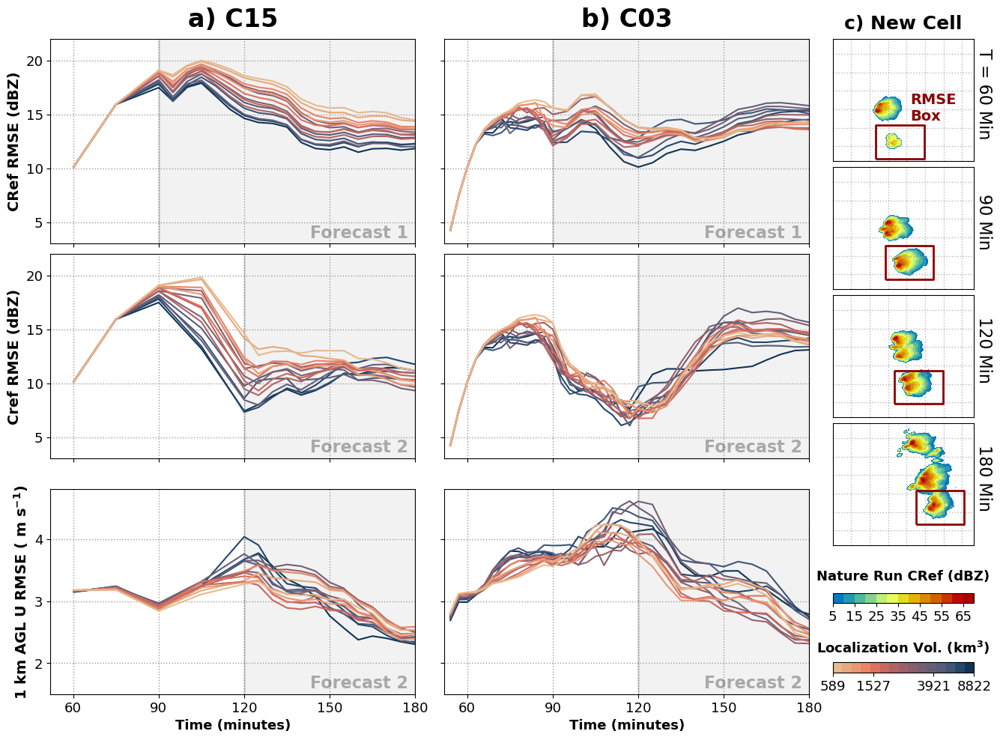

In [18]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Create figure
fig = plt.figure(figsize=(16, 11))

# Outer grid: 1 row, 2 columns (left = 2x3, right = 5x1)
outer = gridspec.GridSpec(1, 2, width_ratios=[5, 1], wspace=0.04)

# # LEFT: 2x3 grid
# left_gs = gridspec.GridSpecFromSubplotSpec(3, 3, subplot_spec=outer[0], wspace=0.08, hspace=0.05)

# axes = np.empty((3, 3), dtype=object)
# for i in range(3):
#     for j in range(3):
#         if i == 0 and j == 0:
#             ax = fig.add_subplot(left_gs[i, j])
#         else:
#             ax = fig.add_subplot(left_gs[i, j],sharex=axes[0, j] if i > 0 else None,sharey=axes[i, 0] if j > 0 else None)
#         axes[i, j] = ax
#         axes[i, j].yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:.0f}'))
#         axes[i,j].label_outer()
#         axes[i,j].grid()


# LEFT: 2x3 grid
left_gs = gridspec.GridSpecFromSubplotSpec(3,2, subplot_spec=outer[0], wspace=0.08, hspace=0.05)

axes = np.empty((3, 2), dtype=object)
for i in range(3):
    for j in range(2):
        if i == 0 and j == 0:
            ax = fig.add_subplot(left_gs[i, j])
        else:
            ax = fig.add_subplot(left_gs[i, j],sharex=axes[0, j] if i > 0 else None,sharey=axes[i, 0] if j > 0 else None)
        axes[i, j] = ax
        axes[i, j].yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:.0f}'))
        axes[i,j].label_outer()
        axes[i,j].grid()



# RIGHT: 5x1 grid
right_gs = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=outer[1], hspace=0.05)

right_axes = []
for i in range(5):
    ax = fig.add_subplot(right_gs[i, 0])
    ax.set_aspect('equal')
    right_axes.append(ax)


for ti, time in enumerate([60, 90, 120, 180]):

    X0, X1, Y0, Y1 = get_storm_buffer(df, time)
    ref_NR  =  NR['cdbz'][findnearest(NRtime, time),     Y0:Y1, X0:X1].values
    ref = np.where(ref_NR <5, np.nan, ref_NR)

    # myx, myy = xh[X0: X1], yh[Y0: Y1]
    # im = right_axes[ti].pcolormesh(myx, myy, ref, vmin=0, vmax=75,cmap=ctables.REF_default, shading='nearest')


    xh, yh = NR.xh.values, NR.yh.values
    ref = np.where(ref_NR <5, np.nan, ref_NR)

    im=right_axes[ti].contourf(xh, yh, NR['cdbz'][findnearest(NRtime, time)], cmap=ctables.REF_default, levels=np.arange(5, 75, 5))

    xh0, xh1 = xh[X0], xh[X1]
    yh0, yh1 = yh[Y0], yh[Y1]

    right_axes[ti].plot([xh0, xh0, xh1, xh1, xh0],[yh0, yh1, yh1,yh0, yh0], color='darkred', lw=2)
    

    right_axes[ti].set_xticks(np.arange(0, 400, 50),np.arange(0, 400, 50))
    right_axes[ti].set_yticks(np.arange(0, 400, 50),np.arange(0, 400, 50))
    right_axes[ti].grid(ls=':', alpha=0.7)
    right_axes[ti].xaxis.set_major_formatter(ticker.NullFormatter())
    right_axes[ti].yaxis.set_major_formatter(ticker.NullFormatter())
    right_axes[ti].tick_params(left=False, bottom=False)

    # right_axes[ti].set_xlim(myx.min(), myx.max())
    # right_axes[ti].set_ylim(myy.min(), myy.max())

    right_axes[ti].set_ylim(10, 340)

    add = ''
    if ti == 0: add='T = '
    
    right_axes[ti].text(410, np.mean(yh), f'{add}{time} Min', ha='center', va='center', rotation=-90, fontsize=16,)

right_axes[0].set_title('c) New Cell', y=1.03)  
#add_scale(right_axes[0], xstart=200, xlength=100, y=250, text_bump = 10)


plt.draw()


for ax in axes[2:,:].flatten():
    pos = ax.get_position()
    pos.y0 = pos.y0 -.025#*(i+1)
    pos.y1 = pos.y1 -.025#*(i+1)
    ax.set_position(pos)
fig.canvas.draw()


for i, ax in enumerate(axes.flatten()):
    if i in [0,1]:
        ax.axvspan(90,180, color='k', alpha=0.05, label='First Forecast')
        ax.axvline(90, color='k', alpha=0.1, lw=2)
    else:
        ax.axvspan(120,180, color='k', alpha=0.05, label='First Forecast')
        ax.axvline(120, color='k', alpha=0.1, lw=2)
        
    #ax.axvline(52, color='C3', alpha=0.9, lw=3, ls='--', label='Storm Initiation')
    ax.set_xlim(52, 180)


for ax in axes[-1,:]:
    ax.set_xticks([60,90,120,150,180], [60,90,120,150,180],)


#colors = ctables.REF_default(np.linspace(0,1,15))
colors = cmaps.lipari(np.linspace(0.1,.85,15))[::-1]
cmap1 = LinearSegmentedColormap.from_list("CR",colors, 15)


for fi, freq in enumerate([15, 3]):
    axes[0, fi].set_title(chr(ord('`')+fi+1)+') '+f'C{freq:02d}', weight='bold', fontsize=24,  y=1.03)

    count = 0
        
    for hi, h in enumerate(hloc):
        for vi, v in enumerate(vloc):

    
            #if count % 2 == 0:
        

            exp1 = df1[(df1.CI == freq) & (df1.H == h) & (df1.V == v)]
            exp2 = df2[(df2.CI == freq) & (df2.H == h) & (df2.V == v)]

            myc = colors[exp1.VI.values[0]]#

            axes[0, fi].plot(exp1.TIME, exp1.RMSE, color=myc, label=exp1.VOL.values[0])
            axes[1, fi].plot(exp2.TIME, exp2.RMSE, color=myc, label=exp2.VOL.values[0])


            #exp3 = df3[(df3.CI == freq) & (df3.H == h) & (df3.V == v)]
            exp4 = df4[(df4.CI == freq) & (df4.H == h) & (df4.V == v)]

            #axes[2, fi].plot(exp3.TIME, exp3.RMSE, color=myc, label=exp3.VOL.values[0])
            axes[2, fi].plot(exp4.TIME, exp4.RMSE, color=myc, label=exp4.VOL.values[0])

            count +=1
                



######## reflectivity colorbar

right_axes[-1].axis('off')
bbox = right_axes[-2].get_position()
Y = bbox.y0
X0, X1 = bbox.x0, bbox.x0 + bbox.width

cbar_ax = fig.add_axes([X0, Y - 0.07, bbox.width, 0.012])
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
cbar.ax.set_xlabel('Nature Run CRef (dBZ)', labelpad=-52, fontsize=13)



######## volume colorbar
vols = [589,848,1060,1508,1527,1532,2205,2356,2714,3393,3921,4241,6107,6126,8822]


bbox = right_axes[-2].get_position()
Y = bbox.y0
X0, X1 = bbox.x0, bbox.x0 + bbox.width

buff = 0.01
cbar_ax2 = fig.add_axes([X0, Y - 0.07*2.2, bbox.width, 0.012])

mappable = mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=14), cmap=cmap1)
mappable.set_array([])
cbar = fig.colorbar(mappable, cax=cbar_ax2, orientation='horizontal' )
cbar.ax.set_xlabel(r'Localization Vol. (km$\mathbf{^3}$)', labelpad=-52, fontsize=13)
cbar.set_ticks(ticks=[0, 4, 10, 14], labels=[vols[0], vols[4], vols[10], vols[14]]);



### set axes limits
### set axes limits
axes[0,0].set_ylim(3, 22)
axes[1,0].set_ylim(3, 22)
axes[2,0].set_ylim(1.5, 4.8)
axes[2,0].set_yticks([2,3,4],[2,3,4])


axes[0, 0].set_ylabel('CRef RMSE (dBZ)',               fontsize=14)
axes[1, 0].set_ylabel('Cref RMSE (dBZ)',               fontsize=14)
axes[2, 0].set_ylabel(r'1 km AGL U RMSE ( m s$\mathbf{^{-1}}$)',fontsize=14)

for ai, ax in enumerate(axes[:,0]):
    ai = np.clip(ai, 0, 1)
    ax.text(0.98, 0.03, f'Forecast {ai+1}', ha='right', transform=ax.transAxes, fontsize=16, weight='bold', alpha=0.3)
for ai, ax in enumerate(axes[:,1]):
    ai = np.clip(ai, 0, 1)
    ax.text(0.98, 0.03, f'Forecast {ai+1}', ha='right', transform=ax.transAxes, fontsize=16, weight='bold', alpha=0.3)


right_axes[0].text(210, 120, 'RMSE\nBox', weight='bold', fontsize=14, color='darkred')

for ax in axes[-1,:]: ax.set_xlabel('Time (minutes)', weight='bold', y=-0.1)

# FIGNAME = 'SStormRMSE'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')

In [60]:


for ti, time in enumerate(np.arange(52, 181, 5)):

    fig, ax = plt.subplots(1,1, figsize=(5,4), subplot_kw={'aspect':'equal'})

    X0, X1, Y0, Y1 = get_storm_buffer(df, time)
    ref_NR  =  NR['cdbz'][findnearest(NRtime, time),     Y0:Y1, X0:X1].values
    xh, yh = NR.xh.values, NR.yh.values
    ref = np.where(ref_NR <5, np.nan, ref_NR)

    im=ax.contourf(xh, yh, NR['cdbz'][findnearest(NRtime, time)], cmap=ctables.REF_default, levels=np.arange(5, 75, 5), alpha=0.4, antialiased=True)

    im=ax.contourf(xh[X0:X1], yh[Y0:Y1], NR['cdbz'][findnearest(NRtime, time), Y0:Y1, X0:X1], cmap=ctables.REF_default, levels=np.arange(5, 75, 5), alpha=1, antialiased=True)

    xh0, xh1 = xh[X0], xh[X1]
    yh0, yh1 = yh[Y0], yh[Y1]

    ax.plot([xh0, xh0, xh1, xh1, xh0],[yh0, yh1, yh1,yh0, yh0], color='k', lw=2)

    myx, myy = xh[X0: X1], yh[Y0: Y1]
 
    ax.set_xticks(np.arange(0, 400, 100),np.arange(0, 400, 100))
    ax.set_yticks(np.arange(0, 400, 100),np.arange(0, 400, 100))
    ax.grid(ls=':', alpha=0.7)

    ax.set_ylim(0, 250)
    ax.set_xlim(50, 380)
    

    cbar_ax = fig.add_axes([0.92, 0.2, 0.03, 0.6])
    cbar = fig.colorbar(im, cax=cbar_ax, extend='both')
    cbar.set_label('Nature Run Cref (dBZ)', weight='bold')

    ax.set_xlabel('X (km)')
    ax.set_ylabel('Y (km)')
    ax.set_title(f'Time = {time} minutes', weight='bold', fontsize=18)
    

    plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/temp/NEW_sstorm_{time:03d}.png', dpi=300, bbox_inches='tight')
    plt.close()

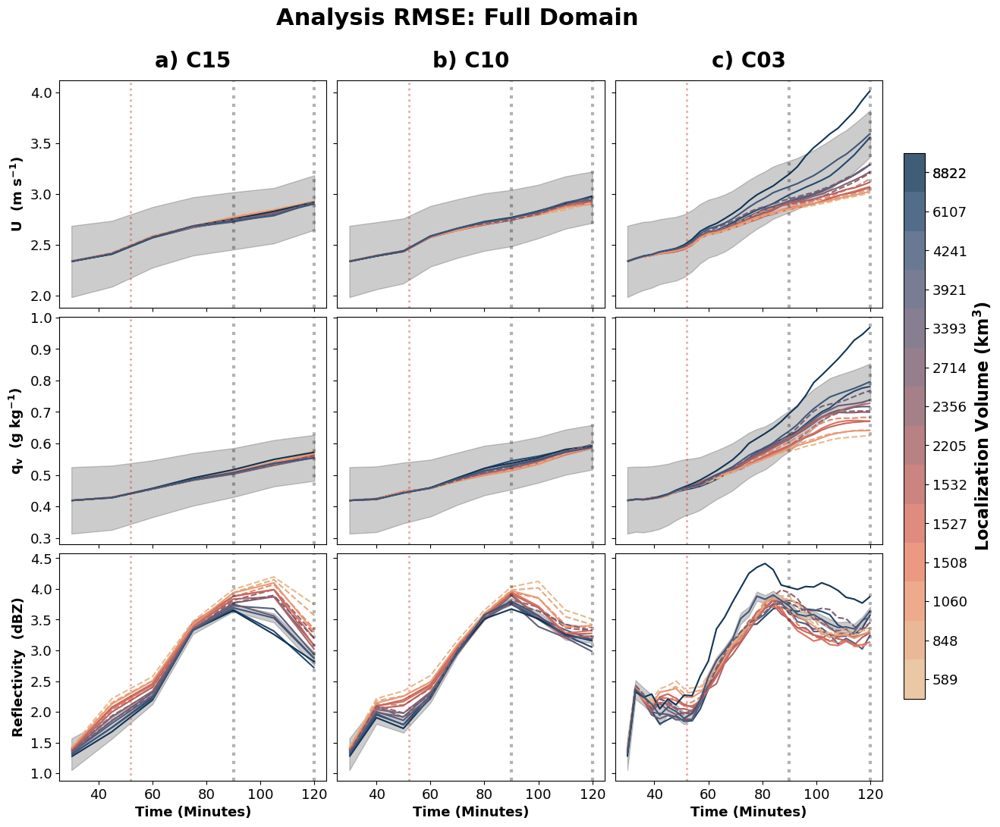

In [62]:
n = 36
max_index = 36
n_boot = 10000
indices = generate_bootstrap_indices(n, max_index, n_boot, seed=42)
interval = 95


allvars = ['u_20dbz', 'qv_20dbz' ,'dbz_20dbz']

freq = [15, 10, 3]
hloc = [ 15, 12, 9, 7, 18]
vloc = [6,2, 4]


colors = cmaps.lipari(np.linspace(0.1,.85,15))[::-1]
units   = {'u': r'm s$\mathbf{^{-1}}$', 'v': r'm s$\mathbf{^{-1}}$', 'w': r'm s$\mathbf{^{-1}}$', 'th':'K', 'qv': r'g kg$\mathbf{^{-1}}$', 'dbz':'dBZ','dbz_20dbz':'dBZ'}
titles  = {'u': 'U', 'v':'V', 'w': 'W', 'th':r'$\mathbf{\theta}$', 'qv': r'q$_{\mathbf{v}}$', 'dbz':'Reflectivity', 'dbz_20dbz':'Reflectivity'}


vols = [589,848,1060,1508,1527,1532,2205,2356,2714,3393,3921,4241,6107,6126,8822]


# mycols = [colors[findnearest(vols, df.vols_3.loc[i])] for i in df.index]


if len (freq) == 3:
    fig, axes = plt.subplots(len(allvars),3, figsize=(14, 12), sharey='row', sharex=True)
else:
    fig, axes = plt.subplots(len(allvars),4, figsize=(19, 12), sharey='row', sharex=True)




for fi, freq in enumerate(freq):
    axes[0, fi].set_title(chr(ord('`')+fi+1)+') '+f'C{freq:02d}', weight='bold', fontsize=20,  y=1.03)

    count = 0
        
    for hi, h in enumerate(hloc):
        for vi, v in enumerate(vloc):

            exp = f'C{freq:02d}_H{h:02d}_V{v}'
            name = rename(exp, version='full')             
            hr = float(name.split('-')[1][1:])
            vr = float(name.split('-')[2][1:])

            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp}/RMSE_all_members.nc")[0]
            ds = xr.open_dataset(path, decode_timedelta=True)
            time = ds.time.values

            color_i = colors[findnearest(vols, (4/3)*np.pi*vr*hr*hr)]

            ls = '-'
            if v == 2: ls = '--'


            for ai, a in enumerate(allvars):
                a = a.replace('_20dbz', '')
                axes[ai, fi].plot(time, ds[a].mean(axis=1), color=color_i, lw=1.5, ls=ls)

                if (h == 18) &( v==4):

                    ci = []
                    for ti, t in enumerate(time):
                        ci.append(compute_ci_perc(bootstrap_fss_from_indices(ds[a][ti,:-1].values, indices), interval))
                    axes[ai, fi].fill_between(time, ds[a].mean(axis=1) - ci, ds[a].mean(axis=1) + ci , color='k', alpha=0.2)
                    
                if fi == 0: axes[ai,0].set_ylabel( f"{titles[a.replace('_20dbz', '')]}  ({units[a.replace('_20dbz', '')]})")
                if ai == 2: axes[ai, fi].set_xlabel('Time (Minutes)', weight='bold')
                

    
            #if count % 2 == 0:

for ax in axes.flatten():
    ax.axvline(52, color='C3', ls=':', lw=2, alpha=0.4)
    ax.axvline(90,  color='k', lw=3, alpha=0.3, ls=':')
    ax.axvline(120, color='k', lw=3, alpha=0.3, ls=':')

#axes[0,0].set_ylim(6, 12)


cmap1 = LinearSegmentedColormap.from_list("CR",colors, 14)
mappable = mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=14), cmap=cmap1)
mappable.set_array([])
cax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
cbar = fig.colorbar( mappable, cax=cax, alpha=0.8)#, spacing='uniform', ticks = np.unique(df.vols_3))#, ticks=np.unique(df1.VOL))
cbar.set_label(r'Localization Volume (km$\mathbf{^3}$)', fontsize=16)


cbar_ticks = np.array(np.arange(0, 15))
labels = [vols[i] for i in cbar_ticks]

cbar_ticks = np.concatenate([cbar_ticks[:-1] + 0.5, [13.5]])
cbar.set_ticks(ticks=cbar_ticks, labels=labels);


fig.suptitle('Analysis RMSE: Full Domain', fontsize=22, weight='bold', y=.96)

#fig.suptitle('Analysis RMSE: Where Nature Run > 20 dBZ', fontsize=22, weight='bold', y=.96)
plt.subplots_adjust(hspace=0.04, wspace=0.04)

#axes[0, 0].text(52, 0.95)

In [8]:
n = 36
max_index = 36
n_boot = 10000
indices = generate_bootstrap_indices(n, max_index, n_boot, seed=42)
interval = 95

#################################################################


hloc_i = range(len(hloc))
vloc_i = range(len(vloc))
gridx, gridy = np.meshgrid(hloc_i, vloc_i)

units   = {'u': r'm s$\mathbf{^{-1}}$', 'v': r'm s$\mathbf{^{-1}}$', 'w': r'm s$\mathbf{^{-1}}$', 'th':'K', 'qv': r'g kg$\mathbf{^{-1}}$', 'dbz':'dBZ','dbz_20dbz':'dBZ'}
titles  = {'u': 'U', 'v':'V', 'w': 'W', 'th':r'$\mathbf{\theta}$', 'qv': r'q$_{\mathbf{v}}$', 'dbz':'Reflectivity', 'dbz_20dbz':'Reflectivity'}

NR = xr.open_dataset('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc')
NRtime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in NR.dates.values[:]]
NR_size = NR.cp_size.values
NR.close()

colors = list(cmaps.pride([.2, .75, .6]))


ls     = '-'
lw     = 3
alpha  = 0.8
marker = 's'
ms     = 6

allvars = ['qv_20dbz', 'dbz_20dbz', 'dbz']

#allvars = ['w', 'dbz']



if len (freq) == 3:
    fig, axes = plt.subplots(len(allvars),3, figsize=(14, 12), sharey='row', sharex=True)
else:
    fig, axes = plt.subplots(len(allvars),4, figsize=(19, 12), sharey='row', sharex=True)



for ci, c in enumerate(freq):

    temp_table = np.zeros([6, len(hloc), len(vloc)])
    ci_table   = np.zeros([6, len(hloc), len(vloc)])
    for vi, v in enumerate(vloc):
        
        for hi, h in enumerate(hloc):

            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{c:02d}_H{h:02d}_V{v}/RMSE_all_members.nc")[0]
            ds = xr.open_dataset(path, decode_timedelta=True)

            for ii, var in enumerate(allvars):

                #var = var+'_20dbz'
                
                temp_table[ii, hi, vi] = ds[var][:,:-1].mean()
                ci_table[ii, hi, vi] = compute_ci_perc(bootstrap_fss_from_indices(ds[var][:,:-1].values.mean(axis=0), indices), interval)

<xarray.Dataset> Size: 111kB
Dimensions:    (t: 31, ne: 37)
Coordinates:
  * t          (t) int64 248B 0 1 2 3 4 5 6 7 8 9 ... 22 23 24 25 26 27 28 29 30
  * ne         (ne) int64 296B 0 1 2 3 4 5 6 7 8 ... 28 29 30 31 32 33 34 35 36
Data variables: (12/13)
    time       (t) float64 248B 30.0 33.0 36.0 39.0 ... 111.0 114.0 117.0 120.0
    u          (t, ne) float64 9kB ...
    u_20dbz    (t, ne) float64 9kB ...
    v          (t, ne) float64 9kB ...
    v_20dbz    (t, ne) float64 9kB ...
    w          (t, ne) float64 9kB ...
    ...         ...
    dbz        (t, ne) float64 9kB 1.824 0.7849 0.785 ... 3.406 3.368 3.118
    dbz_20dbz  (t, ne) float64 9kB 27.64 27.63 27.62 27.62 ... 13.28 12.84 12.34
    th         (t, ne) float64 9kB ...
    th_20dbz   (t, ne) float64 9kB ...
    qv         (t, ne) float64 9kB ...
    qv_20dbz   (t, ne) float64 9kB 1.049 0.941 0.9013 ... 2.152 2.17 1.781

# Performance Diagrams

Text(0.5, 1.02, 'Mean 1-Hour Forecasts of\n2-5 km |UH| Objects > 100 m$^{-2}$ s$^{-2}$')

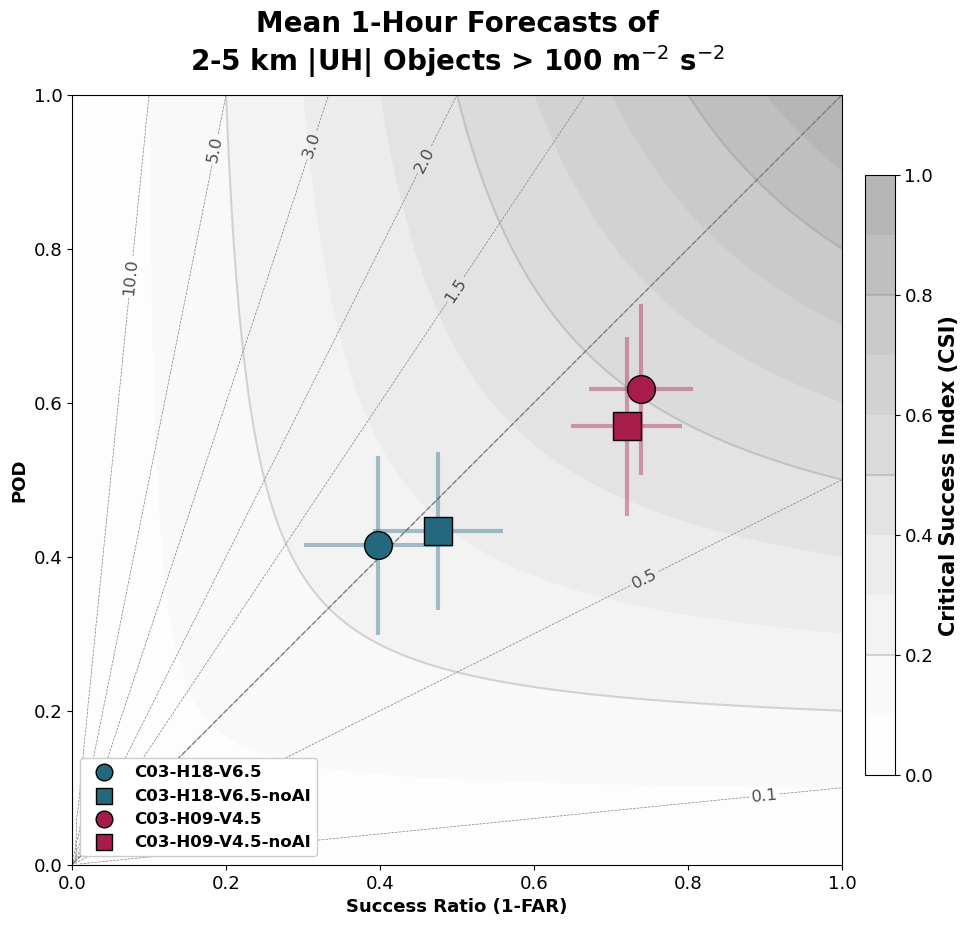

In [232]:

exps = [f'C{h:02d}_H15_V4' for h in [15,10,3]]
exps2 = [f'C{h:02d}_H09_V4' for h in [15,10,3]]
exps3 =[]
markers = ['o', 's', '']
leg_order = [0,3,1,4,2,5]
version='H'



# exps = [f'C{h:02d}_H09_V2' for h in [15,10,3]]
# exps2 = [f'C{h:02d}_H09_V4' for h in [15,10,3]]
# exps3 =[f'C{h:02d}_H09_V6' for h in [15,10,3]]
# markers = ['s', 'o', '^']
# leg_order = [0,3,6, 1,4,7, 2,5,8]
# version='V'

exps = ['C03_H09_V4','C03_H18_V6','C10_H09_V4','C10_H18_V6','C15_H09_V4','C15_H18_V6']
exps2 = ['C03_H09_V4_noAI','C03_H18_V6_noAI','C10_H09_V4_noAI','C10_H18_V6_noAI','C15_H09_V4_noAI','C15_H18_V6_noAI']


exps = ['C03_H09_V4','C03_H18_V6'][::-1]
exps2 = ['C03_H09_V4_noAI','C03_H18_V6_noAI'][::-1]

exps3 =[]
markers = ['o', 's', '']
leg_order = np.array([[i,i+len(exps)] for i in range(len(exps))]).flatten()#[0,3, 1,4,2, 5]#[0,2,1,3]
version='fullx'

# exps = ['C03_H09_V2_fix','C10_H09_V6_fix','C15_H15_V6_fix']
# exps2 = ['C03_H09_V2_dense_fix','C10_H09_V6_dense_fix','C15_H15_V6_dense_fix']
# exps3=[]
# markers = ['o', 's', '']
# leg_order=[0,1,2,3,4,5]#[0,2,1,4,3,5]
# version='raw'



colors = cmaps.pride(np.linspace(.2, .8, len(exps)))
if len(exps) == 3: colors = list(cmaps.pride([.2, .75, .6]))

dist_thresh = 40

var = 'UH'
thresh = 100

# var = 'compdbz'
# thresh = 40


fcsts = ['FORECAST_20240508_2100', '']
#fcsts = ['']
add=''
if dist_thresh!=40: add=f'_{dist_thresh}km'
    
fig, ax = plt.subplots(figsize=(10,10))

im = performance_diagram(ax, axis_labels=False, cax = fig.add_axes([0.92, 0.2, 0.03, 0.6]),cbar_fs=15)


exp_arr=[exps, exps2, exps3]

for mi, myexps in enumerate(exp_arr):
    for ei,exp in enumerate(myexps):

        val_dct, ci_dct = generate_CI_contigency(exp, var, fcsts=fcsts, thresh=thresh)
        ax.errorbar(val_dct['SR'], val_dct['POD'], xerr=ci_dct['SR'], yerr=ci_dct['POD'], color=colors[ei],elinewidth=3,capsize=0, alpha=0.4)#lw=3, alpha=0.5 )
        ax.scatter(val_dct['SR'], val_dct['POD'], facecolor=colors[ei], edgecolor='k', marker=markers[mi],s=400, zorder=100, label=rename(exp, version=version))


        
h, l =ax.get_legend_handles_labels()
ax.legend([h[i] for i in leg_order],[l[i] for i in leg_order], ncol=1, loc='lower left', markerscale=0.6, columnspacing=1, prop={'size':12, 'weight':'bold'})
ax.set_xlabel('Success Ratio (1-FAR)')
ax.set_ylabel('POD')


if var == 'UH':
    tvar = '2-5 km |UH|'
    units = r'm$^{-2}$ s$^{-2}$'

if var == 'compdbz':
    tvar = 'Composite Ref'
    units = r'dBZ'

ax.set_title(f'Mean 1-Hour Forecasts of\n{tvar} Objects > {thresh} {units}', weight='bold', y=1.02, fontsize=20)

# ax.set_xlim(.2, 1)
# ax.set_ylim(.3, 1)

# FIGNAME = 'VPerformance'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')

# Adaptive Inflation Stuff

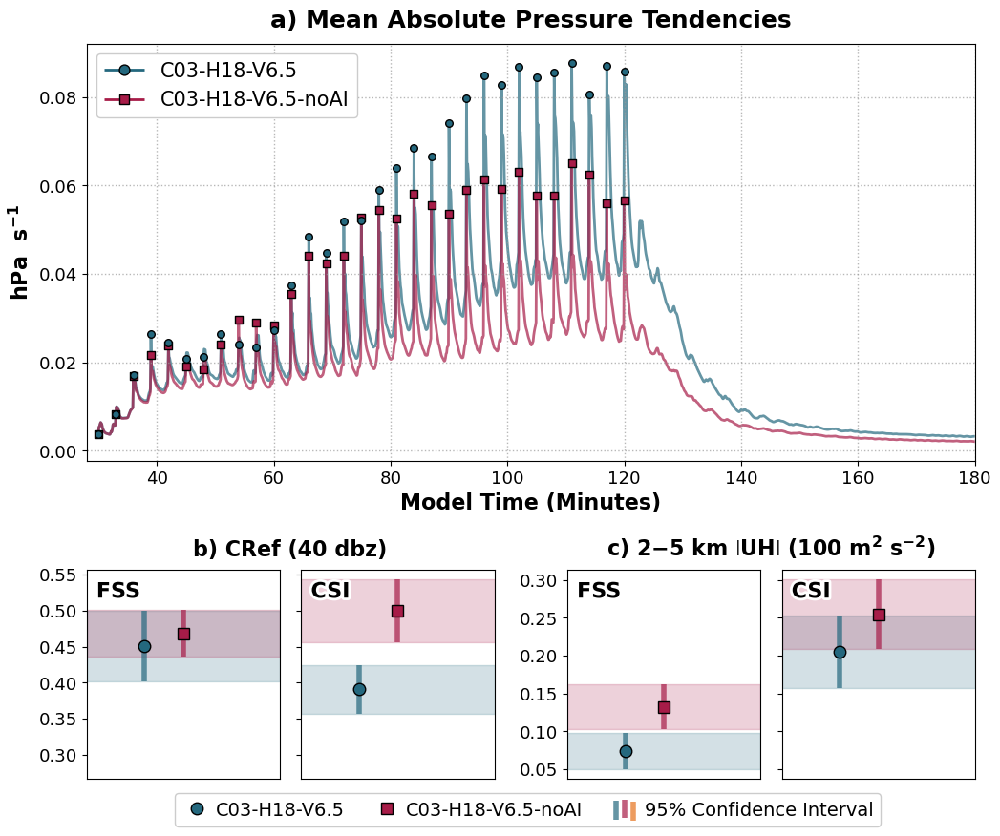

In [5]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# # Create figure
fig = plt.figure(figsize=(12, 10))

# Define GridSpec: 2 rows, 4 columns
gs = gridspec.GridSpec(nrows=2,ncols=4,height_ratios=[2, 1], hspace=0.35)
# Top large subplot (spans all 4 columns)
ax = fig.add_subplot(gs[0, :])

# Bottom 4 subplots
axes = []
for i in range(4):
    if (i == 1) | (i == 3): a = fig.add_subplot(gs[1, i], sharey = axes[-1])
    else: a = fig.add_subplot(gs[1, i])
    axes.append(a)


#use for the noAI plot
exps = ['C03_H18_V6','C03_H18_V6_noAI']#,'C03_H12_V4']

#exps = ['C03_H09_V4','C03_H09_V4_noAI','C03_H12_V4']
version = 'Fullx'


colors = list(cmaps.pride([0.2, 0.8, 0.65]))
markers = ['o', 's', 'D', 'H','^', '>', '<', 'v']
ms     = 9

ls     = ['-']* len(exps)
members = np.arange(0, 36, 1)
fpath = f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/'


for i,exp in enumerate(exps): 

    freq, dalen = int(exp[1:3]) * 60, 90*60
    peaks = (np.arange(0,dalen+freq/2, freq )/6).astype(int) 

    wtg = xr.open_dataset(f'{fpath}{exp}/balance.nc')
    i0=findnearest(wtg.time.values, 30) # this will be zero if you used a "pre cooked" set up
    time = wtg.time.values[i0:]
    pten = wtg.divc.values[i0:].mean(axis=1)/100     

    #### PRESSURE TENDENCY
    scat = ax.scatter(time[peaks], pten[peaks],s=30,marker=markers[i], color=colors[i], zorder=100*(10-i), ec='k',label=rename(exp, version=version))
    ax.plot(time, pten,  color=colors[i], lw=2,label=rename(exp, version=version), alpha=0.7, zorder=1, ls=ls[i])#, zorder=100*(10-i))
   

l, h = [],[]
for i, exp in enumerate(exps):
    h.append(mpl.lines.Line2D([0], [0], color=colors[i], linewidth=2, marker=markers[i],  markeredgecolor='k', linestyle=ls[i]))
    l.append(rename(exp, version=version))
ax.legend(handles=h, labels=l,fontsize=15, loc=2, markerscale=1.3)

ax.set_xlim(28, 180)


ax.set_title("a) Mean Absolute Pressure Tendencies", weight='bold', y=1.02, fontsize=18)
ax.set_xlabel('Model Time (Minutes)', fontsize=16)
ax.set_ylabel(r"hPa  s$\mathbf{^{-1}}$", fontsize=16);
ax.grid(ls=':', alpha=0.7)

#######################################################


values = np.zeros([len(exps), 4])
cibars = np.zeros([len(exps), 4])

for ei, exp in enumerate(exps):
    
    fss_vals, ci_val = generate_CI_FSS(exp, 'compdz', neighborhood=24, thresh=40, fcsts=[''])
    values[ei, 0] = fss_vals[-1]
    cibars[ei, 0] = ci_val

    val_dct, ci_dct = generate_CI_contigency(exp,'compdbz', fcsts=[''])
    values[ei, 1] = val_dct['CSI']
    cibars[ei, 1] = ci_dct['CSI']

    fss_vals, ci_val = generate_CI_FSS(exp, 'uh2to5', neighborhood=24, thresh=100, fcsts=[''])
    values[ei, 2] = fss_vals[-1]
    cibars[ei, 2] = ci_val

    val_dct, ci_dct = generate_CI_contigency(exp,'UH', fcsts=[''])
    values[ei, 3] = val_dct['CSI']
    cibars[ei, 3] = ci_dct['CSI']
    

for i, ax in enumerate(axes):
    for ei in range(len(exps)):

        name = rename(exps[ei], version='FULLX')   
        ax.errorbar(ei, values[ei,i], yerr=cibars[ei,i], marker='s', ms=0,mec='k', lw=0,color=colors[ei], elinewidth=4,capsize=0,alpha=0.7)

        ax.axhspan(values[ei,i]-cibars[ei,i],values[ei,i]+cibars[ei,i],color=colors[ei], alpha=0.2)
        ax.plot(    ei, values[ei,i],                 marker=markers[ei], color=colors[ei], markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)
        ax.set_xlim(-1.5, 3.5)


plt.draw()
### configure bottom plots
small_ls = ['FSS', 'CSI', 'FSS', 'CSI']

for i,ax in enumerate(axes):
    ax.set_xticks([])
    ax.text(0.05, .95, small_ls[i], ha='left', va='top', transform = ax.transAxes, fontsize=16, weight='bold',path_effects =[path_effects.Stroke(linewidth=4, foreground='w'),path_effects.Normal()])


    if i in [1,2]:
        pos = ax.get_position()
        pos.x0 = pos.x0 -.015 + 0.015*2*(i-1)
        pos.x1 = pos.x1 -.015 + 0.015*2*(i-1)
        ax.set_position(pos)
    if i in [1,3]:
        ax.tick_params(labelleft=False)      
fig.canvas.draw()     

units = r'm$\mathbf{^{2}}$ s$\mathbf{^{-2}}$'
tvar = r'2$\mathbf{-}$5 km $\mathbf{\left| {UH} \right|}$'

for i in [0, 2]:
    pos = axes[i].get_position()
    pos2 = axes[i+1].get_position()

    x1 = pos.x0 + pos.width
    x2 = pos2.x0

    text = f'c) {tvar} (100 {units})'
    if i == 0: text = 'b) CRef (40 dbz)'

    fig.text((x1+x2)/2, pos.y1+.015, text, ha='center', fontsize=16, weight='bold')
    

axes[0].scatter(-1.5, np.nanmean(values[0]), marker='|', linewidth=4, s=200, color='w', alpha=0.7, label='95% Confidence Interval')
handles, labels =axes[0].get_legend_handles_labels()
#new_handles,new_labels = [handles[0],handles[1],handles[2],(handles[3])], [labels[0], labels[1],labels[2], labels[3]]
new_handles,new_labels = [handles[0],handles[1],handles[2]], [labels[0], labels[1],labels[2]]
leg=fig.legend(new_handles, new_labels, fontsize=14, scatterpoints=3, markerscale=1., loc='lower center', bbox_to_anchor=(0.51,0.05), ncol=4, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
leg.legend_handles[2].set_facecolors(colors)


# tvar = r'2$\mathbf{-}$5 km $\mathbf{\left| {UH} \right|}$'
# units = r'm$^\mathbf{{-2}}$ s$\mathbf{^{-2}}$'


# FIGNAME = 'AIvsNoAI'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')

In [9]:
def preprocess(ds, filename):
    # Extract time from filename (edit this!)
    time_str = filename.split("_")[-1].replace(".nc", "")
    time = (dt.datetime.strptime(filename.split("/")[-1].replace(".nc", "").replace('Inflation_', ''), '%Y-%m-%d_%H:%M:%S') - dt.datetime(2024,5,8,19,30)).seconds/60
    
    return ds.expand_dims(time=[time])

files = sorted(glob.glob(f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp}/Inflation*'))
ds = xr.open_mfdataset( files, combine="nested", concat_dim="time", preprocess=lambda ds: preprocess(ds, ds.encoding["source"]))

In [11]:
exps = [f'C{h:02d}_H15_V4' for h in [15,10,3]]
colors = cmaps.pride(np.linspace(.2, .8, len(exps)))


n = 36
max_index = 36
n_boot = 10000
indices = generate_bootstrap_indices(n, max_index, n_boot, seed=42)
interval = 95

vols = [589,848,1060,1508,1527,1532,2205,2356,2714,3393,3921,4241,6107,6126,8822]
hloc = [18,15,12,9,7]
vloc = [6, 4, 2]


df = pd.DataFrame()

for freq in [15, 10, 3]:

    volume = []
    pres   = []
    adapt  = []
    ci     = []
    for hi, h in enumerate(hloc):
        for vi, v in enumerate(vloc):
    
            exp = f'C{freq:02d}_H{h:02d}_V{v}'
            name = rename(exp, version='full')             
            hr = float(name.split('-')[1][1:])
            vr = float(name.split('-')[2][1:])
                
            files = sorted(glob.glob(f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp}/Inflation*'))
            ds = xr.open_mfdataset( files, combine="nested", concat_dim="time", preprocess=lambda ds: preprocess(ds, ds.encoding["source"]))
            
            wtg = xr.open_dataset(f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp}/balance.nc')
            stop = findnearest(wtg.time.values, 120)#+1


            ci.extend([compute_ci_perc(bootstrap_fss_from_indices(wtg.divc.values[:stop].mean(axis=0).flatten()/100, indices), interval)])


            volume.extend([(4/3)*np.pi*vr*hr*hr])
            pres.extend([np.mean(wtg.divc.values[:stop])/100])
            adapt.extend([np.mean(ds.inflation.values)])
        
   # df = pd.DataFrame( data = {'p': wtg.divc.values[:stop].mean(axis=1)/100}, index = [dt.timedelta(minutes =t) for t in wtg.time.values[:stop]])
    #res = df.resample(dt.timedelta(seconds=int(exp.split('_')[0][1:])*60), label='right', closed='right').mean()

        #plt.scatter(np.mean(ds.inflation.values), np.mean(wtg.divc.values[:stop])/100, color=colors[ei])
    
            wtg.close()
            ds.close()
    df[f'vols_{freq}'] = volume
    df[f'pres_{freq}'] = pres
    df[f'adapt_{freq}'] = adapt
    df[f'ci95_{freq}'] = ci



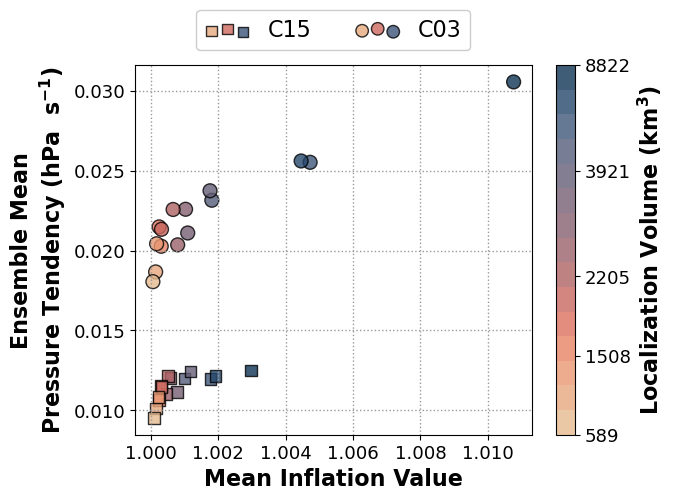

In [12]:
colors = cmaps.lipari(np.linspace(0.1,.85,15))[::-1]

cmap1 = LinearSegmentedColormap.from_list("CR",colors, 15)

mappable = mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=14), cmap=cmap1)
mappable.set_array([])

fig,ax = plt.subplots(1,1)

mycols = [colors[findnearest(vols, df.vols_3.loc[i])] for i in df.index]


#ax.errorbar(df.adapt_3, df.pres_3,yerr= df.ci95_3, ms=0,mec='k', lw=0, elinewidth=4,capsize=0,)# c= mycols, marker='s',s=80,ec='k',label='C15', alpha=0.8)


ax.scatter(df.adapt_15, df.pres_15, c= mycols, marker='s',s=70,ec='k',label='C15', alpha=0.8)
ax.scatter(df.adapt_3, df.pres_3,   c= mycols, marker='o',s=100,ec='k',label='C03', alpha=0.8)

ax.grid()


cbar = fig.colorbar( mappable, ax=ax, alpha=0.8)#, spacing='uniform', ticks = np.unique(df.vols_3))#, ticks=np.unique(df1.VOL))
cbar.set_label(r'Localization Volume (km$\mathbf{^3}$)', fontsize=16)
cbar.set_ticks(ticks=[0, 3, 6,10, 14], labels=[vols[0],vols[3], vols[6],vols[10], vols[14]]);


leg = plt.legend(scatterpoints=3, fontsize=16, markerscale=0.9, ncol=2, loc='upper center', bbox_to_anchor=(0.5, 1.18))
leg.legend_handles[0].set_facecolors(cmaps.lipari([0.2,.6, .8])[::-1])
leg.legend_handles[1].set_facecolors(cmaps.lipari([0.2,.6, .8])[::-1])

ax.set_xlabel('Mean Inflation Value', fontsize=16)
ax.set_ylabel('Ensemble Mean\n'+r'Pressure Tendency (hPa  s$\mathbf{^{-1}}$)', fontsize=16)

FIGNAME = 'BalanceAndInf'
plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')

C03_H07_V4
C03_H09_V4
C03_H12_V4
C03_H15_V4
C03_H18_V4


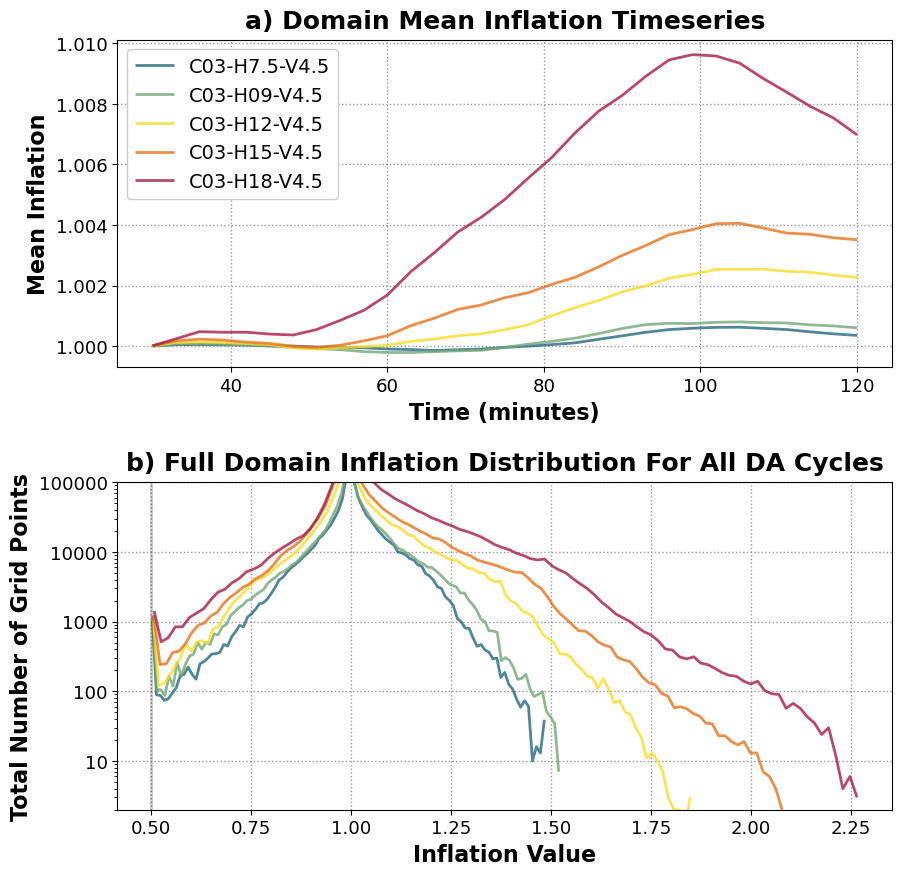

In [145]:
def plot_distribution(ax, var, **kwargs):
    hist, bins = np.histogram(var, bins=100)
    bins = (bins[1:]+bins[:-1])/2.0
    ax.semilogy(bins, hist ,**kwargs)


version='Full'
exps = [f'C03_H{h:02d}_V4' for h in [7,9,12,15,18]]

colors=cmaps.pride(np.linspace(.2, .8, len(exps)))

fig, axes = plt.subplots(2,1,figsize=(10, 10))

for i, exp in enumerate(exps):
    print(exp)


    files = sorted(glob.glob(f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp}/Inflation*'))
    # time=[]
    # dist=[]
    # mean=[]
    # for f in files:
    #     time.append((dt.datetime.strptime(f.split('Inflation_')[1], '%Y-%m-%d_%H:%M:%S.nc') - dt.datetime(2024,5,8,19,30)).seconds)
    #     inf = xr.open_dataset(f)
    #     dist.extend(inf.inflation.values.flatten())
    #     mean.append(inf.inflation.mean().values)
    #     inf.close()

    ds = xr.open_mfdataset(files,combine="nested",concat_dim="time", preprocess=lambda ds: preprocess(ds, ds.encoding["source"]))

    plot_distribution(axes[1], ds.inflation.values.flatten(), label=rename(exp, version=version), color=colors[i], lw=2, alpha=0.8)
    axes[0].plot(ds.time, ds.inflation.mean(axis=(1,2,3)), label=rename(exp, version=version), color=colors[i], lw=2, alpha=0.8)


    # if (exp == 'C03_H18_V4') | (exp == 'C03_H09_V4'):

    #     print(exp[:-2]+"V6")
    #     files = sorted(glob.glob(f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp[:-2]+"V6"}/Inflation*'))
    #     time=[]
    #     dist=[]
    #     mean=[]
    #     for f in files:
    #         time.append((dt.datetime.strptime(f.split('Inflation_')[1], '%Y-%m-%d_%H:%M:%S.nc') - dt.datetime(2024,5,8,19,30)).seconds)
    #         inf = xr.open_dataset(f)
    #         dist.extend(inf.inflation.values.flatten())
    #         mean.append(inf.inflation.mean().values)
    #         inf.close()
    
    #     plot_distribution(axes[1], dist, label=rename(exp[:-2]+"V6", version=version), color=colors[i], lw=2, alpha=0.8, ls='--')
    #     axes[0].plot(np.array(time)/60, mean, label=rename(exp[:-2]+"V6", version=version), color=colors[i], lw=2, alpha=0.8, ls='--')
        

axes[0].set_xlabel('Time (minutes)', fontsize=16)
axes[0].set_ylabel('Mean Inflation', fontsize=16)
axes[0].set_title('a) Domain Mean Inflation Timeseries', weight='bold', fontsize=18, y=1.01)
axes[0].legend(fontsize=14, loc=2)

axes[1].yaxis.set_major_formatter(ticker.ScalarFormatter())
axes[1].set_xlabel('Inflation Value', fontsize=16)
axes[1].set_ylabel('Total Number of Grid Points', fontsize=16)
axes[1].set_title('b) Full Domain Inflation Distribution For All DA Cycles', weight='bold', fontsize=18, y=1.01)
axes[1].set_ylim(2, 100000)
axes[1].axvline(0.5, color='k', lw=2, alpha=0.2)

#axes[1].legend(fontsize=14)

for ax in axes:ax.grid()

plt.subplots_adjust(hspace=.35)


# FIGNAME = 'Inflation'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')

C15_H07_V4
C15_H09_V4
C15_H12_V4
C15_H15_V4
C15_H18_V4
C10_H07_V4
C10_H09_V4
C10_H12_V4
C10_H15_V4
C10_H18_V4
C03_H07_V4
C03_H09_V4
C03_H12_V4
C03_H15_V4
C03_H18_V4


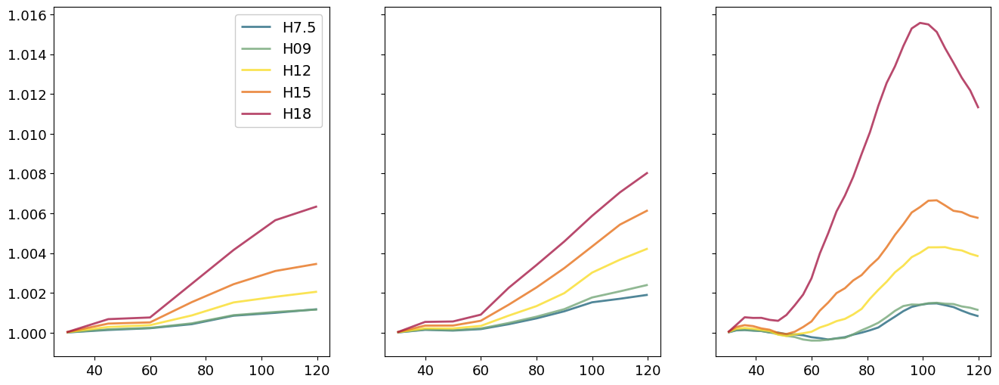

In [213]:
def plot_distribution(ax, var, **kwargs):
    hist, bins = np.histogram(var, bins=100)
    bins = (bins[1:]+bins[:-1])/2.0
    ax.semilogy(bins, hist ,**kwargs)


version='Full'
exps = [f'C03_H{h:02d}_V4' for h in [7,9,12,15,18]]



fig, axes = plt.subplots(1,3,figsize=(16, 6), sharex=True, sharey=True)


for ci, cint in enumerate([15, 10,3]):


    exps = [f'C{cint:02d}_H{h:02d}_V4' for h in [7,9,12,15,18]]
    colors=cmaps.pride(np.linspace(.2, .8, len(exps)))
    for i, exp in enumerate(exps):
        print(exp)
    
    
        files = sorted(glob.glob(f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp}/Inflation*'))
        # time=[]
        # dist=[]
        # mean=[]
        # for f in files:
        #     time.append((dt.datetime.strptime(f.split('Inflation_')[1], '%Y-%m-%d_%H:%M:%S.nc') - dt.datetime(2024,5,8,19,30)).seconds)
        #     inf = xr.open_dataset(f)
        #     dist.extend(inf.inflation.values.flatten())
        #     mean.append(inf.inflation.mean().values)
        #     inf.close()
    
        ds = xr.open_mfdataset(files,combine="nested",concat_dim="time", preprocess=lambda ds: preprocess(ds, ds.encoding["source"]))
    
        #plot_distribution(axes[1], ds.inflation.values.flatten(), label=rename(exp, version=version), color=colors[i], lw=2, alpha=0.8)
        inf = ds.inflation.values
        inf[inf==1.0] = np.nan
        axes[ci].plot(ds.time, np.nanmean(inf, axis=(1,2,3)), label=rename(exp, version='H').split('-')[-1], color=colors[i], lw=2, alpha=0.8)
    
    
        # if (exp == 'C03_H18_V4') | (exp == 'C03_H09_V4'):
    
        #     print(exp[:-2]+"V6")
        #     files = sorted(glob.glob(f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp[:-2]+"V6"}/Inflation*'))
        #     time=[]
        #     dist=[]
        #     mean=[]
        #     for f in files:
        #         time.append((dt.datetime.strptime(f.split('Inflation_')[1], '%Y-%m-%d_%H:%M:%S.nc') - dt.datetime(2024,5,8,19,30)).seconds)
        #         inf = xr.open_dataset(f)
        #         dist.extend(inf.inflation.values.flatten())
        #         mean.append(inf.inflation.mean().values)
        #         inf.close()
        
        #     plot_distribution(axes[1], dist, label=rename(exp[:-2]+"V6", version=version), color=colors[i], lw=2, alpha=0.8, ls='--')
        #     axes[0].plot(np.array(time)/60, mean, label=rename(exp[:-2]+"V6", version=version), color=colors[i], lw=2, alpha=0.8, ls='--')
            

# axes[0].set_xlabel('Time (minutes)', fontsize=16)
# axes[0].set_ylabel('Mean Inflation', fontsize=16)
# axes[0].set_title('a) Domain Mean Inflation Timeseries', weight='bold', fontsize=18, y=1.01)
# axes[0].legend(fontsize=14, loc=2)

# axes[1].yaxis.set_major_formatter(ticker.ScalarFormatter())
# axes[1].set_xlabel('Inflation Value', fontsize=16)
# axes[1].set_ylabel('Total Number of Grid Points', fontsize=16)
# axes[1].set_title('b) Full Domain Inflation Distribution For All DA Cycles', weight='bold', fontsize=18, y=1.01)
# axes[1].set_ylim(2, 100000)
# axes[1].axvline(0.5, color='k', lw=2, alpha=0.2)

# #axes[1].legend(fontsize=14)

# for ax in axes:ax.grid()

# plt.subplots_adjust(hspace=.35)

axes[0].legend(fontsize=14)


# FIGNAME = 'Inflation'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')

In [212]:
rename(exp, version='H').split('-')[-1]

'H18'